<a href="https://colab.research.google.com/github/cechdan2/GIT_OOP/blob/master/Projekt_I.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install numba
!pip install pvlib
!pip install openmeteo-requests
!pip install requests-cache retry-requests numpy pandas
!pip install apscheduler
!pip install statsmodels
!pip insatll cvxpy


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.3/19.3 MB 44.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 167.1/167.1 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 681.4/681.4 kB 28.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 145.8/145.8 kB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 394.1/394.1 kB 22.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 48.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.4/61.4 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.7/70.7 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.3/64.3 kB 2.8 MB/s eta 0:00:00
ERROR: unknown command "insatll" - maybe you meant "install"


In [ ]:


# data se kterými v tomto notebooku pracuju: https://data.open-power-system-data.org/time_series/2020-10-06/time_series_60min_singleindex.csv

import pandas as pd
import numpy as np
from pvlib import location, pvsystem, modelchain, temperature
import matplotlib.pyplot as plt
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from sklearn.preprocessing import StandardScaler
# Praha
latitude, longitude = 50.0755, 14.4378
tz = 'Europe/Prague'
site = location.Location(latitude, longitude, tz=tz, altitude=200, name='Prague')

# časovvy rozsah
start_date = '2024-01-01'
end_date = '2025-01-01'
times = pd.date_range(start=start_date, end=end_date, freq='2h', tz=tz)

# první dostupny panel a menic pro jednoduchost
sam_data = pvsystem.retrieve_sam('CECMod')
module_name = sam_data.columns[0]
module = sam_data[module_name]
inverter_data = pvsystem.retrieve_sam('cecinverter')
inverter_name = inverter_data.columns[0]
inverter = inverter_data[inverter_name]

# teplotní model
temp_model = temperature.TEMPERATURE_MODEL_PARAMETERS['sapm']['open_rack_glass_glass']

# nastaveni systemu (35° jako u doc. Novaka a 180° taky)
system = pvsystem.PVSystem(
    surface_tilt=35,
    surface_azimuth=180,
    module_parameters=module,
    inverter_parameters=inverter,
    temperature_model_parameters=temp_model
)

# Přidání AOI modelu (řešení chyby)
mc = modelchain.ModelChain(system, site, aoi_model="no_loss")

#  Počasí a simulace
weather = site.get_clearsky(times)  # Simulace jasné oblohy
mc.run_model(weather)

# Denní výroba energie
energy_produced = mc.results.ac.resample('D').sum().fillna(0)  # Denní součet, odstranění NaN

# Příprava dat pro predikovani
df = pd.DataFrame({'date': energy_produced.index, 'energy_produced': energy_produced.values})
df['day_of_year'] = df['date'].dt.dayofyear
df['year'] = df['date'].dt.year

X = df[['day_of_year']].values
y = df['energy_produced'].values

# normalizovani vstupních dat
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

#  Trénink SVM modelu
svm_model = SVR(kernel='rbf', C=100, gamma=0.1)
svm_model.fit(X_scaled, y)

#  Trénink Random Forest modelu
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X, y)

#  Trénink XGBoost modelu
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42)
xgb_model.fit(X, y)

#  Predikce na rok 2025
future_days = np.arange(1, 366).reshape(-1, 1)
future_days_scaled = scaler.transform(future_days)
future_energy_svm = svm_model.predict(future_days_scaled)

# Predikce pro Random Forest
future_energy_rf = rf_model.predict(future_days)

# Predikce pro XGBoost
future_energy_xgb = xgb_model.predict(future_days)

# Vytvoření časového indexu pro predikovaná data (1.1.2025 - 31.12.2025)
future_dates = pd.date_range(start='2019-01-01', end='2020-01-01', freq='D')[:-1]

#  Vykreslení výsledků
plt.figure(figsize=(12, 6))
plt.plot(df['date'], df['energy_produced'], label="Skutečná výroba (2024)", color='blue')
plt.plot(future_dates, future_energy_svm, label="Predikovaná výroba (SVM, 2025)", linestyle="dashed", color='red')
plt.plot(future_dates, future_energy_rf, label="Predikovaná výroba (Random Forest, 2025)", linestyle="dotted", color='green')
plt.plot(future_dates, future_energy_xgb, label="Predikovaná výroba (XGBoost, 2025)", linestyle="dashdot", color='purple')
plt.xlabel("Datum")
plt.ylabel("Vyrobená energie [kWh]")
plt.legend()
plt.grid()
plt.show()


#  nejake rozbite - OPRAVIT

ModuleNotFoundError: No module named 'pvlib'

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
import pvlib
from pvlib import location, pvsystem, temperature, modelchain

# Načtení CSV souboru s datama
file_path = 'data_od_strejdy_vse.csv'
df = pd.read_csv(file_path)

# jen sloupecky 'Aktualizovany_cas' a 'Vyroba-dnes(kWh)'
df_filtered = df[['Aktualizovany_cas', 'Vyroba-dnes(kWh)']]

# Převedení sloupce 'Aktualizovany_cas' na datetime typ pomocí .loc
df_filtered.loc[:, 'Aktualizovany_cas'] = pd.to_datetime(df_filtered['Aktualizovany_cas'])

# Nastavení 'Aktualizovany_cas' jako index
df_filtered.set_index('Aktualizovany_cas', inplace=True)

# Resampling a agregace na denní úroveň
daily_data = df_filtered.resample('D').sum().fillna(0)
# Příprava dat pro predikci
df = pd.DataFrame({'date': daily_data.index, 'energy_produced': daily_data['Vyroba-dnes(kWh)']})
df['day_of_year'] = df['date'].dt.dayofyear
df['year'] = df['date'].dt.year

X = df[['day_of_year']].values
y = df['Vyroba-dnes(kWh)'].values
# Normalizace vstupních dat
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Trénink SVM modelu
svm_model = SVR(kernel='rbf', C=100, gamma=1)
svm_model.fit(X_scaled, y)

# Trénink Random Forest modelu
rf_model = RandomForestRegressor(n_estimators=1000, random_state=42)
rf_model.fit(X, y)

# Trénink XGBoost modelu
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42)
xgb_model.fit(X, y)

# Zjištění posledního dne ve skutečných datech
last_real_day = daily_data.index[-1]

# Predikce pro období od následujícího dne po posledním dni skutečných dat
future_days = np.arange(1, 366).reshape(-1, 1)  # Předpověď na jeden rok (365 dní)
future_days_scaled = scaler.transform(future_days)
future_energy_svm = svm_model.predict(future_days_scaled)

# Predikce pro Random Forest
future_energy_rf = rf_model.predict(future_days)

# Predikce pro XGBoost
future_energy_xgb = xgb_model.predict(future_days)

# Vytvoření časového indexu pro predikovaná data ktera zacinaji kdyz konci ty z datasetu
future_dates = pd.date_range(start=last_real_day + pd.Timedelta(days=1), periods=365, freq='D', tz='UTC')

#Praha pro PVlib
latitude, longitude = 50.0755, 14.4378
tz = 'Europe/Prague'
site = location.Location(latitude, longitude, tz=tz, altitude=200, name='Prague')

# Parametry solárního panelu (tohle mi napsal chatgpt)
module_parameters = {
    'Name': 'SolarModule',
    'BIPV': 'N',
    'Date': '10/5/2017',
    'T_NOCT': 45,
    'A_c': 1.7,
    'N_s': 60,
    'I_sc_ref': 9.5,
    'V_oc_ref': 38.0,
    'I_mp_ref': 9.0,
    'V_mp_ref': 31.0,
    'alpha_sc': 0.0045,
    'beta_oc': -0.2,
    'a_ref': 1.5,
    'I_L_ref': 9.5,
    'I_o_ref': 1e-10,
    'R_s': 0.5,
    'R_sh_ref': 2000,
    'Adjust': 8,
    'gamma_r': -0.004,
    'Version': 'SAM 2017.9.5',
    'P_co': 300,
    'Voco': 38.0,
    'Bvoco': -0.2,
    'Mbvoc': 0.05,
    'Cells_in_Series': 60,
    'Isco': 9.5,
    'Aisc': 0.0045,
    'C0': 1.0,
    'C1': 1.0,
    'C2': 1.0,
    'C3': 1.0,
    'C4': 1.0,
    'C5': 1.0,
    'C6': 1.0,
    'C7': 1.0,
    'Impo': 9.0,
    'Aimp': 1.0,
    'Bvmpo': -0.2,
    'Mbvmp': 1.0,
    'Vmpo': 31.0,
    'IXO': 0.0,
    'IXO': 0.0,
    'IXXO': 0.0,
    'N': 1.0
}

# Parametry teplotního modelu
temperature_model_parameters = temperature.TEMPERATURE_MODEL_PARAMETERS['sapm']['open_rack_glass_glass']

# Parametry měniče (inverter) (taky od chatu)
inverter_parameters = {
    'Paco': 5000,
    'Pdco': 5500,
    'Vdco': 480,
    'Pso': 20,
    'C0': 0.0002,
    'C1': 0.00002,
    'C2': 0.000003,
    'C3': 0,
    'Pnt': 0
}

# Definice PV systému
system = pvsystem.PVSystem(
    module_parameters=module_parameters,
    temperature_model_parameters=temperature_model_parameters,
    inverter_parameters=inverter_parameters,
    modules_per_string=100,  # Počet panelů na string
    strings_per_inverter=100,  # Počet stringů
    racking_model='open_rack',  # Racking model
    module_type='glass_polymer'  # Module type
)

# Inicializace ModelChain
mc = modelchain.ModelChain(system, site, dc_model='sapm', aoi_model="no_loss")

# Počasí a simulace pro PVlib (jasná obloha)
weather = site.get_clearsky(future_dates)  # pro jednoduchost simulace s jasnou oblohou

# Spuštění modelu s jasnou oblohou
mc.run_model(weather)

# Denní výroba energie z PVlib
energy_produced_pvlib = mc.results.ac.resample('D').sum().fillna(0)  # Denní součet, odstranění NaN

# Vykreslení výsledků
plt.figure(figsize=(12, 6))
plt.plot(df['date'], df['energy_produced'], label="Skutečná výroba", color='blue')
#plt.plot(future_dates, future_energy_svm, label="Predikovaná výroba (SVM)", linestyle="dashed", color='red')
#plt.plot(future_dates, future_energy_rf, label="Predikovaná výroba (Random Forest)", linestyle="solid", color='green')
plt.plot(future_dates, future_energy_xgb, label="Predikovaná výroba (XGBoost)", linestyle="solid", color='purple')
#plt.plot(energy_produced_pvlib.index, energy_produced_pvlib.values, label="Predikovaná výroba (PVlib)", linestyle="solid", color='orange')
plt.xlabel("Datum")
plt.ylabel("Vyrobená energie [kWh]")
plt.legend()
plt.grid()
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: 'data_od_strejdy_vse.csv'

/usr/local/lib/python3.11/dist-packages/pandas/core/indexes/base.py:7588: FutureWarning: Dtype inference on a pandas object (Series, Index, ExtensionArray) is deprecated. The Index constructor will keep the original dtype in the future. Call `infer_objects` on the result to get the old behavior.
  return Index(sequences[0], name=names)
<ipython-input-8-c8266db297f4>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered.loc[:, 'hour'] = df_filtered.index.hour
<ipython-input-8-c8266db297f4>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexin

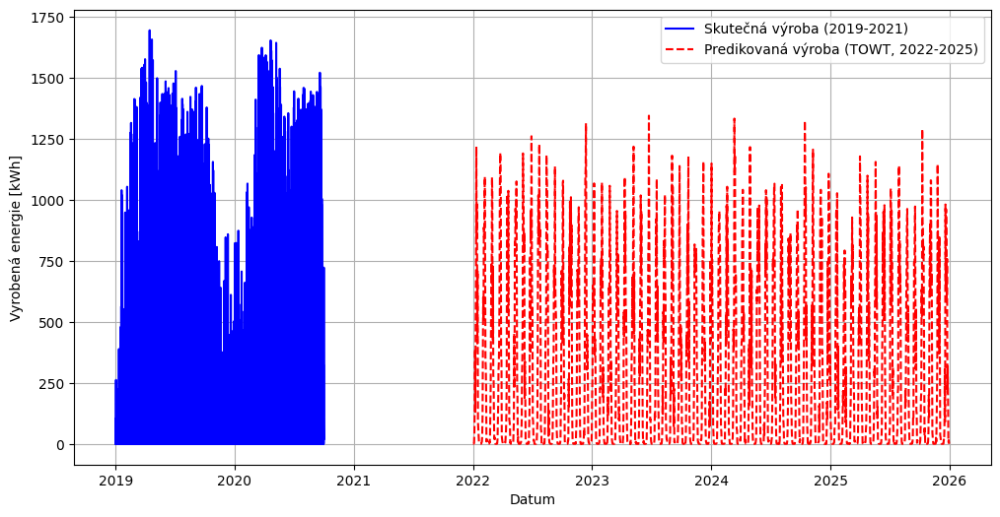

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Načtení dat
file_path = 'time_series_60min_singleindex.csv'
df = pd.read_csv(file_path)

# Vybrání sloupců 'utc_timestamp' a 'CZ_solar_generation_actual'
df_filtered = df[['utc_timestamp', 'CZ_solar_generation_actual']]

# Převedení sloupce 'utc_timestamp' na datetime typ
df_filtered.loc[:, 'utc_timestamp'] = pd.to_datetime(df_filtered['utc_timestamp'])

# Nastavení 'utc_timestamp' jako index
df_filtered.set_index('utc_timestamp', inplace=True)

# Filtrace dat mezi roky 2019 a 2021
df_filtered = df_filtered[(df_filtered.index.year >= 2019) & (df_filtered.index.year <= 2021)]

# Přidání sloupce 'hour' (hodina dne)
df_filtered.loc[:, 'hour'] = df_filtered.index.hour

# Přidání sloupce 'day_of_week' (den v týdnu)
df_filtered.loc[:, 'day_of_week'] = df_filtered.index.dayofweek

# Získání teplotních dat
df_filtered.loc[:, 'temperature'] = np.random.normal(loc=15, scale=5, size=len(df_filtered))  # Simulace teploty

# Odstranění řádků s chybějícími hodnotami (NaN)
df_filtered = df_filtered.dropna()

# Příprava dat pro predikci
X = df_filtered[['hour', 'day_of_week', 'temperature']].values
y = df_filtered['CZ_solar_generation_actual'].values

# Normalizace vstupních dat
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Trénink modelu
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_scaled, y)

# Predikce pro období 2022-2025
future_dates = pd.date_range(start='2022-01-01', end='2025-12-31', freq='D')

# Vytvoření simulovaných vstupních hodnot pro predikci (hodiny, dny v týdnu, teplota)
future_data = {
    'hour': [i % 24 for i in range(len(future_dates))],  # Hodiny (cyklicky)
    'day_of_week': [i % 7 for i in range(len(future_dates))],  # Dny v týdnu
    'temperature': np.random.normal(loc=15, scale=5, size=len(future_dates))  # Simulace teploty
}

# Příprava vstupních dat pro predikci
X_future = pd.DataFrame(future_data)
X_future_scaled = scaler.transform(X_future)

# Predikce výroby
future_energy_pred = model.predict(X_future_scaled)

# Vytvoření časového indexu pro predikovaná data
future_dates_index = pd.date_range(start='2022-01-01', end='2025-12-31', freq='D')

# Vykreslení výsledků
plt.figure(figsize=(12, 6))
plt.plot(df_filtered.index, df_filtered['CZ_solar_generation_actual'], label="Skutečná výroba (2019-2021)", color='blue')
plt.plot(future_dates_index, future_energy_pred, label="Predikovaná výroba (TOWT, 2022-2025)", linestyle="dashed", color='red')
plt.xlabel("Datum")
plt.ylabel("Vyrobená energie [kWh]")
plt.legend()
plt.grid()
plt.show()


<ipython-input-10-3ca69d6e42f9>:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data['total_solar_production'] = scaler_production.fit_transform(train_data[['total_solar_production']])
<ipython-input-10-3ca69d6e42f9>:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_data['total_solar_production'] = scaler_production.transform(test_data[['total_solar_production']])
<ipython-input-10-3ca69d6e42f9>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try 

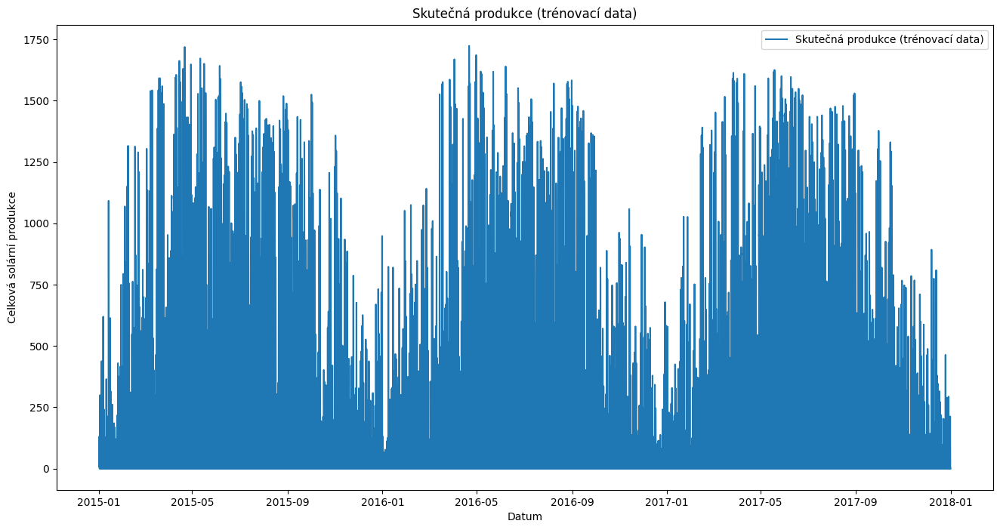

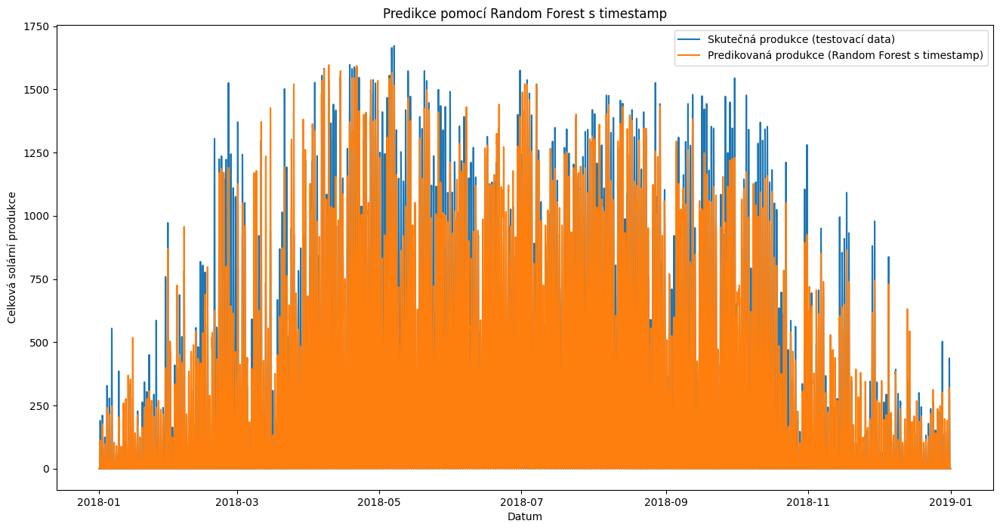

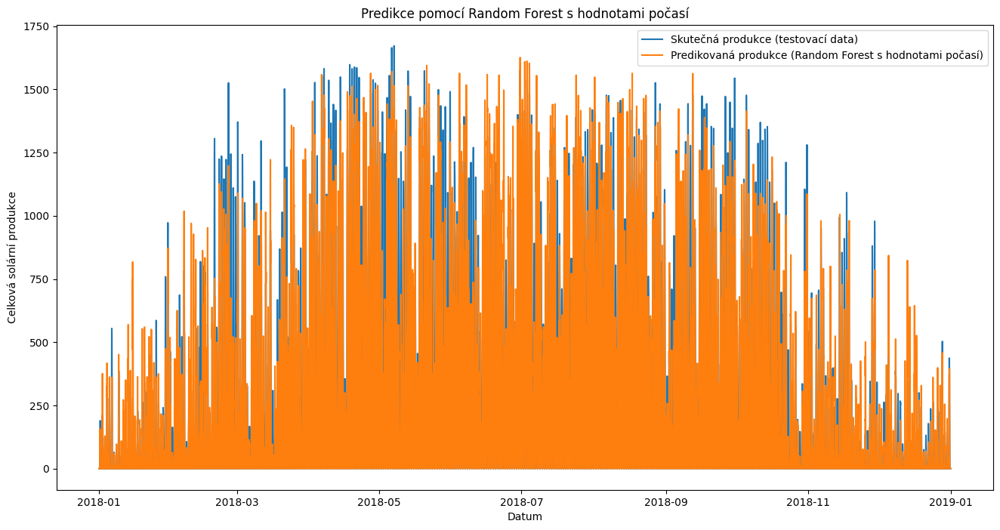

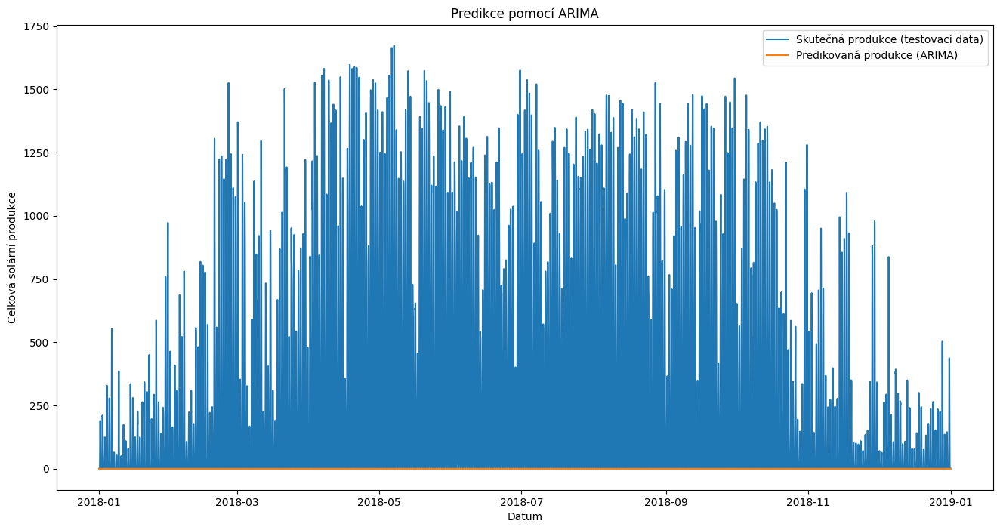

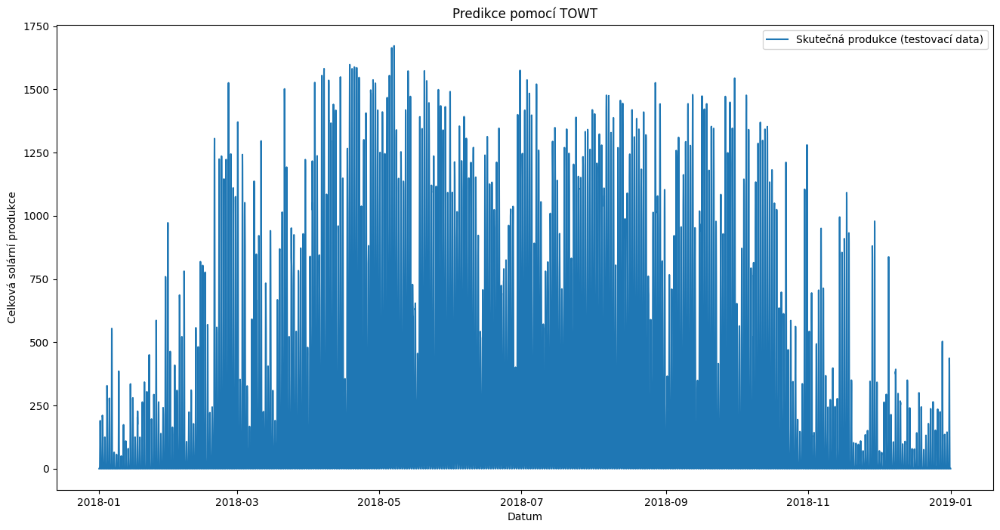

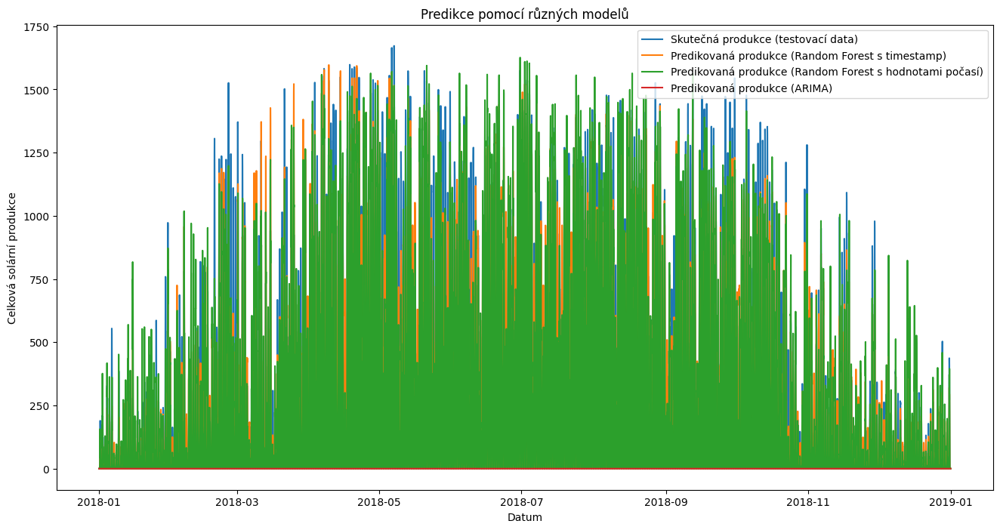

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA

# Načtení CSV souboru s datama
file_path = 'time_series_60min_singleindex.csv'
df = pd.read_csv(file_path)

# Načtení CSV souboru s počasím
file_path = 'weather_data.csv'
dw = pd.read_csv(file_path)

# jen sloupecky 'utc_timestamp' a 'CZ_solar_generation_actual'
df_filtered = df.loc[:, ['utc_timestamp', 'CZ_solar_generation_actual']]

# jen sloupecky 'utc_timestamp' a 'CZ_radiation_direct_horizontal'
dw_filtered = dw.loc[:, ['utc_timestamp', 'CZ_radiation_direct_horizontal']]

# Konvertování 'utc_timestamp' na datetime
df_filtered['utc_timestamp'] = pd.to_datetime(df_filtered['utc_timestamp'], errors='coerce')
dw_filtered['utc_timestamp'] = pd.to_datetime(dw_filtered['utc_timestamp'], errors='coerce')

# Filtrace dat od roku 2014 do roku 2018
df_filtered = df_filtered[(df_filtered['utc_timestamp'].dt.year >= 2014) & (df_filtered['utc_timestamp'].dt.year <= 2018)]
dw_filtered = dw_filtered[(dw_filtered['utc_timestamp'].dt.year >= 2014) & (dw_filtered['utc_timestamp'].dt.year <= 2018)]

# Sloučení datových rámců na základě 'utc_timestamp'
data = pd.merge(df_filtered, dw_filtered, on='utc_timestamp')

# Přejmenování sloupců pro konzistenci
data.rename(columns={'utc_timestamp': 'timestamp',
                     'CZ_solar_generation_actual': 'total_solar_production',
                     'CZ_radiation_direct_horizontal': 'weather_forecast'}, inplace=True)

# Zkontrolujte, zda po filtraci zůstala nějaká data
if data.empty:
    raise ValueError("Žádná data nebyla nalezena po filtraci od roku 2014 do roku 2018.")

# Zkontrolujte na NaN hodnoty
if data.isnull().sum().sum() > 0:
    data = data.dropna()

# Předpokládáme, že data obsahují sloupce 'timestamp', 'total_solar_production', 'weather_forecast'
data['year'] = data['timestamp'].dt.year
data['month'] = data['timestamp'].dt.month
data['day'] = data['timestamp'].dt.day
data['hour'] = data['timestamp'].dt.hour
data['weekday'] = data['timestamp'].dt.weekday

# Rozdělení dat na trénovací (2014-2017) a testovací (2018) sady
train_data = data[(data['year'] >= 2014) & (data['year'] <= 2017)]
test_data = data[data['year'] == 2018]

# Normalizace dat
scaler_production = MinMaxScaler(feature_range=(0, 1))
train_data['total_solar_production'] = scaler_production.fit_transform(train_data[['total_solar_production']])
test_data['total_solar_production'] = scaler_production.transform(test_data[['total_solar_production']])

scaler_weather = MinMaxScaler(feature_range=(0, 1))
train_data['weather_forecast'] = scaler_weather.fit_transform(train_data[['weather_forecast']])
test_data['weather_forecast'] = scaler_weather.transform(test_data[['weather_forecast']])

# Příprava vstupů a výstupů pro dataset s timestamp
X_train_time = train_data[['weather_forecast', 'year', 'month', 'day', 'hour', 'weekday']].values
y_train = train_data['total_solar_production'].values

X_test_time = test_data[['weather_forecast', 'year', 'month', 'day', 'hour', 'weekday']].values
y_test = test_data['total_solar_production'].values

# Příprava vstupů a výstupů pro dataset pouze s hodnotami počasí
X_train_weather = train_data[['weather_forecast']].values
X_test_weather = test_data[['weather_forecast']].values

# Vytvoření modelu Random Forest pro dataset s timestamp
rf_model_time = RandomForestRegressor(n_estimators=1000, random_state=42)
# Trénování modelu Random Forest pro dataset s timestamp
rf_model_time.fit(X_train_time, y_train)
# Predikce pomocí modelu Random Forest pro dataset s timestamp
rf_predictions_time = rf_model_time.predict(X_test_time)
rf_predictions_time = scaler_production.inverse_transform(rf_predictions_time.reshape(-1, 1))

# Vytvoření modelu Random Forest pro dataset pouze s hodnotami počasí
rf_model_weather = RandomForestRegressor(n_estimators=1000, random_state=42)
# Trénování modelu Random Forest pro dataset pouze s hodnotami počasí
rf_model_weather.fit(X_train_weather, y_train)
# Predikce pomocí modelu Random Forest pro dataset pouze s hodnotami počasí
rf_predictions_weather = rf_model_weather.predict(X_test_weather)
rf_predictions_weather = scaler_production.inverse_transform(rf_predictions_weather.reshape(-1, 1))

# Oprava a trénování modelu ARIMA
arima_model = ARIMA(train_data['total_solar_production'].values, order=(5, 1, 0))
arima_model_fit = arima_model.fit()
arima_predictions = arima_model_fit.forecast(steps=len(test_data))
arima_predictions = scaler_production.inverse_transform(arima_predictions.reshape(-1, 1))

# Implementace TOWT
#class TOWT:
  #  def __init__(self):
  #      self.model = None

  #  def fit(self, X, y):
        # Create dummy variables for weekdays and hours
   #     X = pd.get_dummies(X, columns=['weekday', 'hour'], drop_first=True)
  #      self.model = LinearRegression().fit(X, y)

   # def predict(self, X):
   #     X = pd.get_dummies(X, columns=['weekday', 'hour'], drop_first=True)
   ##     return self.model.predict(X)

# Příprava vstupů a výstupů pro TOWT
#X_train_towt = train_data[['weather_forecast', 'hour', 'weekday']].values
###X_test_towt = test_data[['weather_forecast', 'hour', 'weekday']].values

# Vytvoření modelu TOWT
#towt_model = TOWT()
# Trénování modelu TOWT
#towt_model.fit(pd.DataFrame(X_train_towt, columns=['weather_forecast', 'hour', 'weekday']), y_train)
# Predikce pomocí modelu TOWT
###towt_predictions = towt_model.predict(pd.DataFrame(X_test_towt, columns=['weather_forecast', 'hour', 'weekday']))
#towt_predictions = scaler_production.inverse_transform(towt_predictions.reshape(-1, 1))

# Plotting training data
plt.figure(figsize=(16,8))
plt.plot(train_data['timestamp'], scaler_production.inverse_transform(y_train.reshape(-1, 1)), label='Skutečná produkce (trénovací data)')
plt.xlabel('Datum')
plt.ylabel('Celková solární produkce')
plt.legend()
plt.title('Skutečná produkce (trénovací data)')
plt.show()

# Plotting test data and predictions (Random Forest with timestamp)
plt.figure(figsize=(16,8))
plt.plot(test_data['timestamp'], scaler_production.inverse_transform(y_test.reshape(-1, 1)), label='Skutečná produkce (testovací data)')
plt.plot(test_data['timestamp'], rf_predictions_time, label='Predikovaná produkce (Random Forest s timestamp)')
plt.xlabel('Datum')
plt.ylabel('Celková solární produkce')
plt.legend()
plt.title('Predikce pomocí Random Forest s timestamp')
plt.show()

# Plotting test data and predictions (Random Forest with weather only)
plt.figure(figsize=(16,8))
plt.plot(test_data['timestamp'], scaler_production.inverse_transform(y_test.reshape(-1, 1)), label='Skutečná produkce (testovací data)')
plt.plot(test_data['timestamp'], rf_predictions_weather, label='Predikovaná produkce (Random Forest s hodnotami počasí)')
plt.xlabel('Datum')
plt.ylabel('Celková solární produkce')
plt.legend()
plt.title('Predikce pomocí Random Forest s hodnotami počasí')
plt.show()

# Plotting test data and predictions (ARIMA)
plt.figure(figsize=(16,8))
plt.plot(test_data['timestamp'], scaler_production.inverse_transform(y_test.reshape(-1, 1)), label='Skutečná produkce (testovací data)')
plt.plot(test_data['timestamp'], arima_predictions, label='Predikovaná produkce (ARIMA)')
plt.xlabel('Datum')
plt.ylabel('Celková solární produkce')
plt.legend()
plt.title('Predikce pomocí ARIMA')
plt.show()

# Plotting test data and predictions (TOWT)
plt.figure(figsize=(16,8))
plt.plot(test_data['timestamp'], scaler_production.inverse_transform(y_test.reshape(-1, 1)), label='Skutečná produkce (testovací data)')
#plt.plot(test_data['timestamp'], towt_predictions, label='Predikovaná produkce (TOWT)')
plt.xlabel('Datum')
plt.ylabel('Celková solární produkce')
plt.legend()
plt.title('Predikce pomocí TOWT')
plt.show()

# Plotting all predictions together
plt.figure(figsize=(16,8))
plt.plot(test_data['timestamp'], scaler_production.inverse_transform(y_test.reshape(-1, 1)), label='Skutečná produkce (testovací data)')
plt.plot(test_data['timestamp'], rf_predictions_time, label='Predikovaná produkce (Random Forest s timestamp)')
plt.plot(test_data['timestamp'], rf_predictions_weather, label='Predikovaná produkce (Random Forest s hodnotami počasí)')
plt.plot(test_data['timestamp'], arima_predictions, label='Predikovaná produkce (ARIMA)')
#plt.plot(test_data['timestamp'], towt_predictions, label='Predikovaná produkce (TOWT)')
plt.xlabel('Datum')
plt.ylabel('Celková solární produkce')
plt.legend()
plt.title('Predikce pomocí různých modelů')
plt.show()

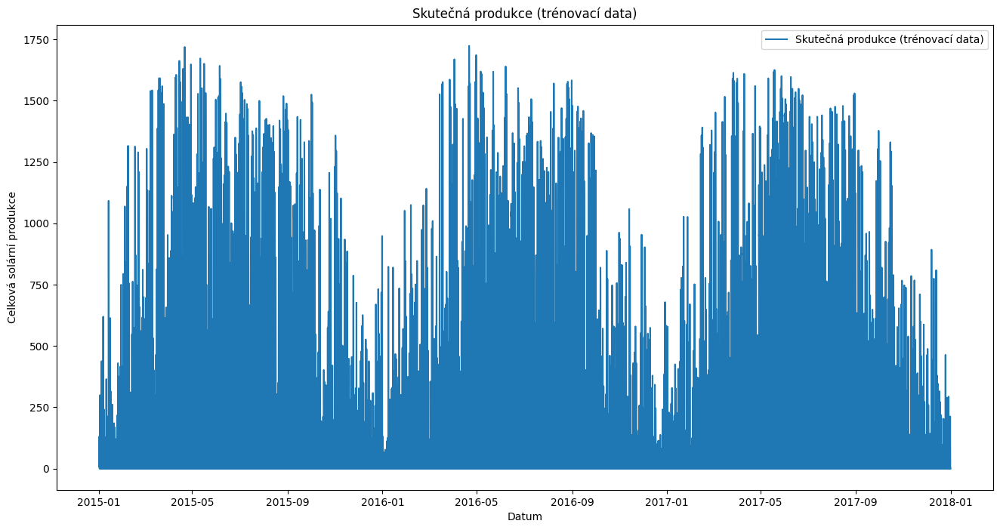

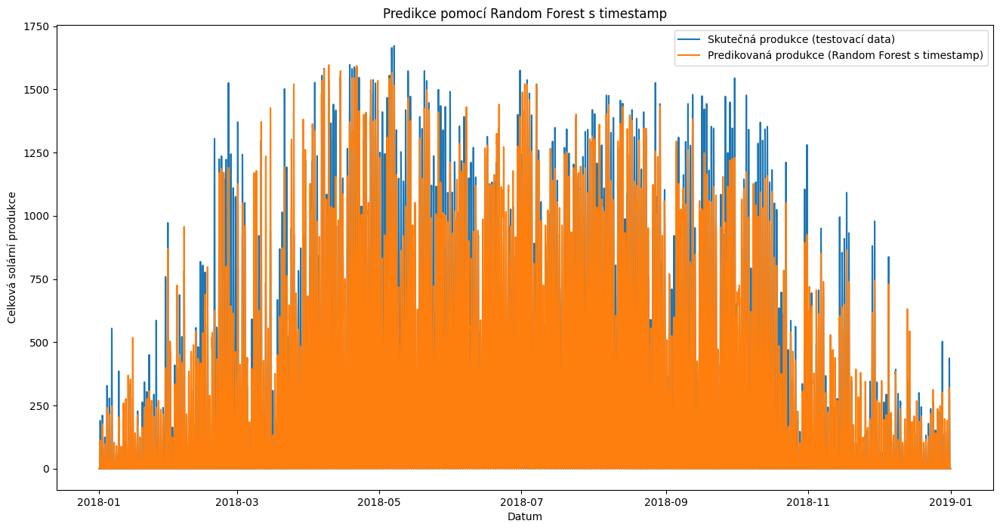

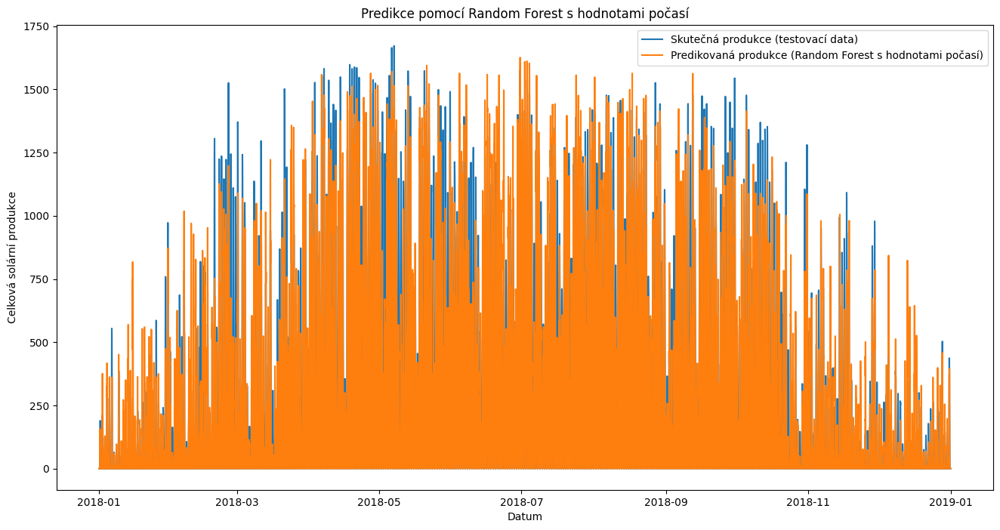

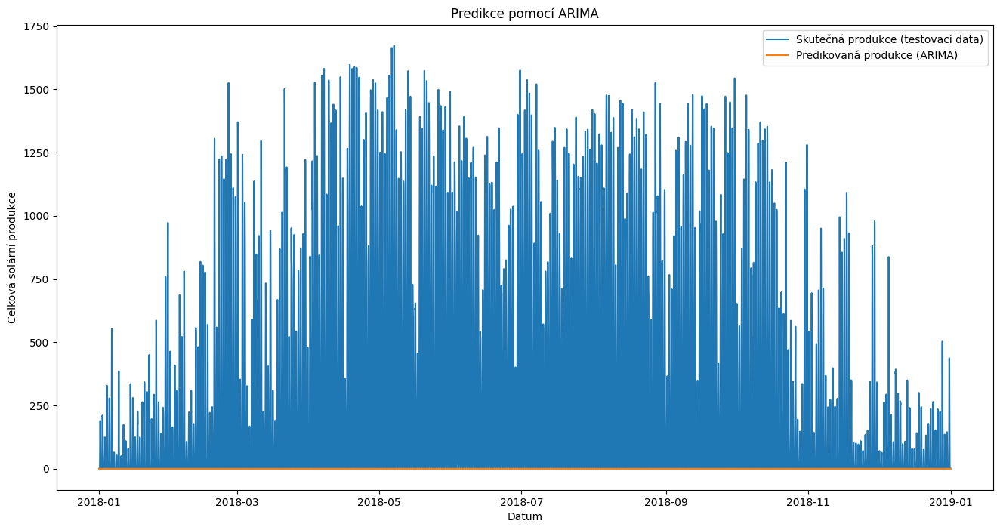

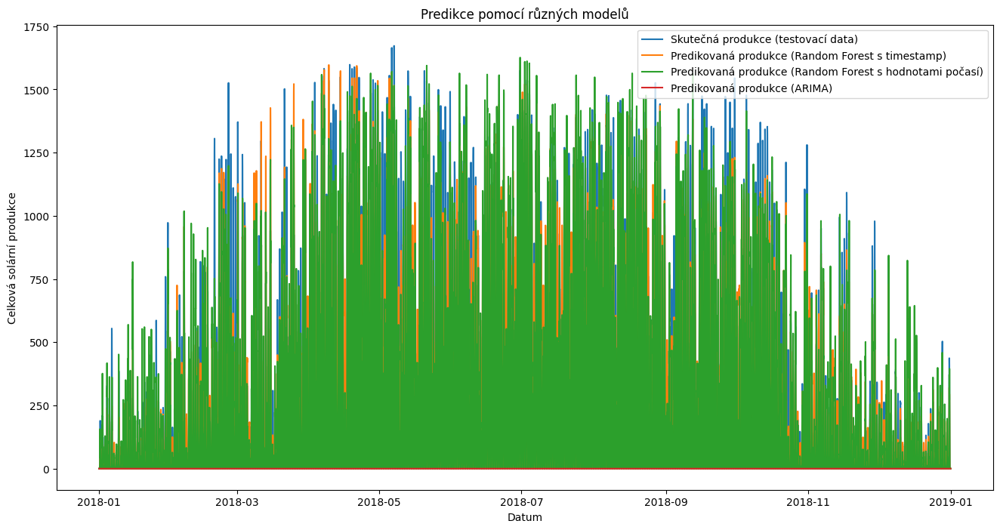

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA

# Načtení CSV souboru s datama
file_path = 'time_series_60min_singleindex.csv'
df = pd.read_csv(file_path)

# Načtení CSV souboru s počasím
file_path = 'weather_data.csv'
dw = pd.read_csv(file_path)

# jen sloupecky 'utc_timestamp' a 'CZ_solar_generation_actual'
df_filtered = df.loc[:, ['utc_timestamp', 'CZ_solar_generation_actual']]

# jen sloupecky 'utc_timestamp' a 'CZ_radiation_direct_horizontal'
dw_filtered = dw.loc[:, ['utc_timestamp', 'CZ_radiation_direct_horizontal']]

# Konvertování 'utc_timestamp' na datetime
df_filtered['utc_timestamp'] = pd.to_datetime(df_filtered['utc_timestamp'], errors='coerce')
dw_filtered['utc_timestamp'] = pd.to_datetime(dw_filtered['utc_timestamp'], errors='coerce')

# Filtrace dat od roku 2014 do roku 2018
df_filtered = df_filtered[(df_filtered['utc_timestamp'].dt.year >= 2014) & (df_filtered['utc_timestamp'].dt.year <= 2018)]
dw_filtered = dw_filtered[(dw_filtered['utc_timestamp'].dt.year >= 2014) & (dw_filtered['utc_timestamp'].dt.year <= 2018)]

# Sloučení datových rámců na základě 'utc_timestamp'
data = pd.merge(df_filtered, dw_filtered, on='utc_timestamp')

# Přejmenování sloupců pro konzistenci
data.rename(columns={'utc_timestamp': 'timestamp',
                     'CZ_solar_generation_actual': 'total_solar_production',
                     'CZ_radiation_direct_horizontal': 'weather_forecast'}, inplace=True)

# Zkontrolujte, zda po filtraci zůstala nějaká data
if data.empty:
    raise ValueError("Žádná data nebyla nalezena po filtraci od roku 2014 do roku 2018.")

# Zkontrolujte na NaN hodnoty
if data.isnull().sum().sum() > 0:
    data = data.dropna()

# Předpokládáme, že data obsahují sloupce 'timestamp', 'total_solar_production', 'weather_forecast'
data['year'] = data['timestamp'].dt.year
data['month'] = data['timestamp'].dt.month
data['day'] = data['timestamp'].dt.day
data['hour'] = data['timestamp'].dt.hour
data['weekday'] = data['timestamp'].dt.weekday

# Rozdělení dat na trénovací (2014-2017) a testovací (2018) sady
train_data = data[(data['year'] >= 2014) & (data['year'] <= 2017)].copy()
test_data = data[data['year'] == 2018].copy()

# Uložení původních hodnot pro ARIMA
y_train_arima = train_data['total_solar_production'].values
y_test_arima = test_data['total_solar_production'].values

# Normalizace dat pro ostatní modely
scaler_production = MinMaxScaler(feature_range=(0, 1))
train_data['total_solar_production'] = scaler_production.fit_transform(train_data[['total_solar_production']])
test_data['total_solar_production'] = scaler_production.transform(test_data[['total_solar_production']])

scaler_weather = MinMaxScaler(feature_range=(0, 1))
train_data['weather_forecast'] = scaler_weather.fit_transform(train_data[['weather_forecast']])
test_data['weather_forecast'] = scaler_weather.transform(test_data[['weather_forecast']])

# Příprava vstupů a výstupů pro dataset s timestamp
X_train_time = train_data[['weather_forecast', 'year', 'month', 'day', 'hour', 'weekday']].values
y_train = train_data['total_solar_production'].values

X_test_time = test_data[['weather_forecast', 'year', 'month', 'day', 'hour', 'weekday']].values
y_test = test_data['total_solar_production'].values

# Příprava vstupů a výstupů pro dataset pouze s hodnotami počasí
X_train_weather = train_data[['weather_forecast']].values
X_test_weather = test_data[['weather_forecast']].values

# Vytvoření modelu Random Forest pro dataset s timestamp
rf_model_time = RandomForestRegressor(n_estimators=1000, random_state=42)
rf_model_time.fit(X_train_time, y_train)
rf_predictions_time = rf_model_time.predict(X_test_time)
rf_predictions_time = scaler_production.inverse_transform(rf_predictions_time.reshape(-1, 1))

# Vytvoření modelu Random Forest pro dataset pouze s hodnotami počasí
rf_model_weather = RandomForestRegressor(n_estimators=1000, random_state=42)
rf_model_weather.fit(X_train_weather, y_train)
rf_predictions_weather = rf_model_weather.predict(X_test_weather)
rf_predictions_weather = scaler_production.inverse_transform(rf_predictions_weather.reshape(-1, 1))

# Oprava a trénování modelu ARIMA na původních datech
arima_model = ARIMA(y_train_arima, order=(5, 1, 0))
arima_model_fit = arima_model.fit()
arima_predictions = arima_model_fit.forecast(steps=len(y_test_arima))

# Plotting training data (na původních datech)
plt.figure(figsize=(16,8))
plt.plot(train_data['timestamp'], y_train_arima, label='Skutečná produkce (trénovací data)')
plt.xlabel('Datum')
plt.ylabel('Celková solární produkce')
plt.legend()
plt.title('Skutečná produkce (trénovací data)')
plt.show()

# Plotting test data and predictions (Random Forest with timestamp)
plt.figure(figsize=(16,8))
plt.plot(test_data['timestamp'], scaler_production.inverse_transform(y_test.reshape(-1, 1)), label='Skutečná produkce (testovací data)')
plt.plot(test_data['timestamp'], rf_predictions_time, label='Predikovaná produkce (Random Forest s timestamp)')
plt.xlabel('Datum')
plt.ylabel('Celková solární produkce')
plt.legend()
plt.title('Predikce pomocí Random Forest s timestamp')
plt.show()

# Plotting test data and predictions (Random Forest with weather only)
plt.figure(figsize=(16,8))
plt.plot(test_data['timestamp'], scaler_production.inverse_transform(y_test.reshape(-1, 1)), label='Skutečná produkce (testovací data)')
plt.plot(test_data['timestamp'], rf_predictions_weather, label='Predikovaná produkce (Random Forest s hodnotami počasí)')
plt.xlabel('Datum')
plt.ylabel('Celková solární produkce')
plt.legend()
plt.title('Predikce pomocí Random Forest s hodnotami počasí')
plt.show()

# Plotting test data and predictions (ARIMA – nenaškálovaná data!)
plt.figure(figsize=(16,8))
plt.plot(test_data['timestamp'], y_test_arima, label='Skutečná produkce (testovací data)')
plt.plot(test_data['timestamp'], arima_predictions, label='Predikovaná produkce (ARIMA)')
plt.xlabel('Datum')
plt.ylabel('Celková solární produkce')
plt.legend()
plt.title('Predikce pomocí ARIMA')
plt.show()

# Plotting all predictions together (každá metoda zvlášť na své ose)
plt.figure(figsize=(16,8))
plt.plot(test_data['timestamp'], y_test_arima, label='Skutečná produkce (testovací data)')
plt.plot(test_data['timestamp'], rf_predictions_time, label='Predikovaná produkce (Random Forest s timestamp)')
plt.plot(test_data['timestamp'], rf_predictions_weather, label='Predikovaná produkce (Random Forest s hodnotami počasí)')
plt.plot(test_data['timestamp'], arima_predictions, label='Predikovaná produkce (ARIMA)')
plt.xlabel('Datum')
plt.ylabel('Celková solární produkce')
plt.legend()
plt.title('Predikce pomocí různých modelů')
plt.show()

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt

# Načtení CSV souboru s datama
file_path = 'time_series_60min_singleindex.csv'
df = pd.read_csv(file_path)

# Načtení CSV souboru s počasím
file_path = 'weather_data.csv'
dw = pd.read_csv(file_path)

# jen sloupecky 'utc_timestamp' a 'CZ_solar_generation_actual'
df_filtered = df.loc[:, ['utc_timestamp', 'CZ_solar_generation_actual']]

# jen sloupecky 'utc_timestamp' a 'CZ_radiation_direct_horizontal'
dw_filtered = dw.loc[:, ['utc_timestamp', 'CZ_radiation_direct_horizontal']]

# Konvertování 'utc_timestamp' na datetime
df_filtered['utc_timestamp'] = pd.to_datetime(df_filtered['utc_timestamp'], errors='coerce')
dw_filtered['utc_timestamp'] = pd.to_datetime(dw_filtered['utc_timestamp'], errors='coerce')

# Filtrace dat od roku 2014 do roku 2018
df_filtered = df_filtered[(df_filtered['utc_timestamp'].dt.year >= 2014) & (df_filtered['utc_timestamp'].dt.year <= 2018)]
dw_filtered = dw_filtered[(dw_filtered['utc_timestamp'].dt.year >= 2014) & (dw_filtered['utc_timestamp'].dt.year <= 2018)]

# Sloučení datových rámců na základě 'utc_timestamp'
data = pd.merge(df_filtered, dw_filtered, on='utc_timestamp')

# Přejmenování sloupců pro konzistenci
data.rename(columns={'utc_timestamp': 'timestamp',
                     'CZ_solar_generation_actual': 'total_solar_production',
                     'CZ_radiation_direct_horizontal': 'weather_forecast'}, inplace=True)

# Zkontrolujte, zda po filtraci zůstala nějaká data
if data.empty:
    raise ValueError("Žádná data nebyla nalezena po filtraci od roku 2014 do roku 2018.")

# Zkontrolujte na NaN hodnoty
if data.isnull().sum().sum() > 0:
    data = data.dropna()

# Předpokládáme, že data obsahují sloupce 'timestamp', 'total_solar_production', 'weather_forecast'
data['year'] = data['timestamp'].dt.year
data['month'] = data['timestamp'].dt.month
data['day'] = data['timestamp'].dt.day

# Rozdělení dat na trénovací (2014-2017) a testovací (2018) sady
train_data = data[(data['year'] >= 2014) & (data['year'] <= 2017)]
test_data = data[data['year'] == 2018]

# Normalizace dat
scaler_production = MinMaxScaler(feature_range=(0, 1))
train_data['total_solar_production'] = scaler_production.fit_transform(train_data[['total_solar_production']])
test_data['total_solar_production'] = scaler_production.transform(test_data[['total_solar_production']])

scaler_weather = MinMaxScaler(feature_range=(0, 1))
train_data['weather_forecast'] = scaler_weather.fit_transform(train_data[['weather_forecast']])
test_data['weather_forecast'] = scaler_weather.transform(test_data[['weather_forecast']])

# Příprava vstupů a výstupů pro dataset s timestamp
X_train_time = train_data[['weather_forecast', 'year', 'month', 'day']].values
y_train = train_data['total_solar_production'].values

X_test_time = test_data[['weather_forecast', 'year', 'month', 'day']].values
y_test = test_data['total_solar_production'].values

# Příprava vstupů a výstupů pro dataset pouze s hodnotami počasí
X_train_weather = train_data[['weather_forecast']].values
X_test_weather = test_data[['weather_forecast']].values

# Vytvoření modelu Random Forest pro dataset s timestamp
rf_model_time = RandomForestRegressor(n_estimators=1000, random_state=42)
# Trénování modelu Random Forest pro dataset s timestamp
rf_model_time.fit(X_train_time, y_train)
# Predikce pomocí modelu Random Forest pro dataset s timestamp
rf_predictions_time = rf_model_time.predict(X_test_time)
rf_predictions_time = scaler_production.inverse_transform(rf_predictions_time.reshape(-1, 1))

# Vytvoření modelu Random Forest pro dataset pouze s hodnotami počasí
rf_model_weather = RandomForestRegressor(n_estimators=1000, random_state=42)
# Trénování modelu Random Forest pro dataset pouze s hodnotami počasí
rf_model_weather.fit(X_train_weather, y_train)
# Predikce pomocí modelu Random Forest pro dataset pouze s hodnotami počasí
rf_predictions_weather = rf_model_weather.predict(X_test_weather)
rf_predictions_weather = scaler_production.inverse_transform(rf_predictions_weather.reshape(-1, 1))

# Plotting training data
plt.figure(figsize=(16,8))
plt.plot(train_data['timestamp'], scaler_production.inverse_transform(y_train.reshape(-1, 1)), label='Skutečná produkce (trénovací data)')
plt.xlabel('Datum')
plt.ylabel('Celková solární produkce')
plt.legend()
plt.title('Skutečná produkce (trénovací data)')
plt.show()

# Plotting test data and predictions (Random Forest with timestamp)
plt.figure(figsize=(16,8))
plt.plot(test_data['timestamp'], scaler_production.inverse_transform(y_test.reshape(-1, 1)), label='Skutečná produkce (testovací data)')
plt.plot(test_data['timestamp'], rf_predictions_time, label='Predikovaná produkce (Random Forest s timestamp)')
plt.xlabel('Datum')
plt.ylabel('Celková solární produkce')
plt.legend()
plt.title('Predikce pomocí Random Forest s timestamp')
plt.show()

# Plotting test data and predictions (Random Forest with weather only)
plt.figure(figsize=(16,8))
plt.plot(test_data['timestamp'], scaler_production.inverse_transform(y_test.reshape(-1, 1)), label='Skutečná produkce (testovací data)')
plt.plot(test_data['timestamp'], rf_predictions_weather, label='Predikovaná produkce (Random Forest s hodnotami počasí)')
plt.xlabel('Datum')
plt.ylabel('Celková solární produkce')
plt.legend()
plt.title('Predikce pomocí Random Forest s timestamp')
plt.show()

# obě predikce
plt.figure(figsize=(16,8))
plt.plot(test_data['timestamp'], rf_predictions_time, label='Predikovaná produkce (Random Forest s timestamp)')
plt.plot(test_data['timestamp'], rf_predictions_weather, label='Predikovaná produkce (Random Forest s hodnotami počasí)')
plt.xlabel('Datum')
plt.ylabel('Celková solární produkce')
plt.legend()
plt.title('Predikce pomocí Random Forest s hodnotami počasí')
plt.show()

KeyError: "None of [Index(['utc_timestamp', 'CZ_radiation_direct_horizontal'], dtype='object')] are in the [columns]"

Index(['time', 'shortwave_radiation (W/m²)', 'diffuse_radiation (W/m²)',
       'direct_normal_irradiance (W/m²)'],
      dtype='object')


<ipython-input-12-0c7dd291b98a>:44: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  data = data.resample('H').mean().fillna(method='ffill').fillna(method='bfill')
<ipython-input-12-0c7dd291b98a>:44: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = data.resample('H').mean().fillna(method='ffill').fillna(method='bfill')


Roční energie (kWh):
time
2024-12-31    10736.258923
Freq: YE-DEC, Name: Denní energie (kWh), dtype: float64


<ipython-input-12-0c7dd291b98a>:83: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  print(output['Denní energie (kWh)'].resample('Y').sum())


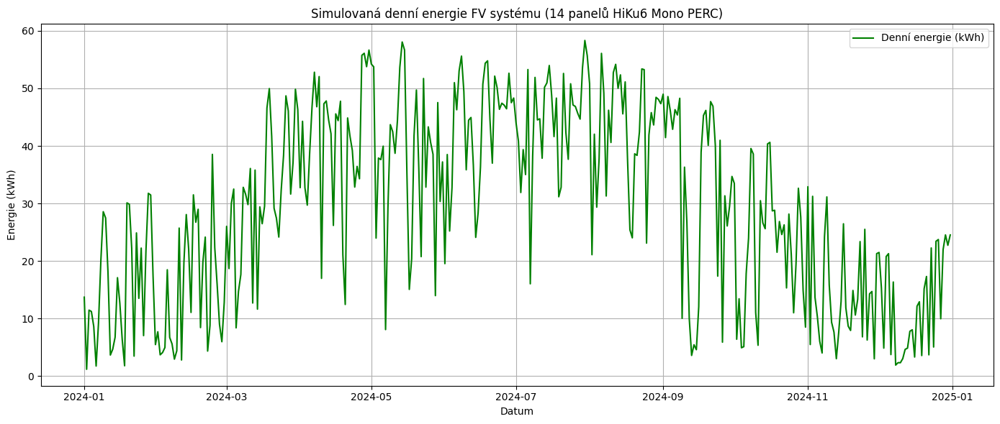

In [ ]:
import pvlib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Parametry FV panelu
panel_params = {
    'pmp': 530,         # jmenovitý výkon [W]
    'gamma_r': -0.0037, # teplotní koeficient [%/°C]
}
n_panels = 14

# Souřadnice: Dobřichovice
lat = 49.9340
lon = 14.2748


# Načtení prvních řádků souboru
df = pd.read_csv('Dobrichovice_1.1.2024-31.12.2024.csv')
print(df.columns)

# Načtení dat
try:
    data = pd.read_csv('Dobrichovice_1.1.2024-31.12.2024.csv', parse_dates=['time'], index_col='time')
except FileNotFoundError:
    print("Soubor 'Dobrichovice_1.1.2024-31.12.2024.csv' nebyl nalezen.")
    exit()

# Převod názvů sloupců
data.rename(columns={
    'shortwave_radiation (W/m²)': 'ghi',
    'diffuse_radiation (W/m²)': 'dhi',
    'direct_normal_irradiance (W/m²)': 'dni'
}, inplace=True)

# Kontrola sloupců
required_cols = ['ghi', 'dhi', 'dni']
if not all(col in data.columns for col in required_cols):
    print("CSV neobsahuje požadované sloupce:", required_cols)
    exit()

# Resample na hodinová data, doplnění mezer
data = data[required_cols]
data = data.resample('H').mean().fillna(method='ffill').fillna(method='bfill')

# Vytvoření fiktivní teploty (25 °C konstantně, pokud není ve vstupu)
temp = pd.Series(25, index=data.index)

# Solární pozice
solpos = pvlib.solarposition.get_solarposition(data.index, lat, lon)
zenith = solpos['apparent_zenith']
azimuth = solpos['azimuth']
zenith = np.where(zenith > 90, 90, zenith)

# Parametry sklonu panelu
tilt = 35
azimuth_panel = 180

# Výpočet ozáření na panel (POA)
poa = pvlib.irradiance.get_total_irradiance(
    surface_tilt=tilt,
    surface_azimuth=azimuth_panel,
    dni=data['dni'],
    ghi=data['ghi'],
    dhi=data['dhi'],
    solar_zenith=zenith,
    solar_azimuth=azimuth
)

# Výpočet výkonu (W)
power_W = (irradiance / 1000) * panel_params['pmp'] * temp_factor * n_panels

# Agregace na denní energii (kWh)
daily_energy_kWh = power_W.resample('D').sum() / 1000  # součet Wh -> kWh

# Výstupní DataFrame
output = pd.DataFrame({
    "Denní energie (kWh)": daily_energy_kWh
})

# Výpis roční energie
print("Roční energie (kWh):")
print(output['Denní energie (kWh)'].resample('Y').sum())

# Vykreslení
plt.figure(figsize=(14, 6))
plt.plot(output.index, output['Denní energie (kWh)'], label='Denní energie (kWh)', color='green')
plt.xlabel('Datum')
plt.ylabel('Energie (kWh)')
plt.title('Simulovaná denní energie FV systému (14 panelů HiKu6 Mono PERC)')
plt.grid(True)
plt.tight_layout()
plt.legend()
plt.show()


<ipython-input-39-25ba35cf1793>:40: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  data = data[required_cols].resample('H').mean().fillna(method='ffill').fillna(method='bfill')
<ipython-input-39-25ba35cf1793>:40: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = data[required_cols].resample('H').mean().fillna(method='ffill').fillna(method='bfill')


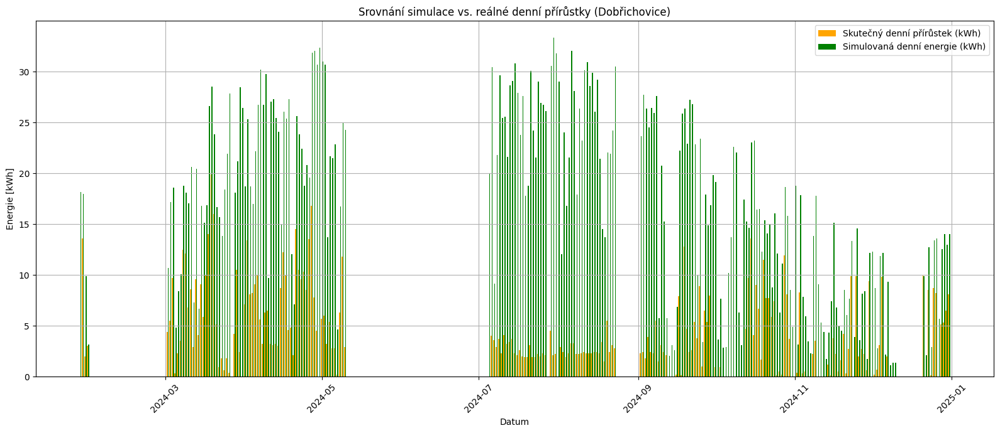

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pvlib

# === ČÁST 1: Načtení reálných dat z all1(in).csv ===
df_real = pd.read_csv("all1(in).csv", dtype={"time": str, "value": str})
df_real["time"] = pd.to_numeric(df_real["time"], errors="coerce")
df_real = df_real[(df_real["location"] == "Dobrichovice") & (df_real["name"] == "PV_generated_energy_of_month")]
df_real = df_real.dropna(subset=["time", "value"])
df_real["datetime"] = pd.to_datetime(df_real["time"].astype("int64"), unit="ns", errors="coerce")
df_real["value"] = pd.to_numeric(df_real["value"], errors="coerce")
df_real = df_real.dropna(subset=["datetime", "value"]).sort_values("datetime")
df_real["date"] = df_real["datetime"].dt.date
df_daily = df_real.groupby("date").last().reset_index()
df_daily["daily_increment"] = df_daily["value"].diff().apply(lambda x: x if x >= 0 else 0)

# OPRAVA: převedeme na kWh pokud jsou hodnoty ve Wh!
df_daily["daily_increment"] = df_daily["daily_increment"] / 1000

df_daily = df_daily.dropna(subset=["daily_increment"])
df_daily = df_daily[(df_daily["daily_increment"] >= 0) & (df_daily["daily_increment"] <= 100)]
df_daily["date"] = pd.to_datetime(df_daily["date"])
# === ČÁST 2: Simulace pomocí pvlib ===
panel_params = {
    'pmp': 530,         # jmenovitý výkon [W]
    'gamma_r': -0.0037, # teplotní koeficient [%/°C]
}
n_panels = 8
lat, lon = 49.9340, 14.2748

data = pd.read_csv('Dobrichovice_1.1.2024-31.12.2024.csv', parse_dates=['time'], index_col='time')
data.rename(columns={
    'shortwave_radiation (W/m²)': 'ghi',
    'diffuse_radiation (W/m²)': 'dhi',
    'direct_normal_irradiance (W/m²)': 'dni'
}, inplace=True)

required_cols = ['ghi', 'dhi', 'dni']
data = data[required_cols].resample('H').mean().fillna(method='ffill').fillna(method='bfill')
temp = pd.Series(25, index=data.index)  # konstantní teplota 25°C

solpos = pvlib.solarposition.get_solarposition(data.index, lat, lon)
zenith = np.minimum(solpos['apparent_zenith'], 90)
azimuth = solpos['azimuth']

tilt = 35
azimuth_panel = 180
irradiance = pvlib.irradiance.get_total_irradiance(
    surface_tilt=tilt,
    surface_azimuth=azimuth_panel,
    dni=data['dni'],
    ghi=data['ghi'],
    dhi=data['dhi'],
    solar_zenith=zenith,
    solar_azimuth=azimuth
)['poa_global']

temp_factor = 1 + panel_params['gamma_r'] * (temp - 25)
power_W = (irradiance / 1000) * panel_params['pmp'] * temp_factor * n_panels
daily_energy_kWh = power_W.resample('D').sum() / 1000  # součet Wh -> kWh
simulated_df = pd.DataFrame({
    "date": daily_energy_kWh.index,
    "Denní energie (kWh)": daily_energy_kWh.values
})

# === ČÁST 3: Sloučení a vykreslení ===
merged = pd.merge(df_daily[["date", "daily_increment"]], simulated_df, on="date", how="inner")

plt.figure(figsize=(16, 7))
bar_width = 0.4
dates = merged["date"]

# Bar plot s posunem sloupců pro srovnání
plt.bar(dates - pd.Timedelta(days=0.2), merged["daily_increment"], width=bar_width, label='Skutečný denní přírůstek (kWh)', color='orange')
plt.bar(dates + pd.Timedelta(days=0.2), merged["Denní energie (kWh)"], width=bar_width, label='Simulovaná denní energie (kWh)', color='green')

plt.xlabel('Datum')
plt.ylabel('Energie [kWh]')
plt.title('Srovnání simulace vs. reálné denní přírůstky (Dobřichovice)')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.legend()
plt.show()


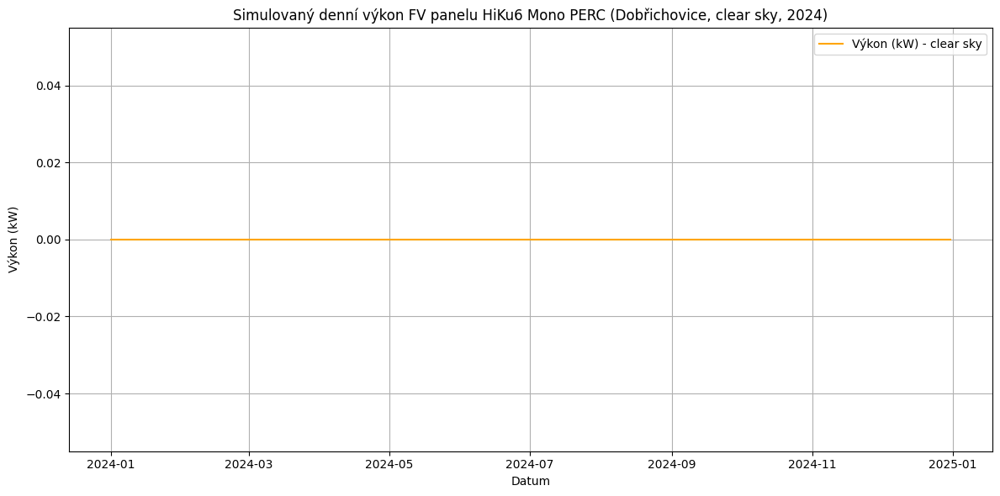

In [ ]:
import pvlib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Parametry pro FV panel HiKu6 Mono PERC
panel_params = {
    'pmp': 530,         # jmenovitý výkon [W]
    'gamma_r': -0.0037, # teplotní koeficient [%/°C]
    'vmp': 40.5,        # napětí při max. výkonu [V]
    'imp': 13.1,        # proud při max. výkonu [A]
    'voc': 48.0,        # napětí naprázdno [V]
    'isc': 14.0         # zkratový proud [A]
}

# Souřadnice místa: Dobřichovice
lat = 49.9340
lon = 14.2748
timezone = 'Europe/Prague'

# Časová osa - 1 denní krok pro celý rok
dates = pd.date_range('2024-01-01', '2024-12-31', freq='D', tz=timezone)

# Denní průměrná teplota pro clear sky (možno změnit podle regionu/průměru)
# Zde jako jednoduchý příklad použijeme konstantu 15°C
temp = pd.Series(15, index=dates)

# Solární pozice
solpos = pvlib.solarposition.get_solarposition(dates, lat, lon)

# Clear sky model (Ineichen)
location = pvlib.location.Location(lat, lon, tz=timezone)
clearsky = location.get_clearsky(dates, model='ineichen')

ghi = clearsky['ghi']
dhi = clearsky['dhi']
dni = clearsky['dni']
zenith = solpos['apparent_zenith']
azim = solpos['azimuth']

# Náklon a orientace panelu
tilt = 35     # sklon panelu
azimuth_panel = 180  # orientace na jih

# Výpočet ozáření na panel (POA - Plane of Array)
poa = pvlib.irradiance.get_total_irradiance(
    surface_tilt=tilt,
    surface_azimuth=azimuth_panel,
    dni=dni,
    ghi=ghi,
    dhi=dhi,
    solar_zenith=zenith,
    solar_azimuth=azim
)

irradiance = poa['poa_global'].fillna(0)

# Výpočet teplotního vlivu na výkon
temp_coeff = panel_params['gamma_r']
temp_factor = 1 - temp_coeff * (temp - 25)

# Výpočet výkonu panelu v kW
power_kW = irradiance * panel_params['pmp'] / 1000 * temp_factor

# DataFrame s výsledkem
output = pd.DataFrame(power_kW, index=dates, columns=["Výkon (kW)"])

# Vykreslení grafu
plt.figure(figsize=(12, 6))
plt.plot(output.index, output["Výkon (kW)"], label='Výkon (kW) - clear sky', color='orange')
plt.xlabel('Datum')
plt.ylabel('Výkon (kW)')
plt.title('Simulovaný denní výkon FV panelu HiKu6 Mono PERC (Dobřichovice, clear sky, 2024)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd

# Load measured data from CSV file
measured_data = pd.read_csv('weather_data.csv', parse_dates=['utc_timestamp'], index_col='utc_timestamp')

# Select only the relevant columns
measured_data = measured_data[['CZ_temperature', 'CZ_radiation_direct_horizontal', 'CZ_radiation_diffuse_horizontal']]

# Filter the data for the specified date range
filtered_data = measured_data['2018-01-01':'2019-01-01']

# Reset index to include utc_timestamp as a column
filtered_data.reset_index(inplace=True)

# Save the filtered data to a new CSV file
filtered_data.to_csv('weather_data_new.csv', index=False)

print("Filtered data has been saved to weather_data_new.csv")

Filtered data has been saved to weather_data_new.csv


In [ ]:
import pandas as pd

# Load measured data from CSV file
measured_data = pd.read_csv('time_series_60min_singleindex.csv', parse_dates=['utc_timestamp'], index_col='utc_timestamp')

# Select only the relevant columns
measured_data = measured_data[['CZ_load_actual_entsoe_transparency','CZ_load_forecast_entsoe_transparency','CZ_solar_generation_actual','CZ_wind_onshore_generation_actual']]

# Filter the data for the specified date range
filtered_data = measured_data['2014-12-31':'2020-09-30']

# Reset index to include utc_timestamp as a column
filtered_data.reset_index(inplace=True)

# Save the filtered data to a new CSV file
filtered_data.to_csv('time_series_60min_singleindex_CZ.csv', index=False)

print("Filtered data has been saved to weather_data_new.csv")

Filtered data has been saved to weather_data_new.csv


In [ ]:
pip install openmeteo-requests
pip install requests-cache retry-requests numpy pandas

SyntaxError: invalid syntax (<ipython-input-6-fe14aa456c54>, line 1)

In [ ]:
import openmeteo_requests
import requests_cache
import pandas as pd
from retry_requests import retry

# Setup the Open-Meteo API client with cache and retry on error
cache_session = requests_cache.CachedSession('.cache', expire_after=-1)
retry_session = retry(cache_session, retries=5, backoff_factor=0.2)
openmeteo = openmeteo_requests.Client(session=retry_session)

# Make sure all required weather variables are listed here
# The order of variables in hourly or daily is important to assign them correctly below
url = "https://archive-api.open-meteo.com/v1/archive"
params = {
    "latitude": 52.52,
    "longitude": 13.41,
    "start_date": "2024-01-01",
    "end_date": "2025-01-01",
    "hourly": ["temperature_2m", "diffuse_radiation", "direct_normal_irradiance", "shortwave_radiation"]
}
responses = openmeteo.weather_api(url, params=params)

# Process first location. Add a for-loop for multiple locations or weather models
response = responses[0]
print(f"Coordinates {response.Latitude()}°N {response.Longitude()}°E")
print(f"Elevation {response.Elevation()} m asl")
print(f"Timezone {response.Timezone()}{response.TimezoneAbbreviation()}")
print(f"Timezone difference to GMT+0 {response.UtcOffsetSeconds()} s")

# Process hourly data. The order of variables needs to be the same as requested.
hourly = response.Hourly()
hourly_temperature_2m = hourly.Variables(0).ValuesAsNumpy()
hourly_diffuse_radiation = hourly.Variables(1).ValuesAsNumpy()
hourly_direct_normal_irradiance = hourly.Variables(2).ValuesAsNumpy()
hourly_shortwave_radiation = hourly.Variables(3).ValuesAsNumpy()

hourly_data = {
    "date": pd.date_range(
        start=pd.to_datetime(hourly.Time(), unit="s", utc=True),
        end=pd.to_datetime(hourly.TimeEnd(), unit="s", utc=True),
        freq=pd.Timedelta(seconds=hourly.Interval()),
        inclusive="left"
    )
}

hourly_data["temperature_2m"] = hourly_temperature_2m
hourly_data["diffuse_radiation"] = hourly_diffuse_radiation
hourly_data["direct_normal_irradiance"] = hourly_direct_normal_irradiance
hourly_data["shortwave_radiation"] = hourly_shortwave_radiation

# Create a DataFrame and save to CSV
hourly_dataframe = pd.DataFrame(data=hourly_data)
csv_filename = "hourly_weather_data.csv"
hourly_dataframe.to_csv(csv_filename, index=False)

print(f"Data byla úspěšně uložena do souboru: {csv_filename}")

OpenMeteoRequestsError: {'reason': "Data corrupted at path ''. Cannot initialize SurfacePressureAndHeightVariable<VariableAndPreviousDay, ForecastPressureVariable, ForecastHeightVariable> from invalid String value DHI.", 'error': True}

<ipython-input-1-e81054697547>:36: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  data = data.resample('H').mean().fillna(method='ffill').fillna(method='bfill')
<ipython-input-1-e81054697547>:36: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = data.resample('H').mean().fillna(method='ffill').fillna(method='bfill')


date
2024-01-01 00:00:00+00:00    162.528140
2024-01-02 00:00:00+00:00     74.495591
2024-01-03 00:00:00+00:00    172.964380
2024-01-04 00:00:00+00:00    123.765260
2024-01-05 00:00:00+00:00     55.717610
                                ...    
2024-12-28 00:00:00+00:00    195.951267
2024-12-29 00:00:00+00:00    169.708049
2024-12-30 00:00:00+00:00    114.260239
2024-12-31 00:00:00+00:00    162.308911
2025-01-01 00:00:00+00:00    206.352546
Freq: D, Length: 367, dtype: float64
date
2024-01-01 00:00:00+00:00    162.528140
2024-01-02 00:00:00+00:00     74.495591
2024-01-03 00:00:00+00:00    172.964380
2024-01-04 00:00:00+00:00    123.765260
2024-01-05 00:00:00+00:00     55.717610
                                ...    
2024-12-28 00:00:00+00:00    195.951267
2024-12-29 00:00:00+00:00    169.708049
2024-12-30 00:00:00+00:00    114.260239
2024-12-31 00:00:00+00:00    162.308911
2025-01-01 00:00:00+00:00    206.352546
Freq: D, Length: 367, dtype: float64


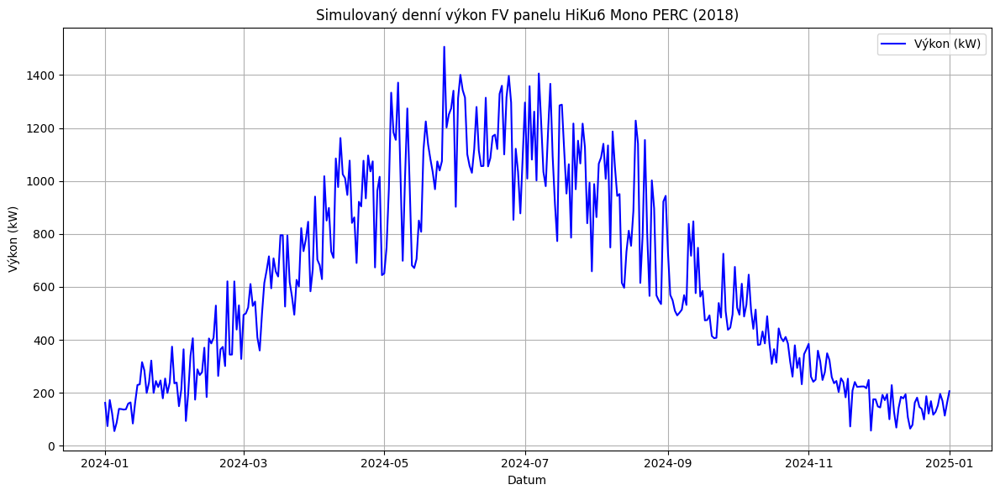

In [ ]:
import pvlib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Parametry pro FV panel HiKu6 Mono PERC
panel_params = {
    'pmp': 530,         # jmenovitý výkon [W]
    'gamma_r': -0.0037, # teplotní koeficient [%/°C]
    'vmp': 40.5,        # napětí při max. výkonu [V]
    'imp': 13.1,        # proud při max. výkonu [A]
    'voc': 48.0,        # napětí naprázdno [V]
    'isc': 14.0         # zkratový proud [A]
}

# Souřadnice místa Dobřichovice
lat = 49.9340
lon = 14.2748

# Načtení dat z CSV
try:
    data = pd.read_csv('hourly_weather_data.csv', parse_dates=['date'], index_col='date')
except FileNotFoundError:
    print("Soubor 'weather_data.csv' nebyl nalezen. Ujistěte se, že je ve správném adresáři.")
    exit()

# Kontrola požadovaných sloupců
required_cols = ['temperature_2m', 'DHI','DNI','GHI']
if not all(col in data.columns for col in required_cols):
    print(f"Chybí požadované sloupce v CSV souboru: {required_cols}")
    exit()

# Filtr a úprava dat
data = data[required_cols]
data = data['2024-01-01':'2025-01-01']
data = data.resample('H').mean().fillna(method='ffill').fillna(method='bfill')

# Agregace na denní hodnoty
daily = data.resample('D').agg({
    'DHI': 'sum',
    'DNI': 'sum',
    'GHI': 'sum',
    'temperature_2m': 'mean'
})

# Výpočet GHI a příprava dat
ghi = daily['GHI']
dhi = daily['DHI']
temp = daily['temperature_2m']
dates = daily.index

# Solární pozice
solpos = pvlib.solarposition.get_solarposition(dates, lat, lon)
zenith = solpos['apparent_zenith']
azim = solpos['azimuth']

# Zajištění, že úhly zenitu jsou validní (max. 90°)
zenith = np.where(zenith > 90, 90, zenith)

# Odhad přímého záření (DNI)
dni = daily['DNI']



# Náklon a orientace panelu
tilt = 35     # sklon panelu
azimuth_panel = 180  # orientace na jih

# Výpočet ozáření na panel (POA - Plane of Array)
poa = pvlib.irradiance.get_total_irradiance(
    surface_tilt=tilt,
    surface_azimuth=azimuth_panel,
    dni=dni,
    ghi=ghi,
    dhi=dhi,
    solar_zenith=zenith,
    solar_azimuth=azim
)

# Efektivní ozáření (poa_global) a náhrada nočních hodnot nulou
irradiance = poa['poa_global'].fillna(0)

# Výpočet teplotního vlivu na výkon
temp_coeff = panel_params['gamma_r']
temp_factor = 1 - temp_coeff * (temp - 25)

# Výpočet výkonu panelu v kW
power_kW = irradiance * panel_params['pmp'] / 1000 * temp_factor

print(power_kW)

# Filtrování extrémních hodnot
#max_reasonable = panel_params['pmp'] * 5 / 1000
#power_kW = power_kW.apply(lambda x: x if x <= max_reasonable else np.nan)

# DataFrame s výsledkem
output = pd.DataFrame(power_kW, index=daily.index, columns=["Výkon (kW)"])

# Kontrola výsledků
if output["Výkon (kW)"].isnull().all():
    print("Výsledná data obsahují pouze nulové nebo neplatné hodnoty. Zkontrolujte vstupní data.")
    exit()


print(power_kW)
# Vykreslení grafu
plt.figure(figsize=(12, 6))
plt.plot(output.index, output["Výkon (kW)"], label='Výkon (kW)', color='blue')
plt.xlabel('Datum')
plt.ylabel('Výkon (kW)')
plt.title('Simulovaný denní výkon FV panelu HiKu6 Mono PERC (2018)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
import openmeteo_requests
from openmeteo_sdk.Variable import Variable
import pandas as pd
import os

# Open-Meteo klient
om = openmeteo_requests.Client()

# Parametry pro získání čerpaných dat
params = {
    "latitude": 52.54,
    "longitude": 13.41,
    "hourly": ["temperature_2m", "diffuse_radiation", "direct_normal_irradiance", "shortwave_radiation"],
}

# Cílový soubor CSV
csv_filename = "hourly_yyyweather_data.csv"

# Funkce pro získání čerpaných dat a uložení do CSV
def fetch_and_save_hourly_weather_data():
    try:
        # Získání dat z API
        responses = om.weather_api("https://api.open-meteo.com/v1/forecast", params=params)
        response = responses[0]

        # Získání hodinových dat
        hourly = response.Hourly()
        hourly_variables = {
            "temperature_2m": hourly.Variables(0).ValuesAsNumpy(),
            "diffuse_radiation": hourly.Variables(1).ValuesAsNumpy(),
            "direct_normal_irradiance": hourly.Variables(2).ValuesAsNumpy(),
            "shortwave_radiation": hourly.Variables(3).ValuesAsNumpy()
        }

        # Načtení časových dat
        hourly_data = {
            "time": pd.date_range(
                start=pd.to_datetime(hourly.Time(), unit="s", utc=True),
                end=pd.to_datetime(hourly.TimeEnd(), unit="s", utc=True),
                freq=pd.Timedelta(seconds=hourly.Interval()),
                inclusive="left"
            )
        }

        # Přidání hodinových hodnot do slovníku
        hourly_data.update(hourly_variables)

        # Převod na DataFrame
        df = pd.DataFrame(hourly_data)

        # Uložení do CSV souboru (připojení dat, pokud již existuje)
        if os.path.exists(csv_filename):
            df.to_csv(csv_filename, mode='a', index=False, header=False)
        else:
            df.to_csv(csv_filename, index=False)

        print(f"Hodinová data byla úspěšně uložena do souboru: {csv_filename}")
    except Exception as e:
        print(f"Chyba při získávání a ukládání dat: {e}")

# Získání a uložení dat
fetch_and_save_hourly_weather_data()

Hodinová data byla úspěšně uložena do souboru: hourly_yyyweather_data.csv


<ipython-input-13-6bb631377d08>:110: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  output_data = pd.concat([output_data, pd.DataFrame([new_row])], ignore_index=True)


Program byl ukončen uživatelem.


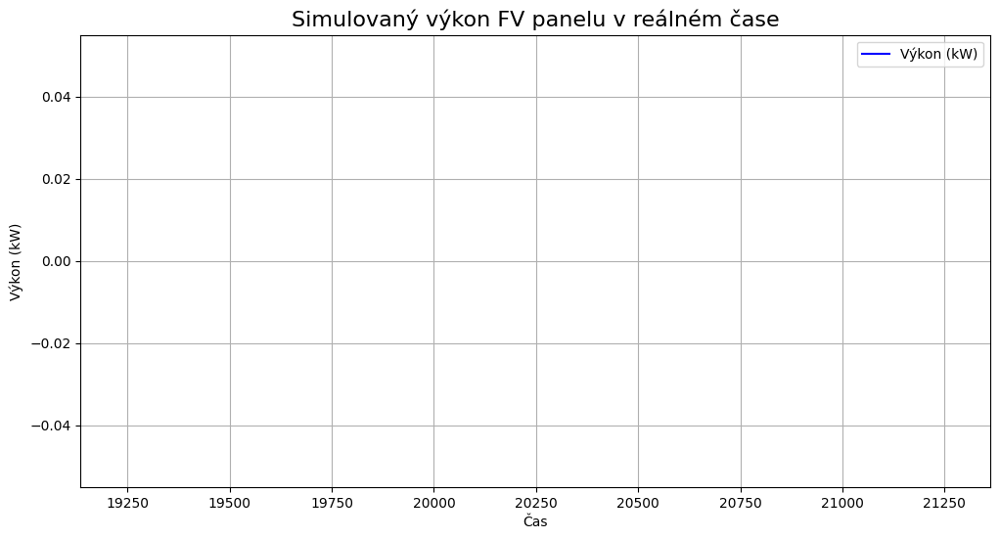

In [ ]:
import openmeteo_requests
from openmeteo_sdk.Variable import Variable
import pvlib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time  # Pro časové zpoždění
from datetime import datetime

# Open-Meteo klient
om = openmeteo_requests.Client()

# Parametry pro získání čerpaných dat
params = {
    "latitude": 52.54,
    "longitude": 13.41,
    "hourly": ["temperature_2m", "diffuse_radiation", "direct_normal_irradiance", "shortwave_radiation"],
}

# Parametry pro FV panel HiKu6 Mono PERC
panel_params = {
    'pmp': 530,         # jmenovitý výkon [W]
    'gamma_r': -0.0037, # teplotní koeficient [%/°C]
    'vmp': 40.5,        # napětí při max. výkonu [V]
    'imp': 13.1,        # proud při max. výkonu [A]
    'voc': 48.0,        # napětí naprázdno [V]
    'isc': 14.0         # zkratový proud [A]
}

# Souřadnice místa: Dobřichovice
lat = 49.9340
lon = 14.2748

# Data pro dynamické doplňování
output_data = pd.DataFrame(columns=["Datum", "Výkon (kW)"])

# Nastavení grafu
plt.ion()  # Interaktivní režim
fig, ax = plt.subplots(figsize=(12, 6))
ax.set_title('Simulovaný výkon FV panelu v reálném čase', fontsize=16)
ax.set_xlabel('Čas')
ax.set_ylabel('Výkon (kW)')
line, = ax.plot([], [], label='Výkon (kW)', color='blue')
plt.legend()
plt.grid(True)

# Funkce pro získání a zpracování dat
def fetch_weather_and_calculate_power():
    try:
        # Získání dat z API
        responses = om.weather_api("https://api.open-meteo.com/v1/forecast", params=params)
        response = responses[0]

        # Získání hodinových dat
        hourly = response.Hourly()
        hourly_data = {
            "date": pd.date_range(
                start=pd.to_datetime(hourly.Time(), unit="s", utc=True),
                end=pd.to_datetime(hourly.TimeEnd(), unit="s", utc=True),
                freq=pd.Timedelta(seconds=hourly.Interval()),
                inclusive="left"
            ),
            "temperature_2m": hourly.Variables(0).ValuesAsNumpy(),
            "DHI": hourly.Variables(1).ValuesAsNumpy(),
            "DNI": hourly.Variables(2).ValuesAsNumpy(),
            "GHI": hourly.Variables(3).ValuesAsNumpy()
        }

        # Převod na DataFrame
        data = pd.DataFrame(hourly_data).set_index('date')

        # Zpracujeme pouze poslední záznam
        latest_row = data.iloc[-1]

        # Solární pozice
        solpos = pvlib.solarposition.get_solarposition(
            pd.to_datetime([latest_row.name]), lat, lon
        )
        zenith = solpos['apparent_zenith'].values[0]
        azim = solpos['azimuth'].values[0]

        # Náklon a orientace panelu
        tilt = 35
        azimuth_panel = 180

        # Výpočet ozáření na panel (POA - Plane of Array)
        poa = pvlib.irradiance.get_total_irradiance(
            surface_tilt=tilt,
            surface_azimuth=azimuth_panel,
            dni=latest_row['DNI'],
            ghi=latest_row['GHI'],
            dhi=latest_row['DHI'],
            solar_zenith=zenith,
            solar_azimuth=azim
        )

        # Efektivní ozáření (poa_global) a náhrada nočních hodnot nulou
        irradiance = poa['poa_global'] if poa['poa_global'] > 0 else 0

        # Výpočet teplotního vlivu na výkon
        temp_coeff = panel_params['gamma_r']
        temp_factor = 1 - temp_coeff * (latest_row['temperature_2m'] - 25)

        # Výpočet výkonu panelu v kW
        power_kW = irradiance * panel_params['pmp'] / 1000 * temp_factor

        # Přidání výsledků do globálního DataFrame
        global output_data
        new_row = {"Datum": latest_row.name, "Výkon (kW)": power_kW}
        output_data = pd.concat([output_data, pd.DataFrame([new_row])], ignore_index=True)

        return power_kW, latest_row.name
    except Exception as e:
        print(f"Chyba při získávání a zpracování dat: {e}")
        return None, None

# Nekonečná smyčka pro aktualizaci dat a grafu
try:
    while True:
        power, timestamp = fetch_weather_and_calculate_power()
        if power is not None and timestamp is not None:
            # Aktualizace dat na grafu
            times = pd.to_datetime(output_data["Datum"])
            powers = output_data["Výkon (kW)"]
            line.set_data(times, powers)
            ax.relim()
            ax.autoscale_view()

            # Aktualizace grafu
            fig.canvas.draw()
            fig.canvas.flush_events()

        # Čekání 10 sekund před dalším během
        time.sleep(10)
except KeyboardInterrupt:
    print("Program byl ukončen uživatelem.")

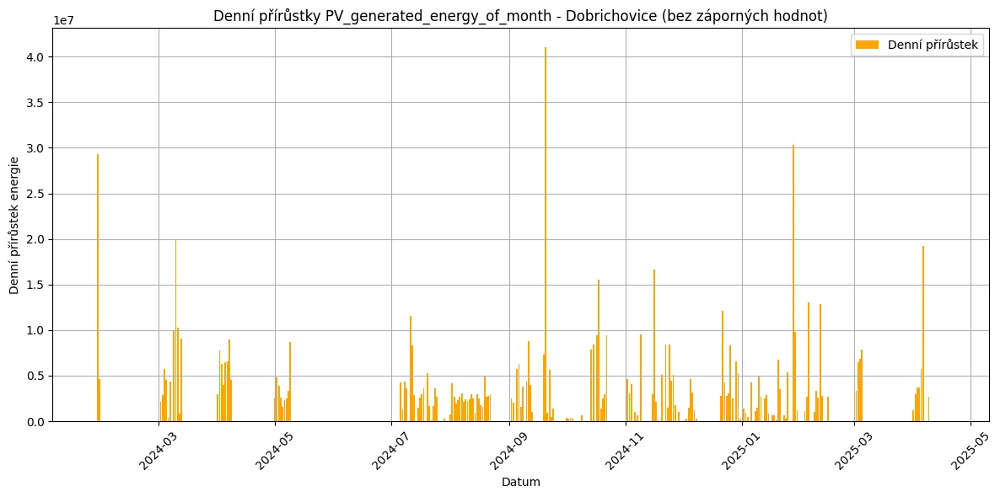

In [ ]:
import pandas as pd

# Zkus převést jednu hodnotu třemi různými způsoby
val = 1706423751179469071

for unit in ['s', 'ms', 'us', 'ns']:
    try:
        dt = pd.to_datetime(val, unit=unit)
        print(f"{unit}: {dt}")
    except Exception as e:
        print(f"{unit}: ERROR -> {e}")


s: ERROR -> Out of bounds nanosecond timestamp: 54074418002-12-09 12:31:11
ms: ERROR -> Out of bounds nanosecond timestamp: 54076386-01-12 21:51:09
us: ERROR -> Out of bounds nanosecond timestamp: 56044-05-31 21:32:59
ns: 2024-01-28 06:35:51.179469071


In [ ]:
import pandas as pd
import numpy as np

# Načti CSV s přetypováním
df = pd.read_csv("all4.csv", dtype={"time": str, "value": str})

# Převeď sloupec "time" na čísla
df["time"] = pd.to_numeric(df["time"], errors="coerce")

# Vyfiltruj jen záznamy pro Dobrichovice a měření 'Output_load_percent'
df = df[(df["location"] == "Dobrichovice") & (df["name"] == "Teplota")].copy()

# Odstraň NaN hodnoty
df = df.dropna(subset=["time", "value"])

# Převod z nanosekund (ns) na datetime
df["datetime"] = pd.to_datetime(df["time"].astype("int64"), unit="ns", errors="coerce")

# Převeď hodnoty na čísla
df["value"] = pd.to_numeric(df["value"], errors="coerce")

# Odstraň neplatné řádky a seřaď podle času
df = df.dropna(subset=["datetime", "value"]).sort_values("datetime")

# Definuj limit pro maximální hodnotu
max_limit = 100

# Filtrování extrémních hodnot, ale ponech nulové hodnoty
df["value"] = df["value"].apply(lambda x: x if (x <= max_limit or x == 0) else np.nan)

# Odstraň NaN hodnoty po filtrování
df = df.dropna(subset=["value"])

# Uložení do nového CSV souboru
df.to_csv("cleaned_output_teplota.csv", index=False)

print("Data byla úspěšně vyčištěna a uložena do cleaned_output.csv")


Data byla úspěšně vyčištěna a uložena do cleaned_output.csv


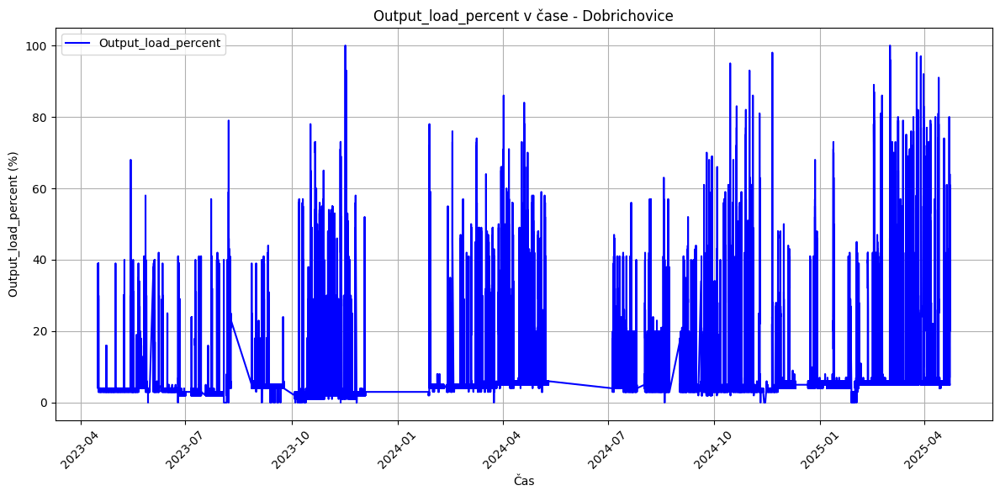

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Načti CSV s přetypováním
df = pd.read_csv("all2.csv", dtype={"time": str, "value": str})

# Převeď sloupec "time" na čísla
df["time"] = pd.to_numeric(df["time"], errors="coerce")

# Vyfiltruj jen záznamy pro Dobrichovice a měření 'Output_load_percent'
df = df[(df["location"] == "Dobrichovice") & (df["name"] == "Output_load_percent")].copy()

# Odstraň NaN hodnoty
df = df.dropna(subset=["time", "value"])

# Převod z nanosekund (ns) na datetime
df["datetime"] = pd.to_datetime(df["time"].astype("int64"), unit="ns", errors="coerce")

# Převeď hodnoty na čísla
df["value"] = pd.to_numeric(df["value"], errors="coerce")

# Odstraň neplatné řádky a seřaď podle času
df = df.dropna(subset=["datetime", "value"]).sort_values("datetime")

# Nastavení limitů pro extrémní hodnoty
min_limit = 0  # Minimální hodnota (např. 0, protože negativní hodnoty nejsou smysluplné)
max_limit = 100  # Maximální hodnota

# Odstranění hodnot mimo povolený rozsah
df = df[(df["value"] >= min_limit) & (df["value"] <= max_limit)]

# Vykreslení grafu hodnot proti času
plt.figure(figsize=(12, 6))
plt.plot(df["datetime"], df["value"], color="blue", label="Output_load_percent")
plt.title("Output_load_percent v čase - Dobrichovice")
plt.xlabel("Čas")
plt.ylabel("Output_load_percent (%)")
plt.grid(True)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

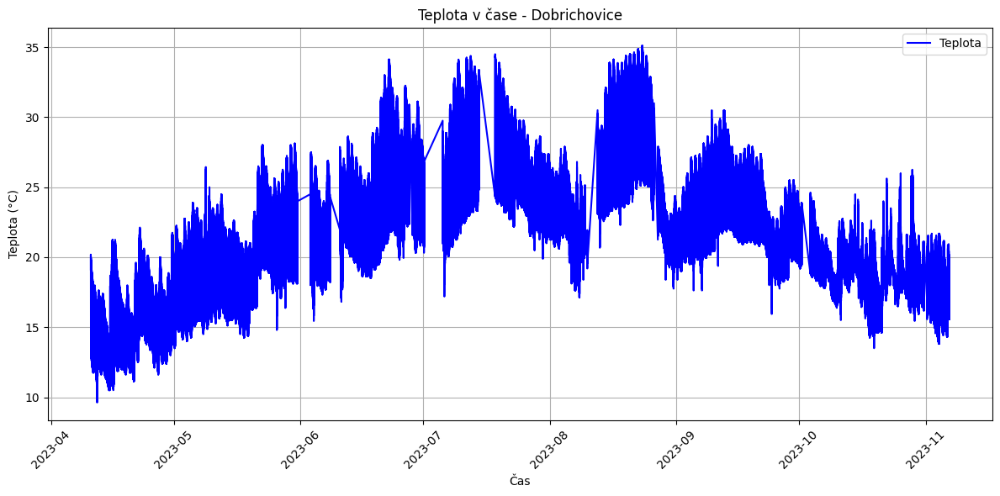

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Načti CSV s přetypováním
df = pd.read_csv("all4.csv", dtype={"time": str, "value": str})

# Převeď sloupec "time" na čísla
df["time"] = pd.to_numeric(df["time"], errors="coerce")

# Vyfiltruj jen záznamy pro Dobrichovice a měření 'Output_load_percent'
df = df[(df["location"] == "Dobrichovice") & (df["name"] == "Teplota")].copy()

# Odstraň NaN hodnoty
df = df.dropna(subset=["time", "value"])

# Převod z nanosekund (ns) na datetime
df["datetime"] = pd.to_datetime(df["time"].astype("int64"), unit="ns", errors="coerce")

# Převeď hodnoty na čísla
df["value"] = pd.to_numeric(df["value"], errors="coerce")

# Odstraň neplatné řádky a seřaď podle času
df = df.dropna(subset=["datetime", "value"]).sort_values("datetime")

# Nastavení limitů pro extrémní hodnoty
min_limit = 0  # Minimální hodnota (např. 0, protože negativní hodnoty nejsou smysluplné)
max_limit = 100  # Maximální hodnota

# Odstranění hodnot mimo povolený rozsah
df = df[(df["value"] >= min_limit) & (df["value"] <= max_limit)]

# Vykreslení grafu hodnot proti času
plt.figure(figsize=(12, 6))
plt.plot(df["datetime"], df["value"], color="blue", label="Teplota")
plt.title("Teplota v čase - Dobrichovice")
plt.xlabel("Čas")
plt.ylabel("Teplota (°C)")
plt.grid(True)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

<ipython-input-15-3b9a99683c64>:76: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


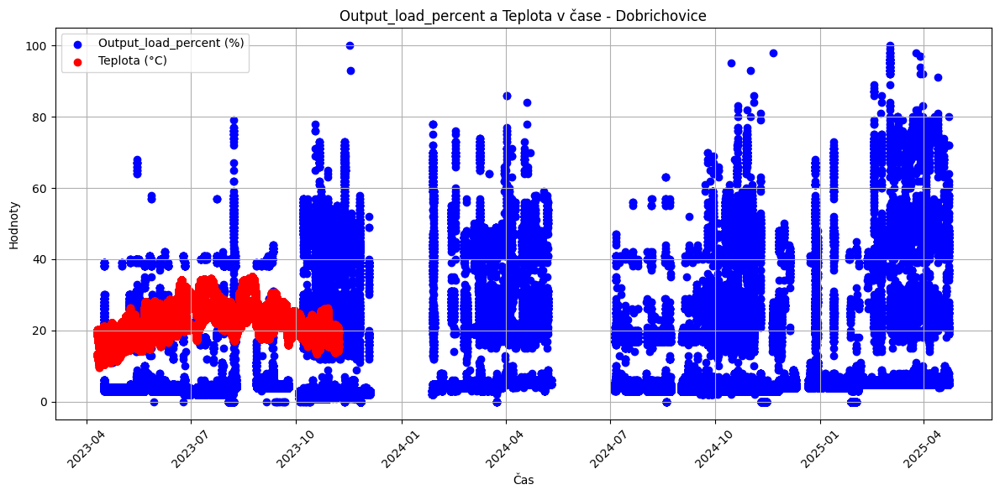

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Načti první CSV s přetypováním
df1 = pd.read_csv("all2.csv", dtype={"time": str, "value": str})

# Převeď sloupec "time" na čísla
df1["time"] = pd.to_numeric(df1["time"], errors="coerce")

# Vyfiltruj jen záznamy pro Dobrichovice a měření 'Output_load_percent'
df1 = df1[(df1["location"] == "Dobrichovice") & (df1["name"] == "Output_load_percent")].copy()

# Odstraň NaN hodnoty
df1 = df1.dropna(subset=["time", "value"])

# Převod z nanosekund (ns) na datetime
df1["datetime"] = pd.to_datetime(df1["time"].astype("int64"), unit="ns", errors="coerce")

# Převeď hodnoty na čísla
df1["value"] = pd.to_numeric(df1["value"], errors="coerce")

# Odstraň neplatné řádky a seřaď podle času
df1 = df1.dropna(subset=["datetime", "value"]).sort_values("datetime")

# Nastavení limitů pro extrémní hodnoty
min_limit = 0  # Minimální hodnota (např. 0, protože negativní hodnoty nejsou smysluplné)
max_limit = 100  # Maximální hodnota

# Odstranění hodnot mimo povolený rozsah
df1 = df1[(df1["value"] >= min_limit) & (df1["value"] <= max_limit)]

# Načti druhé CSV s přetypováním
df2 = pd.read_csv("all4.csv", dtype={"time": str, "value": str})

# Převeď sloupec "time" na čísla
df2["time"] = pd.to_numeric(df2["time"], errors="coerce")

# Vyfiltruj jen záznamy pro Dobrichovice a měření 'Teplota'
df2 = df2[(df2["location"] == "Dobrichovice") & (df2["name"] == "Teplota")].copy()

# Odstraň NaN hodnoty
df2 = df2.dropna(subset=["time", "value"])

# Převod z nanosekund (ns) na datetime
df2["datetime"] = pd.to_datetime(df2["time"].astype("int64"), unit="ns", errors="coerce")

# Převeď hodnoty na čísla
df2["value"] = pd.to_numeric(df2["value"], errors="coerce")

# Odstraň neplatné řádky a seřaď podle času
df2 = df2.dropna(subset=["datetime", "value"]).sort_values("datetime")

# Nastavení limitů pro extrémní hodnoty
min_limit = 0  # Minimální hodnota (např. 0, protože negativní hodnoty nejsou smysluplné)
max_limit = 100  # Maximální hodnota

# Odstranění hodnot mimo povolený rozsah
df2 = df2[(df2["value"] >= min_limit) & (df2["value"] <= max_limit)]

# Vykreslení grafu hodnot proti času
plt.figure(figsize=(12, 6))

# Vykreslení Output_load_percent
plt.scatter(df1["datetime"], df1["value"], color="blue", label="Output_load_percent (%)")

# Vykreslení Teplota
plt.scatter(df2["datetime"], df2["value"], color="red", label="Teplota (°C)")

# Nastavení názvu a popisků
plt.title("Output_load_percent a Teplota v čase - Dobrichovice")
plt.xlabel("Čas")
plt.ylabel("Hodnoty")
plt.grid(True)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()

# Zobrazení grafu
plt.show()

<ipython-input-20-187ccf070f0f>:85: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


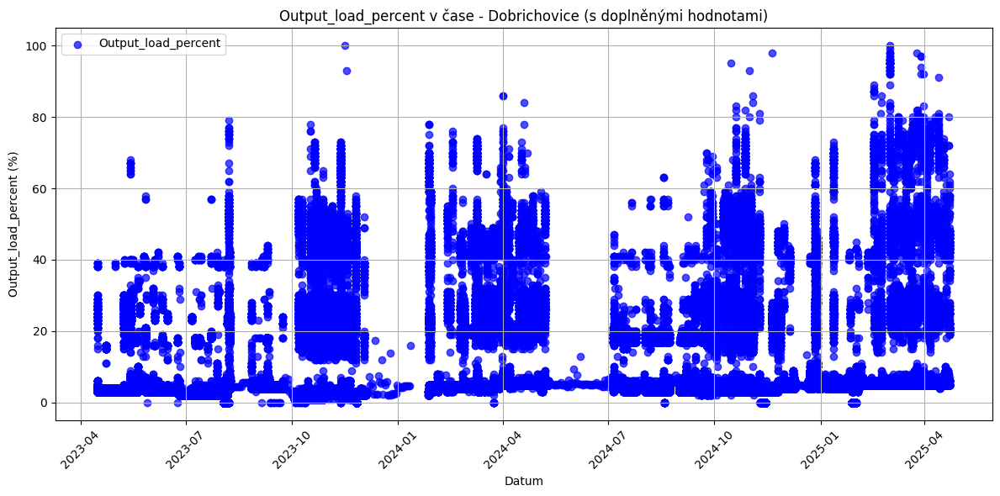

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
import numpy as np

# Načti CSV s přetypováním
df = pd.read_csv("all2.csv", dtype={"time": str, "value": str})

# Převeď sloupec "time" na čísla
df["time"] = pd.to_numeric(df["time"], errors="coerce")

# Vyfiltruj jen záznamy pro Dobrichovice a měření 'Output_load_percent'
df = df[(df["location"] == "Dobrichovice") & (df["name"] == "Output_load_percent")].copy()

# Převod z nanosekund (ns) na datetime
df["datetime"] = pd.to_datetime(df["time"].astype("int64"), unit="ns", errors="coerce")

# Převeď hodnoty na čísla
df["value"] = pd.to_numeric(df["value"], errors="coerce")

# Přidání sloupce pouze s datem (bez času)
df["date"] = df["datetime"].dt.date

# Vytvoření kompletního časového rozsahu (každý den v časovém rozsahu)
full_date_range = pd.date_range(start=df["date"].min(), end=df["date"].max(), freq="D")
full_dates_df = pd.DataFrame({"date": full_date_range})

# Převod sloupce 'date' v původních datech na datetime64[ns]
df["date"] = pd.to_datetime(df["date"])
full_dates_df["date"] = pd.to_datetime(full_dates_df["date"])

# Sloučení s původními daty pro nalezení zcela chybějících dnů
df = pd.merge(full_dates_df, df, on="date", how="left")

# Funkce pro doplnění chybějících dat pomocí Random Forest
def impute_missing_values(df, target_column):
    # Vytvoř nové sloupce s časovými atributy
    df["day"] = df["date"].dt.day
    df["month"] = df["date"].dt.month
    df["year"] = df["date"].dt.year

    # Rozdělení na data s hodnotami a data s NaN
    df_with_values = df.dropna(subset=[target_column])
    df_missing = df[df[target_column].isnull()]

    # Pokud nejsou žádné chybějící hodnoty, vrátíme původní DataFrame
    if df_missing.empty:
        return df

    # Příprava trénovací a testovací sady
    X = df_with_values[["day", "month", "year"]]
    y = df_with_values[target_column]
    X_missing = df_missing[["day", "month", "year"]]

    # Trénování Random Forest modelu
    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    rf.fit(X, y)

    # Predikce chybějících hodnot
    predicted_values = rf.predict(X_missing)

    # Doplnění predikovaných hodnot
    df.loc[df[target_column].isnull(), target_column] = predicted_values
    return df

# Doplnění chybějících dnů v 'value' (pouze pro dny, které zcela chybí)
df = impute_missing_values(df, "value")

# Odstranění limitů pro extrémní hodnoty
min_limit = 0  # Minimální hodnota (např. 0, protože negativní hodnoty nejsou smysluplné)
max_limit = 100  # Maximální hodnota

# Odstranění hodnot mimo povolený rozsah
df = df[(df["value"] >= min_limit) & (df["value"] <= max_limit)]

# Vykreslení grafu hodnot proti času
plt.figure(figsize=(12, 6))
plt.scatter(df["date"], df["value"], color="blue", label="Output_load_percent", alpha=0.7)
plt.title("Output_load_percent v čase - Dobrichovice (s doplněnými hodnotami)")
plt.xlabel("Datum")
plt.ylabel("Output_load_percent (%)")
plt.grid(True)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

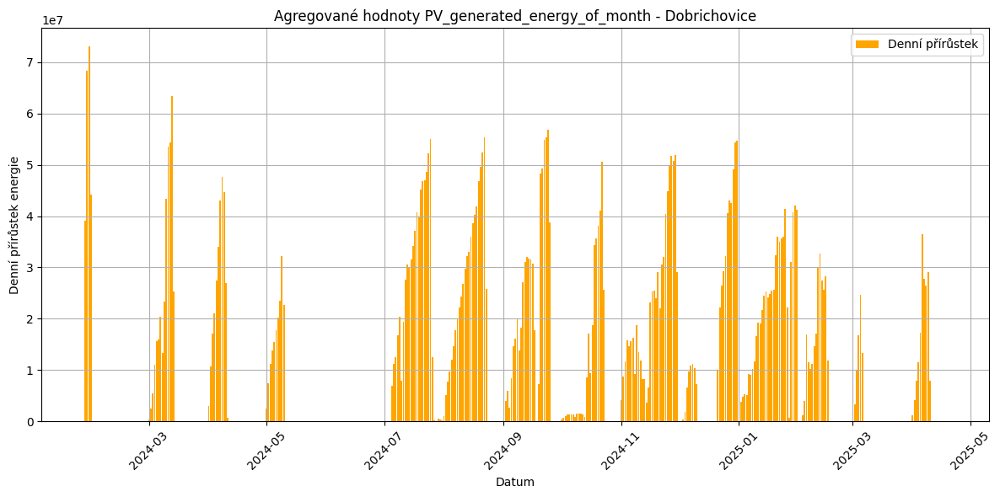

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Načti CSV s přetypováním
df = pd.read_csv("all1(in).csv", dtype={"time": str, "value": str})

# Převeď sloupec "time" na čísla
df["time"] = pd.to_numeric(df["time"], errors="coerce")

# Vyfiltruj jen záznamy pro Dobrichovice a měření 'PV_generated_energy_of_month'
df = df[(df["location"] == "Dobrichovice") & (df["name"] == "PV_generated_energy_of_month")].copy()

# Odstraň NaN hodnoty
df = df.dropna(subset=["time", "value"])

# Převod z nanosekund (ns) na datetime
df["datetime"] = pd.to_datetime(df["time"].astype("int64"), unit="ns", errors="coerce")

# Převeď hodnoty na čísla
df["value"] = pd.to_numeric(df["value"], errors="coerce")

# Odstraň neplatné řádky a seřaď podle času
df = df.dropna(subset=["datetime", "value"]).sort_values("datetime")

# Nastavení limitů pro extrémní hodnoty
min_limit = 0  # Minimální hodnota (např. 0, protože negativní hodnoty nejsou smysluplné)
max_limit = 80000  # Maximální hodnota

# Odstranění hodnot mimo povolený rozsah
df = df[(df["value"] >= min_limit) & (df["value"] <= max_limit)]

# Vytvoř sloupec "date" s pouze datem
df["date"] = df["datetime"].dt.date

# Seskupení podle data a součet hodnot pro každý den
df_daily = df.groupby("date")["value"].sum().reset_index()


# Vykreslení grafu denních přírůstků
plt.figure(figsize=(12, 6))
plt.bar(df_daily["date"], df_daily["value"], color="orange", label="Denní přírůstek")
plt.title("Agregované hodnoty PV_generated_energy_of_month - Dobrichovice")
plt.xlabel("Datum")
plt.ylabel("Denní přírůstek energie")
plt.grid(True)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

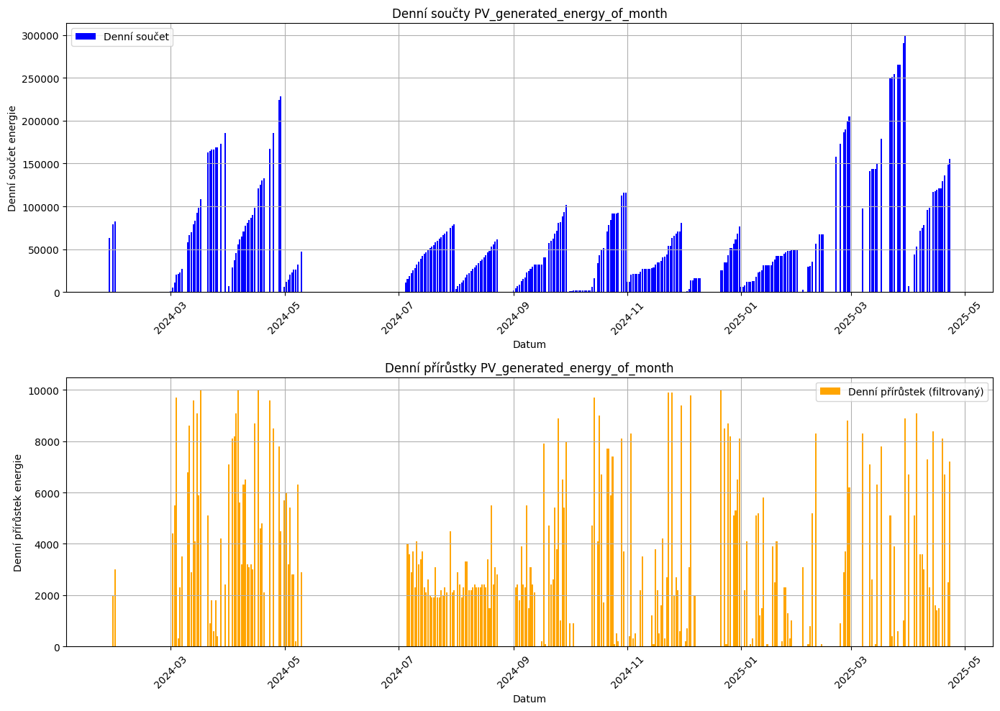

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Načti CSV s přetypováním
df = pd.read_csv("all1(in).csv", dtype={"time": str, "value": str})

# Převeď sloupec "time" na čísla
df["time"] = pd.to_numeric(df["time"], errors="coerce")

# Vyfiltruj jen záznamy pro Dobrichovice a měření 'PV_generated_energy_of_month'
df = df[(df["location"] == "Dobrichovice") & (df["name"] == "PV_generated_energy_of_month")].copy()

# Odstraň NaN hodnoty
df = df.dropna(subset=["time", "value"])

# Převod z nanosekund (ns) na datetime
df["datetime"] = pd.to_datetime(df["time"].astype("int64"), unit="ns", errors="coerce")

# Převeď hodnoty na čísla
df["value"] = pd.to_numeric(df["value"], errors="coerce")

# Odstraň neplatné řádky a seřaď podle času
df = df.dropna(subset=["datetime", "value"]).sort_values("datetime")

# Nastavení limitů pro extrémní hodnoty
min_limit = 0  # Minimální hodnota (např. 0, protože negativní hodnoty nejsou smysluplné)
max_limit = 800000  # Maximální hodnota

# Odstranění hodnot mimo povolený rozsah
df = df[(df["value"] >= min_limit) & (df["value"] <= max_limit)]

# Vytvoř sloupec "date" s pouze datem
df["date"] = df["datetime"].dt.date

# Vezmi vždy poslední hodnotu z daného dne
df_daily_last = df.groupby("date").last().reset_index()

# Přidání sloupce s denními přírůstky (odečtením kumulativní hodnoty předchozího dne)
df_daily_last["daily_increment"] = df_daily_last["value"].diff()

# Nahrazení záporných přírůstků nulou
df_daily_last["daily_increment"] = df_daily_last["daily_increment"].apply(lambda x: x if x >= 0 else 0)

# Odstranění prvního řádku, kde je přírůstek NaN (není předchozí den)
df_daily_last = df_daily_last.dropna(subset=["daily_increment"])

# Nastavení limitů pro denní přírůstky
increment_min = 0    # Minimální hodnota denního přírůstku
increment_max = 10000  # Maximální povolená hodnota denního přírůstku

# Odstranění extrémních hodnot denních přírůstků
df_daily_last = df_daily_last[(df_daily_last["daily_increment"] >= increment_min) & (df_daily_last["daily_increment"] <= increment_max)]

# Vykreslení obou grafů
plt.figure(figsize=(14, 10))

# Graf 1: Denní součty
plt.subplot(2, 1, 1)
plt.bar(df_daily_last["date"], df_daily_last["value"], color="blue", label="Denní součet")
plt.title("Denní součty PV_generated_energy_of_month")
plt.xlabel("Datum")
plt.ylabel("Denní součet energie")
plt.grid(True)
plt.xticks(rotation=45)
plt.legend()

# Graf 2: Denní přírůstky
plt.subplot(2, 1, 2)
plt.bar(df_daily_last["date"], df_daily_last["daily_increment"], color="orange", label="Denní přírůstek (filtrovaný)")
plt.title("Denní přírůstky PV_generated_energy_of_month")
plt.xlabel("Datum")
plt.ylabel("Denní přírůstek energie")
plt.grid(True)
plt.xticks(rotation=45)
plt.legend()

# Uspořádání a zobrazení grafů
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pvlib

# Parametry pro FV panel HiKu6 Mono PERC
panel_params = {
    'pmp': 530,         # jmenovitý výkon [W]
    'gamma_r': -0.0037, # teplotní koeficient [%/°C]
    'vmp': 40.5,        # napětí při max. výkonu [V]
    'imp': 13.1,        # proud při max. výkonu [A]
    'voc': 48.0,        # napětí naprázdno [V]
    'isc': 14.0         # zkratový proud [A]
}

# Počet panelů
number_of_panels = 8

# Souřadnice místa: Dobřichovice
lat = 49.9340
lon = 14.2748
tz = 'Europe/Prague'

# Načti CSV s přetypováním
df = pd.read_csv("all1(in).csv", dtype={"time": str, "value": str})

# Převeď sloupec "time" na čísla
df["time"] = pd.to_numeric(df["time"], errors="coerce")

# Vyfiltruj jen záznamy pro Dobrichovice a měření 'PV_generated_energy_of_month'
df = df[(df["location"] == "Dobrichovice") & (df["name"] == "PV_generated_energy_of_month")].copy()

# Odstraň NaN hodnoty
df = df.dropna(subset=["time", "value"])

# Převod z nanosekund (ns) na datetime
df["datetime"] = pd.to_datetime(df["time"].astype("int64"), unit="ns", errors="coerce")

# Převeď hodnoty na čísla
df["value"] = pd.to_numeric(df["value"], errors="coerce")

# Odstraň neplatné řádky a seřaď podle času
df = df.dropna(subset=["datetime", "value"]).sort_values("datetime")

# Vytvoř sloupec "date" s pouze datem
df["date"] = df["datetime"].dt.date

# Identifikace chybějících dnů
full_date_range = pd.date_range(start=df["date"].min(), end=df["date"].max(), freq="D")
existing_dates = pd.to_datetime(df["date"].unique())
missing_days = full_date_range.difference(existing_dates)

# === Simulace pomocí reálných meteorologických dat ===
if not missing_days.empty:
    # Předpokládáme, že máme reálná meteorologická data jako DataFrame `weather_data`
    # Simulovaná data musí obsahovat sloupce: 'dni', 'ghi', 'dhi' pro každou hodinu
    # Data by měla být získána z meteorologického API nebo souboru

    # Příkladová struktura `weather_data`:
    weather_data = pd.DataFrame({
        'datetime': pd.date_range(start=missing_days.min(), end=missing_days.max() + pd.Timedelta(days=1), freq="H", tz=tz),
        'dni': np.random.uniform(0, 800, size=(len(missing_days) * 24 + 24)),  # Simulovaná data přímého ozáření
        'ghi': np.random.uniform(0, 1000, size=(len(missing_days) * 24 + 24)), # Simulovaná data globálního ozáření
        'dhi': np.random.uniform(0, 500, size=(len(missing_days) * 24 + 24))  # Simulovaná data difúzního ozáření
    }).set_index('datetime')

    tilt = 35
    azimuth_panel = 180
    simulated_records = []

    for missing_day in missing_days:
        times = pd.date_range(start=missing_day, end=missing_day + pd.Timedelta(days=1), freq="h", inclusive='left', tz=tz)
        solpos = pvlib.solarposition.get_solarposition(times, latitude=lat, longitude=lon)
        daylight = solpos['apparent_elevation'] > 0
        times_daylight = times[daylight]

        if times_daylight.empty:
            continue

        weather_day = weather_data.loc[weather_data.index.date == missing_day.date()]
        if weather_day.empty:
            continue

        poa = pvlib.irradiance.get_total_irradiance(
            surface_tilt=tilt,
            surface_azimuth=azimuth_panel,
            dni=weather_day['dni'],
            ghi=weather_day['ghi'],
            dhi=weather_day['dhi'],
            solar_zenith=solpos.loc[daylight, 'apparent_zenith'],
            solar_azimuth=solpos.loc[daylight, 'azimuth']
        )

        irradiance = poa['poa_global'].fillna(0)
        simulated_energy = irradiance.sum() * panel_params['pmp'] * number_of_panels / 1000  # kWh

        simulated_records.append({
            'date': missing_day.date(),
            'daily_increment': simulated_energy
        })

    simulated_df = pd.DataFrame(simulated_records)
    df_daily_last = pd.concat([df, simulated_df]).sort_values("date")

# === Vykreslení grafů ===
plt.figure(figsize=(14, 10))

# Graf 1: Denní součty
plt.subplot(2, 1, 1)
plt.bar(df_daily_last["date"], df_daily_last["value"], color="blue", label="Denní součet")
plt.title("Denní součty PV_generated_energy_of_month - Dobřichovice (včetně simulací)")
plt.xlabel("Datum")
plt.ylabel("Denní součet energie")
plt.grid(True)
plt.xticks(rotation=45)
plt.legend()

# Graf 2: Denní přírůstky včetně simulovaných hodnot
plt.subplot(2, 1, 2)
plt.bar(df_daily_last["date"], df_daily_last["daily_increment"], color="orange", label="Denní přírůstky (včetně simulovaných)")
plt.title("Denní přírůstky PV_generated_energy_of_month - Dobřichovice (včetně simulací)")
plt.xlabel("Datum")
plt.ylabel("Denní přírůstek energie")
plt.grid(True)
plt.xticks(rotation=45)
plt.legend()

plt.tight_layout()
plt.show()

/tmp/ipython-input-2306089619.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  'datetime': pd.date_range(start=missing_days.min(), end=missing_days.max() + pd.Timedelta(days=1), freq="H", tz=tz),


ValueError: All arrays must be of the same length

<ipython-input-4-ab3261d4d2d6>:25: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  missing_days = pd.date_range(start='2024-02-01', end='2024-12-20', freq="H", tz=tz)


Simulated power (daily):
 2024-02-01 00:00:00+01:00    16912.642579
2024-02-02 00:00:00+01:00    17079.266824
2024-02-03 00:00:00+01:00    17248.391456
2024-02-04 00:00:00+01:00    17419.812376
2024-02-05 00:00:00+01:00    17595.802925
                                 ...     
2024-12-15 00:00:00+01:00    14659.973219
2024-12-16 00:00:00+01:00    14632.595965
2024-12-17 00:00:00+01:00    14532.106623
2024-12-18 00:00:00+01:00    14464.877999
2024-12-19 00:00:00+01:00    14379.280359
Freq: D, Name: poa_global, Length: 323, dtype: float64


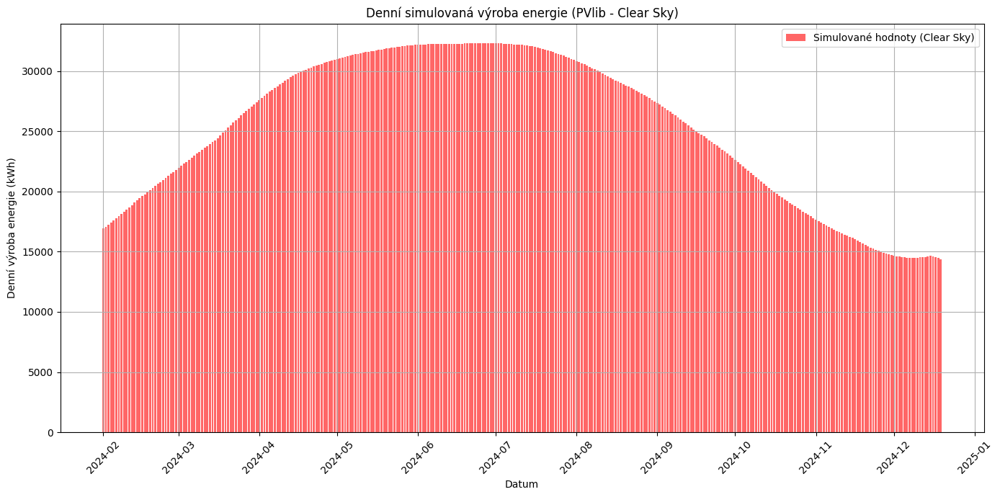

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pvlib

# Parametry pro FV panel HiKu6 Mono PERC
panel_params = {
    'pmp': 530,         # jmenovitý výkon [W]
    'gamma_r': -0.0037, # teplotní koeficient [%/°C]
    'vmp': 40.5,        # napětí při max. výkonu [V]
    'imp': 13.1,        # proud při max. výkonu [A]
    'voc': 48.0,        # napětí naprázdno [V]
    'isc': 14.0         # zkratový proud [A]
}

# Počet panelů
number_of_panels = 8

# Souřadnice místa: Dobřichovice
lat = 49.9340
lon = 14.2748
tz = 'Europe/Prague'

# Identifikace chybějících dnů (pro účely simulace)
missing_days = pd.date_range(start='2024-02-01', end='2024-12-20', freq="H", tz=tz)

# Simulace pro čistou oblohu
clear_sky_model = pvlib.location.Location(latitude=lat, longitude=lon, tz=tz)
clear_sky_data = clear_sky_model.get_clearsky(missing_days)

# Solární pozice
solpos = pvlib.solarposition.get_solarposition(missing_days, latitude=lat, longitude=lon)

# Filtr denního světla (pouze hodiny, kdy je slunce nad obzorem)
daylight = solpos['apparent_elevation'] > 0
clear_sky_data = clear_sky_data[daylight]

# Přímé, difúzní a globální ozáření (plane of array - POA)
tilt = 35  # sklon panelu
azimuth_panel = 180  # orientace na jih
poa = pvlib.irradiance.get_total_irradiance(
    surface_tilt=tilt,
    surface_azimuth=azimuth_panel,
    dni=clear_sky_data['dni'],
    ghi=clear_sky_data['ghi'],
    dhi=clear_sky_data['dhi'],
    solar_zenith=solpos.loc[daylight, 'apparent_zenith'],
    solar_azimuth=solpos.loc[daylight, 'azimuth']
)

# Efektivní ozáření (poa_global) a agregace na denní hodnoty
irradiance = poa['poa_global'].fillna(0)
simulated_power_daily = irradiance.resample('D').sum() * panel_params['pmp'] * number_of_panels / 1000  # kWh

# Debug: Zkontrolujte simulované hodnoty
print("Simulated power (daily):\n", simulated_power_daily)

# Vykreslení grafu
plt.figure(figsize=(14, 7))

# Simulované hodnoty pro chybějící dny
if not simulated_power_daily.empty:
    plt.bar(simulated_power_daily.index, simulated_power_daily, color="red", alpha=0.6, label="Simulované hodnoty (Clear Sky)")

# Nastavení grafu
plt.title("Denní simulovaná výroba energie (PVlib - Clear Sky)")
plt.xlabel("Datum")
plt.ylabel("Denní výroba energie (kWh)")
plt.grid(True)
plt.xticks(rotation=45)
plt.legend()

# Zobrazení grafu
plt.tight_layout()
plt.show()

In [ ]:
import openmeteo_requests
import pandas as pd
import requests_cache
from retry_requests import retry

# Nastavení klienta Open-Meteo API s cache a opakování požadavků při chybách
cache_session = requests_cache.CachedSession('.cache', expire_after=-1)
retry_session = retry(cache_session, retries=5, backoff_factor=0.2)
openmeteo = openmeteo_requests.Client(session=retry_session)

# URL a parametry pro Open-Meteo API
url = "https://archive-api.open-meteo.com/v1/archive"
params = {
    "latitude": 52.52,  # Zeměpisná šířka
    "longitude": 13.41,  # Zeměpisná délka
    "start_date": "2024-02-01",  # Počáteční datum
    "end_date": "2024-02-29",  # Konečné datum
    "hourly": ["shortwave_radiation", "diffuse_radiation", "direct_normal_irradiance"],  # Požadované proměnné
    "tilt": 35  # Sklon panelu
}

# Získání dat z Open-Meteo API
responses = openmeteo.weather_api(url, params=params)

# Zpracování první lokace (přidejte smyčku pro více lokací nebo modelů počasí)
response = responses[0]
print(f"Coordinates {response.Latitude()}°N {response.Longitude()}°E")
print(f"Elevation {response.Elevation()} m asl")
print(f"Timezone {response.Timezone()}{response.TimezoneAbbreviation()}")
print(f"Timezone difference to GMT+0 {response.UtcOffsetSeconds()} s")

# Zpracování hodinových dat
hourly = response.Hourly()
hourly_shortwave_radiation = hourly.Variables(0).ValuesAsNumpy()
hourly_diffuse_radiation = hourly.Variables(1).ValuesAsNumpy()
hourly_direct_normal_irradiance = hourly.Variables(2).ValuesAsNumpy()

# Vytvoření datového rámce pro hodinová data
hourly_data = {
    "date": pd.date_range(
        start=pd.to_datetime(hourly.Time(), unit="s", utc=True),
        end=pd.to_datetime(hourly.TimeEnd(), unit="s", utc=True),
        freq=pd.Timedelta(seconds=hourly.Interval()),
        inclusive="left"
    ),
    "shortwave_radiation": hourly_shortwave_radiation,
    "diffuse_radiation": hourly_diffuse_radiation,
    "direct_normal_irradiance": hourly_direct_normal_irradiance
}

hourly_dataframe = pd.DataFrame(data=hourly_data)

# Výpis výsledného DataFrame
print(hourly_dataframe)

Coordinates 52.5483283996582°N 13.407821655273438°E
Elevation 38.0 m asl
Timezone NoneNone
Timezone difference to GMT+0 0 s
                         date  shortwave_radiation  diffuse_radiation  \
0   2024-02-01 00:00:00+00:00                  0.0                0.0   
1   2024-02-01 01:00:00+00:00                  0.0                0.0   
2   2024-02-01 02:00:00+00:00                  0.0                0.0   
3   2024-02-01 03:00:00+00:00                  0.0                0.0   
4   2024-02-01 04:00:00+00:00                  0.0                0.0   
..                        ...                  ...                ...   
691 2024-02-29 19:00:00+00:00                  0.0                0.0   
692 2024-02-29 20:00:00+00:00                  0.0                0.0   
693 2024-02-29 21:00:00+00:00                  0.0                0.0   
694 2024-02-29 22:00:00+00:00                  0.0                0.0   
695 2024-02-29 23:00:00+00:00                  0.0                0.0   


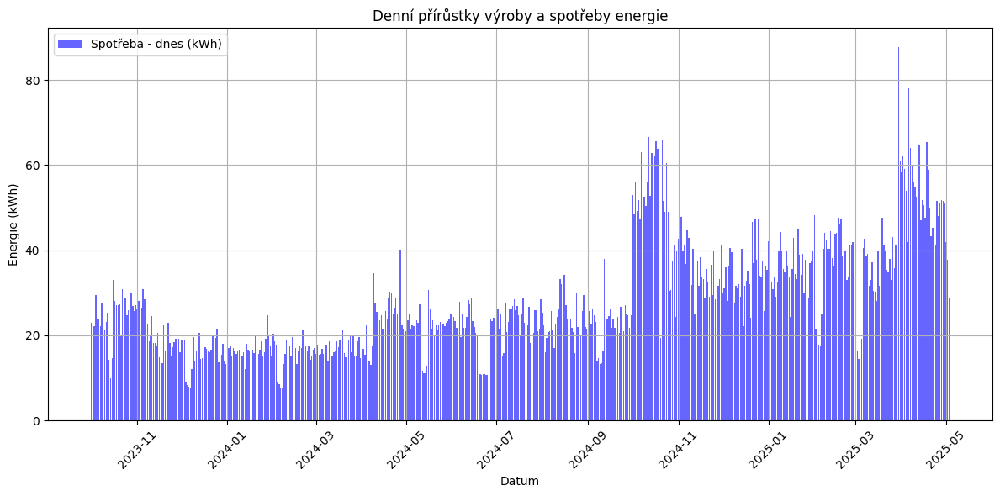

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Načti CSV s přetypováním
df = pd.read_csv("data_od_strejdy_vse.csv", sep=";", dtype={"Aktualizovany_cas": str, "Vyroba-dnes(kWh)": str, "Spotreba-den(kWh)": str})

# Převod sloupce "Aktualizovany_cas" na datetime
df["Aktualizovany_cas"] = pd.to_datetime(df["Aktualizovany_cas"], format="%Y/%m/%d", errors="coerce")

# Převeď hodnoty ve sloupcích na čísla
df["Vyroba-dnes(kWh)"] = pd.to_numeric(df["Vyroba-dnes(kWh)"], errors="coerce")
df["Spotreba-den(kWh)"] = pd.to_numeric(df["Spotreba-den(kWh)"], errors="coerce")

# Odstraň NaN hodnoty
df = df.dropna(subset=["Aktualizovany_cas", "Vyroba-dnes(kWh)", "Spotreba-den(kWh)"])

# Nastavení limitů pro extrémní hodnoty
min_limit = 0  # Minimální hodnota (např. 0, protože negativní hodnoty nejsou smysluplné)
max_limit = 80000  # Maximální hodnota

# Odstranění hodnot mimo povolený rozsah
df = df[(df["Vyroba-dnes(kWh)"] >= min_limit) & (df["Vyroba-dnes(kWh)"] <= max_limit)]
df = df[(df["Spotreba-den(kWh)"] >= min_limit) & (df["Spotreba-den(kWh)"] <= max_limit)]

# Vytvoř sloupec "date" s pouze datem
df["date"] = df["Aktualizovany_cas"].dt.date

# Seskupení podle data (součet hodnot pro každý den, pokud existují duplikáty)
df_daily = df.groupby("date")[["Vyroba-dnes(kWh)", "Spotreba-den(kWh)"]].sum().reset_index()

# Převod sloupce "date" na datetime pro správné zobrazení v grafu
df_daily["date"] = pd.to_datetime(df_daily["date"])

# Vykreslení grafu denních přírůstků výroby a spotřeby energie
plt.figure(figsize=(12, 6))
#plt.bar(df_daily["date"], df_daily["Vyroba-dnes(kWh)"], color="orange", label="Výroba - dnes (kWh)", alpha=0.8)
plt.bar(df_daily["date"], df_daily["Spotreba-den(kWh)"], color="blue", label="Spotřeba - dnes (kWh)", alpha=0.6)
plt.title("Denní přírůstky výroby a spotřeby energie")
plt.xlabel("Datum")
plt.ylabel("Energie (kWh)")
plt.grid(True)
plt.xticks(rotation=45)  # Rotace textu na ose X pro lepší čitelnost
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd

# Načtení prvního CSV souboru
file1 = "Zelenka Miroslav - Golčův Jeníkov-Denní statistiky-).csv"
df1 = pd.read_csv(file1)

# Načtení druhého CSV souboru
file2 = "aaaaacsv.csv"
df2 = pd.read_csv(file2)

file3 = "bbb.csv"
df3 = pd.read_csv(file2)



# Spojení souborů za sebe
result = pd.concat([df1, df2, df3], ignore_index=True)

# Uložení výsledku do nového CSV souboru
output_file = "spojeny_soubor.csv"
result.to_csv(output_file, index=False)

print(f"Soubor '{output_file}' byl úspěšně vytvořen!")

Soubor 'spojeny_soubor.csv' byl úspěšně vytvořen!


<ipython-input-18-16812bb3f5ae>:55: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  future_dates = pd.date_range(start='2025-05-04', end='2026-12-31 23:00:00', freq='H')


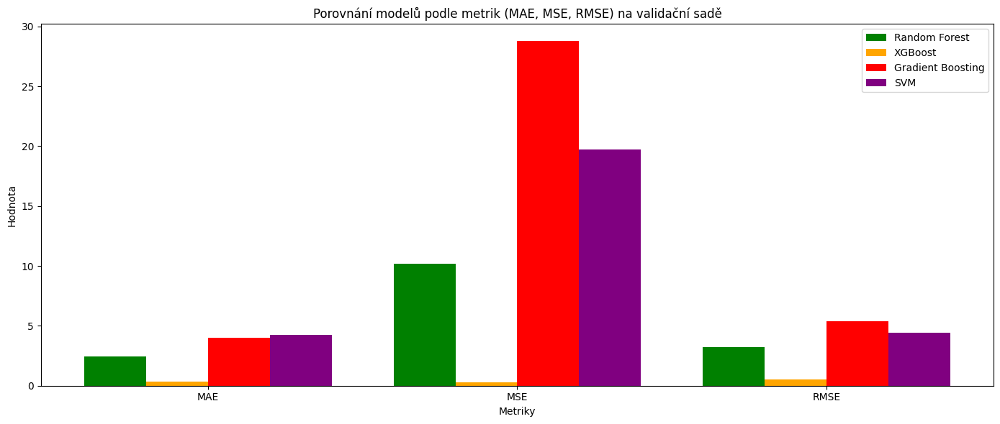

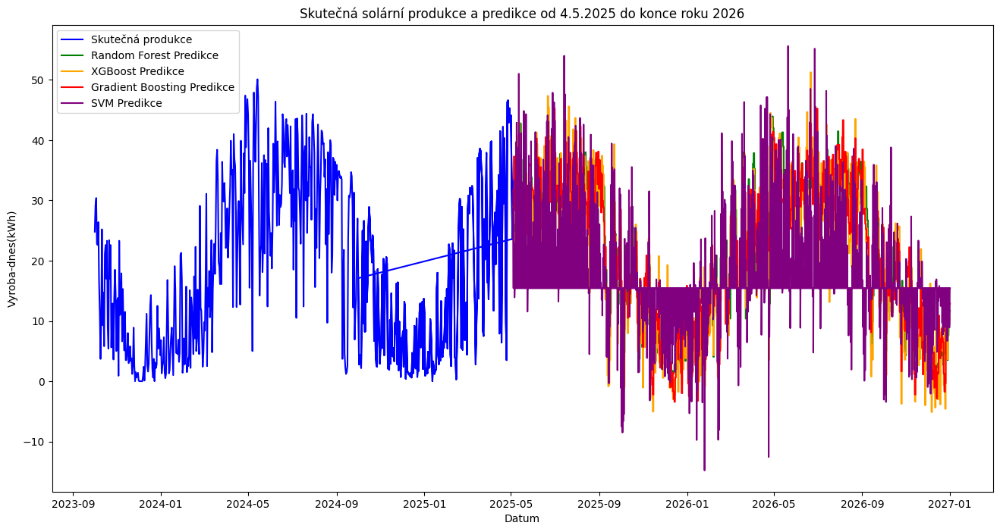

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, mean_squared_error
import xgboost as xgb
import matplotlib.pyplot as plt

# Načtení CSV souboru s výrobními daty
file_path_production = 'data_od_strejdy_vse.csv'
data = pd.read_csv(file_path_production, delimiter=';')

# Načtení CSV souboru s počasím
file_path_weather = 'open-meteo-49.81N15.47E380m.csv'
weather_data = pd.read_csv(file_path_weather, delimiter=',')

# Konvertování 'Aktualizovany_cas' a 'time' na datetime
data['Aktualizovany_cas'] = pd.to_datetime(data['Aktualizovany_cas'], errors='coerce')
weather_data['time'] = pd.to_datetime(weather_data['time'], errors='coerce')

# Přejmenování sloupce 'time' na 'Aktualizovany_cas' pro merge
weather_data = weather_data.rename(columns={'time': 'Aktualizovany_cas'})

# Sloučení dat podle 'Aktualizovany_cas'
data = pd.merge(data, weather_data, on='Aktualizovany_cas', how='left')

# --- DŮLEŽITÁ OPRAVA: Přejmenuj sloupce počasí na běžné zkratky ---
data = data.rename(columns={
    'shortwave_radiation (W/m²)': 'GHI',
    'diffuse_radiation (W/m²)': 'DHI',
    'direct_normal_irradiance (W/m²)': 'DNI'
})

# Kontrola, zda sloučená data obsahují počasí
if data[['GHI', 'DHI', 'DNI']].isnull().any().any():
    print("Pozor: Některé hodnoty počasí chybí po sloučení!")

# Přidání časových atributů
data['year'] = data['Aktualizovany_cas'].dt.year
data['month'] = data['Aktualizovany_cas'].dt.month
data['day'] = data['Aktualizovany_cas'].dt.day
data['hour'] = data['Aktualizovany_cas'].dt.hour
data['weekday'] = data['Aktualizovany_cas'].dt.weekday

# Predikce od 4.5.2025 do konce roku 2026

# Definujte trénovací data
train_data = data[data['Aktualizovany_cas'] <= '2025-05-03 23:59:59'].copy()

# Vytvořte data pro budoucí predikci (od 4.5.2025 do 31.12.2026)
# Zde je potřeba zajistit, že budoucí data obsahují všechny potřebné sloupce (features)
# V tomto příkladu si je vytvoříme na základě časového rozsahu.
# ZATÍM BEZ REÁLNÝCH BUDOUCÍCH DAT POČASÍ - TY BYSTE MUSI NAČÍST NEBO SIMULOVAT JINAK
future_dates = pd.date_range(start='2025-05-04', end='2026-12-31 23:00:00', freq='H')

future_data = pd.DataFrame({'Aktualizovany_cas': future_dates})

# Přidání časových atributů do budoucích dat
future_data['year'] = future_data['Aktualizovany_cas'].dt.year
future_data['month'] = future_data['Aktualizovany_cas'].dt.month
future_data['day'] = future_data['Aktualizovany_cas'].dt.day
future_data['hour'] = future_data['Aktualizovany_cas'].dt.hour
future_data['weekday'] = future_data['Aktualizovany_cas'].dt.weekday

# Zde byste načetli nebo simulovali budoucí data počasí pro future_dates
# Pro účely demonstrace vyplníme hodnoty počasí nulami nebo průměrnými hodnotami z trénovacích dat
# NAHRAĎTE TOTO NAČÍTÁNÍM VAŠICH SKUTEČNÝCH BUDOUCÍCH DAT POČASÍ!
for weather_col in ['GHI', 'DHI', 'DNI']:
     # Zde by měl být kód pro načtení/simulaci budoucího počasí
     # Příklad: future_weather = pd.read_csv('future_weather.csv')
     # Spojení future_data a future_weather na základě času
     # Následující řádek pouze vyplní nulami, což NENÍ SPRÁVNÉ pro realistickou predikci
     future_data[weather_col] = 0

# Normalizace dat
scaler_production = MinMaxScaler(feature_range=(0, 1))
# Ujistěte se, že trénovací data nejsou prázdná před normalizací
if not train_data.empty:
    train_data['Vyroba-dnes(kWh)'] = scaler_production.fit_transform(train_data[['Vyroba-dnes(kWh)']])
else:
    raise ValueError("Trénovací data jsou prázdná. Zkontrolujte rozsah dat v 'data_od_strejdy_vse.csv'.")


# Příprava vstupů a výstupů pro dataset
features = ['year', 'month', 'day', 'hour', 'weekday', 'DNI', 'GHI', 'DHI']  # Přidány údaje o počasí
X_train = train_data[features].values
y_train = train_data['Vyroba-dnes(kWh)'].values

# Příprava vstupů pro budoucí predikci
# Zkontrolujte, zda budoucí data obsahují všechny sloupce z 'features'
missing_future_cols = [col for col in features if col not in future_data.columns]
if missing_future_cols:
    raise ValueError(f"Chybí sloupce v budoucích datech: {missing_future_cols}. Ujistěte se, že budoucí data obsahují všechna potřebná vstupní data (včetně počasí).")

X_future = future_data[features].values

# Random Forest Model
rf_model = RandomForestRegressor(n_estimators=1000, random_state=42)
# Ujistěte se, že X_train a y_train nejsou prázdné před trénováním
if X_train.size > 0 and y_train.size > 0:
    rf_model.fit(X_train, y_train)
    # Ujistěte se, že X_future není prázdné před predikcí
    if X_future.size > 0:
        rf_predictions = rf_model.predict(X_future)
        rf_predictions = scaler_production.inverse_transform(rf_predictions.reshape(-1, 1))
    else:
        print("X_future je prázdné. Nelze provést predikci Random Forest.")
        rf_predictions = np.array([]) # Prázdný array, pokud nelze predikovat
else:
    print("Trénovací data (X_train nebo y_train) jsou prázdná. Nelze trénovat Random Forest.")
    rf_predictions = np.array([]) # Prázdný array, pokud nelze trénovat

# XGBoost Model
xgb_model = xgb.XGBRegressor(n_estimators=1000, learning_rate=0.05, random_state=42)
if X_train.size > 0 and y_train.size > 0:
    xgb_model.fit(X_train, y_train)
    if X_future.size > 0:
        xgb_predictions = xgb_model.predict(X_future)
        xgb_predictions = scaler_production.inverse_transform(xgb_predictions.reshape(-1, 1))
    else:
        print("X_future je prázdné. Nelze provést predikci XGBoost.")
        xgb_predictions = np.array([])
else:
    print("Trénovací data (X_train nebo y_train) jsou prázdná. Nelze trénovat XGBoost.")
    xgb_predictions = np.array([])

# Gradient Boosting Model
gb_model = GradientBoostingRegressor(n_estimators=1000, learning_rate=0.05, random_state=42)
if X_train.size > 0 and y_train.size > 0:
    gb_model.fit(X_train, y_train)
    if X_future.size > 0:
        gb_predictions = gb_model.predict(X_future)
        gb_predictions = scaler_production.inverse_transform(gb_predictions.reshape(-1, 1))
    else:
        print("X_future je prázdné. Nelze provést predikci Gradient Boosting.")
        gb_predictions = np.array([])
else:
    print("Trénovací data (X_train nebo y_train) jsou prázdná. Nelze trénovat Gradient Boosting.")
    gb_predictions = np.array([])

# SVM Model
# SVM může být výpočetně náročný na velké datové sady
svm_model = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.1)
if X_train.size > 0 and y_train.size > 0:
    # Pro urychlení trénování SVM na velkých datech můžete zvážit vzorkování
    # print("Trénování SVM modelu, může to trvat déle...")
    svm_model.fit(X_train, y_train)
    if X_future.size > 0:
        svm_predictions = svm_model.predict(X_future)
        svm_predictions = scaler_production.inverse_transform(svm_predictions.reshape(-1, 1))
    else:
         print("X_future je prázdné. Nelze provést predikci SVM.")
         svm_predictions = np.array([])
else:
    print("Trénovací data (X_train nebo y_train) jsou prázdná. Nelze trénovat SVM.")
    svm_predictions = np.array([])


# Přidání predikcí do future_data
# Ujistěte se, že délka predikcí odpovídá délce future_data indexu
if len(future_data) > 0:
    if len(rf_predictions) == len(future_data):
         future_data['Random_Forest_Predictions'] = rf_predictions
    else:
         print(f"Délka Random Forest predikcí ({len(rf_predictions)}) neodpovídá délce future_data ({len(future_data)}). Přeskakuji přidání.")
         future_data['Random_Forest_Predictions'] = np.nan # Přidat NaN sloupce, pokud délka neodpovídá

    if len(xgb_predictions) == len(future_data):
         future_data['XGBoost_Predictions'] = xgb_predictions
    else:
         print(f"Délka XGBoost predikcí ({len(xgb_predictions)}) neodpovídá délce future_data ({len(future_data)}). Přeskakuji přidání.")
         future_data['XGBoost_Predictions'] = np.nan

    if len(gb_predictions) == len(future_data):
         future_data['Gradient_Boosting_Predictions'] = gb_predictions
    else:
         print(f"Délka Gradient Boosting predikcí ({len(gb_predictions)}) neodpovídá délce future_data ({len(future_data)}). Přeskakuji přidání.")
         future_data['Gradient_Boosting_Predictions'] = np.nan

    if len(svm_predictions) == len(future_data):
         future_data['SVM_Predictions'] = svm_predictions
    else:
         print(f"Délka SVM predikcí ({len(svm_predictions)}) neodpovídá délce future_data ({len(future_data)}). Přeskakuji přidání.")
         future_data['SVM_Predictions'] = np.nan
else:
    print("Future_data je prázdné, predikované sloupce nebyly přidány.")


# Porovnání modelů na části trénovacích dat
# Tuto část můžete přesunout na začátek po načtení dat, pokud chcete hodnotit modely na historických datech
# Předpokládáme, že y_train_part a y_test_part jsou nenaškálované pro smysluplné metriky
# Zde použijeme nenaškálované y hodnoty z train_data pro výpočet metrik
# Rozdělení trénovacích dat pro validaci
if not train_data.empty:
    train_split_index = int(len(train_data) * 0.8)
    train_data_part = train_data.iloc[:train_split_index].copy()
    test_data_part = train_data.iloc[train_split_index:].copy()

    # Trénovací a testovací sady pro validaci modelů
    X_train_part = train_data_part[features].values
    y_train_part_scaled = train_data_part['Vyroba-dnes(kWh)'].values # Škálované pro trénink
    y_train_part_original = scaler_production.inverse_transform(y_train_part_scaled.reshape(-1, 1)) # Původní hodnoty

    X_test_part = test_data_part[features].values
    y_test_part_scaled = test_data_part['Vyroba-dnes(kWh)'].values # Škálované pro trénink
    y_test_part_original = scaler_production.inverse_transform(y_test_part_scaled.reshape(-1, 1)) # Původní hodnoty

    # Přetrénování modelů na části trénovacích dat pro validaci
    # Random Forest (původní model je už trénovaný na celých train_data)
    # Můžete vytvořit nové instance modelů pro validaci, pokud nechcete ovlivnit predikční modely
    rf_val_model = RandomForestRegressor(n_estimators=1000, random_state=42)
    rf_val_model.fit(X_train_part, y_train_part_scaled)
    rf_test_predictions_scaled = rf_val_model.predict(X_test_part)
    rf_test_predictions_original = scaler_production.inverse_transform(rf_test_predictions_scaled.reshape(-1, 1))
    rf_mae = mean_absolute_error(y_test_part_original, rf_test_predictions_original)
    rf_mse = mean_squared_error(y_test_part_original, rf_test_predictions_original)
    rf_rmse = np.sqrt(rf_mse)

    # XGBoost
    xgb_val_model = xgb.XGBRegressor(n_estimators=1000, learning_rate=0.05, random_state=42)
    xgb_val_model.fit(X_train_part, y_train_part_scaled)
    xgb_test_predictions_scaled = xgb_val_model.predict(X_test_part)
    xgb_test_predictions_original = scaler_production.inverse_transform(xgb_test_predictions_scaled.reshape(-1, 1))
    xgb_mae = mean_absolute_error(y_test_part_original, xgb_test_predictions_original)
    xgb_mse = mean_squared_error(y_test_part_original, xgb_test_predictions_original)
    xgb_rmse = np.sqrt(xgb_mse)

    # Gradient Boosting
    gb_val_model = GradientBoostingRegressor(n_estimators=1000, learning_rate=0.05, random_state=42)
    gb_val_model.fit(X_train_part, y_train_part_scaled)
    gb_test_predictions_scaled = gb_val_model.predict(X_test_part)
    gb_test_predictions_original = scaler_production.inverse_transform(gb_test_predictions_scaled.reshape(-1, 1))
    gb_mae = mean_absolute_error(y_test_part_original, gb_test_predictions_original)
    gb_mse = mean_squared_error(y_test_part_original, gb_test_predictions_original)
    gb_rmse = np.sqrt(gb_mse)

    # SVM
    svm_val_model = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.1)
    # Můžete zvážit vzorkování pro validaci SVM, pokud je test_data_part velké
    # print("Trénování SVM validačního modelu...")
    svm_val_model.fit(X_train_part, y_train_part_scaled)
    svm_test_predictions_scaled = svm_val_model.predict(X_test_part)
    svm_test_predictions_original = scaler_production.inverse_transform(svm_test_predictions_scaled.reshape(-1, 1))
    svm_mae = mean_absolute_error(y_test_part_original, svm_test_predictions_original)
    svm_mse = mean_squared_error(y_test_part_original, svm_test_predictions_original)
    svm_rmse = np.sqrt(svm_mse)

    # Metody a jejich metriky
    metrics_names = ['MAE', 'MSE', 'RMSE']
    rf_metrics = [rf_mae, rf_mse, rf_rmse]
    xgb_metrics = [xgb_mae, xgb_mse, xgb_rmse]
    gb_metrics = [gb_mae, gb_mse, gb_rmse]
    svm_metrics = [svm_mae, svm_mse, svm_rmse]

    # Vizuální porovnání metrik modelů
    bar_width = 0.2
    x = np.arange(len(metrics_names))

    plt.figure(figsize=(14, 6))
    plt.bar(x - 1.5 * bar_width, rf_metrics, width=bar_width, label='Random Forest', color='green')
    plt.bar(x - 0.5 * bar_width, xgb_metrics, width=bar_width, label='XGBoost', color='orange')
    plt.bar(x + 0.5 * bar_width, gb_metrics, width=bar_width, label='Gradient Boosting', color='red')
    plt.bar(x + 1.5 * bar_width, svm_metrics, width=bar_width, label='SVM', color='purple')

    plt.xlabel('Metriky')
    plt.ylabel('Hodnota')
    plt.title('Porovnání modelů podle metrik (MAE, MSE, RMSE) na validační sadě')
    plt.xticks(x, metrics_names)
    plt.legend()
    plt.tight_layout()
    plt.show()
else:
    print("Nelze provést validaci modelů, protože trénovací data jsou prázdná.")


# Plotování výsledků s predikcemi
plt.figure(figsize=(16, 8))

# Skutečná data (použijeme původní hodnoty z train_data pro vykreslení)
if not train_data.empty:
     # Získání původních (nenormalizovaných) hodnot výroby z trénovacích dat
     original_train_production = scaler_production.inverse_transform(train_data['Vyroba-dnes(kWh)'].values.reshape(-1, 1))
     plt.plot(train_data['Aktualizovany_cas'], original_train_production,
              label='Skutečná produkce', color='blue')
else:
     print("Trénovací data jsou prázdná, skutečná produkce nebude vykreslena.")


# Predikce (pouze pokud future_data není prázdné a predikce byly úspěšné)
if not future_data.empty:
    if 'Random_Forest_Predictions' in future_data.columns and not future_data['Random_Forest_Predictions'].isnull().all():
         plt.plot(future_data['Aktualizovany_cas'], future_data['Random_Forest_Predictions'],
                  label='Random Forest Predikce', color='green')

    if 'XGBoost_Predictions' in future_data.columns and not future_data['XGBoost_Predictions'].isnull().all():
         plt.plot(future_data['Aktualizovany_cas'], future_data['XGBoost_Predictions'],
                  label='XGBoost Predikce', color='orange')

    if 'Gradient_Boosting_Predictions' in future_data.columns and not future_data['Gradient_Boosting_Predictions'].isnull().all():
         plt.plot(future_data['Aktualizovany_cas'], future_data['Gradient_Boosting_Predictions'],
                  label='Gradient Boosting Predikce', color='red')

    if 'SVM_Predictions' in future_data.columns and not future_data['SVM_Predictions'].isnull().all():
        plt.plot(future_data['Aktualizovany_cas'], future_data['SVM_Predictions'],
                  label='SVM Predikce', color='purple')
else:
    print("Future_data je prázdné, predikované křivky nebudou vykresleny.")


plt.xlabel('Datum')
plt.ylabel('Vyroba-dnes(kWh)')
plt.legend()
plt.title('Skutečná solární produkce a predikce od 4.5.2025 do konce roku 2026')
plt.show()

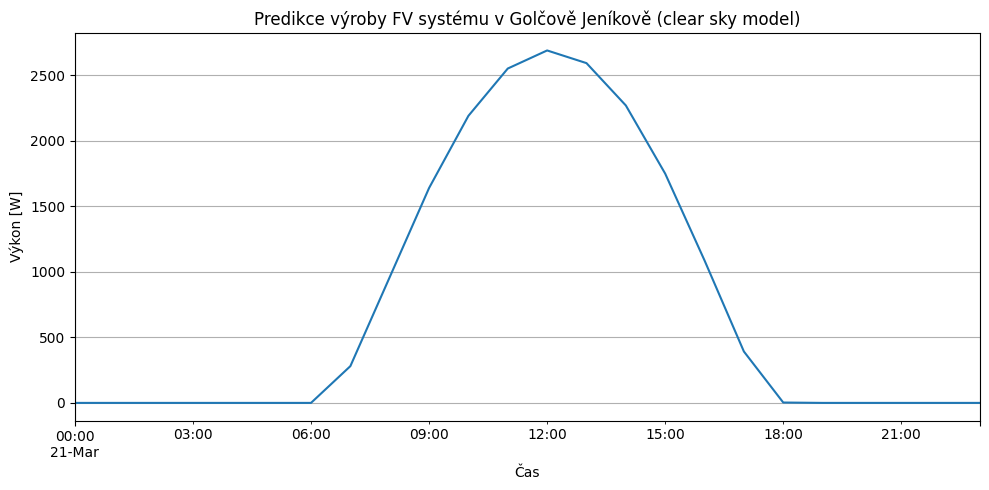

In [ ]:
import pandas as pd
import pvlib
import matplotlib.pyplot as plt

# Souřadnice pro Golčův Jeníkov
latitude = 49.8183494
longitude = 15.4753881
tz = 'Europe/Prague'

# Datum a časový rozsah
times = pd.date_range('2025-03-21 00:00', '2025-03-21 23:00', freq='1h', tz=tz)

# Simulace polohy Slunce
solpos = pvlib.solarposition.get_solarposition(times, latitude, longitude)

# Model jasné oblohy
clearsky = pvlib.location.Location(latitude, longitude, tz=tz).get_clearsky(times)

# Parametry panelu
surface_tilt = 35
surface_azimuth = 180
albedo = 0.2 # odrazivost

# Výpočet dopadající radiace
poa = pvlib.irradiance.get_total_irradiance(
    surface_tilt,
    surface_azimuth,
    solpos['apparent_zenith'],
    solpos['azimuth'],
    clearsky['dni'],
    clearsky['ghi'],
    clearsky['dhi'],
    albedo=albedo
)
poa_irradiance = poa['poa_global']

# Parametry panelu
module_efficiency = 0.18
module_area = 1.7
n_modules = 10

# Výpočet výkonu
power_ac = poa_irradiance * module_efficiency * module_area * n_modules

plt.figure(figsize=(10, 5))
power_ac.plot()
plt.ylabel("Výkon [W]")
plt.xlabel("Čas")
plt.title("Predikce výroby FV systému v Golčově Jeníkově (clear sky model)")
plt.grid()
plt.tight_layout()
plt.show()


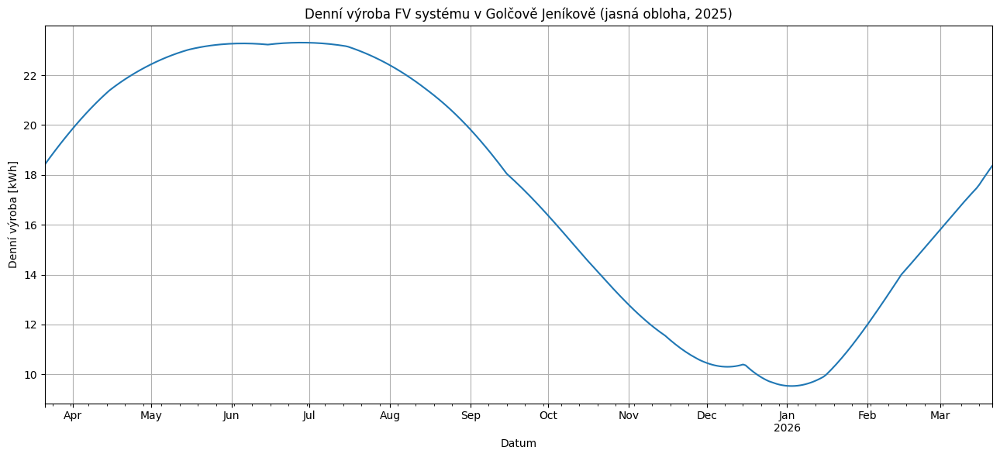

In [ ]:
# 2. obrázek


import pandas as pd
import pvlib
import matplotlib.pyplot as plt

# Souřadnice pro Golčův Jeníkov
latitude = 49.8183494
longitude = 15.4753881
tz = 'Europe/Prague'

# Simulace ode dneška na rok
times = pd.date_range('2025-03-21 00:00', '2026-03-21 23:00', freq='1h', tz=tz)

# Sluneční pozice a model jasné oblohy
solpos = pvlib.solarposition.get_solarposition(times, latitude, longitude)
clearsky = pvlib.location.Location(latitude, longitude, tz=tz).get_clearsky(times)

# Parametry FV systému
surface_tilt = 35
surface_azimuth = 180
albedo = 0.2
module_efficiency = 0.18
module_area = 1.7
n_modules = 10

# Výpočet radiace na panel
poa = pvlib.irradiance.get_total_irradiance(
    surface_tilt,
    surface_azimuth,
    solpos['apparent_zenith'],
    solpos['azimuth'],
    clearsky['dni'],
    clearsky['ghi'],
    clearsky['dhi'],
    albedo=albedo
)
poa_irradiance = poa['poa_global']

# Výpočet hodinového výkonu [W]
power_ac = poa_irradiance * module_efficiency * module_area * n_modules

# Výpočet denní výroby [kWh]
power_df = power_ac.resample('D').sum() / 1000  # součet za den, převod na kWh

# Graf: denní výroba v roce
plt.figure(figsize=(13,6))
power_df.plot()
plt.ylabel('Denní výroba [kWh]')
plt.xlabel('Datum')
plt.title('Denní výroba FV systému v Golčově Jeníkově (jasná obloha, 2025)')
plt.grid(True)
plt.tight_layout()
plt.show()


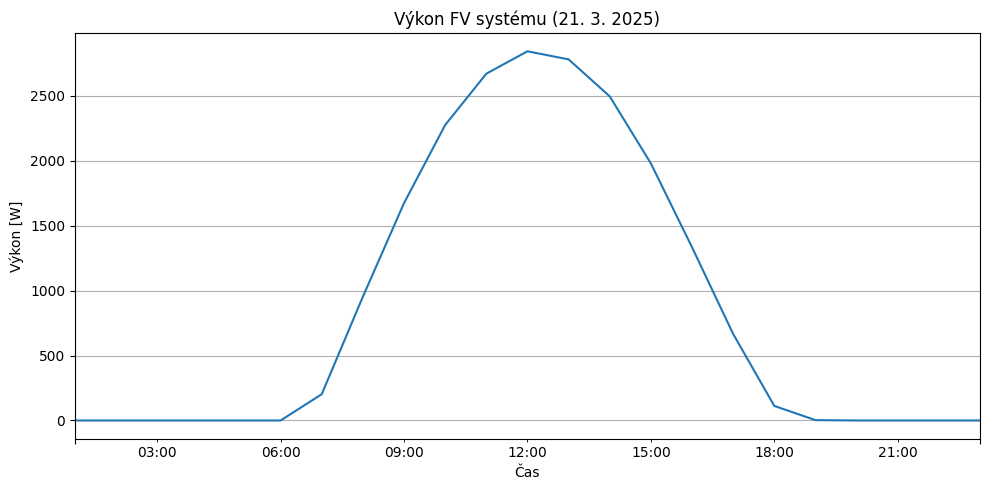

In [ ]:
import pandas as pd
import pvlib
import matplotlib.pyplot as plt

# Nastavení lokality: Golčův Jeníkov
latitude = 49.8183494
longitude = 15.4753881
timezone = 'Europe/Prague'

# Načtení počasí z CSV
weather = pd.read_csv('weather_data.csv', parse_dates=['time'])

# Převod času do lokálního časového pásma
weather['time'] = weather['time'].dt.tz_localize('UTC').dt.tz_convert(timezone)

# Výběr dat pouze pro 30. září 2023
weather = weather[weather['time'].dt.date == pd.Timestamp('2025-03-21').date()]
weather = weather.set_index('time')

# Výpočet pozice Slunce
sun_position = pvlib.solarposition.get_solarposition(
    time=weather.index,
    latitude=latitude,
    longitude=longitude
)

# Parametry panelu a systému
tilt = 35
azimuth = 180
albedo = 0.2

# Výpočet ozáření na povrch panelů
irradiance = pvlib.irradiance.get_total_irradiance(
    surface_tilt=tilt,
    surface_azimuth=azimuth,
    solar_zenith=sun_position['apparent_zenith'],
    solar_azimuth=sun_position['azimuth'],
    dni=weather['direct_normal_irradiance (W/m²)'],
    ghi=weather['shortwave_radiation (W/m²)'],
    dhi=weather['diffuse_radiation (W/m²)'],
    albedo=albedo
)
poa = irradiance['poa_global']

# Parametry FV systému
efficiency = 0.18
panel_area = 1.7
panel_count = 10

# Výpočet výkonu (W)
power = poa * efficiency * panel_area * panel_count

# Vykreslení výsledků
plt.figure(figsize=(10,5))
power.plot()
plt.ylabel('Výkon [W]')
plt.xlabel('Čas')
plt.title('Výkon FV systému (21. 3. 2025)')
plt.grid(True)
plt.tight_layout()
plt.show()

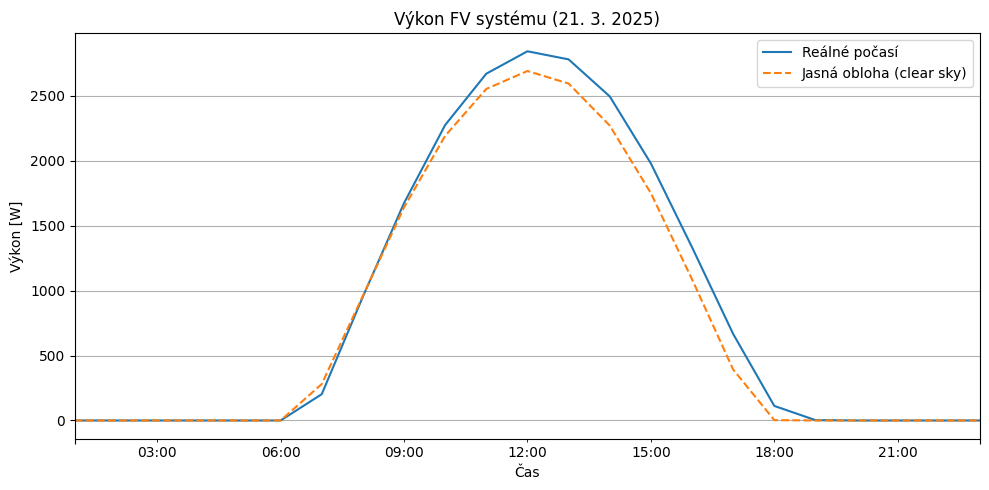

In [ ]:
# 3. obrázek

import pandas as pd
import pvlib
import matplotlib.pyplot as plt

# Nastavení lokality: Golčův Jeníkov
latitude = 49.8183494
longitude = 15.4753881
timezone = 'Europe/Prague'

# Načtení počasí z CSV
weather = pd.read_csv('weather_data.csv', parse_dates=['time'])

# Převod času do lokálního časového pásma
weather['time'] = weather['time'].dt.tz_localize('UTC').dt.tz_convert(timezone)

# Výběr dat pouze pro 21. března 2025
vybrany_datum = pd.Timestamp('2025-03-21').date()
weather = weather[weather['time'].dt.date == vybrany_datum]
weather = weather.set_index('time')

# Výpočet pozice Slunce
sun_position = pvlib.solarposition.get_solarposition(
    time=weather.index,
    latitude=latitude,
    longitude=longitude
)

# Parametry panelu a systému
tilt = 35
azimuth = 180
albedo = 0.2

# Výpočet ozáření na povrch panelů podle reálného počasí
irradiance = pvlib.irradiance.get_total_irradiance(
    surface_tilt=tilt,
    surface_azimuth=azimuth,
    solar_zenith=sun_position['apparent_zenith'],
    solar_azimuth=sun_position['azimuth'],
    dni=weather['direct_normal_irradiance (W/m²)'],
    ghi=weather['shortwave_radiation (W/m²)'],
    dhi=weather['diffuse_radiation (W/m²)'],
    albedo=albedo
)
poa_real = irradiance['poa_global']

# Výpočet ozáření na povrch panelů pro clear sky model
location = pvlib.location.Location(latitude, longitude, tz=timezone)
clearsky = location.get_clearsky(weather.index)
irradiance_cs = pvlib.irradiance.get_total_irradiance(
    surface_tilt=tilt,
    surface_azimuth=azimuth,
    solar_zenith=sun_position['apparent_zenith'],
    solar_azimuth=sun_position['azimuth'],
    dni=clearsky['dni'],
    ghi=clearsky['ghi'],
    dhi=clearsky['dhi'],
    albedo=albedo
)
poa_clearsky = irradiance_cs['poa_global']

# Parametry FV systému
efficiency = 0.18
panel_area = 1.7
panel_count = 10

# Výpočet výkonu (W)
power_real = poa_real * efficiency * panel_area * panel_count
power_clearsky = poa_clearsky * efficiency * panel_area * panel_count

# Vykreslení výsledků
plt.figure(figsize=(10,5))
power_real.plot(label='Reálné počasí')
power_clearsky.plot(label='Jasná obloha (clear sky)', linestyle='--')
plt.ylabel('Výkon [W]')
plt.xlabel('Čas')
plt.title('Výkon FV systému (21. 3. 2025)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# Obrázek 4


import pandas as pd
import pvlib
import matplotlib.pyplot as plt

# Nastavení lokality: Golčův Jeníkov
latitude = 49.8183494
longitude = 15.4753881
timezone = 'Europe/Prague'

# Načtení počasí z CSV
weather = pd.read_csv('weather_data_2024.csv', parse_dates=['time'])

# Převod času do lokálního časového pásma
weather['time'] = weather['time'].dt.tz_localize('UTC').dt.tz_convert(timezone)

# Výběr dat pouze pro rok 2024
start_date = pd.Timestamp('2024-01-01').date()
end_date = pd.Timestamp('2024-12-31').date()
mask = (weather['time'].dt.date >= start_date) & (weather['time'].dt.date <= end_date)
weather = weather[mask]
weather = weather.set_index('time')

# Výpočet pozice Slunce pro každý časový okamžik
sun_position = pvlib.solarposition.get_solarposition(
    time=weather.index,
    latitude=latitude,
    longitude=longitude
)

# Parametry panelu a systému
tilt = 35
azimuth = 180
albedo = 0.2

# Výpočet ozáření na povrch panelů podle reálného počasí
irradiance = pvlib.irradiance.get_total_irradiance(
    surface_tilt=tilt,
    surface_azimuth=azimuth,
    solar_zenith=sun_position['apparent_zenith'],
    solar_azimuth=sun_position['azimuth'],
    dni=weather['direct_normal_irradiance (W/m²)'],
    ghi=weather['shortwave_radiation (W/m²)'],
    dhi=weather['diffuse_radiation (W/m²)'],
    albedo=albedo
)
poa_real = irradiance['poa_global']

# Výpočet ozáření na povrch panelů pro clear sky model
location = pvlib.location.Location(latitude, longitude, tz=timezone)
clearsky = location.get_clearsky(weather.index)
irradiance_cs = pvlib.irradiance.get_total_irradiance(
    surface_tilt=tilt,
    surface_azimuth=azimuth,
    solar_zenith=sun_position['apparent_zenith'],
    solar_azimuth=sun_position['azimuth'],
    dni=clearsky['dni'],
    ghi=clearsky['ghi'],
    dhi=clearsky['dhi'],
    albedo=albedo
)
poa_clearsky = irradiance_cs['poa_global']

# Parametry FV systému
efficiency = 0.18
panel_area = 1.7
panel_count = 10

# Výpočet výkonu (W)
power_real = poa_real * efficiency * panel_area * panel_count
power_clearsky = poa_clearsky * efficiency * panel_area * panel_count

# Výpočet denní výroby [kWh]
daily_real = power_real.resample('D').sum() / 1000
daily_clearsky = power_clearsky.resample('D').sum() / 1000

# Vykreslení výsledků
plt.figure(figsize=(14,6))
daily_real.plot(label='Reálné počasí')
daily_clearsky.plot(label='Jasná obloha (clear sky)', linestyle='--')
plt.ylabel('Denní výroba [kWh]')
plt.xlabel('Datum')
plt.title('Denní výroba FV systému v roce 2024 (Golčův Jeníkov)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Celkové roční součty
print(f"Celková roční výroba (reálné počasí): {daily_real.sum():.1f} kWh")
print(f"Celková roční výroba (jasná obloha): {daily_clearsky.sum():.1f} kWh")

ModuleNotFoundError: No module named 'pvlib'

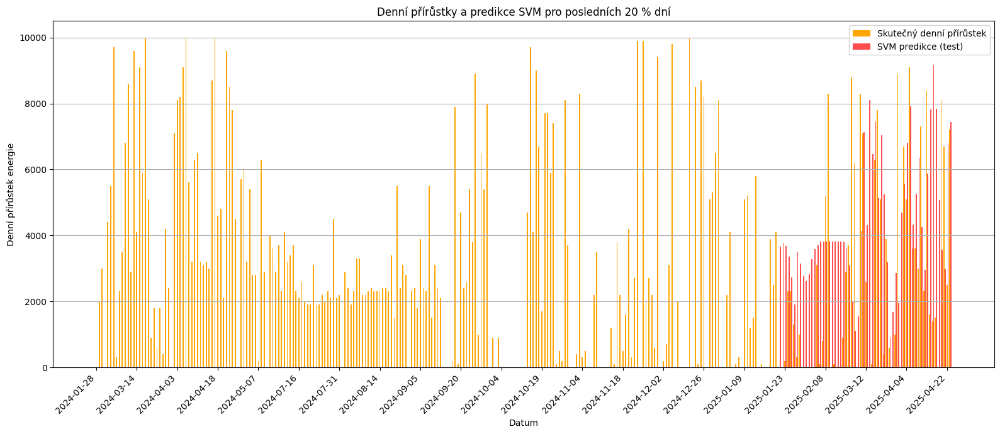

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.svm import SVR
from sklearn.preprocessing import MinMaxScaler

# --- PŘEDZPRACOVÁNÍ DAT (stejně jako v zadání) ---
df = pd.read_csv("all1(in).csv", dtype={"time": str, "value": str})
df["time"] = pd.to_numeric(df["time"], errors="coerce")
df = df[(df["location"] == "Dobrichovice") & (df["name"] == "PV_generated_energy_of_month")].copy()
df = df.dropna(subset=["time", "value"])
df["datetime"] = pd.to_datetime(df["time"].astype("int64"), unit="ns", errors="coerce")
df["value"] = pd.to_numeric(df["value"], errors="coerce")
df = df.dropna(subset=["datetime", "value"]).sort_values("datetime")

min_limit = 0
max_limit = 800000
df = df[(df["value"] >= min_limit) & (df["value"] <= max_limit)]
df["date"] = df["datetime"].dt.date
df_daily_last = df.groupby("date").last().reset_index()
df_daily_last["daily_increment"] = df_daily_last["value"].diff()
df_daily_last["daily_increment"] = df_daily_last["daily_increment"].apply(lambda x: x if x >= 0 else 0)
df_daily_last = df_daily_last.dropna(subset=["daily_increment"])

increment_min = 0
increment_max = 10000
df_daily_last = df_daily_last[(df_daily_last["daily_increment"] >= increment_min) & (df_daily_last["daily_increment"] <= increment_max)]

# --- PŘÍPRAVA FEATURŮ pro SVM ---
df_daily_last["dayofyear"] = pd.to_datetime(df_daily_last["date"]).dt.dayofyear
df_daily_last["month"] = pd.to_datetime(df_daily_last["date"]).dt.month
df_daily_last["weekday"] = pd.to_datetime(df_daily_last["date"]).dt.weekday

features = ["dayofyear", "month", "weekday"]
target = "daily_increment"

scaler = MinMaxScaler()
y = scaler.fit_transform(df_daily_last[[target]])
X = df_daily_last[features].values
dates = df_daily_last["date"].values

# --- TRAIN/TEST SPLIT ---
split_idx = int(len(df_daily_last) * 0.8)
X_train, X_test = X[:split_idx], X[split_idx:]
y_train, y_test = y[:split_idx], y[split_idx:]
dates_train, dates_test = dates[:split_idx], dates[split_idx:]

# --- TRÉNINK A PREDIKCE ---
svm = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.1)
svm.fit(X_train, y_train.ravel())
svm_pred = scaler.inverse_transform(svm.predict(X_test).reshape(-1, 1)).ravel()

# --- JEDEN GRAF ---
plt.figure(figsize=(16, 7))

bar_width = 0.4
indices = np.arange(len(dates))

# Skutečné hodnoty (celé období)
plt.bar(indices, df_daily_last["daily_increment"].values, width=bar_width, color="orange", label="Skutečný denní přírůstek")

# Predikce SVM pro testovací období (posledních 20 %)
indices_test = np.arange(split_idx, len(dates))
plt.bar(indices_test + bar_width, svm_pred, width=bar_width, color="red", alpha=0.7, label="SVM predikce (test)")

plt.title("Denní přírůstky a predikce SVM pro posledních 20 % dní")
plt.xlabel("Datum")
plt.ylabel("Denní přírůstek energie")
plt.xticks(
    indices[::max(1, len(indices)//20)],
    [str(d) for d in dates][::max(1, len(indices)//20)],
    rotation=45,
    ha="right"
)
plt.legend()
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

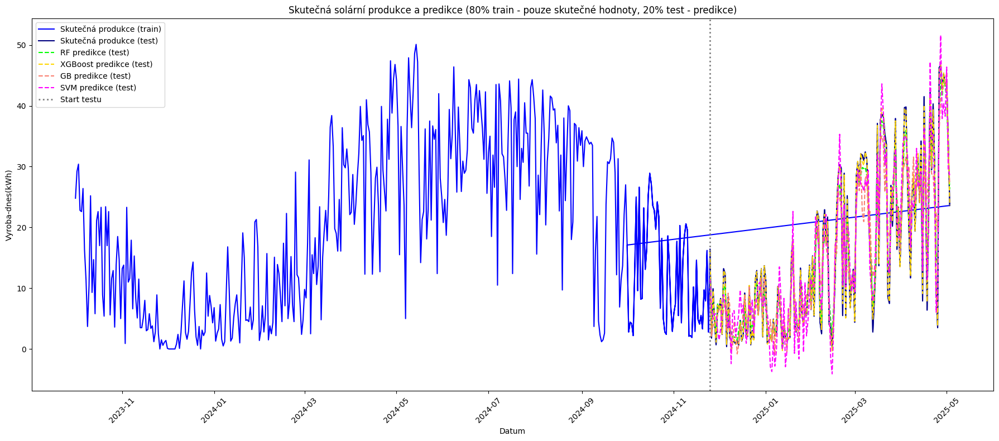

Výsledky na testovací sadě:
Random Forest - MAE: 2.4404, MSE: 10.1993, RMSE: 3.1936
XGBoost - MAE: 0.3220, MSE: 0.2602, RMSE: 0.5101
Gradient Boosting - MAE: 4.0270, MSE: 28.7586, RMSE: 5.3627
SVM - MAE: 4.2261, MSE: 19.7405, RMSE: 4.4430


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
import xgboost as xgb
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Načtení CSV souboru s výrobními daty
file_path_production = 'data_od_strejdy_vse.csv'
data = pd.read_csv(file_path_production, delimiter=';')

# Načtení CSV souboru s počasím
file_path_weather = 'open-meteo-49.81N15.47E380m.csv'
weather_data = pd.read_csv(file_path_weather, delimiter=',')

# Konvertování 'Aktualizovany_cas' a 'time' na datetime
data['Aktualizovany_cas'] = pd.to_datetime(data['Aktualizovany_cas'], errors='coerce')
weather_data['time'] = pd.to_datetime(weather_data['time'], errors='coerce')

# Přejmenování sloupce 'time' na 'Aktualizovany_cas' pro merge
weather_data = weather_data.rename(columns={'time': 'Aktualizovany_cas'})

# Sloučení dat podle 'Aktualizovany_cas'
data = pd.merge(data, weather_data, on='Aktualizovany_cas', how='left')

# --- Přejmenuj sloupce počasí na běžné zkratky ---
data = data.rename(columns={
    'shortwave_radiation (W/m²)': 'GHI',
    'diffuse_radiation (W/m²)': 'DHI',
    'direct_normal_irradiance (W/m²)': 'DNI'
})

# Přidání časových atributů
data['year'] = data['Aktualizovany_cas'].dt.year
data['month'] = data['Aktualizovany_cas'].dt.month
data['day'] = data['Aktualizovany_cas'].dt.day
data['hour'] = data['Aktualizovany_cas'].dt.hour
data['weekday'] = data['Aktualizovany_cas'].dt.weekday

# Filtrovaní záznamů s hodnotou výroby a počasí
data = data.dropna(subset=['Vyroba-dnes(kWh)', 'GHI', 'DHI', 'DNI'])

# Příprava vstupů a výstupů pro dataset
features = ['year', 'month', 'day', 'hour', 'weekday', 'DNI', 'GHI', 'DHI']
X = data[features].values
y = data['Vyroba-dnes(kWh)'].values
dates = data['Aktualizovany_cas'].values

# Normalizace cílové proměnné
scaler_y = MinMaxScaler()
y_scaled = scaler_y.fit_transform(y.reshape(-1, 1)).ravel()

# Rozdělení na 80% trénink a 20% test (časově, ne náhodně)
split_idx = int(len(X) * 0.8)
X_train, X_test = X[:split_idx], X[split_idx:]
y_train, y_test = y_scaled[:split_idx], y_scaled[split_idx:]
dates_train, dates_test = dates[:split_idx], dates[split_idx:]

# Trénuj modely pouze na trénovacích datech, predikuj pouze na testu
# Random Forest
rf = RandomForestRegressor(n_estimators=1000, random_state=42)
rf.fit(X_train, y_train)
rf_pred_test = scaler_y.inverse_transform(rf.predict(X_test).reshape(-1, 1)).ravel()

# XGBoost
xgb_model = xgb.XGBRegressor(n_estimators=1000, learning_rate=0.05, random_state=42)
xgb_model.fit(X_train, y_train)
xgb_pred_test = scaler_y.inverse_transform(xgb_model.predict(X_test).reshape(-1, 1)).ravel()

# Gradient Boosting
gb = GradientBoostingRegressor(n_estimators=1000, learning_rate=0.05, random_state=42)
gb.fit(X_train, y_train)
gb_pred_test = scaler_y.inverse_transform(gb.predict(X_test).reshape(-1, 1)).ravel()

# SVM
svm = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.1)
svm.fit(X_train, y_train)
svm_pred_test = scaler_y.inverse_transform(svm.predict(X_test).reshape(-1, 1)).ravel()

# Skutečné hodnoty v původním měřítku
y_train_orig = scaler_y.inverse_transform(y_train.reshape(-1, 1)).ravel()
y_test_orig = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()

# --- Vykreslení ---
plt.figure(figsize=(18, 8))

# Trénovací část – zobraz pouze skutečná data
plt.plot(dates_train, y_train_orig, label='Skutečná produkce (train)', color='blue')

# Testovací část – zobraz skutečná data a predikce
plt.plot(dates_test, y_test_orig, label='Skutečná produkce (test)', color='navy')
plt.plot(dates_test, rf_pred_test, label='RF predikce (test)', linestyle='--', color='lime')
plt.plot(dates_test, xgb_pred_test, label='XGBoost predikce (test)', linestyle='--', color='gold')
plt.plot(dates_test, gb_pred_test, label='GB predikce (test)', linestyle='--', color='salmon')
plt.plot(dates_test, svm_pred_test, label='SVM predikce (test)', linestyle='--', color='magenta')
plt.axvline(dates_test[0], color='gray', linestyle=':', lw=2, label='Start testu')

plt.xlabel('Datum')
plt.ylabel('Vyroba-dnes(kWh)')
plt.title('Skutečná solární produkce a predikce (80% train - pouze skutečné hodnoty, 20% test - predikce)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

# --- Vyhodnocení testovací části ---
def print_metrics(y_true, y_pred, model_name):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    print(f"{model_name} - MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}")

print("Výsledky na testovací sadě:")
print_metrics(y_test_orig, rf_pred_test, "Random Forest")
print_metrics(y_test_orig, xgb_pred_test, "XGBoost")
print_metrics(y_test_orig, gb_pred_test, "Gradient Boosting")
print_metrics(y_test_orig, svm_pred_test, "SVM")

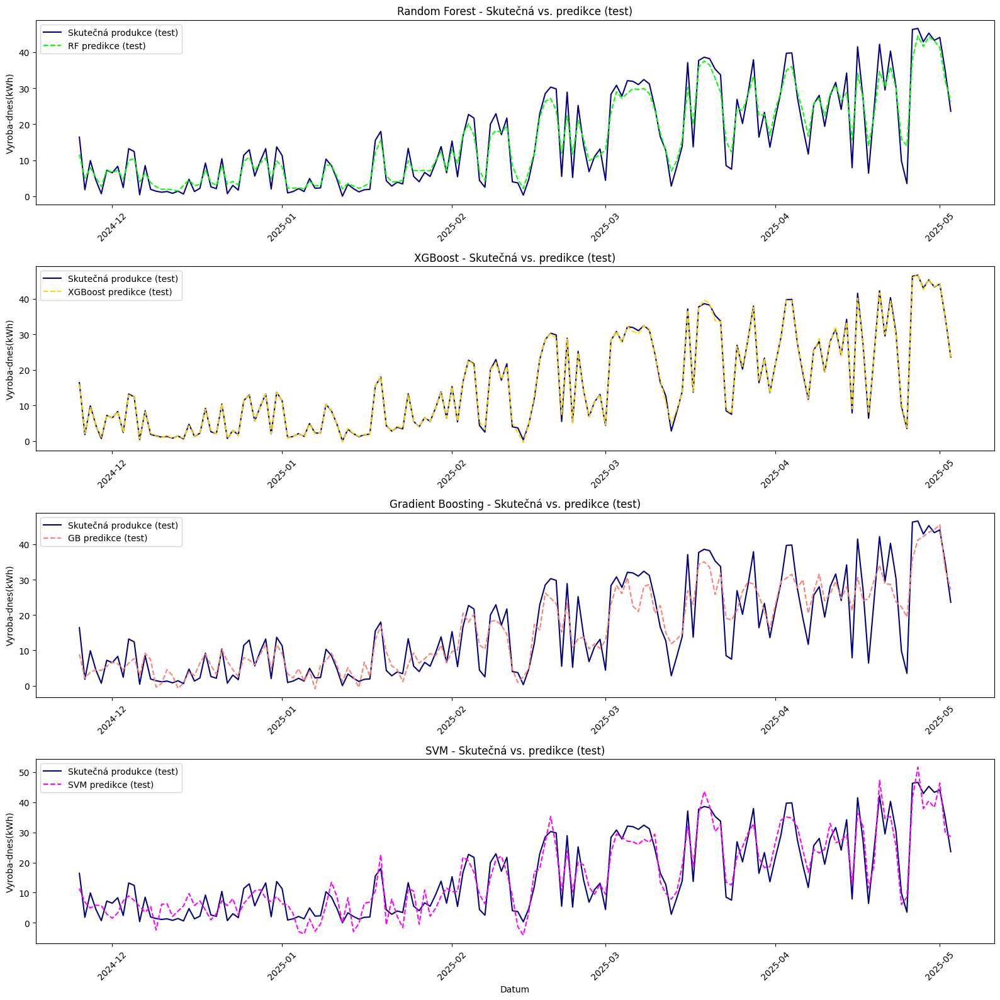

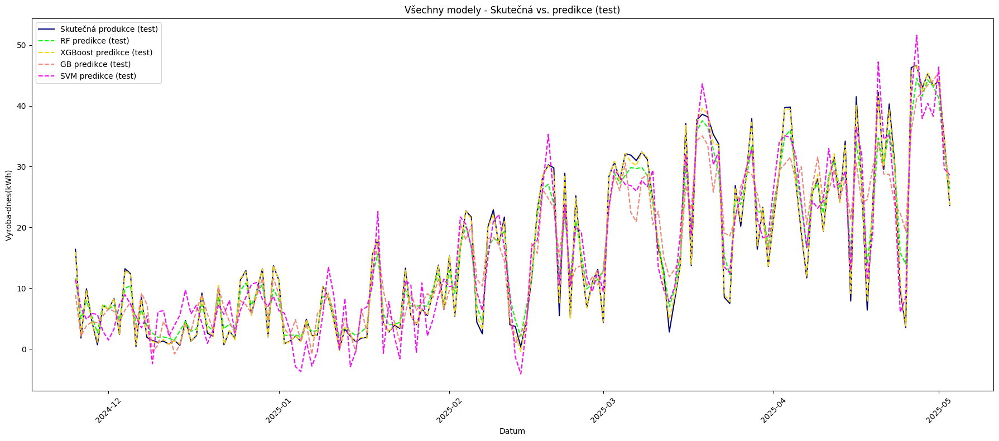

Výsledky na testovací sadě:
Random Forest - MAE: 2.4404, MSE: 10.1993, RMSE: 3.1936
XGBoost - MAE: 0.3220, MSE: 0.2602, RMSE: 0.5101
Gradient Boosting - MAE: 4.0270, MSE: 28.7586, RMSE: 5.3627
SVM - MAE: 4.2261, MSE: 19.7405, RMSE: 4.4430


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
import xgboost as xgb
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Načtení CSV souboru s výrobními daty
file_path_production = 'data_od_strejdy_vse.csv'
data = pd.read_csv(file_path_production, delimiter=';')

# Načtení CSV souboru s počasím
file_path_weather = 'open-meteo-49.81N15.47E380m.csv'
weather_data = pd.read_csv(file_path_weather, delimiter=',')

# Konvertování 'Aktualizovany_cas' a 'time' na datetime
data['Aktualizovany_cas'] = pd.to_datetime(data['Aktualizovany_cas'], errors='coerce')
weather_data['time'] = pd.to_datetime(weather_data['time'], errors='coerce')

# Přejmenování sloupce 'time' na 'Aktualizovany_cas' pro merge
weather_data = weather_data.rename(columns={'time': 'Aktualizovany_cas'})

# Sloučení dat podle 'Aktualizovany_cas'
data = pd.merge(data, weather_data, on='Aktualizovany_cas', how='left')

# --- Přejmenuj sloupce počasí na běžné zkratky ---
data = data.rename(columns={
    'shortwave_radiation (W/m²)': 'GHI',
    'diffuse_radiation (W/m²)': 'DHI',
    'direct_normal_irradiance (W/m²)': 'DNI'
})

# Přidání časových atributů
data['year'] = data['Aktualizovany_cas'].dt.year
data['month'] = data['Aktualizovany_cas'].dt.month
data['day'] = data['Aktualizovany_cas'].dt.day
data['hour'] = data['Aktualizovany_cas'].dt.hour
data['weekday'] = data['Aktualizovany_cas'].dt.weekday

# Filtrovaní záznamů s hodnotou výroby a počasí
data = data.dropna(subset=['Vyroba-dnes(kWh)', 'GHI', 'DHI', 'DNI'])

# Příprava vstupů a výstupů pro dataset
features = ['year', 'month', 'day', 'hour', 'weekday', 'DNI', 'GHI', 'DHI']
X = data[features].values
y = data['Vyroba-dnes(kWh)'].values
dates = data['Aktualizovany_cas'].values

# Normalizace cílové proměnné
scaler_y = MinMaxScaler()
y_scaled = scaler_y.fit_transform(y.reshape(-1, 1)).ravel()

# Rozdělení na 80% trénink a 20% test (časově, ne náhodně)
split_idx = int(len(X) * 0.8)
X_train, X_test = X[:split_idx], X[split_idx:]
y_train, y_test = y_scaled[:split_idx], y_scaled[split_idx:]
dates_train, dates_test = dates[:split_idx], dates[split_idx:]

# Trénuj modely pouze na trénovacích datech, predikuj pouze na testu
# Random Forest
rf = RandomForestRegressor(n_estimators=1000, random_state=42)
rf.fit(X_train, y_train)
rf_pred_test = scaler_y.inverse_transform(rf.predict(X_test).reshape(-1, 1)).ravel()

# XGBoost
xgb_model = xgb.XGBRegressor(n_estimators=1000, learning_rate=0.05, random_state=42)
xgb_model.fit(X_train, y_train)
xgb_pred_test = scaler_y.inverse_transform(xgb_model.predict(X_test).reshape(-1, 1)).ravel()

# Gradient Boosting
gb = GradientBoostingRegressor(n_estimators=1000, learning_rate=0.05, random_state=42)
gb.fit(X_train, y_train)
gb_pred_test = scaler_y.inverse_transform(gb.predict(X_test).reshape(-1, 1)).ravel()

# SVM
svm = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.1)
svm.fit(X_train, y_train)
svm_pred_test = scaler_y.inverse_transform(svm.predict(X_test).reshape(-1, 1)).ravel()

# Skutečné hodnoty v původním měřítku
y_train_orig = scaler_y.inverse_transform(y_train.reshape(-1, 1)).ravel()
y_test_orig = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()

# --- 4 samostatné grafy pro každou metodu ---
plt.figure(figsize=(16, 16))

# 1. Random Forest
plt.subplot(4, 1, 1)
plt.plot(dates_test, y_test_orig, label='Skutečná produkce (test)', color='navy')
plt.plot(dates_test, rf_pred_test, label='RF predikce (test)', linestyle='--', color='lime')
plt.title('Random Forest - Skutečná vs. predikce (test)')
plt.ylabel('Vyroba-dnes(kWh)')
plt.xticks(rotation=45)
plt.legend()

# 2. XGBoost
plt.subplot(4, 1, 2)
plt.plot(dates_test, y_test_orig, label='Skutečná produkce (test)', color='navy')
plt.plot(dates_test, xgb_pred_test, label='XGBoost predikce (test)', linestyle='--', color='gold')
plt.title('XGBoost - Skutečná vs. predikce (test)')
plt.ylabel('Vyroba-dnes(kWh)')
plt.xticks(rotation=45)
plt.legend()

# 3. Gradient Boosting
plt.subplot(4, 1, 3)
plt.plot(dates_test, y_test_orig, label='Skutečná produkce (test)', color='navy')
plt.plot(dates_test, gb_pred_test, label='GB predikce (test)', linestyle='--', color='salmon')
plt.title('Gradient Boosting - Skutečná vs. predikce (test)')
plt.ylabel('Vyroba-dnes(kWh)')
plt.xticks(rotation=45)
plt.legend()

# 4. SVM
plt.subplot(4, 1, 4)
plt.plot(dates_test, y_test_orig, label='Skutečná produkce (test)', color='navy')
plt.plot(dates_test, svm_pred_test, label='SVM predikce (test)', linestyle='--', color='magenta')
plt.title('SVM - Skutečná vs. predikce (test)')
plt.xlabel('Datum')
plt.ylabel('Vyroba-dnes(kWh)')
plt.xticks(rotation=45)
plt.legend()

plt.tight_layout()
plt.show()

# --- 5. graf: všechny predikce a skutečná produkce (jen test) ---
plt.figure(figsize=(18, 8))
plt.plot(dates_test, y_test_orig, label='Skutečná produkce (test)', color='navy')
plt.plot(dates_test, rf_pred_test, label='RF predikce (test)', linestyle='--', color='lime')
plt.plot(dates_test, xgb_pred_test, label='XGBoost predikce (test)', linestyle='--', color='gold')
plt.plot(dates_test, gb_pred_test, label='GB predikce (test)', linestyle='--', color='salmon')
plt.plot(dates_test, svm_pred_test, label='SVM predikce (test)', linestyle='--', color='magenta')
plt.xlabel('Datum')
plt.ylabel('Vyroba-dnes(kWh)')
plt.title('Všechny modely - Skutečná vs. predikce (test)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

# --- Vyhodnocení testovací části ---
def print_metrics(y_true, y_pred, model_name):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    print(f"{model_name} - MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}")

print("Výsledky na testovací sadě:")
print_metrics(y_test_orig, rf_pred_test, "Random Forest")
print_metrics(y_test_orig, xgb_pred_test, "XGBoost")
print_metrics(y_test_orig, gb_pred_test, "Gradient Boosting")
print_metrics(y_test_orig, svm_pred_test, "SVM")

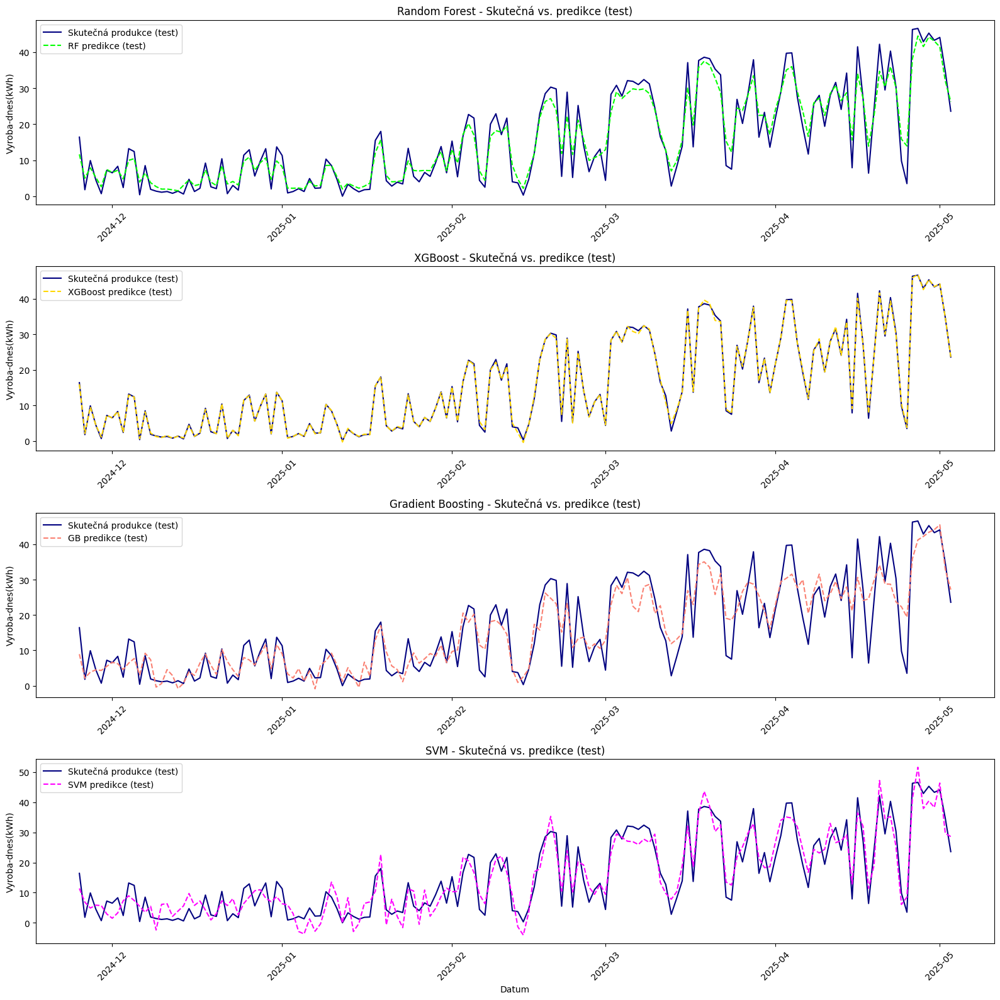

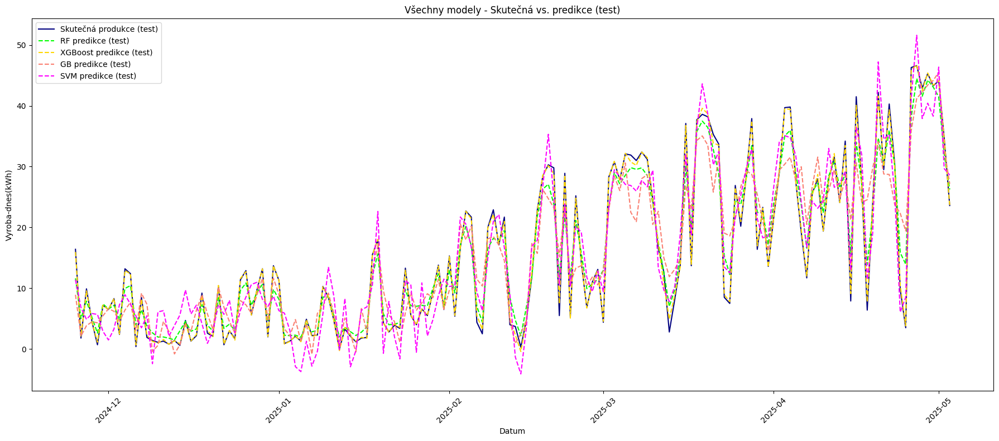

Výsledky na testovací sadě:
Random Forest - MAE: 2.4450, MSE: 10.2141, RMSE: 3.1959
XGBoost - MAE: 0.3220, MSE: 0.2602, RMSE: 0.5101
Gradient Boosting - MAE: 4.0270, MSE: 28.7586, RMSE: 5.3627
SVM - MAE: 4.2261, MSE: 19.7405, RMSE: 4.4430


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
import xgboost as xgb
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Načtení CSV souboru s výrobními daty
file_path_production = 'data_od_strejdy_vse.csv'
data = pd.read_csv(file_path_production, delimiter=';')

# Načtení CSV souboru s počasím
file_path_weather = 'open-meteo-49.81N15.47E380m.csv'
weather_data = pd.read_csv(file_path_weather, delimiter=',')

# Konvertování 'Aktualizovany_cas' a 'time' na datetime
data['Aktualizovany_cas'] = pd.to_datetime(data['Aktualizovany_cas'], errors='coerce')
weather_data['time'] = pd.to_datetime(weather_data['time'], errors='coerce')

# Přejmenování sloupce 'time' na 'Aktualizovany_cas' pro merge
weather_data = weather_data.rename(columns={'time': 'Aktualizovany_cas'})

# Sloučení dat podle 'Aktualizovany_cas'
data = pd.merge(data, weather_data, on='Aktualizovany_cas', how='left')

# --- Přejmenuj sloupce počasí na běžné zkratky ---
data = data.rename(columns={
    'shortwave_radiation (W/m²)': 'GHI',
    'diffuse_radiation (W/m²)': 'DHI',
    'direct_normal_irradiance (W/m²)': 'DNI'
})

# Přidání časových atributů
data['year'] = data['Aktualizovany_cas'].dt.year
data['month'] = data['Aktualizovany_cas'].dt.month
data['day'] = data['Aktualizovany_cas'].dt.day
data['hour'] = data['Aktualizovany_cas'].dt.hour
data['weekday'] = data['Aktualizovany_cas'].dt.weekday

# Filtrovaní záznamů s hodnotou výroby a počasí
data = data.dropna(subset=['Vyroba-dnes(kWh)', 'GHI', 'DHI', 'DNI'])

# Příprava vstupů a výstupů pro dataset
features = ['year', 'month', 'day', 'hour', 'weekday']
X = data[features].values
y = data['Vyroba-dnes(kWh)'].values
dates = data['Aktualizovany_cas'].values

# Normalizace cílové proměnné
scaler_y = MinMaxScaler()
y_scaled = scaler_y.fit_transform(y.reshape(-1, 1)).ravel()

# Rozdělení na 80% trénink a 20% test (časově, ne náhodně)
split_idx = int(len(X) * 0.8)
X_train, X_test = X[:split_idx], X[split_idx:]
y_train, y_test = y_scaled[:split_idx], y_scaled[split_idx:]
dates_train, dates_test = dates[:split_idx], dates[split_idx:]

# Trénuj modely pouze na trénovacích datech, predikuj pouze na testu
# Random Forest
rf = RandomForestRegressor(n_estimators=1000, random_state=42)
rf.fit(X_train, y_train)
rf_pred_test = scaler_y.inverse_transform(rf.predict(X_test).reshape(-1, 1)).ravel()

# XGBoost
xgb_model = xgb.XGBRegressor(n_estimators=1000, learning_rate=0.05, random_state=42)
xgb_model.fit(X_train, y_train)
xgb_pred_test = scaler_y.inverse_transform(xgb_model.predict(X_test).reshape(-1, 1)).ravel()

# Gradient Boosting
gb = GradientBoostingRegressor(n_estimators=1000, learning_rate=0.05, random_state=42)
gb.fit(X_train, y_train)
gb_pred_test = scaler_y.inverse_transform(gb.predict(X_test).reshape(-1, 1)).ravel()

# SVM
svm = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.1)
svm.fit(X_train, y_train)
svm_pred_test = scaler_y.inverse_transform(svm.predict(X_test).reshape(-1, 1)).ravel()

# Skutečné hodnoty v původním měřítku
y_train_orig = scaler_y.inverse_transform(y_train.reshape(-1, 1)).ravel()
y_test_orig = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()

# --- 4 samostatné grafy pro každou metodu ---
plt.figure(figsize=(16, 16))

# 1. Random Forest
plt.subplot(4, 1, 1)
plt.plot(dates_test, y_test_orig, label='Skutečná produkce (test)', color='navy')
plt.plot(dates_test, rf_pred_test, label='RF predikce (test)', linestyle='--', color='lime')
plt.title('Random Forest - Skutečná vs. predikce (test)')
plt.ylabel('Vyroba-dnes(kWh)')
plt.xticks(rotation=45)
plt.legend()

# 2. XGBoost
plt.subplot(4, 1, 2)
plt.plot(dates_test, y_test_orig, label='Skutečná produkce (test)', color='navy')
plt.plot(dates_test, xgb_pred_test, label='XGBoost predikce (test)', linestyle='--', color='gold')
plt.title('XGBoost - Skutečná vs. predikce (test)')
plt.ylabel('Vyroba-dnes(kWh)')
plt.xticks(rotation=45)
plt.legend()

# 3. Gradient Boosting
plt.subplot(4, 1, 3)
plt.plot(dates_test, y_test_orig, label='Skutečná produkce (test)', color='navy')
plt.plot(dates_test, gb_pred_test, label='GB predikce (test)', linestyle='--', color='salmon')
plt.title('Gradient Boosting - Skutečná vs. predikce (test)')
plt.ylabel('Vyroba-dnes(kWh)')
plt.xticks(rotation=45)
plt.legend()

# 4. SVM
plt.subplot(4, 1, 4)
plt.plot(dates_test, y_test_orig, label='Skutečná produkce (test)', color='navy')
plt.plot(dates_test, svm_pred_test, label='SVM predikce (test)', linestyle='--', color='magenta')
plt.title('SVM - Skutečná vs. predikce (test)')
plt.xlabel('Datum')
plt.ylabel('Vyroba-dnes(kWh)')
plt.xticks(rotation=45)
plt.legend()

plt.tight_layout()
plt.show()

# --- 5. graf: všechny predikce a skutečná produkce (jen test) ---
plt.figure(figsize=(18, 8))
plt.plot(dates_test, y_test_orig, label='Skutečná produkce (test)', color='navy')
plt.plot(dates_test, rf_pred_test, label='RF predikce (test)', linestyle='--', color='lime')
plt.plot(dates_test, xgb_pred_test, label='XGBoost predikce (test)', linestyle='--', color='gold')
plt.plot(dates_test, gb_pred_test, label='GB predikce (test)', linestyle='--', color='salmon')
plt.plot(dates_test, svm_pred_test, label='SVM predikce (test)', linestyle='--', color='magenta')
plt.xlabel('Datum')
plt.ylabel('Vyroba-dnes(kWh)')
plt.title('Všechny modely - Skutečná vs. predikce (test)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

# --- Vyhodnocení testovací části ---
def print_metrics(y_true, y_pred, model_name):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    print(f"{model_name} - MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}")

print("Výsledky na testovací sadě:")
print_metrics(y_test_orig, rf_pred_test, "Random Forest")
print_metrics(y_test_orig, xgb_pred_test, "XGBoost")
print_metrics(y_test_orig, gb_pred_test, "Gradient Boosting")
print_metrics(y_test_orig, svm_pred_test, "SVM")

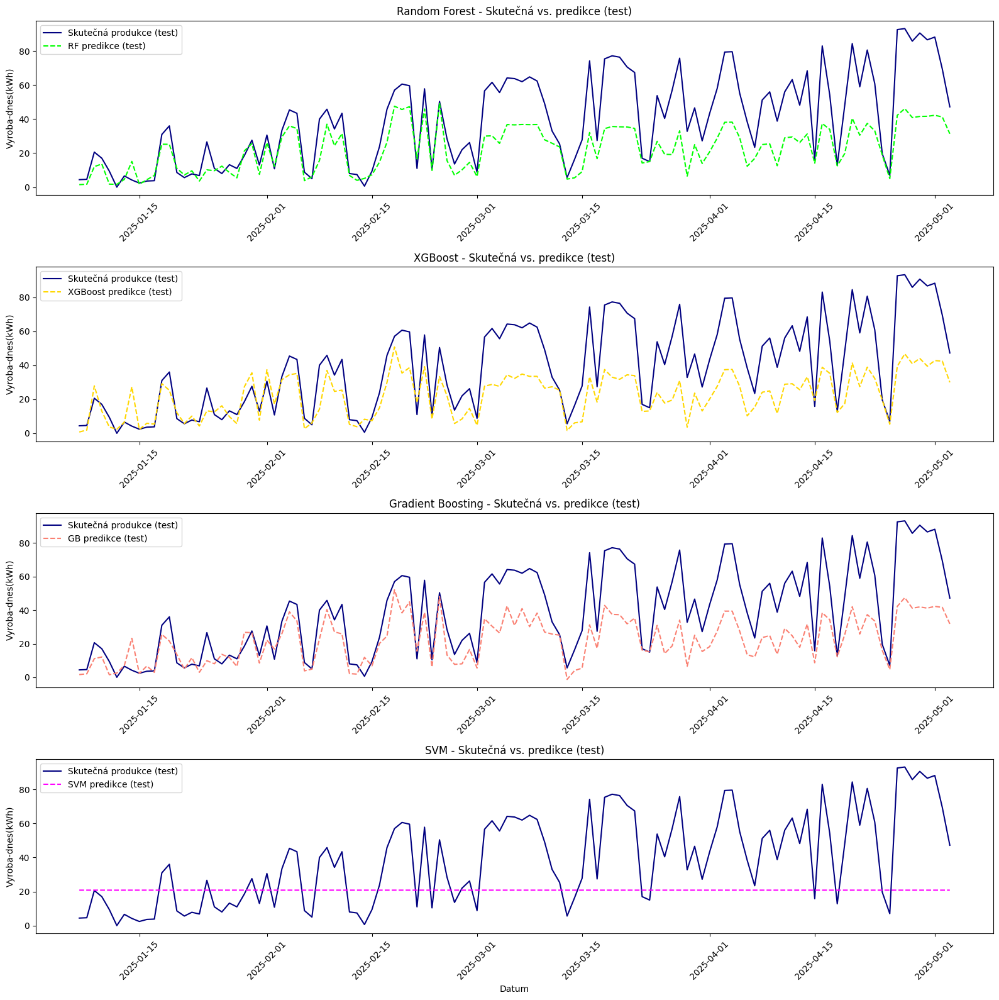

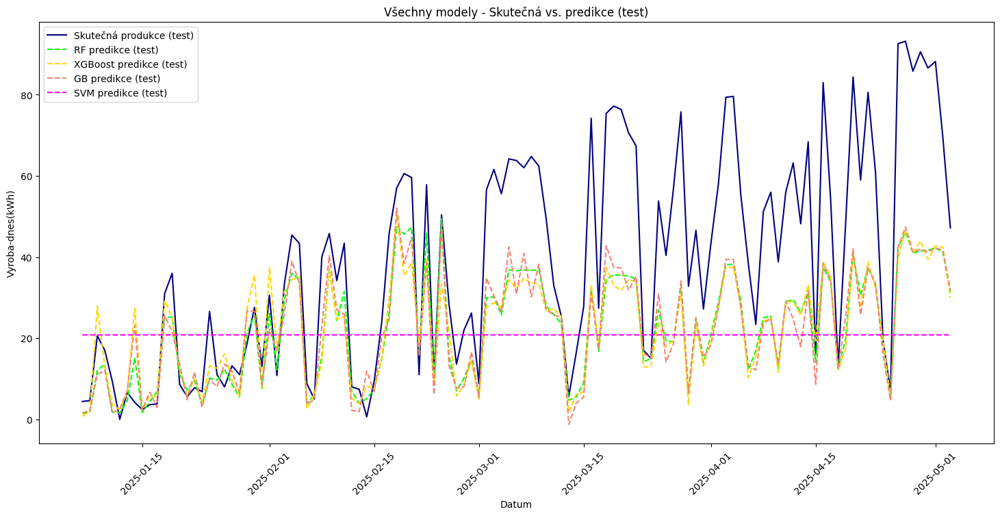

Výsledky na testovací sadě:
Random Forest - MAE: 17.3166, MSE: 521.7239, RMSE: 22.8413
XGBoost - MAE: 18.3573, MSE: 560.4168, RMSE: 23.6731
Gradient Boosting - MAE: 17.8842, MSE: 531.1261, RMSE: 23.0462
SVM - MAE: 25.8767, MSE: 1036.8080, RMSE: 32.1995


In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
import xgboost as xgb
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt

# Načti počasí a spočítej denní sumy
weather_data = pd.read_csv('open-meteo-49.81N15.47E380m.csv', delimiter=',')
weather_data['time'] = pd.to_datetime(weather_data['time'], errors='coerce')
weather_data = weather_data.rename(columns={
    'shortwave_radiation (W/m²)': 'GHI',
    'diffuse_radiation (W/m²)': 'DHI',
    'direct_normal_irradiance (W/m²)': 'DNI'
})
weather_data['date'] = weather_data['time'].dt.date
daily_weather = weather_data.groupby('date')[['GHI', 'DHI', 'DNI']].sum().reset_index()

# Načti výrobu a spočítej denní součet
prod_data = pd.read_csv('data_od_strejdy_vse.csv', delimiter=';')
prod_data['Aktualizovany_cas'] = pd.to_datetime(prod_data['Aktualizovany_cas'], errors='coerce')
prod_data = prod_data.dropna(subset=['Vyroba-dnes(kWh)'])
prod_data['date'] = prod_data['Aktualizovany_cas'].dt.date
daily_prod = prod_data.groupby('date')['Vyroba-dnes(kWh)'].sum().reset_index()

# Merge pouze podle datumu
df = pd.merge(daily_prod, daily_weather, on='date', how='inner').sort_values('date')

# Vstupy a výstupy
features = ['GHI', 'DHI', 'DNI']
X = df[features].values
y = df['Vyroba-dnes(kWh)'].values
dates = df['date'].values


# Normalizace cílové proměnné
scaler_y = MinMaxScaler()
y_scaled = scaler_y.fit_transform(y.reshape(-1, 1)).ravel()

# Rozdělení na 80% trénink a 20% test (časově, ne náhodně)
split_idx = int(len(X) * 0.8)
X_train, X_test = X[:split_idx], X[split_idx:]
y_train, y_test = y_scaled[:split_idx], y_scaled[split_idx:]
dates_train, dates_test = dates[:split_idx], dates[split_idx:]

# Trénuj modely pouze na trénovacích datech, predikuj pouze na testu
# Random Forest
rf = RandomForestRegressor(n_estimators=1000, random_state=42)
rf.fit(X_train, y_train)
rf_pred_test = scaler_y.inverse_transform(rf.predict(X_test).reshape(-1, 1)).ravel()

# XGBoost
xgb_model = xgb.XGBRegressor(n_estimators=1000, learning_rate=0.05, random_state=42)
xgb_model.fit(X_train, y_train)
xgb_pred_test = scaler_y.inverse_transform(xgb_model.predict(X_test).reshape(-1, 1)).ravel()

# Gradient Boosting
gb = GradientBoostingRegressor(n_estimators=1000, learning_rate=0.05, random_state=42)
gb.fit(X_train, y_train)
gb_pred_test = scaler_y.inverse_transform(gb.predict(X_test).reshape(-1, 1)).ravel()

# SVM
svm = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.1)
svm.fit(X_train, y_train)
svm_pred_test = scaler_y.inverse_transform(svm.predict(X_test).reshape(-1, 1)).ravel()

# Skutečné hodnoty v původním měřítku
y_train_orig = scaler_y.inverse_transform(y_train.reshape(-1, 1)).ravel()
y_test_orig = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()

# --- 4 samostatné grafy pro každou metodu ---
plt.figure(figsize=(16, 16))

# 1. Random Forest
plt.subplot(4, 1, 1)
plt.plot(dates_test, y_test_orig, label='Skutečná produkce (test)', color='navy')
plt.plot(dates_test, rf_pred_test, label='RF predikce (test)', linestyle='--', color='lime')
plt.title('Random Forest - Skutečná vs. predikce (test)')
plt.ylabel('Vyroba-dnes(kWh)')
plt.xticks(rotation=45)
plt.legend()

# 2. XGBoost
plt.subplot(4, 1, 2)
plt.plot(dates_test, y_test_orig, label='Skutečná produkce (test)', color='navy')
plt.plot(dates_test, xgb_pred_test, label='XGBoost predikce (test)', linestyle='--', color='gold')
plt.title('XGBoost - Skutečná vs. predikce (test)')
plt.ylabel('Vyroba-dnes(kWh)')
plt.xticks(rotation=45)
plt.legend()

# 3. Gradient Boosting
plt.subplot(4, 1, 3)
plt.plot(dates_test, y_test_orig, label='Skutečná produkce (test)', color='navy')
plt.plot(dates_test, gb_pred_test, label='GB predikce (test)', linestyle='--', color='salmon')
plt.title('Gradient Boosting - Skutečná vs. predikce (test)')
plt.ylabel('Vyroba-dnes(kWh)')
plt.xticks(rotation=45)
plt.legend()

# 4. SVM
plt.subplot(4, 1, 4)
plt.plot(dates_test, y_test_orig, label='Skutečná produkce (test)', color='navy')
plt.plot(dates_test, svm_pred_test, label='SVM predikce (test)', linestyle='--', color='magenta')
plt.title('SVM - Skutečná vs. predikce (test)')
plt.xlabel('Datum')
plt.ylabel('Vyroba-dnes(kWh)')
plt.xticks(rotation=45)
plt.legend()

plt.tight_layout()
plt.show()

# --- 5. graf: všechny predikce a skutečná produkce (jen test) ---
plt.figure(figsize=(18, 8))
plt.plot(dates_test, y_test_orig, label='Skutečná produkce (test)', color='navy')
plt.plot(dates_test, rf_pred_test, label='RF predikce (test)', linestyle='--', color='lime')
plt.plot(dates_test, xgb_pred_test, label='XGBoost predikce (test)', linestyle='--', color='gold')
plt.plot(dates_test, gb_pred_test, label='GB predikce (test)', linestyle='--', color='salmon')
plt.plot(dates_test, svm_pred_test, label='SVM predikce (test)', linestyle='--', color='magenta')
plt.xlabel('Datum')
plt.ylabel('Vyroba-dnes(kWh)')
plt.title('Všechny modely - Skutečná vs. predikce (test)')
plt.xticks(rotation=45)
plt.legend()
plt.show()

# --- Vyhodnocení testovací části ---
def print_metrics(y_true, y_pred, model_name):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    print(f"{model_name} - MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}")

print("Výsledky na testovací sadě:")
print_metrics(y_test_orig, rf_pred_test, "Random Forest")
print_metrics(y_test_orig, xgb_pred_test, "XGBoost")
print_metrics(y_test_orig, gb_pred_test, "Gradient Boosting")
print_metrics(y_test_orig, svm_pred_test, "SVM")

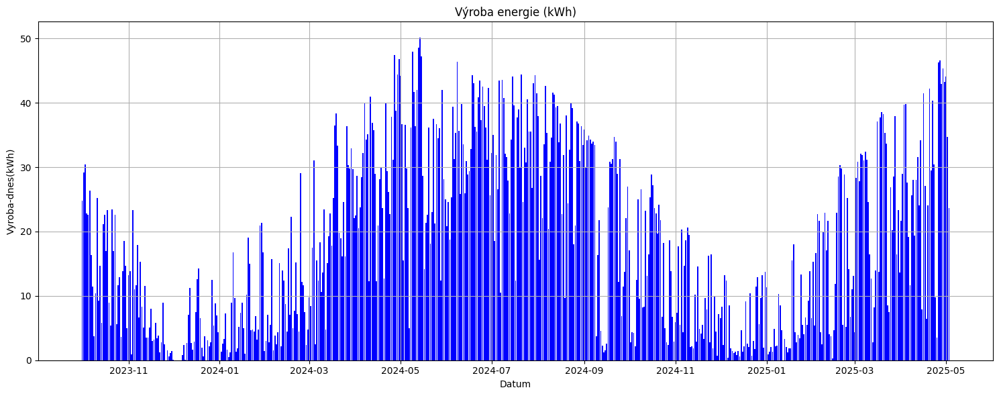

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Načtení CSV souboru
file_path = 'data_od_strejdy_vse.csv'  # případně uprav cestu k souboru
data = pd.read_csv(file_path, delimiter=';')

# Převod sloupce s časem na datetime (předpokládám sloupec 'Aktualizovany_cas')
data['Aktualizovany_cas'] = pd.to_datetime(data['Aktualizovany_cas'], errors='coerce')

# Filtrování na záznamy, kde je výrobní hodnota
data = data.dropna(subset=['Vyroba-dnes(kWh)'])


# Vykreslení samotných dat jako sloupcový graf
plt.figure(figsize=(15, 6))
plt.bar(data['Aktualizovany_cas'], data['Vyroba-dnes(kWh)'], color='blue', width=0.8)
plt.xlabel('Datum')
plt.ylabel('Vyroba-dnes(kWh)')
plt.title('Výroba energie (kWh)')
plt.grid(True)
plt.tight_layout()
plt.show()

<Figure size 1600x1600 with 0 Axes>

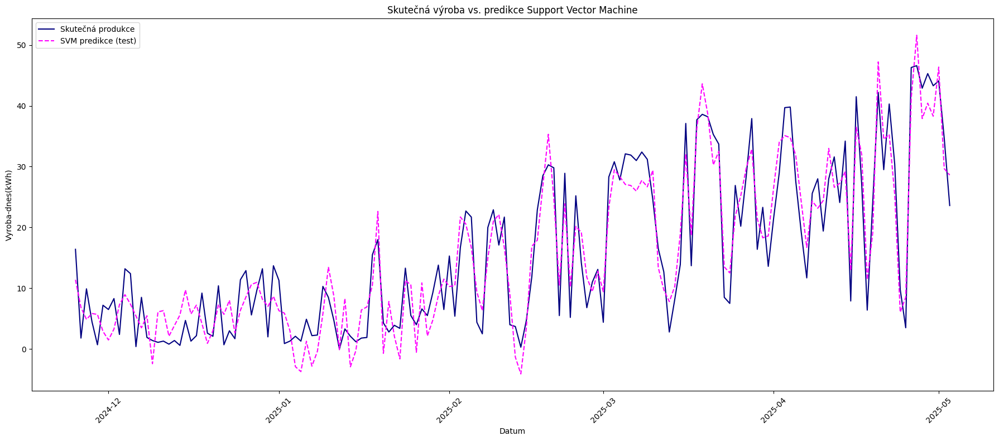

Výsledky na testovací sadě:
Random Forest - MAE: 2.4404, MSE: 10.1993, RMSE: 3.1936
XGBoost - MAE: 0.3220, MSE: 0.2602, RMSE: 0.5101
Gradient Boosting - MAE: 4.0270, MSE: 28.7586, RMSE: 5.3627
SVM - MAE: 4.2261, MSE: 19.7405, RMSE: 4.4430


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
import xgboost as xgb
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Načtení CSV souboru s výrobními daty
file_path_production = 'data_od_strejdy_vse.csv'
data = pd.read_csv(file_path_production, delimiter=';')

# Načtení CSV souboru s počasím
file_path_weather = 'open-meteo-49.81N15.47E380m.csv'
weather_data = pd.read_csv(file_path_weather, delimiter=',')

# Konvertování 'Aktualizovany_cas' a 'time' na datetime
data['Aktualizovany_cas'] = pd.to_datetime(data['Aktualizovany_cas'], errors='coerce')
weather_data['time'] = pd.to_datetime(weather_data['time'], errors='coerce')

# Přejmenování sloupce 'time' na 'Aktualizovany_cas' pro merge
weather_data = weather_data.rename(columns={'time': 'Aktualizovany_cas'})

# Sloučení dat podle 'Aktualizovany_cas'
data = pd.merge(data, weather_data, on='Aktualizovany_cas', how='left')

# --- Přejmenuj sloupce počasí na běžné zkratky ---
data = data.rename(columns={
    'shortwave_radiation (W/m²)': 'GHI',
    'diffuse_radiation (W/m²)': 'DHI',
    'direct_normal_irradiance (W/m²)': 'DNI'
})

# Přidání časových atributů
data['year'] = data['Aktualizovany_cas'].dt.year
data['month'] = data['Aktualizovany_cas'].dt.month
data['day'] = data['Aktualizovany_cas'].dt.day
data['hour'] = data['Aktualizovany_cas'].dt.hour
data['weekday'] = data['Aktualizovany_cas'].dt.weekday

# Filtrovaní záznamů s hodnotou výroby a počasí
data = data.dropna(subset=['Vyroba-dnes(kWh)', 'GHI', 'DHI', 'DNI'])

# Příprava vstupů a výstupů pro dataset
features = ['year', 'month', 'day', 'hour', 'weekday', 'DNI', 'GHI', 'DHI']
X = data[features].values
y = data['Vyroba-dnes(kWh)'].values
dates = data['Aktualizovany_cas'].values

# Normalizace cílové proměnné
scaler_y = MinMaxScaler()
y_scaled = scaler_y.fit_transform(y.reshape(-1, 1)).ravel()

# Rozdělení na 80% trénink a 20% test (časově, ne náhodně)
split_idx = int(len(X) * 0.8)
X_train, X_test = X[:split_idx], X[split_idx:]
y_train, y_test = y_scaled[:split_idx], y_scaled[split_idx:]
dates_train, dates_test = dates[:split_idx], dates[split_idx:]

# Trénuj modely pouze na trénovacích datech, predikuj pouze na testu
# Random Forest
rf = RandomForestRegressor(n_estimators=1000, random_state=42)
rf.fit(X_train, y_train)
rf_pred_test = scaler_y.inverse_transform(rf.predict(X_test).reshape(-1, 1)).ravel()

# XGBoost
xgb_model = xgb.XGBRegressor(n_estimators=1000, learning_rate=0.05, random_state=42)
xgb_model.fit(X_train, y_train)
xgb_pred_test = scaler_y.inverse_transform(xgb_model.predict(X_test).reshape(-1, 1)).ravel()

# Gradient Boosting
gb = GradientBoostingRegressor(n_estimators=1000, learning_rate=0.05, random_state=42)
gb.fit(X_train, y_train)
gb_pred_test = scaler_y.inverse_transform(gb.predict(X_test).reshape(-1, 1)).ravel()

# SVM
svm = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.1)
svm.fit(X_train, y_train)
svm_pred_test = scaler_y.inverse_transform(svm.predict(X_test).reshape(-1, 1)).ravel()

# Skutečné hodnoty v původním měřítku
y_train_orig = scaler_y.inverse_transform(y_train.reshape(-1, 1)).ravel()
y_test_orig = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()

# --- 4 samostatné grafy pro každou metodu ---
plt.figure(figsize=(16, 16))


# --- 5. graf: všechny predikce a skutečná produkce (jen test) ---
plt.figure(figsize=(18, 8))
plt.plot(dates_test, y_test_orig, label='Skutečná produkce', color='navy')
#plt.plot(dates_test, rf_pred_test, label='RF predikce', linestyle='--', color='red')
#plt.plot(dates_test, xgb_pred_test, label='XGBoost predikce', linestyle='--', color='gold')
#plt.plot(dates_test, gb_pred_test, label='GB predikce', linestyle='--', color='salmon')
plt.plot(dates_test, svm_pred_test, label='SVM predikce (test)', linestyle='--', color='magenta')
plt.xlabel('Datum')
plt.ylabel('Vyroba-dnes(kWh)')
plt.title('Skutečná výroba vs. predikce Support Vector Machine')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

# --- Vyhodnocení testovací části ---
def print_metrics(y_true, y_pred, model_name):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    print(f"{model_name} - MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}")

print("Výsledky na testovací sadě:")
print_metrics(y_test_orig, rf_pred_test, "Random Forest")
print_metrics(y_test_orig, xgb_pred_test, "XGBoost")
print_metrics(y_test_orig, gb_pred_test, "Gradient Boosting")
print_metrics(y_test_orig, svm_pred_test, "SVM")

<ipython-input-77-3d397d23ce06>:64: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  weather_datetimes = pd.date_range(start=missing_days.min(), end=missing_days.max() + pd.Timedelta(days=1), freq="H", tz=tz)


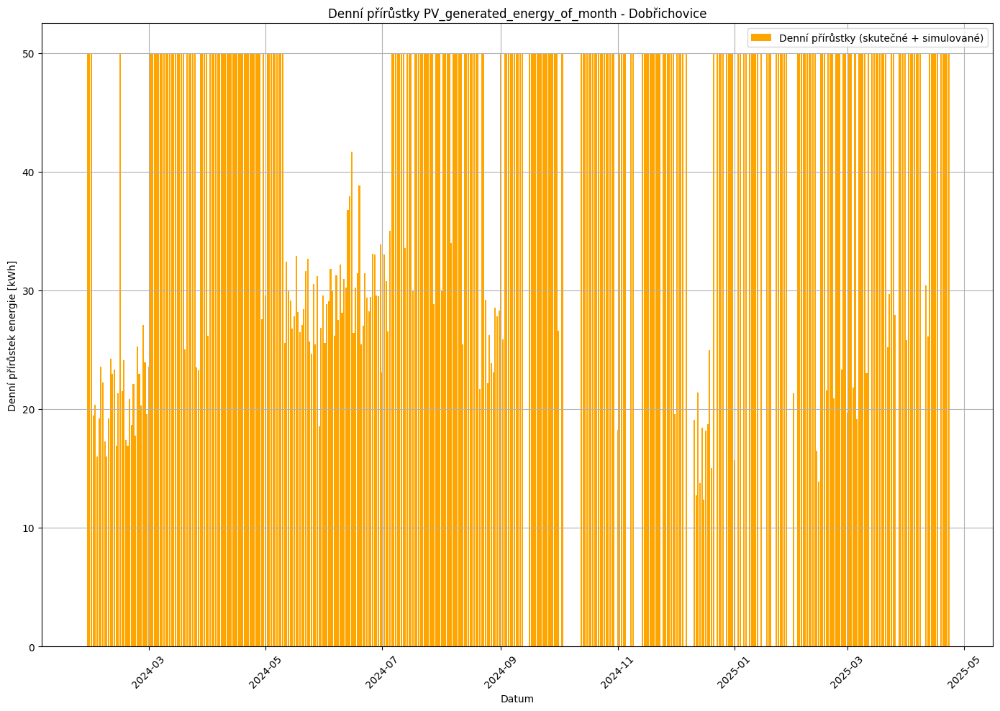

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pvlib

# Parametry pro FV panel HiKu6 Mono PERC
panel_params = {
    'pmp': 530,         # jmenovitý výkon [W]
    'gamma_r': -0.0037, # teplotní koeficient [%/°C]
    'vmp': 40.5,        # napětí při max. výkonu [V]
    'imp': 13.1,        # proud při max. výkonu [A]
    'voc': 48.0,        # napětí naprázdno [V]
    'isc': 14.0         # zkratový proud [A]
}

# Počet panelů
number_of_panels = 8

# Souřadnice místa: Dobřichovice
lat = 49.9340
lon = 14.2748
tz = 'Europe/Prague'

# Načti CSV s přetypováním
df = pd.read_csv("all1(in).csv", dtype={"time": str, "value": str})

# Převeď sloupec "time" na čísla
df["time"] = pd.to_numeric(df["time"], errors="coerce")

# Vyfiltruj jen záznamy pro Dobrichovice a měření 'PV_generated_energy_of_month'
df = df[(df["location"] == "Dobrichovice") & (df["name"] == "PV_generated_energy_of_month")].copy()

# Odstraň NaN hodnoty
df = df.dropna(subset=["time", "value"])

# Převod z nanosekund (ns) na datetime
df["datetime"] = pd.to_datetime(df["time"].astype("int64"), unit="ns", errors="coerce")

# Převeď hodnoty na čísla
df["value"] = pd.to_numeric(df["value"], errors="coerce")

# Odstraň neplatné řádky a seřaď podle času
df = df.dropna(subset=["datetime", "value"]).sort_values("datetime")

# Vytvoř sloupec "date" s pouze datem
df["date"] = df["datetime"].dt.date

# --- Výpočet denních přírůstků z kumulovaných hodnot ---
df = df.sort_values("date")
df_daily = df.groupby("date")["value"].max().diff().fillna(0)
df_daily = df_daily[df_daily >= 0]  # odstraníme záporné přírůstky (možné restarty měřidla apod.)
df_daily = df_daily.rename("daily_increment")
df_daily = df_daily.reset_index()

# Identifikace chybějících dnů
full_date_range = pd.date_range(start=df_daily["date"].min(), end=df_daily["date"].max(), freq="D")
existing_dates = pd.to_datetime(df_daily["date"].unique())
missing_days = full_date_range.difference(existing_dates)

# === Simulace pomocí reálných meteorologických dat ===
simulated_records = []
if not missing_days.empty:
    # Simulovaná data počasí pro chybějící dny (ukázka - v praxi doplň reálnými daty!)
    weather_datetimes = pd.date_range(start=missing_days.min(), end=missing_days.max() + pd.Timedelta(days=1), freq="H", tz=tz)
    weather_data = pd.DataFrame({
        'datetime': weather_datetimes,
        'dni': np.random.uniform(0, 800, size=len(weather_datetimes)),
        'ghi': np.random.uniform(0, 1000, size=len(weather_datetimes)),
        'dhi': np.random.uniform(0, 500, size=len(weather_datetimes))
    }).set_index('datetime')

    tilt = 35
    azimuth_panel = 180

    for missing_day in missing_days:
        times = pd.date_range(start=missing_day, periods=24, freq="h", tz=tz)
        solpos = pvlib.solarposition.get_solarposition(times, latitude=lat, longitude=lon)
        daylight = solpos['apparent_elevation'] > 0
        times_daylight = times[daylight]

        if times_daylight.empty:
            continue

        weather_day = weather_data.loc[weather_data.index.date == missing_day.date()]
        if weather_day.empty:
            continue

        poa = pvlib.irradiance.get_total_irradiance(
            surface_tilt=tilt,
            surface_azimuth=azimuth_panel,
            dni=weather_day['dni'].reindex(times_daylight, fill_value=0),
            ghi=weather_day['ghi'].reindex(times_daylight, fill_value=0),
            dhi=weather_day['dhi'].reindex(times_daylight, fill_value=0),
            solar_zenith=solpos.loc[daylight, 'apparent_zenith'],
            solar_azimuth=solpos.loc[daylight, 'azimuth']
        )

        irradiance = poa['poa_global'].fillna(0)
        # Výkon panelu v každé hodině (W -> kWh), panel_params['pmp'] je maximální výkon,
        # použijeme jednoduchý model: podíl poa k max GHI krát pmp krát počet panelů
        # (v reálu použij vhodnější model, např. pvlib.pvsystem)
        # Zde předpokládáme ideální převod (pro ilustraci)
        simulated_energy = (irradiance.sum() / 1000) * number_of_panels * (panel_params['pmp'] / 1000) # kWh

        simulated_records.append({
            'date': missing_day.date(),
            'daily_increment': simulated_energy
        })

# --- Sloučení skutečných a simulovaných denních přírůstků ---
df_daily_full = df_daily.copy()
if simulated_records:
    simulated_df = pd.DataFrame(simulated_records)
    df_daily_full = pd.concat([df_daily_full, simulated_df], ignore_index=True).sort_values("date")

# --- Ořezání extrémních hodnot ---
max_daily_kwh = 50  # nastav maximální rozumný denní přírůstek (např. 50 kWh)
df_daily_full["daily_increment"] = df_daily_full["daily_increment"].clip(upper=max_daily_kwh)

# --- Vykreslení grafu ---
plt.figure(figsize=(14, 10))
plt.bar(df_daily_full["date"], df_daily_full["daily_increment"], color="orange", label="Denní přírůstky (skutečné + simulované)")
plt.title("Doplnění datasetu pomocí PVlib")
plt.xlabel("Datum")
plt.ylabel("Denní přírůstek energie [kWh]")
plt.grid(True)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

Index(['time', 'temperature_2m (°C)', 'shortwave_radiation (W/m²)',
       'diffuse_radiation (W/m²)', 'direct_normal_irradiance (W/m²)'],
      dtype='object')


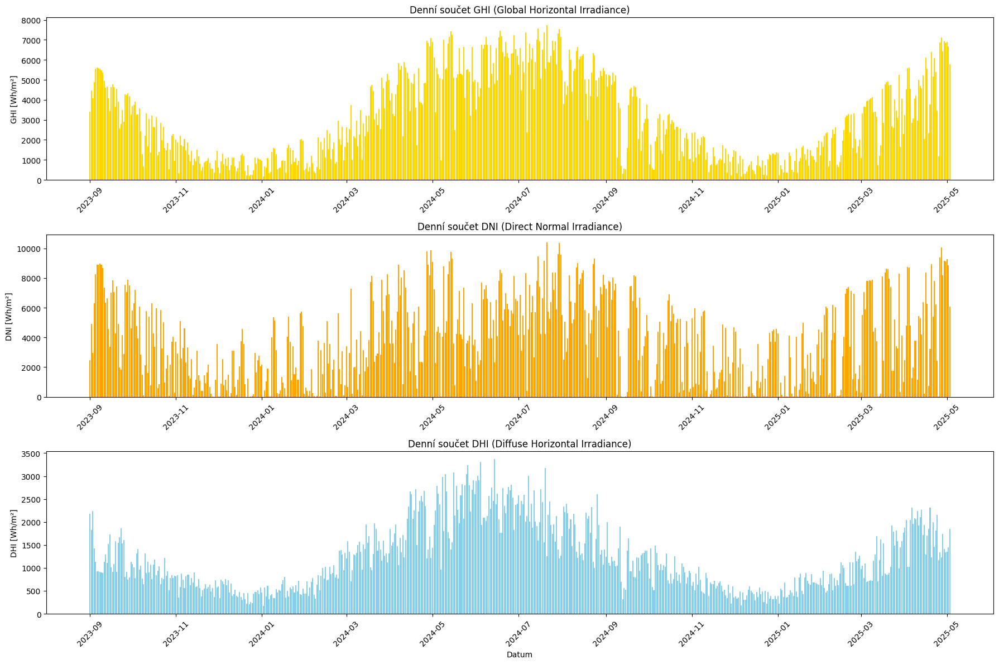

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Načtení CSV souboru s počasím
file_path_weather = 'open-meteo-49.81N15.47E380m.csv'
weather_data = pd.read_csv(file_path_weather, delimiter=',')

# Konvertování na datetime
weather_data['time'] = pd.to_datetime(weather_data['time'], errors='coerce')

# Ověření sloupců
print(weather_data.columns)

# Přejmenuj sloupce na GHI, DHI, DNI podle skutečného obsahu souboru
weather_data = weather_data.rename(columns={
    'shortwave_radiation (W/m²)': 'GHI',
    'diffuse_radiation (W/m²)': 'DHI',
    'direct_normal_irradiance (W/m²)': 'DNI'
})

# Odstraň řádky s chybějícími hodnotami
weather_data = weather_data.dropna(subset=['GHI', 'DHI', 'DNI'])

# Přidej sloupec s pouze datem
weather_data['date'] = weather_data['time'].dt.date

# Vypočítej denní sumy
daily_ghi = weather_data.groupby('date')['GHI'].sum()
daily_dni = weather_data.groupby('date')['DNI'].sum()
daily_dhi = weather_data.groupby('date')['DHI'].sum()

# --- Vykreslení tří grafů ---
plt.figure(figsize=(18, 12))

plt.subplot(3, 1, 1)
plt.bar(daily_ghi.index, daily_ghi.values, color='gold')
plt.title('Denní součet GHI (Global Horizontal Irradiance)')
plt.ylabel('GHI [Wh/m²]')
plt.xticks(rotation=45)

plt.subplot(3, 1, 2)
plt.bar(daily_dni.index, daily_dni.values, color='orange')
plt.title('Denní součet DNI (Direct Normal Irradiance)')
plt.ylabel('DNI [Wh/m²]')
plt.xticks(rotation=45)

plt.subplot(3, 1, 3)
plt.bar(daily_dhi.index, daily_dhi.values, color='skyblue')
plt.title('Denní součet DHI (Diffuse Horizontal Irradiance)')
plt.xlabel('Datum')
plt.ylabel('DHI [Wh/m²]')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

MAE: 17.33 kWh, RMSE: 22.86 kWh


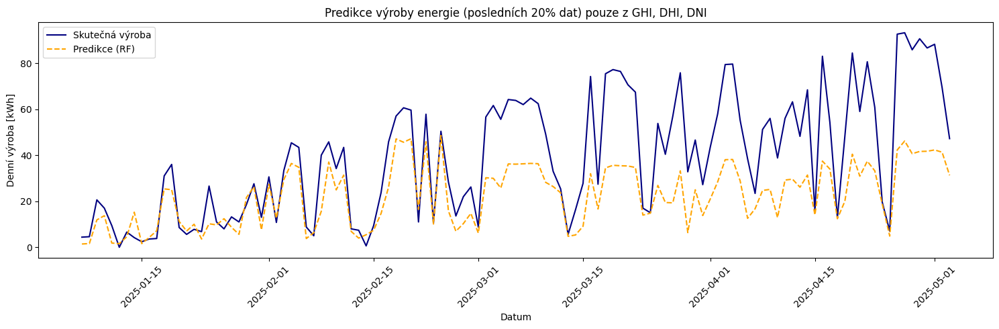

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt

# Načti počasí
weather = pd.read_csv('open-meteo-49.81N15.47E380m.csv', delimiter=',')
weather['time'] = pd.to_datetime(weather['time'], errors='coerce')

# Přejmenuj sloupce na standardní zkratky
weather = weather.rename(columns={
    'shortwave_radiation (W/m²)': 'GHI',
    'diffuse_radiation (W/m²)': 'DHI',
    'direct_normal_irradiance (W/m²)': 'DNI'
})

# Denní součty GHI, DHI, DNI
weather['date'] = weather['time'].dt.date
daily_irr = weather.groupby('date')[['GHI', 'DHI', 'DNI']].sum().reset_index()

# Načti výrobu
prod = pd.read_csv('data_od_strejdy_vse.csv', delimiter=';')
prod['Aktualizovany_cas'] = pd.to_datetime(prod['Aktualizovany_cas'], errors='coerce')

# Vezmi pouze platné hodnoty a vytvoř denní sumu výroby
prod = prod.dropna(subset=['Vyroba-dnes(kWh)'])
prod['date'] = prod['Aktualizovany_cas'].dt.date
daily_prod = prod.groupby('date')['Vyroba-dnes(kWh)'].sum().reset_index()

# Propoj podle datumu
df = pd.merge(daily_prod, daily_irr, on='date', how='inner').sort_values('date')

# Vstupy a výstupy
X = df[['GHI', 'DHI', 'DNI']].values
y = df['Vyroba-dnes(kWh)'].values

# Rozdělení na 80/20
split = int(len(X) * 0.8)
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]
dates_train, dates_test = df['date'].values[:split], df['date'].values[split:]

# Model
rf = RandomForestRegressor(n_estimators=500, random_state=42)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

# Vyhodnocení
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"MAE: {mae:.2f} kWh, RMSE: {rmse:.2f} kWh")

# Graf
plt.figure(figsize=(15,5))
plt.plot(dates_test, y_test, label='Skutečná výroba', color='navy')
plt.plot(dates_test, y_pred, label='Predikce (RF)', color='orange', linestyle='--')
plt.title('Predikce výroby energie (posledních 20% dat) pouze z GHI, DHI, DNI')
plt.xlabel('Datum')
plt.ylabel('Denní výroba [kWh]')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

MAE: 17.98 kWh, RMSE: 23.08 kWh


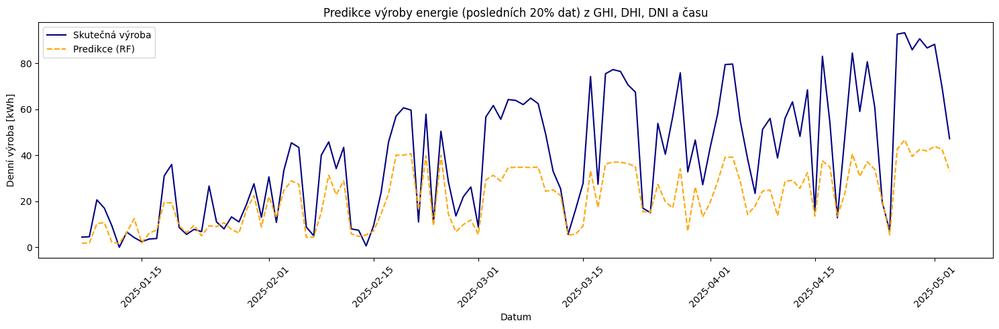

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt

# Načti počasí
weather = pd.read_csv('open-meteo-49.81N15.47E380m.csv', delimiter=',')
weather['time'] = pd.to_datetime(weather['time'], errors='coerce')

# Přejmenuj sloupce na standardní zkratky
weather = weather.rename(columns={
    'shortwave_radiation (W/m²)': 'GHI',
    'diffuse_radiation (W/m²)': 'DHI',
    'direct_normal_irradiance (W/m²)': 'DNI'
})

# Přidej časové atributy
weather['year'] = weather['time'].dt.year
weather['month'] = weather['time'].dt.month
weather['day'] = weather['time'].dt.day

# Denní agregace počasí + časové atributy (bereme z prvního záznamu dne)
weather['date'] = weather['time'].dt.date
daily_irr = weather.groupby('date').agg({
    'GHI': 'sum',
    'DHI': 'sum',
    'DNI': 'sum',
    'year': 'first',
    'month': 'first',
    'day': 'first'
}).reset_index()

# Načti výrobu
prod = pd.read_csv('data_od_strejdy_vse.csv', delimiter=';')
prod['Aktualizovany_cas'] = pd.to_datetime(prod['Aktualizovany_cas'], errors='coerce')

# Vezmi pouze platné hodnoty a vytvoř denní sumu výroby
prod = prod.dropna(subset=['Vyroba-dnes(kWh)'])
prod['date'] = prod['Aktualizovany_cas'].dt.date
daily_prod = prod.groupby('date')['Vyroba-dnes(kWh)'].sum().reset_index()

# Propoj podle datumu
df = pd.merge(daily_prod, daily_irr, on='date', how='inner').sort_values('date')

# Vstupy a výstupy - nyní i časové atributy
X = df[['year', 'month', 'day', 'GHI', 'DHI', 'DNI']].values
y = df['Vyroba-dnes(kWh)'].values

# Rozdělení na 80/20
split = int(len(X) * 0.8)
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]
dates_train, dates_test = df['date'].values[:split], df['date'].values[split:]

# Model
rf = RandomForestRegressor(n_estimators=500, random_state=42)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

# Vyhodnocení
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"MAE: {mae:.2f} kWh, RMSE: {rmse:.2f} kWh")

# Graf
plt.figure(figsize=(15,5))
plt.plot(dates_test, y_test, label='Skutečná výroba', color='navy')
plt.plot(dates_test, y_pred, label='Predikce (RF)', color='orange', linestyle='--')
plt.title('Predikce výroby energie (posledních 20% dat) z GHI, DHI, DNI a času')
plt.xlabel('Datum')
plt.ylabel('Denní výroba [kWh]')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

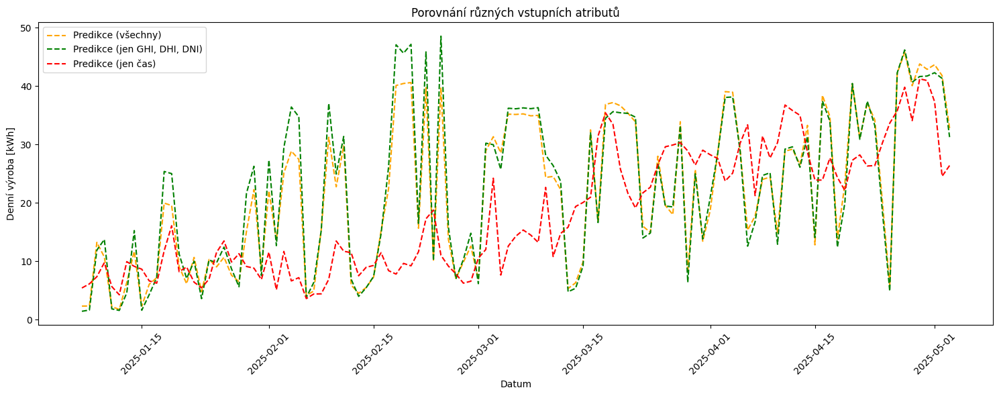

MAE/RMSE (všechny): 17.86 / 23.00
MAE/RMSE (jen GHI, DHI, DNI): 17.34 / 22.86
MAE/RMSE (jen čas): 23.39 / 30.00


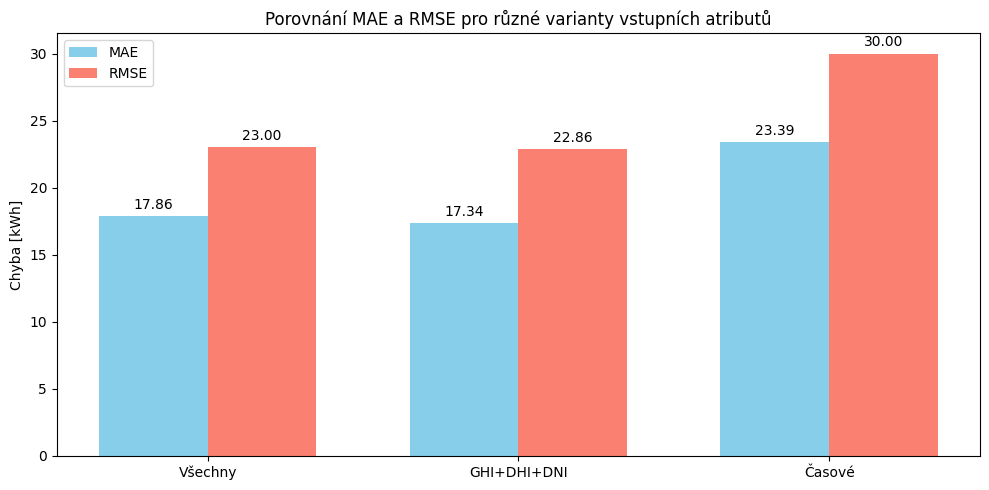

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Načti počasí
weather = pd.read_csv('open-meteo-49.81N15.47E380m.csv', delimiter=',')
weather['time'] = pd.to_datetime(weather['time'], errors='coerce')

# Přejmenuj sloupce na standardní zkratky
weather = weather.rename(columns={
    'shortwave_radiation (W/m²)': 'GHI',
    'diffuse_radiation (W/m²)': 'DHI',
    'direct_normal_irradiance (W/m²)': 'DNI'
})

# Přidej časové atributy
weather['year'] = weather['time'].dt.year
weather['month'] = weather['time'].dt.month
weather['day'] = weather['time'].dt.day
weather['hour'] = weather['time'].dt.hour
weather['weekday'] = weather['time'].dt.weekday
weather['date'] = weather['time'].dt.date

# Denní agregace počasí + časové atributy (bereme z prvního záznamu dne)
daily_irr = weather.groupby('date').agg({
    'GHI': 'sum',
    'DHI': 'sum',
    'DNI': 'sum',
    'year': 'first',
    'month': 'first',
    'day': 'first',
    'hour': 'first',
    'weekday': 'first'
}).reset_index()

# Načti výrobu
prod = pd.read_csv('data_od_strejdy_vse.csv', delimiter=';')
prod['Aktualizovany_cas'] = pd.to_datetime(prod['Aktualizovany_cas'], errors='coerce')

# Vezmi pouze platné hodnoty a vytvoř denní sumu výroby
prod = prod.dropna(subset=['Vyroba-dnes(kWh)'])
prod['date'] = prod['Aktualizovany_cas'].dt.date
daily_prod = prod.groupby('date')['Vyroba-dnes(kWh)'].sum().reset_index()

# Propoj podle datumu
df = pd.merge(daily_prod, daily_irr, on='date', how='inner').sort_values('date')

# Varianty vstupů - přidána 'hour'
features_all = ['year', 'month', 'day', 'hour', 'weekday', 'GHI', 'DHI', 'DNI']    # všechny atributy
features_met = ['GHI', 'DHI', 'DNI']                                               # pouze meteorologické
features_time = ['year', 'month', 'day', 'hour', 'weekday']                        # pouze časové

# Výstup
y = df['Vyroba-dnes(kWh)'].values
dates = df['date'].values

# Rozdělení na 80/20
split = int(len(df) * 0.8)
idx_train, idx_test = np.arange(split), np.arange(split, len(df))

def model_and_predict(X, y):
    # Rozdělení trénovací a testovací sady
    X_train, X_test = X[idx_train], X[idx_test]
    y_train, y_test = y[idx_train], y[idx_test]

    # Použij scaler, který transformuje data na stejné měřítko
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    model = RandomForestRegressor(n_estimators=500, random_state=42)
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    return y_test, y_pred

# Všechny atributy
X_all = df[features_all].values
y_test_all, y_pred_all = model_and_predict(X_all, y)

# Pouze meteorologické
X_met = df[features_met].values
y_test_met, y_pred_met = model_and_predict(X_met, y)

# Pouze časové
X_time = df[features_time].values
y_test_time, y_pred_time = model_and_predict(X_time, y)

plt.figure(figsize=(15,6))

# Skutečná data (původní) - zde se předpokládá, že daily_prod
# obsahuje původní měřené hodnoty před jakoukoliv normalizací
#last_n = 117
#plt.plot(daily_prod['date'].values[-last_n:], daily_prod['Vyroba-dnes(kWh)'].values[-last_n:], label='Skutečná výroba', color='navy')

# Predikce s normalizovanými daty (trénovací i testovací jsou zpracovány skalérem)
plt.plot(dates[idx_test], y_pred_all, label='Predikce (všechny)', linestyle='--', color='orange')
plt.plot(dates[idx_test], y_pred_met, label='Predikce (jen GHI, DHI, DNI)', linestyle='--', color='green')
plt.plot(dates[idx_test], y_pred_time, label='Predikce (jen čas)', linestyle='--', color='red')

plt.title('Porovnání různých vstupních atributů')
plt.xlabel('Datum')
plt.ylabel('Denní výroba [kWh]')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

# Vyhodnocení
print("MAE/RMSE (všechny): {:.2f} / {:.2f}".format(
    mean_absolute_error(y_test_all, y_pred_all), np.sqrt(mean_squared_error(y_test_all, y_pred_all))))
print("MAE/RMSE (jen GHI, DHI, DNI): {:.2f} / {:.2f}".format(
    mean_absolute_error(y_test_met, y_pred_met), np.sqrt(mean_squared_error(y_test_met, y_pred_met))))
print("MAE/RMSE (jen čas): {:.2f} / {:.2f}".format(
    mean_absolute_error(y_test_time, y_pred_time), np.sqrt(mean_squared_error(y_test_time, y_pred_time))))

# Sběr metrik
labels = ['Všechny', 'GHI+DHI+DNI', 'Časové']
mae_values = [
    mean_absolute_error(y_test_all, y_pred_all),
    mean_absolute_error(y_test_met, y_pred_met),
    mean_absolute_error(y_test_time, y_pred_time)
]
rmse_values = [
    np.sqrt(mean_squared_error(y_test_all, y_pred_all)),
    np.sqrt(mean_squared_error(y_test_met, y_pred_met)),
    np.sqrt(mean_squared_error(y_test_time, y_pred_time))
]

# Vykresli chyby do sloupcového grafu
x = np.arange(len(labels))  # pozice skupin
width = 0.35  # šířka sloupců

fig, ax = plt.subplots(figsize=(10,5))
bars1 = ax.bar(x - width/2, mae_values, width, label='MAE', color='skyblue')
bars2 = ax.bar(x + width/2, rmse_values, width, label='RMSE', color='salmon')

# Popisky a formátování
ax.set_ylabel('Chyba [kWh]')
ax.set_title('Porovnání MAE a RMSE pro různé varianty vstupních atributů')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()
ax.bar_label(bars1, fmt='%.2f', padding=3)
ax.bar_label(bars2, fmt='%.2f', padding=3)

plt.tight_layout()
plt.show()

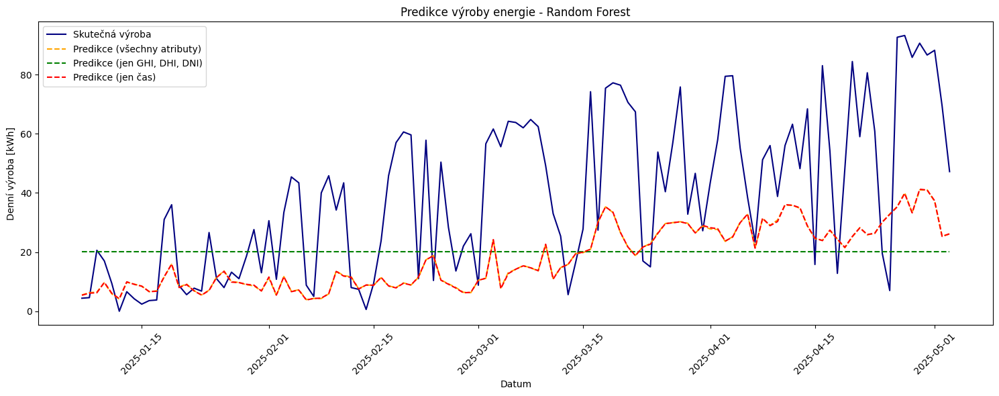

MAE/RMSE (všechny): 23.43 / 30.06
MAE/RMSE (jen GHI, DHI, DNI): 26.10 / 32.58
MAE/RMSE (jen čas): 23.43 / 30.06


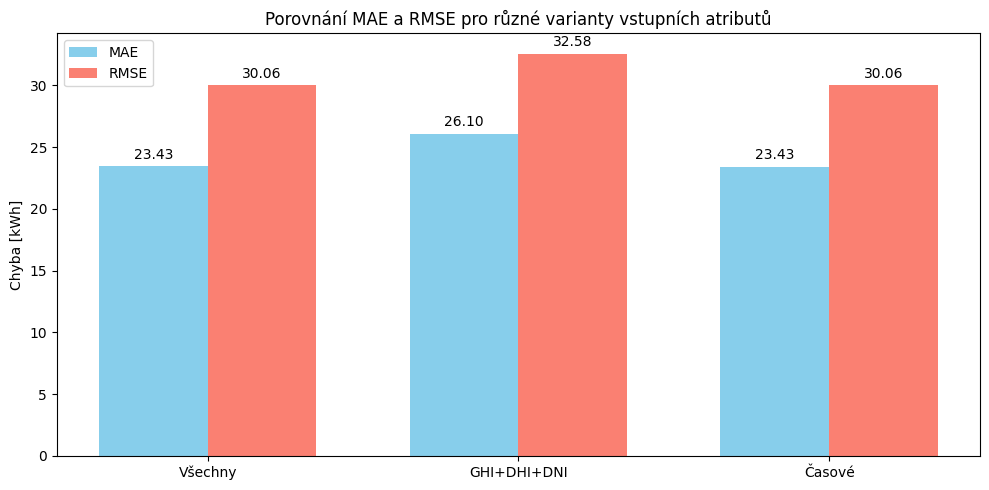

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
import xgboost as xgb
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Načtení CSV souboru s výrobními daty
file_path_production = 'data_od_strejdy_vse.csv'
data = pd.read_csv(file_path_production, delimiter=';')

# Načtení CSV souboru s počasím
file_path_weather = 'open-meteo-49.81N15.47E380m.csv'
weather_data = pd.read_csv(file_path_weather, delimiter=',')

# Konvertování 'Aktualizovany_cas' a 'time' na datetime
data['Aktualizovany_cas'] = pd.to_datetime(data['Aktualizovany_cas'], errors='coerce')
weather_data['time'] = pd.to_datetime(weather_data['time'], errors='coerce')

# Přejmenování sloupce 'time' na 'Aktualizovany_cas' pro merge
weather_data = weather_data.rename(columns={'time': 'Aktualizovany_cas'})

# Sloučení dat podle 'Aktualizovany_cas'
data = pd.merge(data, weather_data, on='Aktualizovany_cas', how='left')

# --- Přejmenuj sloupce počasí na běžné zkratky ---
data = data.rename(columns={
    'shortwave_radiation (W/m²)': 'GHI',
    'diffuse_radiation (W/m²)': 'DHI',
    'direct_normal_irradiance (W/m²)': 'DNI'
})

# Přidání časových atributů
data['year'] = data['Aktualizovany_cas'].dt.year
data['month'] = data['Aktualizovany_cas'].dt.month
data['day'] = data['Aktualizovany_cas'].dt.day
data['hour'] = data['Aktualizovany_cas'].dt.hour
data['weekday'] = data['Aktualizovany_cas'].dt.weekday

# Filtrovaní záznamů s hodnotou výroby a počasí
data = data.dropna(subset=['Vyroba-dnes(kWh)', 'GHI', 'DHI', 'DNI'])
# Varianty vstupů - přidána 'hour'
features_all = ['year', 'month', 'day', 'hour', 'weekday', 'GHI', 'DHI', 'DNI']    # všechny atributy
features_met = ['GHI', 'DHI', 'DNI']                                               # pouze meteorologické
features_time = ['year', 'month', 'day', 'hour', 'weekday']                        # pouze časové

# Výstup
y = df['Vyroba-dnes(kWh)'].values
dates = df['date'].values

# Rozdělení na 80/20
split = int(len(df) * 0.8)
idx_train, idx_test = np.arange(split), np.arange(split, len(df))

def model_and_predict(X, y):
    X_train, X_test = X[idx_train], X[idx_test]
    y_train, y_test = y[idx_train], y[idx_test]
    model = RandomForestRegressor(n_estimators=500, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    return y_test, y_pred

# Všechny atributy
X_all = df[features_all].values
y_test_all, y_pred_all = model_and_predict(X_all, y)

# Pouze meteorologické
X_met = df[features_met].values
y_test_met, y_pred_met = model_and_predict(X_met, y)

# Pouze časové
X_time = df[features_time].values
y_test_time, y_pred_time = model_and_predict(X_time, y)

# Graf predikcí
plt.figure(figsize=(15,6))
plt.plot(dates[idx_test], y[idx_test], label='Skutečná výroba', color='navy')
plt.plot(dates[idx_test], y_pred_all, label='Predikce (všechny atributy)', linestyle='--', color='orange')
plt.plot(dates[idx_test], y_pred_met, label='Predikce (jen GHI, DHI, DNI)', linestyle='--', color='green')
plt.plot(dates[idx_test], y_pred_time, label='Predikce (jen čas)', linestyle='--', color='red')
plt.title('Predikce výroby energie - Random Forest')
plt.xlabel('Datum')
plt.ylabel('Denní výroba [kWh]')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

# Vyhodnocení
print("MAE/RMSE (všechny): {:.2f} / {:.2f}".format(
    mean_absolute_error(y_test_all, y_pred_all), np.sqrt(mean_squared_error(y_test_all, y_pred_all))))
print("MAE/RMSE (jen GHI, DHI, DNI): {:.2f} / {:.2f}".format(
    mean_absolute_error(y_test_met, y_pred_met), np.sqrt(mean_squared_error(y_test_met, y_pred_met))))
print("MAE/RMSE (jen čas): {:.2f} / {:.2f}".format(
    mean_absolute_error(y_test_time, y_pred_time), np.sqrt(mean_squared_error(y_test_time, y_pred_time))))

# Sběr metrik
labels = ['Všechny', 'GHI+DHI+DNI', 'Časové']
mae_values = [
    mean_absolute_error(y_test_all, y_pred_all),
    mean_absolute_error(y_test_met, y_pred_met),
    mean_absolute_error(y_test_time, y_pred_time)
]
rmse_values = [
    np.sqrt(mean_squared_error(y_test_all, y_pred_all)),
    np.sqrt(mean_squared_error(y_test_met, y_pred_met)),
    np.sqrt(mean_squared_error(y_test_time, y_pred_time))
]

# Vykresli chyby do sloupcového grafu
x = np.arange(len(labels))  # pozice skupin
width = 0.35  # šířka sloupců

fig, ax = plt.subplots(figsize=(10,5))
bars1 = ax.bar(x - width/2, mae_values, width, label='MAE', color='skyblue')
bars2 = ax.bar(x + width/2, rmse_values, width, label='RMSE', color='salmon')

# Popisky a formátování
ax.set_ylabel('Chyba [kWh]')
ax.set_title('Porovnání MAE a RMSE pro různé varianty vstupních atributů')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()
ax.bar_label(bars1, fmt='%.2f', padding=3)
ax.bar_label(bars2, fmt='%.2f', padding=3)

plt.tight_layout()
plt.show()

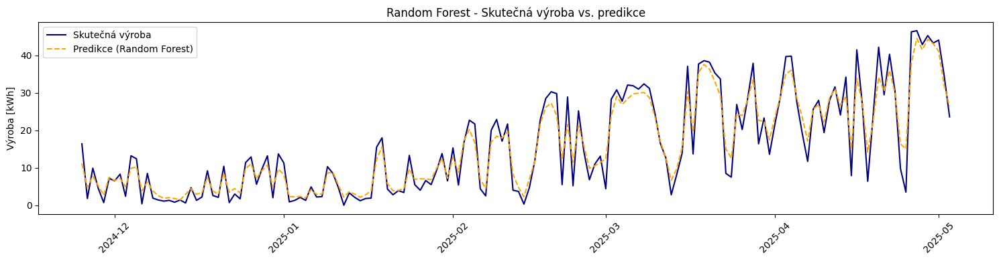

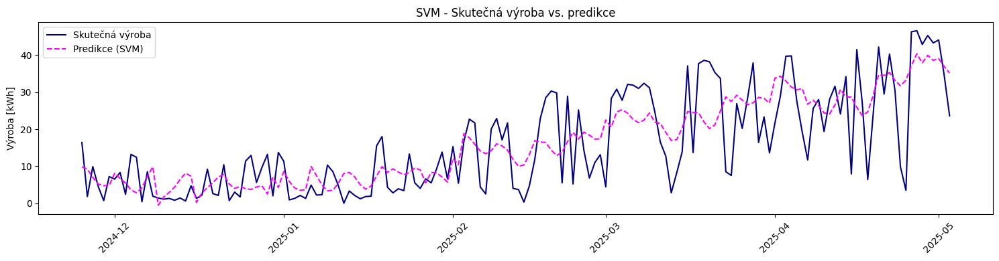

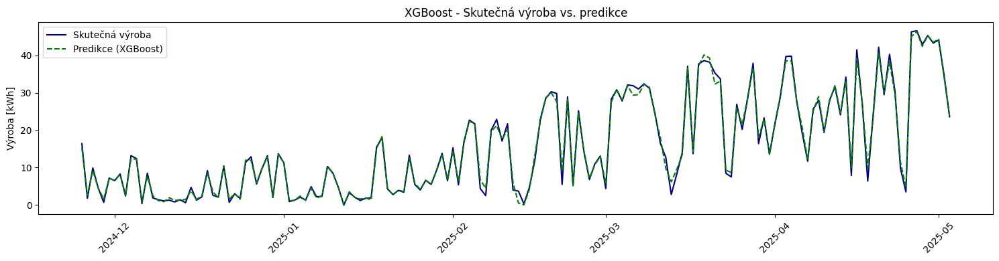

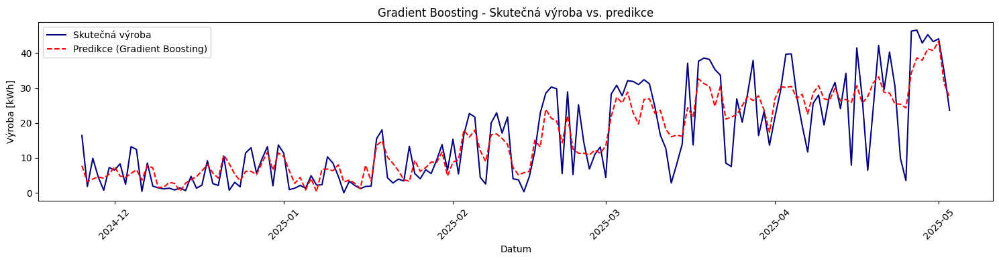

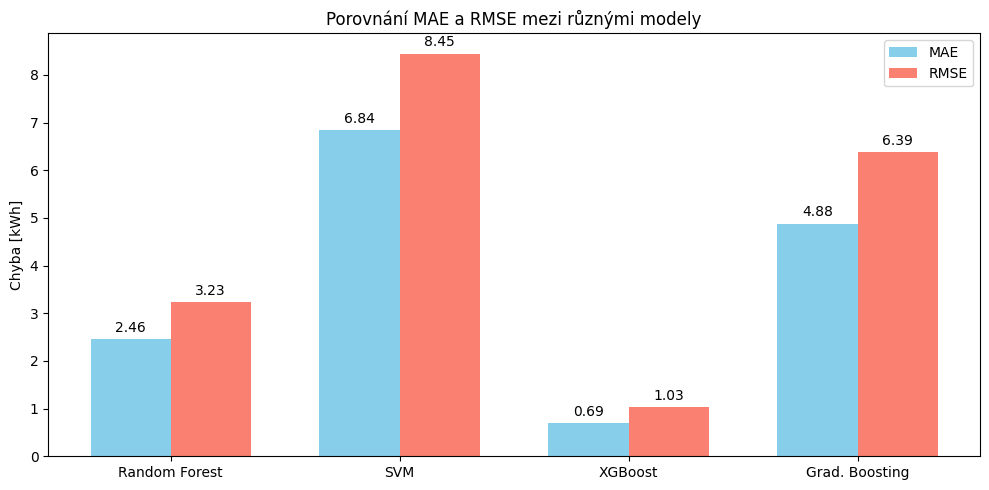

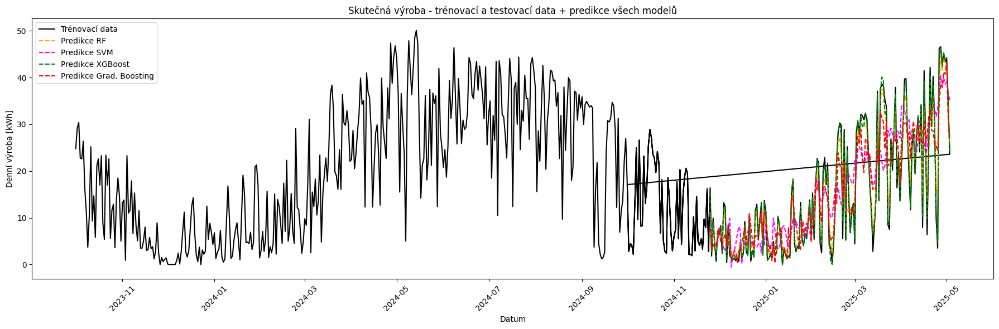

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
import xgboost as xgb
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Načtení CSV souboru s výrobními daty
file_path_production = 'data_od_strejdy_vse.csv'
data = pd.read_csv(file_path_production, delimiter=';')

# Načtení CSV souboru s počasím
file_path_weather = 'open-meteo-49.81N15.47E380m.csv'
weather_data = pd.read_csv(file_path_weather, delimiter=',')

# Konvertování 'Aktualizovany_cas' a 'time' na datetime
data['Aktualizovany_cas'] = pd.to_datetime(data['Aktualizovany_cas'], errors='coerce')
weather_data['time'] = pd.to_datetime(weather_data['time'], errors='coerce')

# Přejmenování sloupce 'time' na 'Aktualizovany_cas' pro merge
weather_data = weather_data.rename(columns={'time': 'Aktualizovany_cas'})

# Sloučení dat podle 'Aktualizovany_cas'
data = pd.merge(data, weather_data, on='Aktualizovany_cas', how='left')

# --- Přejmenuj sloupce počasí na běžné zkratky ---
data = data.rename(columns={
    'shortwave_radiation (W/m²)': 'GHI',
    'diffuse_radiation (W/m²)': 'DHI',
    'direct_normal_irradiance (W/m²)': 'DNI'
})

# Přidání časových atributů
data['year'] = data['Aktualizovany_cas'].dt.year
data['month'] = data['Aktualizovany_cas'].dt.month
data['day'] = data['Aktualizovany_cas'].dt.day
data['hour'] = data['Aktualizovany_cas'].dt.hour
data['weekday'] = data['Aktualizovany_cas'].dt.weekday

# Filtrovaní záznamů s hodnotou výroby a počasí
data = data.dropna(subset=['Vyroba-dnes(kWh)', 'GHI', 'DHI', 'DNI'])

# Příprava vstupů a výstupů pro dataset
features = ['year', 'month', 'day', 'hour', 'weekday', 'DNI', 'GHI', 'DHI']
X = data[features].values
y = data['Vyroba-dnes(kWh)'].values
dates = data['Aktualizovany_cas'].values

# Normalizace cílové proměnné
scaler_y = MinMaxScaler()
y_scaled = scaler_y.fit_transform(y.reshape(-1, 1)).ravel()

# Rozdělení na 80% trénink a 20% test (časově, ne náhodně)
split_idx = int(len(X) * 0.8)
X_train, X_test = X[:split_idx], X[split_idx:]
y_train, y_test = y_scaled[:split_idx], y_scaled[split_idx:]
dates_train, dates_test = dates[:split_idx], dates[split_idx:]

# Standardizace vstupů pro SVM (doporučeno)
scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)

# --- Random Forest ---
rf = RandomForestRegressor(n_estimators=500, random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)

# --- SVM ---
svm = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.1)
svm.fit(X_train_scaled, y_train)
y_pred_svm = svm.predict(X_test_scaled)

# --- XGBoost ---
xgb_model = xgb.XGBRegressor(n_estimators=500, learning_rate=0.05, random_state=42)
xgb_model.fit(X_train, y_train)
y_pred_xgb = xgb_model.predict(X_test)

# --- Gradient Boosting ---
gb = GradientBoostingRegressor(n_estimators=500, learning_rate=0.05, random_state=42)
gb.fit(X_train, y_train)
y_pred_gb = gb.predict(X_test)

# --- Denormalizace predikcí i testu pro přehledné porovnání ---
y_test_inv = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()
y_pred_rf_inv = scaler_y.inverse_transform(y_pred_rf.reshape(-1, 1)).ravel()
y_pred_svm_inv = scaler_y.inverse_transform(y_pred_svm.reshape(-1, 1)).ravel()
y_pred_xgb_inv = scaler_y.inverse_transform(y_pred_xgb.reshape(-1, 1)).ravel()
y_pred_gb_inv = scaler_y.inverse_transform(y_pred_gb.reshape(-1, 1)).ravel()

# --- Grafy predikcí (každý samostatně s mezerou) ---

plt.figure(figsize=(15, 4))
plt.plot(dates_test, y_test_inv, label='Skutečná výroba', color='navy')
plt.plot(dates_test, y_pred_rf_inv, label='Predikce (Random Forest)', linestyle='--', color='orange')
plt.title('Random Forest - Skutečná výroba vs. predikce')
plt.ylabel('Výroba [kWh]')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(15, 4))
plt.plot(dates_test, y_test_inv, label='Skutečná výroba', color='navy')
plt.plot(dates_test, y_pred_svm_inv, label='Predikce (SVM)', linestyle='--', color='magenta')
plt.title('SVM - Skutečná výroba vs. predikce')
plt.ylabel('Výroba [kWh]')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(15, 4))
plt.plot(dates_test, y_test_inv, label='Skutečná výroba', color='navy')
plt.plot(dates_test, y_pred_xgb_inv, label='Predikce (XGBoost)', linestyle='--', color='green')
plt.title('XGBoost - Skutečná výroba vs. predikce')
plt.ylabel('Výroba [kWh]')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(15, 4))
plt.plot(dates_test, y_test_inv, label='Skutečná výroba', color='navy')
plt.plot(dates_test, y_pred_gb_inv, label='Predikce (Gradient Boosting)', linestyle='--', color='red')
plt.title('Gradient Boosting - Skutečná výroba vs. predikce')
plt.xlabel('Datum')
plt.ylabel('Výroba [kWh]')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

# --- Porovnání MAE a RMSE všech metod ---
labels = ['Random Forest', 'SVM', 'XGBoost', 'Grad. Boosting']
mae_values = [
    mean_absolute_error(y_test_inv, y_pred_rf_inv),
    mean_absolute_error(y_test_inv, y_pred_svm_inv),
    mean_absolute_error(y_test_inv, y_pred_xgb_inv),
    mean_absolute_error(y_test_inv, y_pred_gb_inv)
]
rmse_values = [
    np.sqrt(mean_squared_error(y_test_inv, y_pred_rf_inv)),
    np.sqrt(mean_squared_error(y_test_inv, y_pred_svm_inv)),
    np.sqrt(mean_squared_error(y_test_inv, y_pred_xgb_inv)),
    np.sqrt(mean_squared_error(y_test_inv, y_pred_gb_inv))
]

x = np.arange(len(labels))  # pozice skupin
width = 0.35  # šířka sloupců

fig, ax = plt.subplots(figsize=(10,5))
bars1 = ax.bar(x - width/2, mae_values, width, label='MAE', color='skyblue')
bars2 = ax.bar(x + width/2, rmse_values, width, label='RMSE', color='salmon')

ax.set_ylabel('Chyba [kWh]')
ax.set_title('Porovnání MAE a RMSE mezi různými modely')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()
ax.bar_label(bars1, fmt='%.2f', padding=3)
ax.bar_label(bars2, fmt='%.2f', padding=3)

plt.tight_layout()
plt.show()

# --- SPOLEČNÝ GRAF: trénovací data + testovací data + predikce všech modelů ---
plt.figure(figsize=(18, 6))
plt.plot(dates_train, scaler_y.inverse_transform(y_train.reshape(-1, 1)).ravel(), label='Trénovací data', color='black')
#plt.plot(dates_test, y_test_inv, label='Testovací data', color='navy')
plt.plot(dates_test, y_pred_rf_inv, label='Predikce RF', linestyle='--', color='orange')
plt.plot(dates_test, y_pred_svm_inv, label='Predikce SVM', linestyle='--', color='magenta')
plt.plot(dates_test, y_pred_xgb_inv, label='Predikce XGBoost', linestyle='--', color='green')
plt.plot(dates_test, y_pred_gb_inv, label='Predikce Grad. Boosting', linestyle='--', color='red')
plt.title('Skutečná výroba - trénovací a testovací data + predikce všech modelů')
plt.xlabel('Datum')
plt.ylabel('Denní výroba [kWh]')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


MAE: 29.38 kWh, RMSE: 37.73 kWh


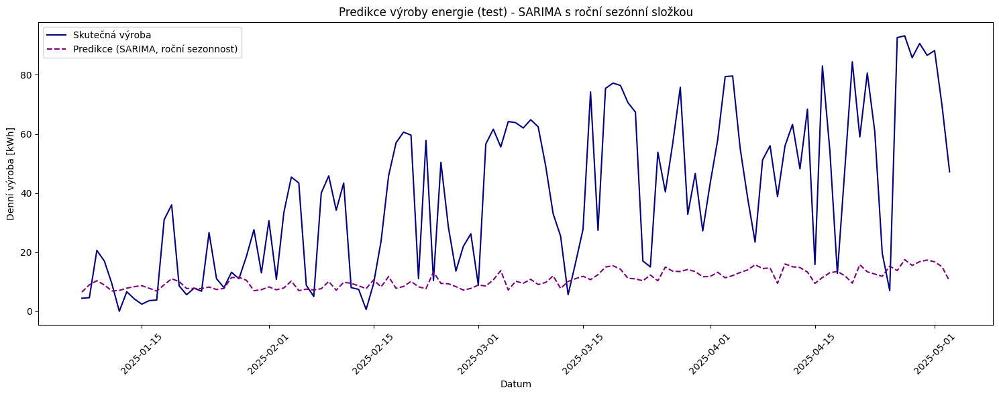

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Načtení a příprava dat viz předchozí kód (zkráceně)
weather = pd.read_csv('open-meteo-49.81N15.47E380m.csv', delimiter=',')
weather['time'] = pd.to_datetime(weather['time'], errors='coerce')
weather = weather.rename(columns={
    'shortwave_radiation (W/m²)': 'GHI',
    'diffuse_radiation (W/m²)': 'DHI',
    'direct_normal_irradiance (W/m²)': 'DNI'
})
weather['date'] = weather['time'].dt.date
daily_irr = weather.groupby('date')[['GHI', 'DHI', 'DNI']].sum().reset_index()

prod = pd.read_csv('data_od_strejdy_vse.csv', delimiter=';')
prod['Aktualizovany_cas'] = pd.to_datetime(prod['Aktualizovany_cas'], errors='coerce')
prod = prod.dropna(subset=['Vyroba-dnes(kWh)'])
prod['date'] = prod['Aktualizovany_cas'].dt.date
daily_prod = prod.groupby('date')['Vyroba-dnes(kWh)'].sum().reset_index()

df = pd.merge(daily_prod, daily_irr, on='date', how='inner').sort_values('date')

# Časová řada
df.set_index('date', inplace=True)
y = df['Vyroba-dnes(kWh)']

# Rozdělení na 80/20
split = int(len(y) * 0.8)
y_train, y_test = y.iloc[:split], y.iloc[split:]
dates_train, dates_test = y_train.index, y_test.index

# SARIMA s roční sezonní složkou (při denních datech je perioda 365)
model = SARIMAX(
    y_train,
    order=(2,1,2),
    seasonal_order=(1,0,1,365),  # ROČNÍ sezonnost
    enforce_stationarity=False,
    enforce_invertibility=False
)
results = model.fit(disp=False)

# Predikce
y_pred = results.get_forecast(steps=len(y_test)).predicted_mean

# Vyhodnocení
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"MAE: {mae:.2f} kWh, RMSE: {rmse:.2f} kWh")

# Graf
plt.figure(figsize=(15,6))
plt.plot(dates_test, y_test, label='Skutečná výroba', color='navy')
plt.plot(dates_test, y_pred, label='Predikce (SARIMA, roční sezonnost)', color='purple', linestyle='--')
plt.title('Predikce výroby energie (test) - SARIMA s roční sezónní složkou')
plt.xlabel('Datum')
plt.ylabel('Denní výroba [kWh]')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

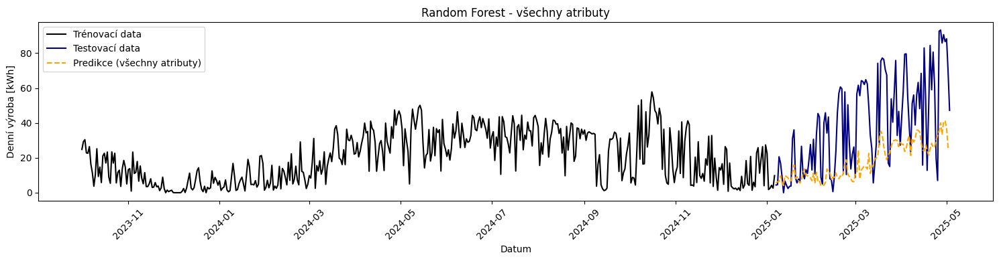

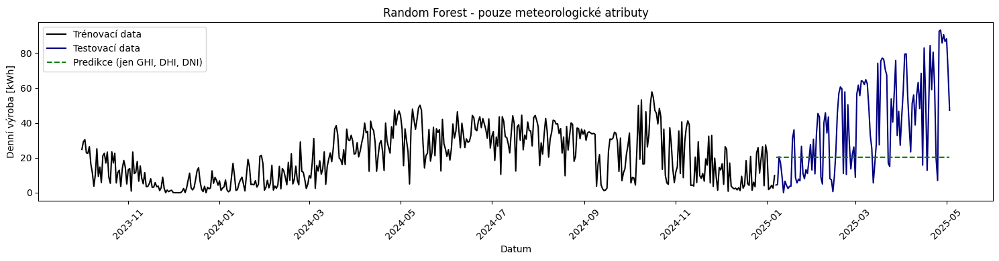

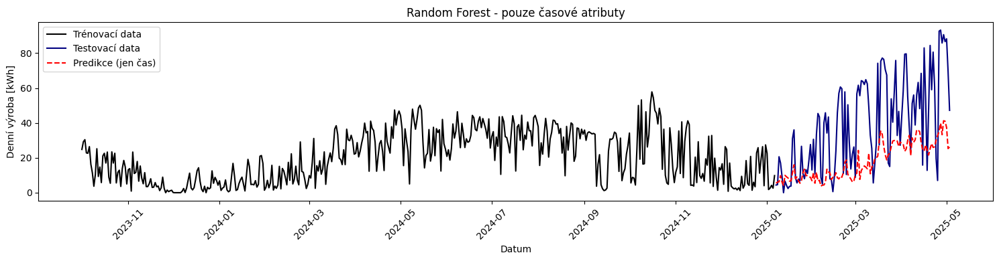

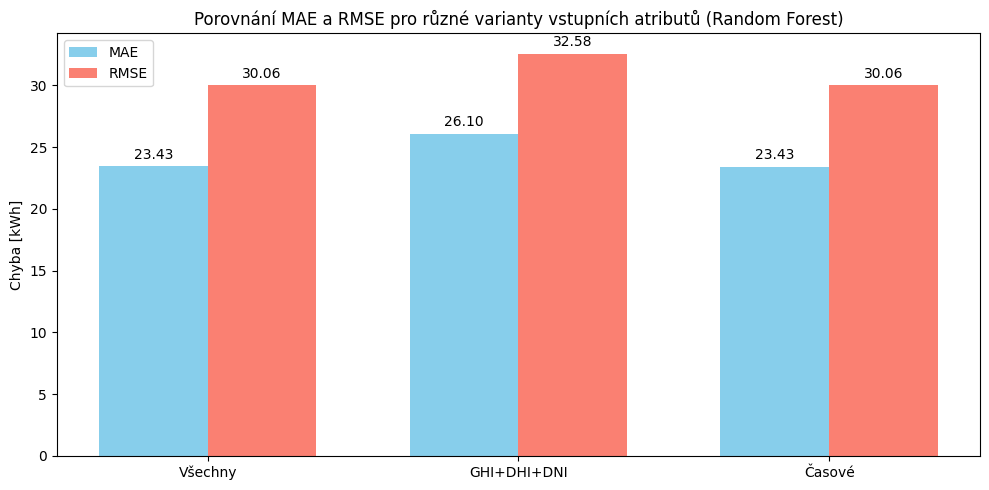

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Načtení a příprava dat viz předchozí kód (zkráceně)
weather = pd.read_csv('open-meteo-49.81N15.47E380m.csv', delimiter=',')
weather['time'] = pd.to_datetime(weather['time'], errors='coerce')
weather = weather.rename(columns={
    'shortwave_radiation (W/m²)': 'GHI',
    'diffuse_radiation (W/m²)': 'DHI',
    'direct_normal_irradiance (W/m²)': 'DNI'
})
weather['date'] = weather['time'].dt.date
daily_irr = weather.groupby('date')[['GHI', 'DHI', 'DNI']].sum().reset_index()

prod = pd.read_csv('data_od_strejdy_vse.csv', delimiter=';')
prod['Aktualizovany_cas'] = pd.to_datetime(prod['Aktualizovany_cas'], errors='coerce')
prod = prod.dropna(subset=['Vyroba-dnes(kWh)'])
prod['date'] = prod['Aktualizovany_cas'].dt.date
daily_prod = prod.groupby('date')['Vyroba-dnes(kWh)'].sum().reset_index()

df = pd.merge(daily_prod, daily_irr, on='date', how='inner').sort_values('date')

# Časová řada
df.set_index('date', inplace=True)
y = df['Vyroba-dnes(kWh)']

# Rozdělení na 80/20
split = int(len(y) * 0.8)
y_train, y_test = y.iloc[:split], y.iloc[split:]
dates_train, dates_test = y_train.index, y_test.index

# SARIMA s roční sezonní složkou (při denních datech je perioda 365)
model = SARIMAX(
    y_train,
    order=(2,1,2),
    seasonal_order=(1,0,1,365),  # ROČNÍ sezonnost
    enforce_stationarity=False,
    enforce_invertibility=False
)
results = model.fit(disp=False)

# Predikce
y_pred = results.get_forecast(steps=len(y_test)).predicted_mean

# Vyhodnocení
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"MAE: {mae:.2f} kWh, RMSE: {rmse:.2f} kWh")

# Graf
plt.figure(figsize=(15,6))
plt.plot(dates_test, y_test, label='Skutečná výroba', color='navy')
plt.plot(dates_test, y_pred, label='Predikce (SARIMA, roční sezonnost)', color='purple', linestyle='--')
plt.title('Predikce výroby energie (test) - SARIMA s roční sezónní složkou')
plt.xlabel('Datum')
plt.ylabel('Denní výroba [kWh]')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


KeyboardInterrupt: 

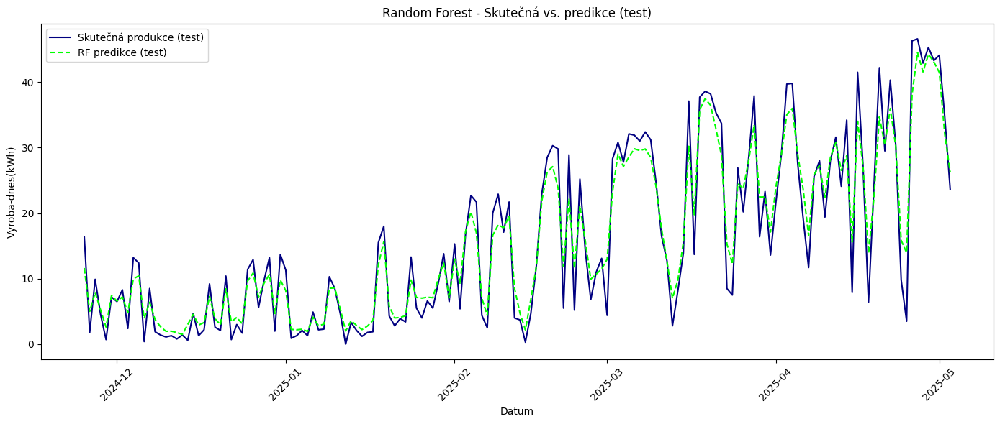

Výsledky na testovací sadě:
Random Forest - MAE: 2.4450, MSE: 10.2141, RMSE: 3.1959


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Načtení CSV souboru s výrobními daty
file_path_production = 'data_od_strejdy_vse.csv'
data = pd.read_csv(file_path_production, delimiter=';')

# Načtení CSV souboru s počasím
file_path_weather = 'open-meteo-49.81N15.47E380m.csv'
weather_data = pd.read_csv(file_path_weather, delimiter=',')

# Konvertování 'Aktualizovany_cas' a 'time' na datetime
data['Aktualizovany_cas'] = pd.to_datetime(data['Aktualizovany_cas'], errors='coerce')
weather_data['time'] = pd.to_datetime(weather_data['time'], errors='coerce')

# Přejmenování sloupce 'time' na 'Aktualizovany_cas' pro merge
weather_data = weather_data.rename(columns={'time': 'Aktualizovany_cas'})

# Sloučení dat podle 'Aktualizovany_cas'
data = pd.merge(data, weather_data, on='Aktualizovany_cas', how='left')

# Přejmenování sloupců počasí
data = data.rename(columns={
    'shortwave_radiation (W/m²)': 'GHI',
    'diffuse_radiation (W/m²)': 'DHI',
    'direct_normal_irradiance (W/m²)': 'DNI'
})

# Přidání časových atributů
data['year'] = data['Aktualizovany_cas'].dt.year
data['month'] = data['Aktualizovany_cas'].dt.month
data['day'] = data['Aktualizovany_cas'].dt.day
data['hour'] = data['Aktualizovany_cas'].dt.hour
data['weekday'] = data['Aktualizovany_cas'].dt.weekday

# Odstranění řádků s chybějícími hodnotami
data = data.dropna(subset=['Vyroba-dnes(kWh)', 'GHI', 'DHI', 'DNI'])

# Výběr vstupních proměnných a cílové hodnoty
features = ['year', 'month', 'day', 'hour', 'weekday']
X = data[features].values
y = data['Vyroba-dnes(kWh)'].values
dates = data['Aktualizovany_cas'].values

# Normalizace cílové proměnné
scaler_y = MinMaxScaler()
y_scaled = scaler_y.fit_transform(y.reshape(-1, 1)).ravel()

# Časově konzistentní rozdělení na tréninkovou a testovací sadu
split_idx = int(len(X) * 0.8)
X_train, X_test = X[:split_idx], X[split_idx:]
y_train, y_test = y_scaled[:split_idx], y_scaled[split_idx:]
dates_train, dates_test = dates[:split_idx], dates[split_idx:]

# Trénink modelu Random Forest
rf = RandomForestRegressor(n_estimators=1000, random_state=42)
rf.fit(X_train, y_train)
rf_pred_test = scaler_y.inverse_transform(rf.predict(X_test).reshape(-1, 1)).ravel()

# Skutečné hodnoty v původním měřítku
y_test_orig = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()

# Graf: Random Forest - Skutečná vs. predikce (test)
plt.figure(figsize=(14, 6))
plt.plot(dates_test, y_test_orig, label='Skutečná produkce (test)', color='navy')
plt.plot(dates_test, rf_pred_test, label='RF predikce (test)', linestyle='--', color='lime')
plt.title('Random Forest - Skutečná vs. predikce (test)')
plt.xlabel('Datum')
plt.ylabel('Vyroba-dnes(kWh)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

# Vyhodnocení modelu
def print_metrics(y_true, y_pred, model_name):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    print(f"{model_name} - MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}")

print("Výsledky na testovací sadě:")
print_metrics(y_test_orig, rf_pred_test, "Random Forest")


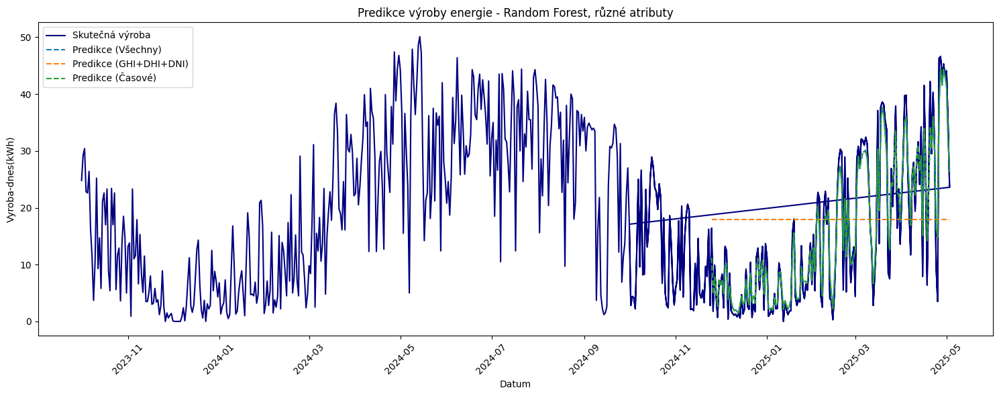

Všechny - MAE: 2.46, RMSE: 3.23
GHI+DHI+DNI - MAE: 11.92, RMSE: 13.40
Časové - MAE: 2.45, RMSE: 3.22


In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt

# Načtení CSV souboru s výrobními daty
file_path_production = 'data_od_strejdy_vse.csv'
data = pd.read_csv(file_path_production, delimiter=';')

# Načtení CSV souboru s počasím
file_path_weather = 'open-meteo-49.81N15.47E380m.csv'
weather_data = pd.read_csv(file_path_weather, delimiter=',')

# Konvertování 'Aktualizovany_cas' a 'time' na datetime
data['Aktualizovany_cas'] = pd.to_datetime(data['Aktualizovany_cas'], errors='coerce')
weather_data['time'] = pd.to_datetime(weather_data['time'], errors='coerce')

# Přejmenování sloupce 'time' na 'Aktualizovany_cas' pro merge
weather_data = weather_data.rename(columns={'time': 'Aktualizovany_cas'})

# Sloučení dat podle 'Aktualizovany_cas'
data = pd.merge(data, weather_data, on='Aktualizovany_cas', how='left')

# Přejmenování sloupců počasí
data = data.rename(columns={
    'shortwave_radiation (W/m²)': 'GHI',
    'diffuse_radiation (W/m²)': 'DHI',
    'direct_normal_irradiance (W/m²)': 'DNI'
})

# Přidání časových atributů
data['year'] = data['Aktualizovany_cas'].dt.year
data['month'] = data['Aktualizovany_cas'].dt.month
data['day'] = data['Aktualizovany_cas'].dt.day
data['hour'] = data['Aktualizovany_cas'].dt.hour
data['weekday'] = data['Aktualizovany_cas'].dt.weekday

# Odstranění řádků s chybějícími hodnotami
data = data.dropna(subset=['Vyroba-dnes(kWh)', 'GHI', 'DHI', 'DNI'])

# Definice skupin vstupních proměnných
features_all = ['year', 'month', 'day', 'hour', 'weekday', 'GHI', 'DHI', 'DNI']
features_met = ['GHI', 'DHI', 'DNI']
features_time = ['year', 'month', 'day', 'hour', 'weekday']

# Výstupní vektor a datumy
y = data['Vyroba-dnes(kWh)'].values
dates = data['Aktualizovany_cas'].values

# Normalizace cílové proměnné (volitelně, pokud chceš)
scaler_y = MinMaxScaler()
y_scaled = scaler_y.fit_transform(y.reshape(-1, 1)).ravel()

# Časově konzistentní dělení na train/test (posloupnost)
split_idx = int(len(y) * 0.8)
def get_splits(X, y_scaled, dates):
    X_train, X_test = X[:split_idx], X[split_idx:]
    y_train, y_test = y_scaled[:split_idx], y_scaled[split_idx:]
    dates_train, dates_test = dates[:split_idx], dates[split_idx:]
    return X_train, X_test, y_train, y_test, dates_train, dates_test

def train_and_predict(X, y_scaled, dates, label, scaler_y):
    X_train, X_test, y_train, y_test, dates_train, dates_test = get_splits(X, y_scaled, dates)
    model = RandomForestRegressor(n_estimators=500, random_state=42)
    model.fit(X_train, y_train)
    y_pred_scaled = model.predict(X_test)
    y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1,1)).ravel()
    y_test_orig = scaler_y.inverse_transform(y_test.reshape(-1,1)).ravel()
    return dates_test, y_test_orig, y_pred, label

# Modely pro různé varianty vstupů
results = []
for features, label in zip(
    [features_all, features_met, features_time],
    ['Všechny', 'GHI+DHI+DNI', 'Časové']
):
    X = data[features].values
    dates_test, y_test_orig, y_pred, label = train_and_predict(X, y_scaled, dates, label, scaler_y)
    results.append((dates_test, y_test_orig, y_pred, label))

# Graf
plt.figure(figsize=(15,6))
plt.plot(dates, y, label='Skutečná výroba', color='navy')
for dates_test, y_test_orig, y_pred, label in results:
    plt.plot(dates_test, y_pred, label=f'Predikce ({label})', linestyle='--')
plt.title('Predikce výroby energie - Random Forest, různé atributy')
plt.xlabel('Datum')
plt.ylabel('Vyroba-dnes(kWh)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

# Vyhodnocení
for dates_test, y_test_orig, y_pred, label in results:
    mae = mean_absolute_error(y_test_orig, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test_orig, y_pred))
    print(f"{label} - MAE: {mae:.2f}, RMSE: {rmse:.2f}")


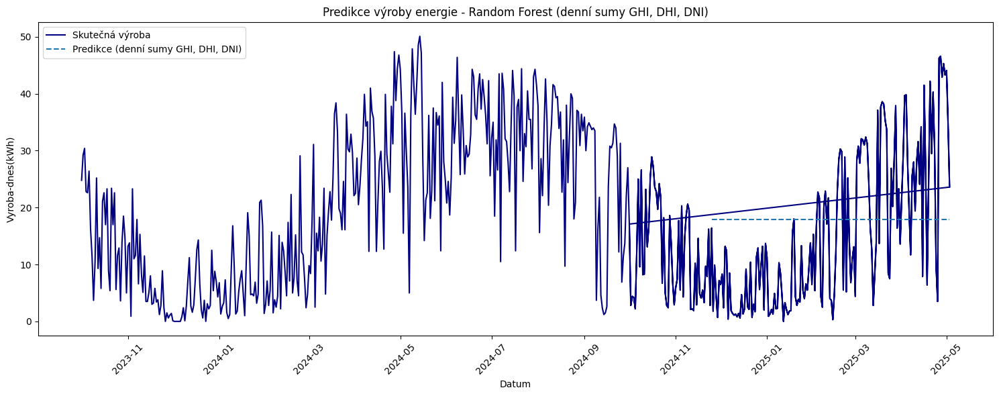

MAE: 11.92, RMSE: 13.40


In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt

# === 1. Načtení a příprava dat ===

# Načtení CSV souboru s výrobními daty
file_path_production = 'data_od_strejdy_vse.csv'
data = pd.read_csv(file_path_production, delimiter=';')

# Načtení CSV souboru s počasím
file_path_weather = 'open-meteo-49.81N15.47E380m.csv'
weather_data = pd.read_csv(file_path_weather, delimiter=',')

# Konvertování 'Aktualizovany_cas' a 'time' na datetime
data['Aktualizovany_cas'] = pd.to_datetime(data['Aktualizovany_cas'], errors='coerce')
weather_data['time'] = pd.to_datetime(weather_data['time'], errors='coerce')

# Přejmenování sloupce 'time' na 'Aktualizovany_cas' pro merge
weather_data = weather_data.rename(columns={'time': 'Aktualizovany_cas'})

# Sloučení dat podle 'Aktualizovany_cas'
data = pd.merge(data, weather_data, on='Aktualizovany_cas', how='left')

# Přejmenování sloupců počasí
data = data.rename(columns={
    'shortwave_radiation (W/m²)': 'GHI',
    'diffuse_radiation (W/m²)': 'DHI',
    'direct_normal_irradiance (W/m²)': 'DNI'
})

# Přidání časových atributů
data['year'] = data['Aktualizovany_cas'].dt.year
data['month'] = data['Aktualizovany_cas'].dt.month
data['day'] = data['Aktualizovany_cas'].dt.day
data['hour'] = data['Aktualizovany_cas'].dt.hour
data['weekday'] = data['Aktualizovany_cas'].dt.weekday
data['date'] = data['Aktualizovany_cas'].dt.date

# Agregace denních sum GHI, DHI, DNI
daily_sums = data.groupby('date')[['GHI', 'DHI', 'DNI']].sum().reset_index()

# Spojení denních sum s původními daty
data = pd.merge(data, daily_sums, on='date', suffixes=('', '_daily'))

# Odstranění řádků s chybějícími hodnotami
data = data.dropna(subset=['Vyroba-dnes(kWh)', 'GHI_daily', 'DHI_daily', 'DNI_daily'])

# Definice vstupních proměnných (pouze denní sumy)
features = ['GHI_daily', 'DHI_daily', 'DNI_daily']

# Výstupní vektor a datumy
y = data['Vyroba-dnes(kWh)'].values
dates = data['Aktualizovany_cas'].values

# Normalizace cílové proměnné
scaler_y = MinMaxScaler()
y_scaled = scaler_y.fit_transform(y.reshape(-1, 1)).ravel()

# Časově konzistentní dělení na train/test
split_idx = int(len(y) * 0.8)

# Rozdělení dat na trénovací a testovací sadu
X = data[features].values
X_train, X_test = X[:split_idx], X[split_idx:]
y_train, y_test = y_scaled[:split_idx], y_scaled[split_idx:]
dates_train, dates_test = dates[:split_idx], dates[split_idx:]

# Model
model = RandomForestRegressor(n_estimators=500, random_state=42)
model.fit(X_train, y_train)
y_pred_scaled = model.predict(X_test)
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1)).ravel()
y_test_orig = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()

# Graf
plt.figure(figsize=(15,6))
plt.plot(dates, y, label='Skutečná výroba', color='navy')
plt.plot(dates_test, y_pred, label='Predikce (denní sumy GHI, DHI, DNI)', linestyle='--')
plt.title('Predikce výroby energie - Random Forest (denní sumy GHI, DHI, DNI)')
plt.xlabel('Datum')
plt.ylabel('Vyroba-dnes(kWh)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

# Vyhodnocení
mae = mean_absolute_error(y_test_orig, y_pred)
rmse = np.sqrt(mean_squared_error(y_test_orig, y_pred))
print(f"MAE: {mae:.2f}, RMSE: {rmse:.2f}")

/tmp/ipython-input-1308117873.py:14: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start='2025-01-01', periods=24*28, freq='H')


MAE: 0.215, RMSE: 0.273


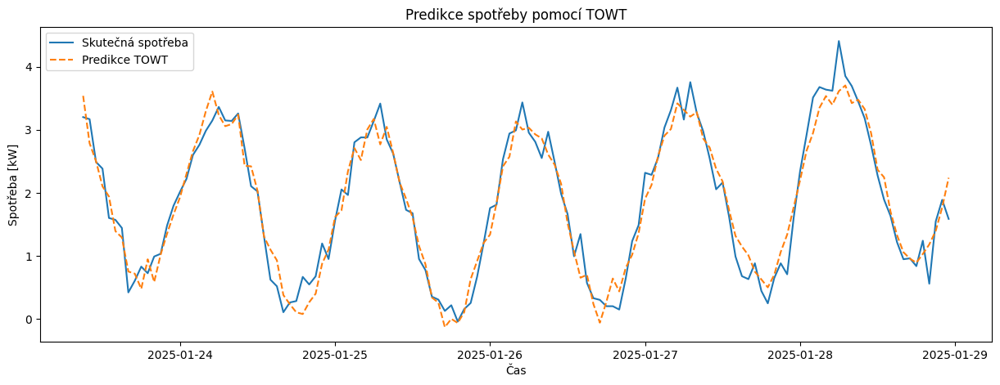

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt

# ----------------------------
# 1️⃣ Generování syntetických dat
# ----------------------------
np.random.seed(42)

# časové razítko: 4 týdny po hodinách
date_range = pd.date_range(start='2025-01-01', periods=24*28, freq='H')
n = len(date_range)

# syntetická spotřeba (v kW) – denní a týdenní cyklus + šum
hour_of_day = date_range.hour
day_of_week = date_range.dayofweek

consumption = (
    2 + 1.5*np.sin(2*np.pi*hour_of_day/24)        # denní cyklus
    + 0.5*np.sin(2*np.pi*day_of_week/7)           # týdenní cyklus
    + np.random.normal(0, 0.2, n)                 # náhodný šum
)

# syntetická teplota (°C)
temperature = 15 + 10*np.sin(2*np.pi*hour_of_day/24) + np.random.normal(0, 1, n)

# syntetická PV výroba (kW)
pv_production = np.maximum(0, 3*np.sin(2*np.pi*(hour_of_day-6)/24))  # výroba přes den, max 3 kW

# vytvoření dataframe
df = pd.DataFrame({
    'timestamp': date_range,
    'consumption': consumption,
    'temperature': temperature,
    'pv_production': pv_production
})

# ----------------------------
# 2️⃣ TOWT feature
# ----------------------------
df['hour_of_week'] = df['timestamp'].dt.dayofweek * 24 + df['timestamp'].dt.hour
df['hour_sin'] = np.sin(2 * np.pi * df['hour_of_week']/168)
df['hour_cos'] = np.cos(2 * np.pi * df['hour_of_week']/168)

# ----------------------------
# 3️⃣ Trénování modelu
# ----------------------------
# X: hour_sin, hour_cos, teplota, (volitelně pv_production)
X = df[['hour_sin', 'hour_cos', 'temperature', 'pv_production']]
y = df['consumption']

# train/test split (chronologicky)
split_idx = int(len(df)*0.8)
X_train, X_test = X.iloc[:split_idx], X.iloc[split_idx:]
y_train, y_test = y.iloc[:split_idx], y.iloc[split_idx:]

model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

# ----------------------------
# 4️⃣ Hodnocení
# ----------------------------
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"MAE: {mae:.3f}, RMSE: {rmse:.3f}")

# ----------------------------
# 5️⃣ Graf predikce vs. skutečnosti
# ----------------------------
plt.figure(figsize=(15,5))
plt.plot(df['timestamp'].iloc[split_idx:], y_test, label='Skutečná spotřeba')
plt.plot(df['timestamp'].iloc[split_idx:], y_pred, label='Predikce TOWT', linestyle='--')
plt.xlabel('Čas')
plt.ylabel('Spotřeba [kW]')
plt.title('Predikce spotřeby pomocí TOWT')
plt.legend()
plt.show()


/tmp/ipython-input-3571635102.py:13: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start='2025-01-01', periods=24*365, freq='H')


MAE: 0.291, RMSE: 0.366


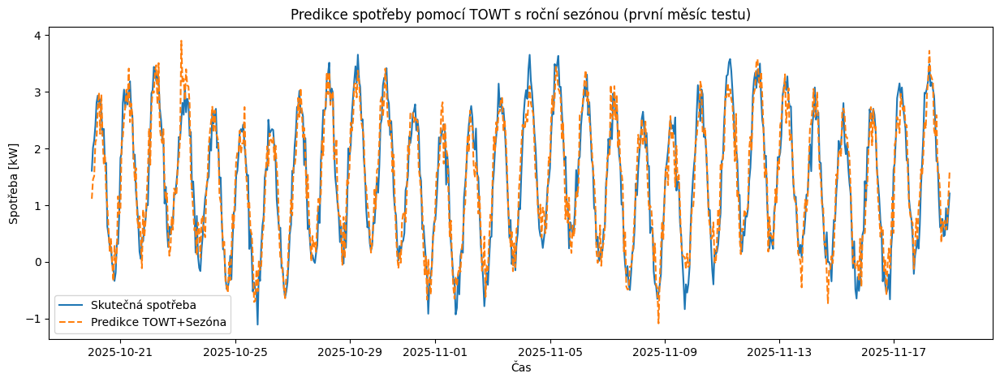

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt

# ----------------------------
# 1️⃣ Generování syntetických dat pro celý rok
# ----------------------------
np.random.seed(42)

# časové razítko: celý rok po hodinách
date_range = pd.date_range(start='2025-01-01', periods=24*365, freq='H')
n = len(date_range)

# denní a týdenní cyklus
hour_of_day = date_range.hour
day_of_week = date_range.dayofweek
day_of_year = date_range.dayofyear

# syntetická spotřeba (kW) – denní + týdenní + roční cyklus + šum
consumption = (
    2 + 1.5*np.sin(2*np.pi*hour_of_day/24)            # denní cyklus
    + 0.5*np.sin(2*np.pi*day_of_week/7)               # týdenní cyklus
    + 0.7*np.sin(2*np.pi*day_of_year/365)             # roční sezónní efekt
    + np.random.normal(0, 0.2, n)                     # šum
)

# syntetická teplota (°C) – roční sezónní cyklus + denní variace
temperature = 10 + 10*np.sin(2*np.pi*day_of_year/365) + 5*np.sin(2*np.pi*hour_of_day/24) + np.random.normal(0,1,n)

# syntetická PV výroba (kW)
pv_production = np.maximum(0, 3*np.sin(2*np.pi*(hour_of_day-6)/24))  # max 3 kW, jen denní hodiny

# dataframe
df = pd.DataFrame({
    'timestamp': date_range,
    'consumption': consumption,
    'temperature': temperature,
    'pv_production': pv_production
})

# ----------------------------
# 2️⃣ TOWT + sezónní feature
# ----------------------------
df['hour_of_week'] = df['timestamp'].dt.dayofweek * 24 + df['timestamp'].dt.hour
df['hour_sin'] = np.sin(2 * np.pi * df['hour_of_week']/168)
df['hour_cos'] = np.cos(2 * np.pi * df['hour_of_week']/168)

df['day_of_year'] = df['timestamp'].dt.dayofyear
df['year_sin'] = np.sin(2 * np.pi * df['day_of_year']/365)
df['year_cos'] = np.cos(2 * np.pi * df['day_of_year']/365)

# ----------------------------
# 3️⃣ Trénování modelu
# ----------------------------
X = df[['hour_sin','hour_cos','year_sin','year_cos','temperature','pv_production']]
y = df['consumption']

# chronologické rozdělení
split_idx = int(len(df)*0.8)
X_train, X_test = X.iloc[:split_idx], X.iloc[split_idx:]
y_train, y_test = y.iloc[:split_idx], y.iloc[split_idx:]

model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# ----------------------------
# 4️⃣ Hodnocení
# ----------------------------
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"MAE: {mae:.3f}, RMSE: {rmse:.3f}")

# ----------------------------
# 5️⃣ Graf predikce vs. skutečnosti (první měsíc testu)
# ----------------------------
plt.figure(figsize=(15,5))
plt.plot(df['timestamp'].iloc[split_idx:split_idx+720], y_test.iloc[:720], label='Skutečná spotřeba')
plt.plot(df['timestamp'].iloc[split_idx:split_idx+720], y_pred[:720], label='Predikce TOWT+Sezóna', linestyle='--')
plt.xlabel('Čas')
plt.ylabel('Spotřeba [kW]')
plt.title('Predikce spotřeby pomocí TOWT s roční sezónou (první měsíc testu)')
plt.legend()
plt.show()


/tmp/ipython-input-1794592387.py:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start='2025-01-01', periods=24*365, freq='H')


MAE: 1.070, RMSE: 1.214


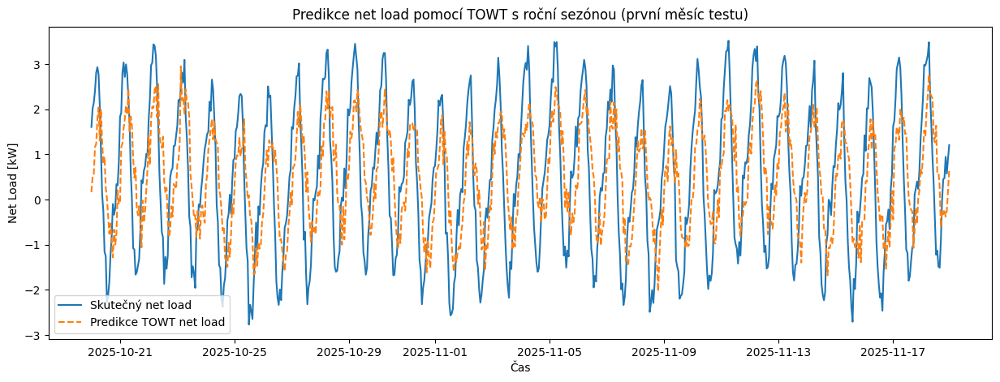

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt

# ----------------------------
# 1️⃣ Generování syntetických dat pro celý rok
# ----------------------------
np.random.seed(42)
date_range = pd.date_range(start='2025-01-01', periods=24*365, freq='H')
n = len(date_range)

hour_of_day = date_range.hour
day_of_week = date_range.dayofweek
day_of_year = date_range.dayofyear

# syntetická spotřeba
consumption = (
    2 + 1.5*np.sin(2*np.pi*hour_of_day/24)
    + 0.5*np.sin(2*np.pi*day_of_week/7)
    + 0.7*np.sin(2*np.pi*day_of_year/365)
    + np.random.normal(0, 0.2, n)
)

# syntetická teplota
temperature = 10 + 10*np.sin(2*np.pi*day_of_year/365) + 5*np.sin(2*np.pi*hour_of_day/24) + np.random.normal(0,1,n)

# syntetická PV výroba
pv_production = np.maximum(0, 3*np.sin(2*np.pi*(hour_of_day-6)/24))

# dataframe
df = pd.DataFrame({
    'timestamp': date_range,
    'consumption': consumption,
    'temperature': temperature,
    'pv_production': pv_production
})

# ----------------------------
# 2️⃣ Spočítat net load
# ----------------------------
df['net_load'] = df['consumption'] - df['pv_production']

# ----------------------------
# 3️⃣ TOWT + sezónní feature
# ----------------------------
df['hour_of_week'] = df['timestamp'].dt.dayofweek * 24 + df['timestamp'].dt.hour
df['hour_sin'] = np.sin(2 * np.pi * df['hour_of_week']/168)
df['hour_cos'] = np.cos(2 * np.pi * df['hour_of_week']/168)

df['day_of_year'] = df['timestamp'].dt.dayofyear
df['year_sin'] = np.sin(2 * np.pi * df['day_of_year']/365)
df['year_cos'] = np.cos(2 * np.pi * df['day_of_year']/365)

# ----------------------------
# 4️⃣ Trénování modelu
# ----------------------------
# vstupy: cyklické feature + teplota
X = df[['hour_sin','hour_cos','year_sin','year_cos','temperature']]
y = df['net_load']

split_idx = int(len(df)*0.8)
X_train, X_test = X.iloc[:split_idx], X.iloc[split_idx:]
y_train, y_test = y.iloc[:split_idx], y.iloc[split_idx:]

model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# ----------------------------
# 5️⃣ Hodnocení
# ----------------------------
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"MAE: {mae:.3f}, RMSE: {rmse:.3f}")

# ----------------------------
# 6️⃣ Graf predikce vs. skutečnosti (první měsíc testu)
# ----------------------------
plt.figure(figsize=(15,5))
plt.plot(df['timestamp'].iloc[split_idx:split_idx+720], y_test.iloc[:720], label='Skutečný net load')
plt.plot(df['timestamp'].iloc[split_idx:split_idx+720], y_pred[:720], label='Predikce TOWT net load', linestyle='--')
plt.xlabel('Čas')
plt.ylabel('Net Load [kW]')
plt.title('Predikce net load pomocí TOWT s roční sezónou (první měsíc testu)')
plt.legend()
plt.show()


Loading CSV (can take some time)...
Detected datetime column: utc_timestamp
Using load column: CZ_load_actual_entsoe_transparency
No temperature column found in OPSD -- continuing without temp.
Train rows: 49918, Test rows: 336 (test posledních 14 dní)
Training residual model: RandomForestRegressor
Evaluation on test (14 days): MAE = 81.297, RMSE = 115.200
TOWT baseline only: MAE = 450.705, RMSE = 537.633
Predictions saved to towt_predictions.csv


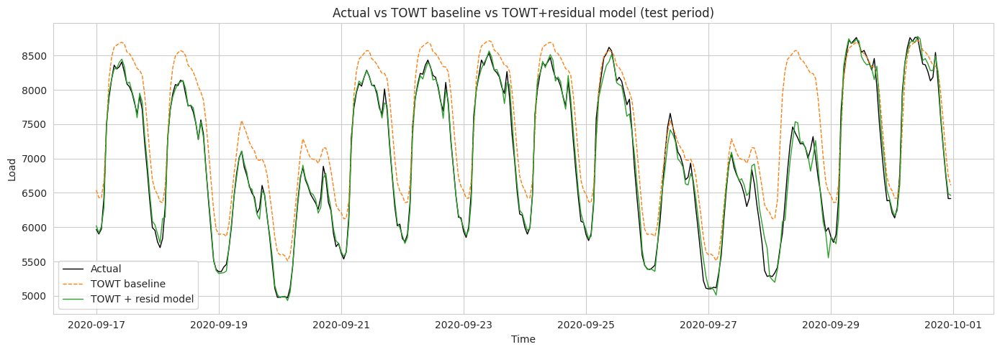

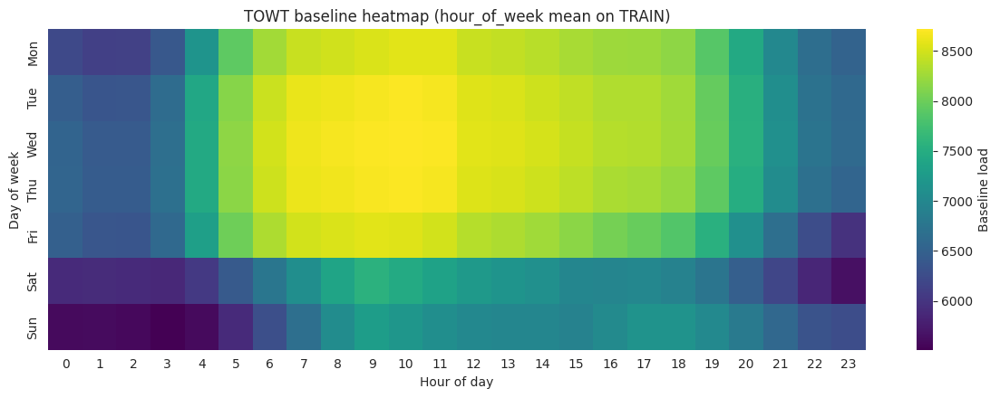

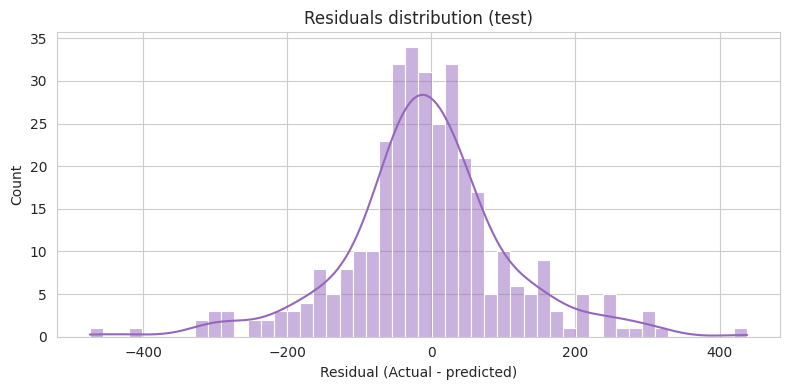

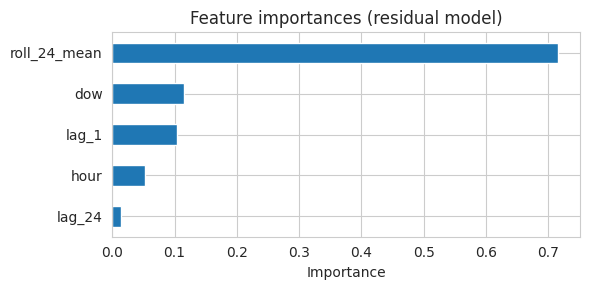

Feature importances (residual model):
roll_24_mean    0.715366
dow             0.114949
lag_1           0.103091
hour            0.052442
lag_24          0.014153


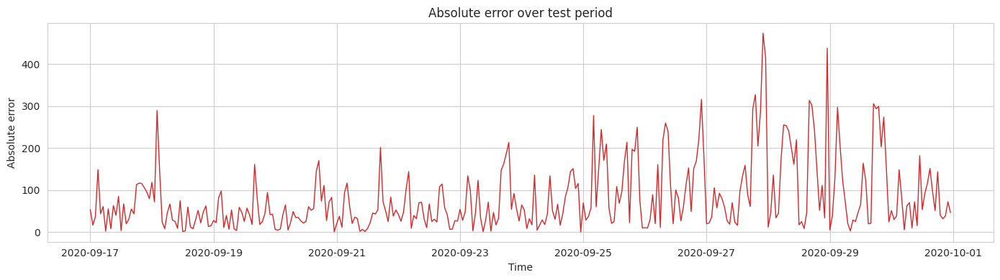

Plots displayed and also saved to /content/plots


In [ ]:
#!/usr/bin/env python3
"""
TOWT for OPSD (Colab-friendly) — shows plots inline.

Differences vs the saved-script:
- Each plotting function calls plt.show() so Colab/Jupyter will display plots immediately.
- Still saves plots to plots/ for convenience, but displays them inline.
- Meant to be run in a Colab cell as a script (%%bash python ...) or paste contents into a code cell.
"""
import os
import sys
import requests
import math
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error

# ---- Configuration ----
COUNTRY = "CZ"                       # country code/prefix used in OPSD columns
LOCAL_FILENAME = "time_series_opsd.csv"
OPSD_URLS = [
    "https://data.open-power-system-data.org/time_series/latest/time_series.csv",
    "https://data.open-power-system-data.org/time_series/time_series.csv",
    "https://data.open-power-system-data.org/time_series/latest/time_series_60min_singleindex.csv",
]
TEST_DAYS = 14                        # how many last days to hold out as test
RESID_MODEL = "rf"                    # "rf" or "lin"
RESAMPLE_FREQ = "1h"                  # regularize to hourly
PLOT_DIR = Path("plots")
PLOT_DIR.mkdir(exist_ok=True)

sns.set_style("whitegrid")

# ---- Helpers ----
def download_opsd(urls, local_file):
    for url in urls:
        try:
            print(f"Trying to download OPSD from {url} ...")
            r = requests.get(url, timeout=60)
            if r.status_code == 200 and len(r.content) > 2000:
                with open(local_file, "wb") as f:
                    f.write(r.content)
                print(f"Downloaded and saved to {local_file}")
                return local_file
            else:
                print(f"URL returned status {r.status_code} or content too small.")
        except Exception as e:
            print(f"Download failed from {url}: {e}")
    return None

def find_datetime_column(df):
    candidates = [c for c in df.columns if any(k in c.lower() for k in ("utc", "time", "date", "timestamp"))]
    if not candidates:
        return None
    for cand in ["utc_timestamp", "time", "datetime", "date", "timestamp"]:
        if cand in df.columns:
            return cand
    return candidates[0]

def find_load_column(df, country):
    target1 = f"{country}_load_actual_entsoe_transparency"
    if target1 in df.columns:
        return target1
    loads = [c for c in df.columns if ("_load_" in c) or ("load_actual" in c) or (c.lower().endswith("_load")) or ("load" in c.lower())]
    if not loads:
        return None
    for c in loads:
        if country.lower() in c.lower():
            return c
    return loads[0]

# ---- Plotting helpers (show in Colab) ----
def plot_time_series(test_idx, actual, baseline, pred, outpath=None):
    plt.figure(figsize=(14,5))
    plt.plot(test_idx, actual, label="Actual", color="black", linewidth=1)
    plt.plot(test_idx, baseline, label="TOWT baseline", color="tab:orange", linestyle="--", linewidth=1)
    plt.plot(test_idx, pred, label="TOWT + resid model", color="tab:green", linewidth=1)
    plt.legend()
    plt.xlabel("Time")
    plt.ylabel("Load")
    plt.title("Actual vs TOWT baseline vs TOWT+residual model (test period)")
    plt.tight_layout()
    if outpath:
        plt.savefig(outpath)
    plt.show()
    plt.close()

def plot_baseline_heatmap(tow_map, outpath=None):
    arr = np.full((7,24), np.nan)
    for k,v in tow_map.items():
        dow = int(k // 24)
        hour = int(k % 24)
        arr[dow, hour] = v
    plt.figure(figsize=(12,4.5))
    sns.heatmap(arr, cmap="viridis", cbar_kws={'label':'Baseline load'}, yticklabels=["Mon","Tue","Wed","Thu","Fri","Sat","Sun"])
    plt.xlabel("Hour of day")
    plt.ylabel("Day of week")
    plt.title("TOWT baseline heatmap (hour_of_week mean on TRAIN)")
    plt.tight_layout()
    if outpath:
        plt.savefig(outpath)
    plt.show()
    plt.close()

def plot_residuals_hist(residuals, outpath=None):
    plt.figure(figsize=(8,4))
    sns.histplot(residuals, kde=True, bins=50, color="tab:purple")
    plt.xlabel("Residual (Actual - predicted)")
    plt.title("Residuals distribution (test)")
    plt.tight_layout()
    if outpath:
        plt.savefig(outpath)
    plt.show()
    plt.close()

def plot_feature_importances(feat_names, importances, outpath=None):
    fi = pd.Series(importances, index=feat_names).sort_values(ascending=True)
    plt.figure(figsize=(6, max(3, 0.3*len(feat_names))))
    fi.plot(kind="barh", color="tab:blue")
    plt.xlabel("Importance")
    plt.title("Feature importances (residual model)")
    plt.tight_layout()
    if outpath:
        plt.savefig(outpath)
    plt.show()
    plt.close()

def plot_error_timeseries(idx, errors, outpath=None):
    plt.figure(figsize=(14,4))
    plt.plot(idx, errors, color="tab:red", linewidth=1)
    plt.xlabel("Time")
    plt.ylabel("Absolute error")
    plt.title("Absolute error over test period")
    plt.tight_layout()
    if outpath:
        plt.savefig(outpath)
    plt.show()
    plt.close()

# ---- Main flow ----
def main(show_plots=True):
    # 1) download if needed
    if not os.path.exists(LOCAL_FILENAME):
        local = download_opsd(OPSD_URLS, LOCAL_FILENAME)
        if local is None:
            print("Could not download OPSD automatically. Please download time_series CSV and save as", LOCAL_FILENAME)
            sys.exit(1)

    # 2) load CSV and detect columns
    print("Loading CSV (can take some time)...")
    df = pd.read_csv(LOCAL_FILENAME, low_memory=False)
    dt_col = find_datetime_column(df)
    if dt_col is None:
        print("Datetime column not found. Available columns (sample):", df.columns.tolist()[:50])
        sys.exit(1)
    print("Detected datetime column:", dt_col)
    df[dt_col] = pd.to_datetime(df[dt_col], utc=True, errors="coerce")
    df = df.set_index(dt_col).sort_index()

    load_col = find_load_column(df, COUNTRY)
    if load_col is None:
        print("No load column found. Sample columns with 'load':", [c for c in df.columns if "load" in c.lower()][:40])
        sys.exit(1)
    print("Using load column:", load_col)

    # optional temperature
    temp_candidates = [c for c in df.columns if "temperature" in c.lower() or "temp" in c.lower()]
    temp_col = None
    if temp_candidates:
        for c in temp_candidates:
            if COUNTRY.lower() in c.lower():
                temp_col = c
                break
        if temp_col is None:
            temp_col = temp_candidates[0]
    if temp_col:
        print("Found temperature column:", temp_col)
    else:
        print("No temperature column found in OPSD -- continuing without temp.")

    # select columns and coerce numeric
    cols = [load_col] + ([temp_col] if temp_col else [])
    data = df[cols].copy()
    data[load_col] = pd.to_numeric(data[load_col], errors="coerce")
    if temp_col:
        data[temp_col] = pd.to_numeric(data[temp_col], errors="coerce")

    # resample to regular hourly index and ffill small gaps
    data = data.resample(RESAMPLE_FREQ).mean()
    data = data.ffill(limit=6)

    # create time features and lags
    data["hour"] = data.index.hour
    data["dow"] = data.index.dayofweek
    data["hour_of_week"] = data["dow"] * 24 + data["hour"]
    data["lag_1"] = data[load_col].shift(1)
    data["lag_24"] = data[load_col].shift(24)
    data["roll_24_mean"] = data[load_col].shift(1).rolling(24, min_periods=1).mean()

    data = data.dropna(subset=["lag_1", "lag_24"])
    if data.empty:
        print("After generating lags dataset is empty. Check input data.")
        sys.exit(1)

    last_ts = data.index.max()
    test_start = last_ts - pd.Timedelta(days=TEST_DAYS) + pd.Timedelta(hours=1)
    train = data[data.index < test_start].copy()
    test = data[data.index >= test_start].copy()
    print(f"Train rows: {len(train)}, Test rows: {len(test)} (test posledních {TEST_DAYS} dní)")

    # build TOWT baseline (hour_of_week mean on train)
    tow_baseline_map = train.groupby("hour_of_week")[load_col].mean()
    tow_baseline_dict = tow_baseline_map.to_dict()
    global_mean = train[load_col].mean()

    train["towt_baseline"] = train["hour_of_week"].map(tow_baseline_dict).fillna(global_mean)
    test["towt_baseline"] = test["hour_of_week"].map(tow_baseline_dict).fillna(global_mean)

    train["residual"] = train[load_col] - train["towt_baseline"]
    test["residual"] = test[load_col] - test["towt_baseline"]

    feat_cols = ["hour", "dow", "lag_1", "lag_24", "roll_24_mean"]
    if temp_col:
        feat_cols.append(temp_col)

    X_train = train[feat_cols].ffill().fillna(0)
    y_train = train["residual"].fillna(0)
    X_test = test[feat_cols].ffill().fillna(0)
    y_test_full = test[load_col].values  # actual full target for evaluation

    # train residual model
    if RESID_MODEL == "rf":
        model = RandomForestRegressor(n_estimators=150, n_jobs=-1, random_state=42)
    else:
        model = LinearRegression()
    print("Training residual model:", model.__class__.__name__)
    model.fit(X_train, y_train)

    # predict residuals and combine with baseline
    pred_resid_test = model.predict(X_test)
    pred_total = test["towt_baseline"].values + pred_resid_test

    # evaluate
    mae = mean_absolute_error(y_test_full, pred_total)
    mse = mean_squared_error(y_test_full, pred_total)
    rmse = math.sqrt(mse)
    print(f"Evaluation on test ({TEST_DAYS} days): MAE = {mae:.3f}, RMSE = {rmse:.3f}")

    # baseline-only stats
    baseline_only = test["towt_baseline"].values
    mae_base = mean_absolute_error(y_test_full, baseline_only)
    mse_base = mean_squared_error(y_test_full, baseline_only)
    rmse_base = math.sqrt(mse_base)
    print(f"TOWT baseline only: MAE = {mae_base:.3f}, RMSE = {rmse_base:.3f}")

    # Save predictions CSV
    out = test.copy()
    out["pred_towt_plus_resid"] = pred_total
    out["pred_towt_only"] = baseline_only
    cols_out = [load_col, "pred_towt_only", "pred_towt_plus_resid"]
    out[cols_out].to_csv("towt_predictions.csv")
    print("Predictions saved to towt_predictions.csv")

    # --- Plots (show if show_plots=True) ---
    if show_plots:
        plot_time_series(test.index, out[load_col].values, out["pred_towt_only"].values, out["pred_towt_plus_resid"].values, PLOT_DIR / "timeseries_test.png")
        plot_baseline_heatmap(tow_baseline_dict, PLOT_DIR / "baseline_heatmap.png")
        test_residuals = out[load_col].values - out["pred_towt_plus_resid"].values
        plot_residuals_hist(test_residuals, PLOT_DIR / "residuals_hist.png")
        if hasattr(model, "feature_importances_"):
            plot_feature_importances(feat_cols, model.feature_importances_, PLOT_DIR / "feature_importances.png")
            fi = pd.Series(model.feature_importances_, index=feat_cols).sort_values(ascending=False)
            print("Feature importances (residual model):")
            print(fi.to_string())
        else:
            print("Model has no feature_importances_ (likely LinearRegression).")
        abs_errors = np.abs(out[load_col].values - out["pred_towt_plus_resid"].values)
        plot_error_timeseries(test.index, abs_errors, PLOT_DIR / "error_timeseries.png")
        print(f"Plots displayed and also saved to {PLOT_DIR.resolve()}")

if __name__ == "__main__":
    # In Colab you can import this script and call main(show_plots=True)
    main(show_plots=True)

R² = 0.987
Počet parametrů: 34

Top 10 vlivných proměnných:
      feature        coef
0   intercept  100.147281
13        h_9    5.350068
18       h_14    5.271961
16       h_12    5.228902
21       h_17    5.198514
22       h_18    5.161053
14       h_10    4.781246
19       h_15    4.653555
12        h_8    4.646995
17       h_13    4.510950


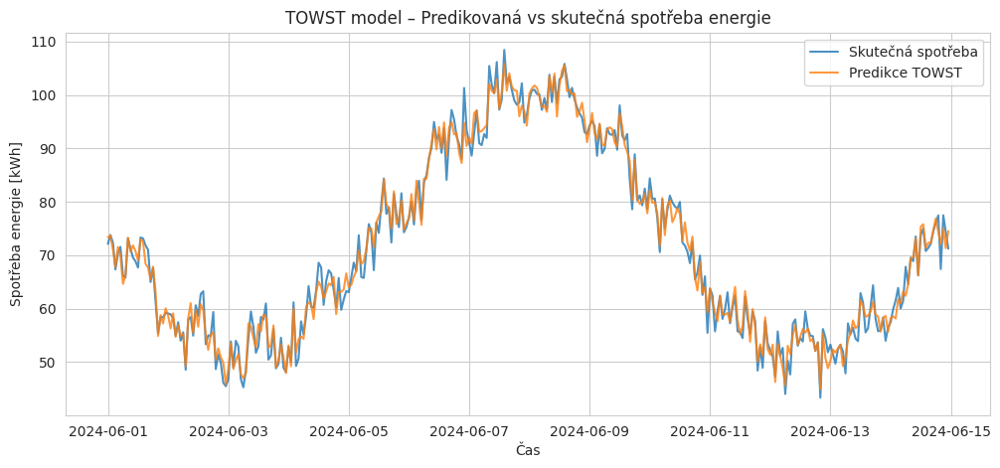

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ==========================================
# 🏗️ 1️⃣ Generování syntetických dat
# ==========================================
np.random.seed(42)
n_days = 14
n_points = n_days * 24  # hourly data
time_index = pd.date_range("2024-06-01", periods=n_points, freq="h")  # use 'h' instead of 'H'

temperature = 10 + 10 * np.sin(np.linspace(0, 3*np.pi, n_points)) + np.random.normal(0, 1, n_points)
solar_irradiance = np.maximum(0, 800 * np.sin(np.linspace(0, 6*np.pi, n_points) % (2*np.pi)))  # daily cycle

hour = pd.Series(time_index.hour, index=time_index)
dayofweek = pd.Series(time_index.dayofweek, index=time_index)

# Skutečný vztah (ground truth)
energy = (
    100
    + 5 * (hour.between(8, 18))
    - 2.5 * temperature
    - 0.005 * solar_irradiance
    + 0.000002 * solar_irradiance**2
    + np.random.normal(0, 2, n_points)
)

df = pd.DataFrame({
    "energy": energy,
    "temperature": temperature,
    "solar": solar_irradiance,
    "hour": hour,
    "dayofweek": dayofweek
}, index=time_index)

# ==========================================
# ⚙️ 2️⃣ Konstrukce návrhové matice X (Time-of-Week + Solar + Temp)
# ==========================================
hour_dummies = pd.get_dummies(df["hour"], prefix="h", drop_first=True)
day_dummies = pd.get_dummies(df["dayofweek"], prefix="d", drop_first=True)

X = pd.concat([
    pd.Series(1, index=df.index, name="intercept"),   # konstanta
    df["temperature"],
    df["temperature"]**2,
    df["solar"],
    df["solar"]**2,
    hour_dummies,
    day_dummies
], axis=1)

# 🔧 Oprava: zajistíme, že všechny sloupce jsou float
X = X.astype(float)

y = df["energy"].values.astype(float)

# ==========================================
# 🧮 3️⃣ Řešení lineární regrese ručně (OLS)
# ==========================================
X_matrix = X.values
beta = np.linalg.inv(X_matrix.T @ X_matrix) @ X_matrix.T @ y

# ==========================================
# 📈 4️⃣ Predikce a vyhodnocení
# ==========================================
y_pred = X_matrix @ beta
r2 = 1 - np.sum((y - y_pred)**2) / np.sum((y - np.mean(y))**2)

print(f"R² = {r2:.3f}")
print(f"Počet parametrů: {len(beta)}")

# ==========================================
# 🔍 5️⃣ Nejvlivnější koeficienty
# ==========================================
coef_df = pd.DataFrame({
    "feature": X.columns,
    "coef": beta
}).sort_values("coef", ascending=False)

print("\nTop 10 vlivných proměnných:")
print(coef_df.head(10))

# ==========================================
# 📊 6️⃣ Vizualizace výsledků
# ==========================================
plt.figure(figsize=(12,5))
plt.plot(df.index, y, label="Skutečná spotřeba", alpha=0.8)
plt.plot(df.index, y_pred, label="Predikce TOWST", alpha=0.8)
plt.legend()
plt.title("TOWST model – Predikovaná vs skutečná spotřeba energie")
plt.xlabel("Čas")
plt.ylabel("Spotřeba energie [kWh]")
plt.grid(True)
plt.show()


Generuji data...
Spouštím MPC simulaci...
Simuluji variantu bez baterie...
Kreslím výsledky...


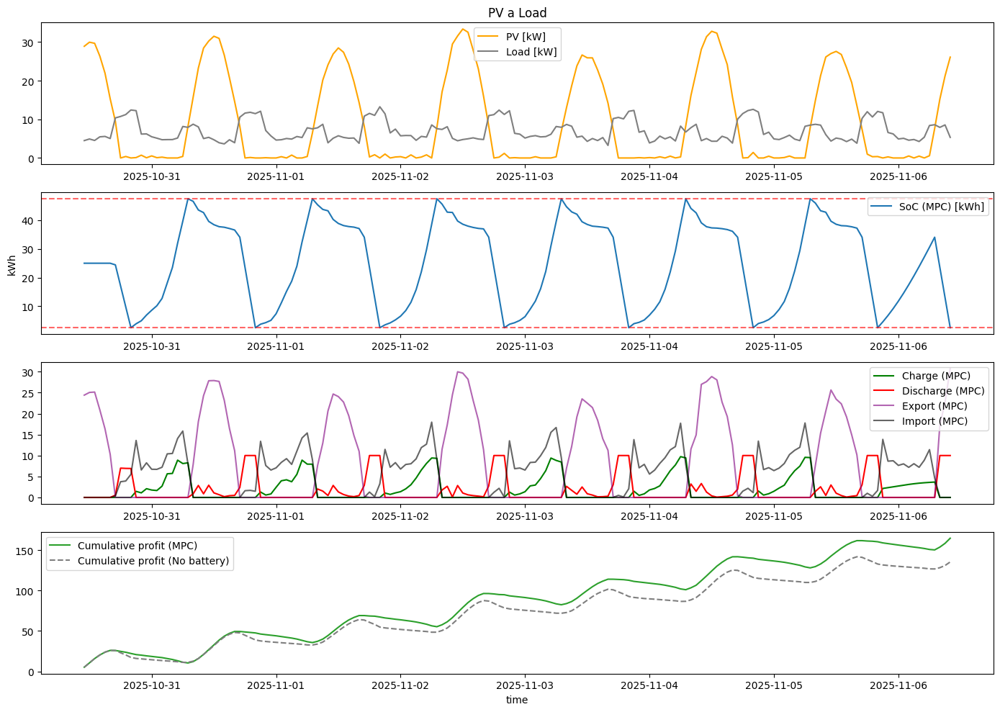

,net_kW,buy_price,sell_price,charge_kW_MPC,discharge_kW_MPC,import_kW_MPC,export_kW_MPC,import_kW_noBatt,export_kW_noBatt,soc_kWh,profit_step_MPC_€,profit_step_noBatt_€
time,,,,,,,,,,,,
2025-10-30 11:00:00,24.40,0.25,0.2125,0.00,0.00,0.00,24.40,0.00,24.40,25.00,5.186,5.186
2025-10-30 12:00:00,25.05,0.25,0.2125,0.00,0.00,0.00,25.05,0.00,25.05,25.00,5.323,5.323
2025-10-30 13:00:00,25.14,0.25,0.2125,0.00,0.00,0.00,25.14,0.00,25.14,25.00,5.342,5.342
2025-10-30 14:00:00,20.90,0.25,0.2125,0.00,0.00,0.00,20.90,0.00,20.90,25.00,4.440,4.440
2025-10-30 15:00:00,16.37,0.25,0.2125,0.00,0.00,0.00,16.36,0.00,16.37,25.00,3.478,3.478
2025-10-30 16:00:00,10.28,0.25,0.2125,0.00,0.00,0.00,10.28,0.00,10.28,25.00,2.185,2.185
2025-10-30 17:00:00,-0.89,0.25,0.2125,0.00,0.54,0.35,0.00,0.89,0.00,24.43,-0.099,-0.224
2025-10-30 18:00:00,-10.74,0.25,0.2125,0.00,6.99,3.75,0.00,10.74,0.00,17.07,-1.077,-2.685
2025-10-30 19:00:00,-10.85,0.25,0.2125,0.00,6.93,3.92,0.00,10.85,0.00,9.77,-1.119,-2.713


Celkový kumulativní profit (MPC): 164.59 €
Celkový kumulativní profit (No battery): 135.28 €
Rozdíl (MPC - NoBatt): 29.31 €
Hotovo. Nahrajte svá data do generate_data() nebo přepište df přímo.


In [ ]:
# MPC pro řízení fotovoltaiky + baterie (Google Colab-ready)
# OPRAVA: fallback solver + automatická instalace pokud chybí (ECOS/OSQP/SCS)
#
# Jak použít v Colab:
# 1) Spusť buňku s tímto skriptem (nebo zkopíruj obsah do buňky).
# 2) Pokud se objeví instalace, bude provedena automaticky (pip).
# 3) Pokud instalace selže nebo po instalaci CVXPY potřebujete restart runtime, restartujte a spusťte znovu.
#
# Poznámka: skript nyní zkouší solvory OSQP, ECOS, SCS v tomto pořadí.
# OSQP vyžaduje kvadratickou část v objektivu — přidal jsem velmi malou L2 regularizaci,
# aby bylo možné použít OSQP (rychlý a často dostupný v Colab).

import sys
import subprocess
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

# ---- Zajistí instalaci balíčků pokud chybí ----
def _install(packages):
    subprocess.check_call([sys.executable, "-m", "pip", "install", *packages])

# Pokusíme se importovat cvxpy, pokud selže, nainstalujeme závislosti a zkusíme znovu.
try:
    import cvxpy as cp
except Exception:
    print("cvxpy nebo závislosti nenalezeny -> instalace cvxpy, ecos, osqp, scs ...")
    try:
        _install(["cvxpy", "ecos", "osqp", "scs"])
    except Exception as e:
        print("Automatická instalace balíčků selhala, zkuste spustit ručně v Colab buňce:")
        print("%pip install cvxpy ecos osqp scs")
        raise e
    import cvxpy as cp

# ====== KONFIGURACE ======
DT = 1.0                 # časový krok [h] (upravitelné: 0.25 pro 15 min)
HORIZON = 24             # MPC horizont v krocích (24h)
TOTAL_DAYS = 7           # délka simulace
N_TOTAL = int(TOTAL_DAYS * 24 / DT)

# Bateriové parametry
CAPACITY = 50.0          # kWh
P_MAX = 10.0             # kW nabíjení/vybíjení max
SOC0 = 0.5 * CAPACITY    # počáteční SoC [kWh]
SOC_MIN = 0.05 * CAPACITY
SOC_MAX = 0.95 * CAPACITY
ETA_CH = 0.95
ETA_DIS = 0.95

# Cenové a ekonomické parametry
BUY_PRICE_DAY = 0.25
BUY_PRICE_NIGHT = 0.10
SELL_RATIO = 0.85         # sell_price = SELL_RATIO * buy_price
DEGRADATION_COST = 0.02   # €/kWh throughput (penalizace cyklování)

# Omezení sítě (volitelné)
MAX_EXPORT = 100.0
MAX_IMPORT = 100.0

# ====== GENEROVÁNÍ UKÁZKOVÝCH DAT / PREDIKCÍ ======
def generate_data(n_hours):
    """
    Vygeneruje syntetická data:
    - PV výroba (kW) jako denní sinus s náhodným šumem
    - Spotřeba (kW) jako bazální + dopolední/večerní špičky
    - Ceny buy/sell podle hodiny
    Vrací DataFrame s indexem časových kroků.
    """
    rng = pd.date_range(start=datetime.now().replace(minute=0, second=0, microsecond=0),
                        periods=n_hours, freq=f"{int(DT*60)}min")
    hour = rng.hour.values
    # PV: max 30 kW v poledne, nulová v noci
    pv = 30.0 * np.clip(np.sin((hour - 6) / 24 * 2 * np.pi) , 0, None)
    pv *= (1 + 0.1 * np.sin(np.linspace(0, 6*np.pi, n_hours)))
    pv += np.random.normal(0, 0.5, size=n_hours)
    pv = np.clip(pv, 0, None)
    # Load: bazální 5 kW, večer špička + ráno
    base_load = 5.0 + 1.5 * (np.sin((hour - 18) / 24 * 2*np.pi) * (hour>=16))
    morning_peak = 3.0 * ((hour>=6) & (hour<=9))
    evening_peak = 6.0 * ((hour>=17) & (hour<=21))
    load = base_load + morning_peak + evening_peak + np.random.normal(0, 0.5, size=n_hours)
    load = np.clip(load, 0.5, None)
    # Ceny: dražší přes den, levněji v noci (€/kWh)
    buy_price = np.where((hour >= 8) & (hour <= 20), BUY_PRICE_DAY, BUY_PRICE_NIGHT)
    sell_price = SELL_RATIO * buy_price
    df = pd.DataFrame({
        "time": rng,
        "pv_kW": pv,
        "load_kW": load,
        "net_kW": pv - load,      # kladné = přebytek, záporné = deficit
        "buy_price": buy_price,
        "sell_price": sell_price
    }).set_index("time")
    return df

# ====== MPC FUNKCE (deterministické ekonomické MPC) ======
def solve_mpc_step(pred_net, pred_buy_price, pred_sell_price, soc_init):
    """
    Řeší deterministickou MPC optimalizaci přes časový horizont délky H.
    Vstupy: pred_net (H,), pred_buy_price (H,), pred_sell_price (H,), soc_init [kWh]
    Vrací vektory akcí délky H: charge, discharge, imp, exp a SoC trajektorii (len H+1).
    """
    H = len(pred_net)
    # proměnné (kW)
    charge = cp.Variable(H, nonneg=True)
    discharge = cp.Variable(H, nonneg=True)
    imp = cp.Variable(H, nonneg=True)
    exp = cp.Variable(H, nonneg=True)
    soc = cp.Variable(H+1)

    constraints = []
    constraints += [soc[0] == soc_init]
    # kapacity a power limity
    for t in range(H):
        constraints += [charge[t] <= P_MAX]
        constraints += [discharge[t] <= P_MAX]
        constraints += [imp[t] <= MAX_IMPORT]
        constraints += [exp[t] <= MAX_EXPORT]
        # bilance výkonu: net + discharge - charge + imp - exp = 0
        constraints += [pred_net[t] + discharge[t] - charge[t] + imp[t] - exp[t] == 0]
        # SoC aktualizace (kWh): soc_{t+1} = soc_t + eta_ch*charge*dt - (1/eta_dis)*discharge*dt
        constraints += [soc[t+1] == soc[t] + ETA_CH * charge[t] * DT - (1.0/ETA_DIS) * discharge[t] * DT]
        # SoC hranice
        constraints += [soc[t+1] >= SOC_MIN, soc[t+1] <= SOC_MAX]

    # Objective: minimalizuj náklady = buy*imp - sell*exp + degradace*(charge+discharge)
    # Přidáme velmi malou kvadratickou regularizaci, aby byl problém QP (pomůže OSQP).
    eps_q = 1e-6
    cost = 0
    for t in range(H):
        cost += pred_buy_price[t] * imp[t] * DT - pred_sell_price[t] * exp[t] * DT
        cost += DEGRADATION_COST * (charge[t] + discharge[t]) * DT
        # malá penalizace simultánního nabíjení+vybíjení (nepovinné), aby se minimalizovalo ping-pong
        cost += 1e-4 * (charge[t] + discharge[t])
        cost += eps_q * (cp.square(charge[t]) + cp.square(discharge[t]))

    prob = cp.Problem(cp.Minimize(cost), constraints)

    # Pokusíme se použít seřazené solvory (rychlejší/častěji dostupné v Colab: OSQP, ECOS, SCS)
    solvers_to_try = [cp.OSQP, cp.ECOS, cp.SCS]
    last_exc = None
    for s in solvers_to_try:
        try:
            prob.solve(solver=s, verbose=true)
            if prob.status in ["optimal", "optimal_inaccurate"]:
                break
        except Exception as e:
            last_exc = e
            # print(f"Solver {s} selhal: {e}")
            continue

    if prob.status not in ["optimal", "optimal_inaccurate"]:
        # nezdařilo se; vrátíme nuly a log chyby
        # Pokud dojde k chybě solveru, vypíšeme poslední chybu pro ladění
        if last_exc is not None:
            print("Solver error (poslední):", repr(last_exc))
        else:
            print("Optimization problem nebyl vyřešen: stav", prob.status)
        H = len(pred_net)
        return (np.zeros(H), np.zeros(H), np.zeros(H), np.zeros(H), np.ones(H+1)*soc_init)
    return (charge.value, discharge.value, imp.value, exp.value, soc.value)

# ====== SIMULACE: MVC ROLLING-HORIZON ======
def run_mpc_simulation(df):
    n = len(df)
    soc = SOC0
    soc_traj = []
    charge_log = np.zeros(n)
    discharge_log = np.zeros(n)
    imp_log = np.zeros(n)
    exp_log = np.zeros(n)
    profit_step = np.zeros(n)
    for t in range(n):
        # připrav predikci (pokud blízko konce, zkrátíme horizon)
        h = min(HORIZON, n - t)
        pred_net = df["net_kW"].values[t:t+h]
        pred_buy = df["buy_price"].values[t:t+h]
        pred_sell = df["sell_price"].values[t:t+h]
        ch, dis, im, ex, soc_pred = solve_mpc_step(pred_net, pred_buy, pred_sell, soc)
        # aplikuj pouze první krok
        c0 = float(ch[0]) if h>0 else 0.0
        d0 = float(dis[0]) if h>0 else 0.0
        i0 = float(im[0]) if h>0 else 0.0
        e0 = float(ex[0]) if h>0 else 0.0
        # aktualizace SoC
        soc = soc + ETA_CH * c0 * DT - (1.0/ETA_DIS) * d0 * DT
        soc = float(np.clip(soc, SOC_MIN, SOC_MAX))
        soc_traj.append(soc)
        charge_log[t] = c0
        discharge_log[t] = d0
        imp_log[t] = i0
        exp_log[t] = e0
        # okamžitý profit: export * sell - import * buy - degradace
        profit_step[t] = e0 * df["sell_price"].values[t] * DT - i0 * df["buy_price"].values[t] * DT - DEGRADATION_COST * (c0 + d0) * DT
    df_res = df.copy()
    df_res["charge_kW"] = charge_log
    df_res["discharge_kW"] = discharge_log
    df_res["import_kW"] = imp_log
    df_res["export_kW"] = exp_log
    df_res["soc_kWh"] = np.array(soc_traj)
    df_res["profit_step_€"] = profit_step
    df_res["profit_cum_€"] = np.cumsum(profit_step)
    return df_res

# ====== BASELINE: bez baterie (vše jde do sítě) ======
def run_no_battery(df):
    n = len(df)
    imp = np.zeros(n)
    exp = np.zeros(n)
    profit_step = np.zeros(n)
    for t in range(n):
        net = df["net_kW"].values[t]
        if net >= 0:
            # přebytek -> export
            exp[t] = min(net, MAX_EXPORT)
            imp[t] = 0.0
        else:
            # deficit -> import
            imp[t] = min(-net, MAX_IMPORT)
            exp[t] = 0.0
        profit_step[t] = exp[t] * df["sell_price"].values[t] * DT - imp[t] * df["buy_price"].values[t] * DT
    dfb = df.copy()
    dfb["charge_kW"] = 0.0
    dfb["discharge_kW"] = 0.0
    dfb["import_kW"] = imp
    dfb["export_kW"] = exp
    dfb["soc_kWh"] = np.nan
    dfb["profit_step_€"] = profit_step
    dfb["profit_cum_€"] = np.cumsum(profit_step)
    return dfb

# ====== PLOTVÁNÍ A VÝSTUPY ======
def plot_results(df_mpc, df_base, rows_to_show=72):
    times = df_mpc.index
    plt.figure(figsize=(14,10))

    ax1 = plt.subplot(4,1,1)
    plt.plot(times, df_mpc["pv_kW"], label="PV [kW]", color="orange")
    plt.plot(times, df_mpc["load_kW"], label="Load [kW]", color="tab:gray")
    plt.title("PV a Load")
    plt.legend()

    ax2 = plt.subplot(4,1,2, sharex=ax1)
    plt.plot(times, df_mpc["soc_kWh"], label="SoC (MPC) [kWh]", color="tab:blue")
    plt.axhline(SOC_MAX, color='red', linestyle='--', alpha=0.6)
    plt.axhline(SOC_MIN, color='red', linestyle='--', alpha=0.6)
    plt.ylabel("kWh")
    plt.legend()

    ax3 = plt.subplot(4,1,3, sharex=ax1)
    plt.plot(times, df_mpc["charge_kW"], label="Charge (MPC)", color="green")
    plt.plot(times, df_mpc["discharge_kW"], label="Discharge (MPC)", color="red")
    plt.plot(times, df_mpc["export_kW"], label="Export (MPC)", color="purple", alpha=0.6)
    plt.plot(times, df_mpc["import_kW"], label="Import (MPC)", color="black", alpha=0.6)
    plt.legend()

    ax4 = plt.subplot(4,1,4, sharex=ax1)
    plt.plot(times, df_mpc["profit_cum_€"], label="Cumulative profit (MPC)", color="tab:green")
    plt.plot(times, df_base["profit_cum_€"], label="Cumulative profit (No battery)", color="tab:gray", linestyle='--')
    plt.legend()
    plt.xlabel("time")

    plt.tight_layout()
    plt.show()

    # Tabulka prvních rows_to_show kroků pro srovnání
    comp = pd.DataFrame({
        "net_kW": df_mpc["net_kW"].round(2),
        "buy_price": df_mpc["buy_price"],
        "sell_price": df_mpc["sell_price"],
        "charge_kW_MPC": df_mpc["charge_kW"].round(2),
        "discharge_kW_MPC": df_mpc["discharge_kW"].round(2),
        "import_kW_MPC": df_mpc["import_kW"].round(2),
        "export_kW_MPC": df_mpc["export_kW"].round(2),
        "import_kW_noBatt": df_base["import_kW"].round(2),
        "export_kW_noBatt": df_base["export_kW"].round(2),
        "soc_kWh": df_mpc["soc_kWh"].round(2),
        "profit_step_MPC_€": df_mpc["profit_step_€"].round(3),
        "profit_step_noBatt_€": df_base["profit_step_€"].round(3)
    }, index=df_mpc.index)
    try:
        from IPython.display import display
        display(comp.head(rows_to_show))
    except:
        print(comp.head(rows_to_show))
    # Shrnutí
    total_mpc = df_mpc["profit_cum_€"].iloc[-1]
    total_no = df_base["profit_cum_€"].iloc[-1]
    print(f"Celkový kumulativní profit (MPC): {total_mpc:.2f} €")
    print(f"Celkový kumulativní profit (No battery): {total_no:.2f} €")
    print(f"Rozdíl (MPC - NoBatt): {total_mpc - total_no:.2f} €")

# ====== HLAVNÍ ======
if __name__ == "__main__":
    print("Generuji data...")
    df = generate_data(N_TOTAL)
    print("Spouštím MPC simulaci...")
    df_mpc = run_mpc_simulation(df)
    print("Simuluji variantu bez baterie...")
    df_base = run_no_battery(df)
    print("Kreslím výsledky...")
    try:
        from IPython.display import display
    except:
        pass
    plot_results(df_mpc, df_base, rows_to_show=48)
    print("Hotovo. Nahrajte svá data do generate_data() nebo přepište df přímo.")

/tmp/ipython-input-5090014.py:108: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  data = data[required_cols].resample("H").mean().fillna(method="ffill").fillna(method="bfill")
/tmp/ipython-input-5090014.py:108: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = data[required_cols].resample("H").mean().fillna(method="ffill").fillna(method="bfill")


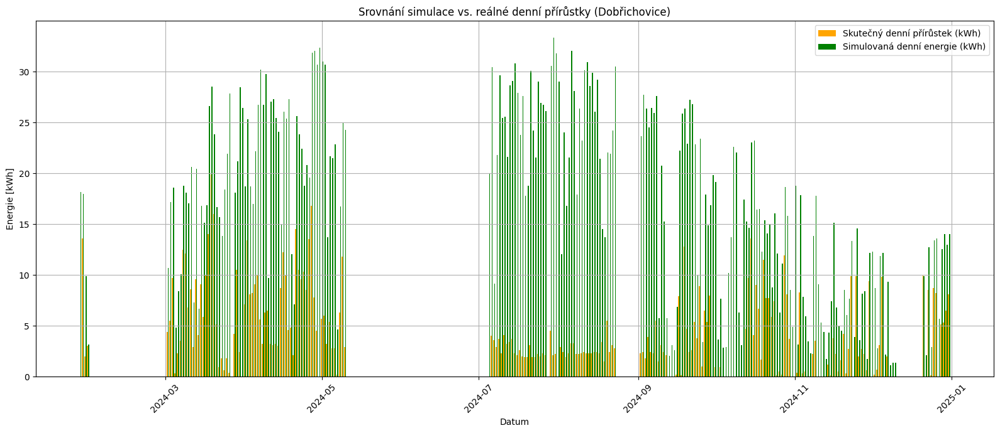

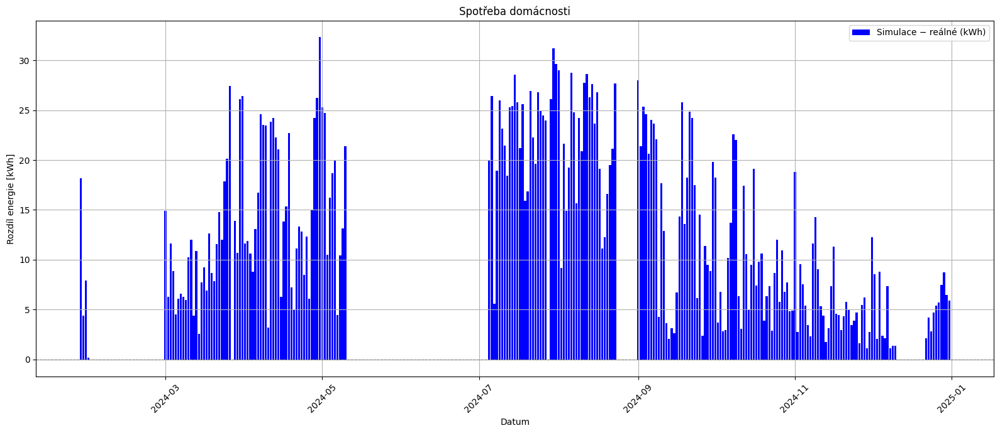

In [ ]:
"""
Refaktorizovaný skript pro porovnání reálných denních přírůstků PV energie
a simulace pomocí pvlib. Přidán graf rozdílu (simulace - reálná) s názvem
"Spotřeba domácnosti".
"""

from typing import Tuple
import logging
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pvlib

# Konfigurace loggeru
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# --- Konstanty / parametry ---
REAL_DATA_CSV = "all1(in).csv"
METEO_CSV = "Dobrichovice_1.1.2024-31.12.2024.csv"
LOCATION = "Dobrichovice"
REAL_NAME = "PV_generated_energy_of_month"

PANEL_PARAMS = {
    "pmp": 530,       # jmenovitý výkon [W] na panel
    "gamma_r": -0.0037,  # teplotní koeficient [1/°C] (např. -0.0037)
}
N_PANELS = 8
LAT, LON = 49.9340, 14.2748

# Panel orientation / model
TILT = 35
AZIMUTH_PANEL = 180

# Plot nastavení
FIGSIZE = (16, 7)
BAR_WIDTH_DAYS = 0.4


def load_real_daily_energy(csv_path: str) -> pd.DataFrame:
    """
    Načte reálná data z CSV (all1(in).csv), vyfiltruje pro lokaci (Dobrichovice)
    a jméno (PV_generated_energy_of_month), spočítá denní přírůstky (kWh)
    a vrátí DataFrame s sloupci ['date', 'daily_increment'] kde 'date' je datetime64[ns].
    """
    logger.info("Načítám reálná data z %s", csv_path)
    df_real = pd.read_csv(csv_path, dtype={"time": str, "value": str})
    # Převedeme sloupec time na číselný typ (očekáváno jako ns epoch), pak na datetime
    df_real["time"] = pd.to_numeric(df_real["time"], errors="coerce")
    df_real = df_real[(df_real["location"] == LOCATION) & (df_real["name"] == REAL_NAME)]
    df_real = df_real.dropna(subset=["time", "value"])
    df_real["datetime"] = pd.to_datetime(df_real["time"].astype("int64"), unit="ns", errors="coerce")
    df_real["value"] = pd.to_numeric(df_real["value"], errors="coerce")
    df_real = df_real.dropna(subset=["datetime", "value"]).sort_values("datetime")

    # Skupina po date -> vezmeme poslední záznam za den (kumulativní hodnota)
    df_real["date"] = df_real["datetime"].dt.date
    df_daily = df_real.groupby("date").last().reset_index()

    # Dení přírůstek: rozdíl kumulativní hodnoty. Pokud negativní (reset), použijeme 0.
    df_daily["daily_increment"] = df_daily["value"].diff().apply(lambda x: x if x >= 0 else 0)

    # Původní data mohou být ve Wh -> převod na kWh
    df_daily["daily_increment"] = df_daily["daily_increment"] / 1000

    df_daily = df_daily.dropna(subset=["daily_increment"])

    # Filtrujeme reálnistní hodnoty: 0 <= daily_increment <= 100 kWh (stejné jako původní)
    df_daily = df_daily[(df_daily["daily_increment"] >= 0) & (df_daily["daily_increment"] <= 100)]

    # Převést 'date' na datetime (půlnoční timestamp) pro lepší spojení s časovou řadou simulace
    df_daily["date"] = pd.to_datetime(df_daily["date"])
    result = df_daily[["date", "daily_increment"]].reset_index(drop=True)
    logger.info("Reálná data: %d dní načteno", len(result))
    return result


def simulate_daily_pv_energy(
    meteo_csv_path: str,
    lat: float,
    lon: float,
    panel_params: dict,
    n_panels: int,
    tilt: float = TILT,
    azimuth_panel: float = AZIMUTH_PANEL,
) -> pd.DataFrame:
    """
    Simuluje denní energii (kWh) podle meteodat (CSV) pomocí pvlib.
    Očekávané sloupce meteodat jsou: 'time' (datetimový index),
    'shortwave_radiation (W/m²)', 'diffuse_radiation (W/m²)', 'direct_normal_irradiance (W/m²)'.
    Výstup: DataFrame s ['date', 'Denní energie (kWh)'] kde 'date' je datetime64[ns].
    """
    logger.info("Načítám meteodata z %s", meteo_csv_path)
    data = pd.read_csv(meteo_csv_path, parse_dates=["time"], index_col="time")

    # Přejmenujeme sloupce na očekávané názvy (ghi, dhi, dni)
    data.rename(
        columns={
            "shortwave_radiation (W/m²)": "ghi",
            "diffuse_radiation (W/m²)": "dhi",
            "direct_normal_irradiance (W/m²)": "dni",
        },
        inplace=True,
    )

    required_cols = ["ghi", "dhi", "dni"]
    # Resample na hodinová data (průměr), doplníme chybějící hodinová data
    data = data[required_cols].resample("H").mean().fillna(method="ffill").fillna(method="bfill")

    # Pro zjednodušení použijeme konstantní teplotu 25 °C (jak v originále)
    temp = pd.Series(25, index=data.index)

    # Spočítáme pozici slunce
    solpos = pvlib.solarposition.get_solarposition(data.index, lat, lon)
    zenith = np.minimum(solpos["apparent_zenith"], 90)
    azimuth = solpos["azimuth"]

    # POA irradiance
    irr = pvlib.irradiance.get_total_irradiance(
        surface_tilt=tilt,
        surface_azimuth=azimuth_panel,
        dni=data["dni"],
        ghi=data["ghi"],
        dhi=data["dhi"],
        solar_zenith=zenith,
        solar_azimuth=azimuth,
    )["poa_global"]

    # Teplotní faktor pro výkon
    temp_factor = 1 + panel_params["gamma_r"] * (temp - 25)

    # Výkon v W pro celou sestavu (poa irradiance kW/m2 -> násobeno pmp a počtem panelů)
    power_W = (irradiance_to_w(irr) / 1000) * panel_params["pmp"] * temp_factor * n_panels

    # Dení součet Wh -> převedeme na kWh (sum Wh / 1000)
    daily_energy_kWh = power_W.resample("D").sum() / 1000

    simulated_df = pd.DataFrame({"date": daily_energy_kWh.index, "Denní energie (kWh)": daily_energy_kWh.values})
    simulated_df["date"] = pd.to_datetime(simulated_df["date"])
    logger.info("Simulace: %d dní vypočteno", len(simulated_df))
    return simulated_df


def irradiance_to_w(irr_series: pd.Series) -> pd.Series:
    """
    Pomocná funkce — v původním kódu se již používá irradiance (poa_global).
    Tato funkce je tu pro případné budoucí úpravy; momentálně vrací series beze změny.
    (zachováno pro čitelnost a rozšiřitelnost)
    """
    return irr_series


def merge_and_plot(real_df: pd.DataFrame, simulated_df: pd.DataFrame) -> pd.DataFrame:
    """
    Provede sloučení reálných a simulovaných dat podle data a vykreslí bar-chart
    pro srovnání. Vrátí sloučený DataFrame.
    """
    logger.info("Sloučím reálná a simulovaná data")
    merged = pd.merge(real_df, simulated_df, on="date", how="inner").sort_values("date").reset_index(drop=True)
    if merged.empty:
        logger.warning("Po sloučení neexistují žádné společné dny k porovnání.")
        return merged

    plt.figure(figsize=FIGSIZE)
    dates = pd.to_datetime(merged["date"])

    # Bar plot s posunem sloupců pro srovnání (posun o dny)
    plt.bar(dates - pd.Timedelta(days=BAR_WIDTH_DAYS / 2), merged["daily_increment"], width=BAR_WIDTH_DAYS, label="Skutečný denní přírůstek (kWh)", color="orange")
    plt.bar(dates + pd.Timedelta(days=BAR_WIDTH_DAYS / 2), merged["Denní energie (kWh)"], width=BAR_WIDTH_DAYS, label="Simulovaná denní energie (kWh)", color="green")

    plt.xlabel("Datum")
    plt.ylabel("Energie [kWh]")
    plt.title("Srovnání simulace vs. reálné denní přírůstky (Dobřichovice)")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.legend()
    plt.show()
    logger.info("Vykreslení porovnání dokončeno")
    return merged


def plot_difference(merged: pd.DataFrame) -> None:
    """
    Vykreslí graf rozdílu mezi simulací a reálnými daty.
    Rozdíl je počítán jako: simulace - reálná (kWh).
    Graf je pojmenován 'Spotřeba domácnosti' podle požadavku.
    """
    if merged.empty:
        logger.warning("Nelze vykreslit rozdíl: sloučený DataFrame je prázdný.")
        return

    merged = merged.copy()
    merged["difference"] = merged["Denní energie (kWh)"] - merged["daily_increment"]

    plt.figure(figsize=FIGSIZE)
    dates = pd.to_datetime(merged["date"])

    # Linie rozdílu, plus nultá čára
    plt.bar(dates, merged["difference"], linestyle="-", color="blue", label="Simulace − reálné (kWh)")
    plt.axhline(0, color="gray", linewidth=0.8, linestyle="--")
    plt.xlabel("Datum")
    plt.ylabel("Rozdíl energie [kWh]")
    plt.title("Spotřeba domácnosti")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.legend()
    plt.show()
    logger.info("Vykreslení rozdílu dokončeno")


def main():
    real_daily = load_real_daily_energy(REAL_DATA_CSV)
    simulated_daily = simulate_daily_pv_energy(METEO_CSV, LAT, LON, PANEL_PARAMS, N_PANELS, TILT, AZIMUTH_PANEL)
    merged = merge_and_plot(real_daily, simulated_daily)
    # Nově: vykreslíme i graf rozdílu (simulace - reálná) s názvem "Spotřeba domácnosti"
    if not merged.empty:
        plot_difference(merged)
    # Volitelně můžeme uložit výsledky nebo vrátit pro další zpracování.
    # Např. merged.to_csv('merged_daily_comparison.csv', index=False)
    if not merged.empty:
        logger.info("Hotovo. Porovnání obsahuje %d dní.", len(merged))
    else:
        logger.info("Hotovo. Žádná data ke srovnání.")


if __name__ == "__main__":
    main()

ANALÝZA PV VÝROBY - 2024-04-01
Počet panelů: 140 x 530W = 74200W
Počet reálných záznamů: 1949

Simuluji PV výrobu...

Statistika ČIŠTĚNÝCH PŘÍRŮSTKŮ (REÁLNÁ DATA):
count    1949.000000
mean      199.564392
std       589.144699
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max      4052.000000
Name: prirustek_clean, dtype: float64
Celková výroba za den: 388951 Wh = 388.95 kWh

Statistika SIMULOVANÉ VÝROBY (14 panelů):
Celková výroba za den (simulace): 5.46 kWh = 5457 Wh

✅ Graf 1 uložen jako 'pv_energy_real.png'


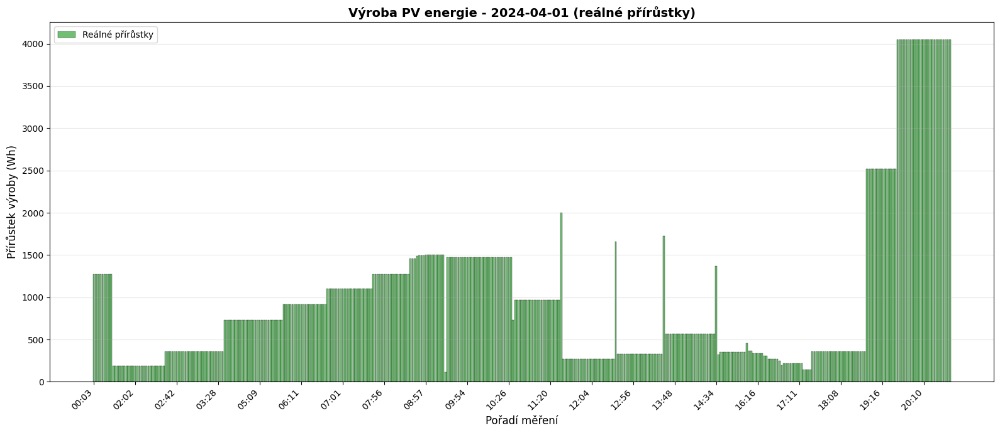

✅ Graf 2 uložen jako 'pv_energy_comparison.png'


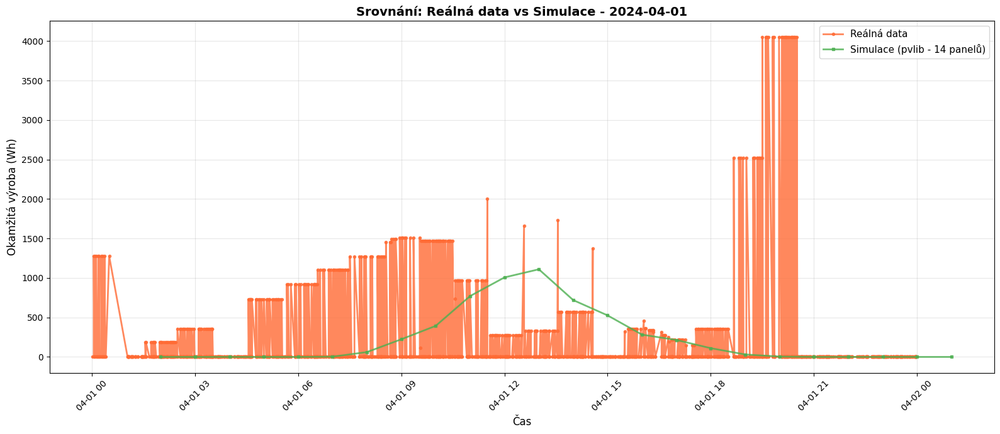

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import warnings
import logging
import pvlib
from datetime import datetime, timedelta

warnings.filterwarnings('ignore')
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# --- Konstanty ---
METEO_CSV = "Dobrichovice_1.1.2024-31.12.2024.csv"
LOCATION = "Dobrichovice"

PANEL_PARAMS = {
    "pmp": 530,       # jmenovitý výkon [W] na panel
    "gamma_r": -0.0037,  # teplotní koeficient [1/°C]
}
N_PANELS = 140  # ✅ ZMĚNĚNO NA 14 PANELŮ
LAT, LON = 49.9340, 14.2748
TILT = 35
AZIMUTH_PANEL = 180

# === ČÁST 1: NAČTENÍ REÁLNÝCH DAT ===
def load_real_data(csv_path: str, target_date):
    """Načte reálná data z CSV pro konkrétní den"""
    logger.info("Načítám reálná data z %s", csv_path)

    df = pd.read_csv(csv_path, dtype={'time': str, 'value': str}, low_memory=False)
    df = df.dropna(subset=['time', 'value'])
    df['time'] = pd.to_numeric(df['time'], errors='coerce')
    df['value'] = pd.to_numeric(df['value'], errors='coerce')
    df = df.dropna(subset=['time', 'value'])

    # Filtrování nesmyslů
    df = df[(df['value'] >= -1000) & (df['value'] <= 100000)].copy()

    # Převod na datetime
    df['datetime'] = pd.to_datetime(df['time'] / 1e9, unit='s')
    df['datetime'] = df['datetime'].dt.tz_localize('UTC').dt.tz_convert('Europe/Prague')

    # Filtr na konkrétní den
    start_date = pd.Timestamp(target_date, tz='Europe/Prague')
    end_date = pd.Timestamp(target_date, tz='Europe/Prague') + timedelta(days=1)

    mask = (df['datetime'] >= start_date) & (df['datetime'] < end_date)
    df_filtered = df[mask].copy()
    df_filtered = df_filtered.sort_values('datetime').reset_index(drop=True)

    print(f"Počet reálných záznamů: {len(df_filtered)}")

    # Výpočet přírůstků
    df_filtered['prirustek'] = df_filtered['value'].diff()
    df_filtered['prirustek'].iloc[0] = 0

    # Čištění
    df_filtered['prirustek_clean'] = df_filtered['prirustek'].copy()
    df_filtered.loc[np.abs(df_filtered['prirustek_clean']) < 100, 'prirustek_clean'] = 0
    df_filtered.loc[np.abs(df_filtered['prirustek_clean']) > 5000, 'prirustek_clean'] = 0
    df_filtered.loc[df_filtered['prirustek_clean'] < 0, 'prirustek_clean'] = 0

    # Převod na kWh
    df_filtered['prirustek_kWh'] = df_filtered['prirustek_clean'] / 1000

    return df_filtered


# === ČÁST 2: SIMULACE PODLE PVLIB ===
def simulate_daily_pv(meteo_csv_path: str, target_date):
    """Simuluje PV výrobu pro konkrétní den pomocí pvlib"""
    logger.info("Načítám meteodata z %s", meteo_csv_path)

    data = pd.read_csv(meteo_csv_path, parse_dates=['time'], index_col='time')

    # Přejmenování sloupců
    data.rename(
        columns={
            'shortwave_radiation (W/m²)': 'ghi',
            'diffuse_radiation (W/m²)': 'dhi',
            'direct_normal_irradiance (W/m²)': 'dni',
        },
        inplace=True,
    )

    # Filtr na konkrétní den
    start_date = pd.Timestamp(target_date)
    end_date = pd.Timestamp(target_date) + timedelta(days=1)
    data = data[(data.index >= start_date) & (data.index < end_date)]

    # Nastavení timezone
    if data.index.tz is None:
        data.index = data.index.tz_localize('UTC').tz_convert('Europe/Prague')

    required_cols = ['ghi', 'dhi', 'dni']
    data = data[required_cols]

    # Doplnění chybějících dat
    data = data.resample('H').mean().fillna(method='ffill').fillna(method='bfill')

    # Teplota
    temp = pd.Series(25, index=data.index)

    # Sluneční pozice
    solpos = pvlib.solarposition.get_solarposition(data.index, LAT, LON)
    zenith = np.minimum(solpos['apparent_zenith'], 90)
    azimuth = solpos['azimuth']

    # POA irradiance
    irr = pvlib.irradiance.get_total_irradiance(
        surface_tilt=TILT,
        surface_azimuth=AZIMUTH_PANEL,
        dni=data['dni'],
        ghi=data['ghi'],
        dhi=data['dhi'],
        solar_zenith=zenith,
        solar_azimuth=azimuth,
    )['poa_global']

    # Teplotní faktor
    temp_factor = 1 + PANEL_PARAMS['gamma_r'] * (temp - 25)

    # Výkon v W
    power_W = (irr / 1000) * PANEL_PARAMS['pmp'] * temp_factor * N_PANELS

    # Přírůstky per minutu
    power_kWh = power_W / 1000 / 60  # W -> kWh per minutu

    logger.info("Simulace: vypočteno (14 panelů x 530W)")
    return power_kWh


# === HLAVNÍ SKRIPT ===
def main():
    target_date = '2024-04-01'

    print("=" * 80)
    print(f"ANALÝZA PV VÝROBY - {target_date}")
    print(f"Počet panelů: {N_PANELS} x {PANEL_PARAMS['pmp']}W = {N_PANELS * PANEL_PARAMS['pmp']}W")
    print("=" * 80)

    # Načti reálná data
    df_real = load_real_data('all1(in).csv', target_date)

    # Simulace
    print("\nSimuluji PV výrobu...")
    df_simulated = simulate_daily_pv(METEO_CSV, target_date)

    print(f"\nStatistika ČIŠTĚNÝCH PŘÍRŮSTKŮ (REÁLNÁ DATA):")
    print(df_real['prirustek_clean'].describe())
    print(f"Celková výroba za den: {df_real['prirustek_clean'].sum():.0f} Wh = {df_real['prirustek_clean'].sum()/1000:.2f} kWh")

    print(f"\nStatistika SIMULOVANÉ VÝROBY (14 panelů):")
    print(f"Celková výroba za den (simulace): {df_simulated.sum():.2f} kWh = {df_simulated.sum() * 1000:.0f} Wh")

    # === GRAF 1: Reálné přírůstky ===
    fig, ax = plt.subplots(figsize=(16, 7))

    df_plot = df_real[df_real['prirustek_clean'] != 0].copy()

    ax.bar(range(len(df_plot)), df_plot['prirustek_clean'],
           color='#4CAF50', alpha=0.8, edgecolor='black', linewidth=0.3, label='Reálné přírůstky')

    ax.set_title(f'Výroba PV energie - {target_date} (reálné přírůstky)', fontsize=14, fontweight='bold')
    ax.set_xlabel('Pořadí měření', fontsize=12)
    ax.set_ylabel('Přírůstek výroby (Wh)', fontsize=12)
    ax.grid(True, alpha=0.3, axis='y')
    ax.legend()

    # X-osa
    step = max(1, len(df_plot) // 20)
    ax.set_xticks(range(0, len(df_plot), step))
    ax.set_xticklabels([df_plot['datetime'].iloc[i].strftime('%H:%M') for i in range(0, len(df_plot), step)], rotation=45, ha='right')

    plt.tight_layout()
    plt.savefig('pv_energy_real.png', dpi=300, bbox_inches='tight')
    print("\n✅ Graf 1 uložen jako 'pv_energy_real.png'")
    plt.show()

    # === GRAF 2: Srovnání reálné vs simulace ===
    fig, ax = plt.subplots(figsize=(16, 7))

    time_real = df_real['datetime']
    time_sim = df_simulated.index

    ax.plot(time_real, df_real['prirustek_clean'], marker='o', linestyle='-',
            linewidth=2, markersize=3, color='#FF6B35', label='Reálná data', alpha=0.8)
    ax.plot(time_sim, df_simulated * 1000, marker='s', linestyle='-',
            linewidth=2, markersize=3, color='#4CAF50', label='Simulace (pvlib - 14 panelů)', alpha=0.8)

    ax.set_title(f'Srovnání: Reálná data vs Simulace - {target_date}', fontsize=14, fontweight='bold')
    ax.set_xlabel('Čas', fontsize=12)
    ax.set_ylabel('Okamžitá výroba (Wh)', fontsize=12)
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=11)
    plt.xticks(rotation=45)

    plt.tight_layout()
    plt.savefig('pv_energy_comparison.png', dpi=300, bbox_inches='tight')
    print("✅ Graf 2 uložen jako 'pv_energy_comparison.png'")
    plt.show()

if __name__ == '__main__':
    main()

Počet záznamů: 1949

Statistika ČIŠTĚNÝCH PŘÍRŮSTKŮ:
count    1949.000000
mean      199.564392
std       589.144699
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max      4052.000000
Name: prirustek_clean, dtype: float64

Maximální přírůstek: 4052 Wh
Minimální přírůstek: 0 Wh
Celková výroba za den: 388951 Wh


VÝROBA PO HODINÁCH (čištěná data):
            sum        mean  count
hodina                            
0       11484.0  410.142857     28
1        1683.0   21.037500     80
2        7089.0   70.188119    101
3        5355.0   56.368421     95
4        8760.0  118.378378     74
5       15530.0  196.582278     79
6       21454.0  264.864198     81
7       24325.0  307.911392     79
8       24550.0  310.759494     79
9       29830.0  377.594937     79
10      39840.0  390.588235    102
11      12480.0  160.000000     78
12       8100.0   97.590361     83
13      11145.0  139.312500     80
14       9365.0  104.055556     90
15       4571.0   53

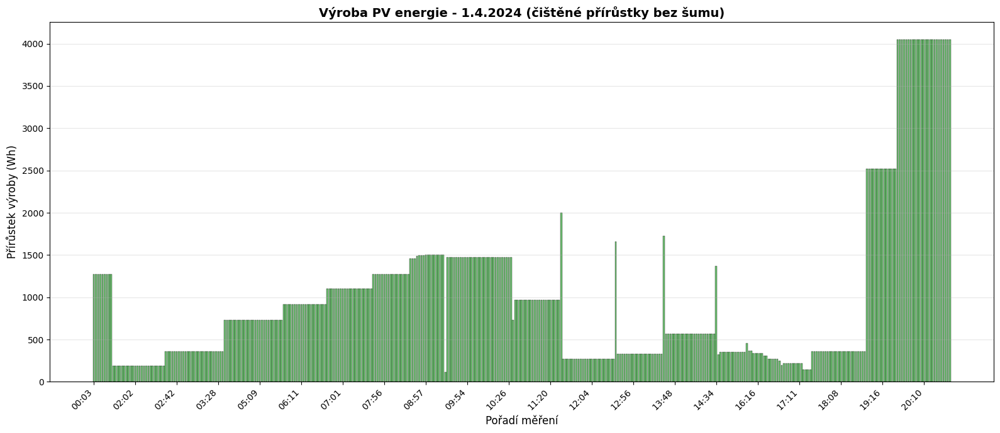

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings('ignore')

# Načtení CSV souboru
df = pd.read_csv('all1(in).csv', dtype={'time': str, 'value': str}, low_memory=False)

df = df.dropna(subset=['time', 'value'])
df['time'] = pd.to_numeric(df['time'], errors='coerce')
df['value'] = pd.to_numeric(df['value'], errors='coerce')
df = df.dropna(subset=['time', 'value'])

# Filtrování nesmyslů
df = df[(df['value'] >= -1000) & (df['value'] <= 100000)].copy()

# Převod na datetime
df['datetime'] = pd.to_datetime(df['time'] / 1e9, unit='s')
df['datetime'] = df['datetime'].dt.tz_localize('UTC').dt.tz_convert('Europe/Prague')

# Filtr na 1.4.2024
start_date = pd.Timestamp('2024-04-01', tz='Europe/Prague')
end_date = pd.Timestamp('2024-04-02', tz='Europe/Prague')

mask = (df['datetime'] >= start_date) & (df['datetime'] < end_date)
df_filtered = df[mask].copy()
df_filtered = df_filtered.sort_values('datetime').reset_index(drop=True)

print(f"Počet záznamů: {len(df_filtered)}")

# VÝPOČET PŘÍRŮSTKŮ
df_filtered['prirustek'] = df_filtered['value'].diff()
df_filtered['prirustek'].iloc[0] = 0  # První záznam není přírůstek

# FILTROVÁNÍ OSCILACÍ - pokud se přírůstek opakuje (např. 1276, -1276, 1276...)
# Zbavíme se těchto malých oscilací a vezmeme jen "čisté" přírůstky
# Filtrujeme přírůstky menší než 100 Wh (= měřící šum)
df_filtered['prirustek_clean'] = df_filtered['prirustek'].copy()
df_filtered.loc[np.abs(df_filtered['prirustek_clean']) < 100, 'prirustek_clean'] = 0

# DODATEČNÉ FILTROVÁNÍ - extrémní skokové přírůstky (>5000)
df_filtered.loc[np.abs(df_filtered['prirustek_clean']) > 5000, 'prirustek_clean'] = 0

# ✅ ODSTRANĚNÍ ZÁPORNÝCH HODNOT - převeď na 0
df_filtered.loc[df_filtered['prirustek_clean'] < 0, 'prirustek_clean'] = 0

print(f"\nStatistika ČIŠTĚNÝCH PŘÍRŮSTKŮ:")
print(df_filtered['prirustek_clean'].describe())

print(f"\nMaximální přírůstek: {df_filtered['prirustek_clean'].max():.0f} Wh")
print(f"Minimální přírůstek: {df_filtered['prirustek_clean'].min():.0f} Wh")
print(f"Celková výroba za den: {df_filtered['prirustek_clean'].sum():.0f} Wh")

# Analýza po hodinách - čištěná data
df_filtered['hodina'] = df_filtered['datetime'].dt.hour
hourly = df_filtered.groupby('hodina')['prirustek_clean'].agg(['sum', 'mean', 'count'])
print(f"\n\nVÝROBA PO HODINÁCH (čištěná data):")
print(hourly)

# Vytvoření grafu
fig, ax = plt.subplots(figsize=(16, 7))

# Filtr pouze nenulové přírůstky
df_plot = df_filtered[df_filtered['prirustek_clean'] != 0].copy()

colors = '#4CAF50'  # Jen zelená (všechny kladné)
ax.bar(range(len(df_plot)), df_plot['prirustek_clean'],
       color=colors, alpha=0.8, edgecolor='black', linewidth=0.3)

ax.set_title('Výroba PV energie - 1.4.2024 (čištěné přírůstky bez šumu)', fontsize=14, fontweight='bold')
ax.set_xlabel('Pořadí měření', fontsize=12)
ax.set_ylabel('Přírůstek výroby (Wh)', fontsize=12)
ax.grid(True, alpha=0.3, axis='y')

# X-osa
step = max(1, len(df_plot) // 20)
ax.set_xticks(range(0, len(df_plot), step))
ax.set_xticklabels([df_plot['datetime'].iloc[i].strftime('%H:%M') for i in range(0, len(df_plot), step)], rotation=45, ha='right')

plt.tight_layout()
plt.savefig('pv_energy_1_4_2024.png', dpi=300, bbox_inches='tight')
print("\n✅ Graf uložen jako 'pv_energy_1_4_2024.png'")
plt.show()

/usr/local/lib/python3.12/dist-packages/cvxpy/problems/problem.py:1510: UserWarning: Solution may be inaccurate. Try another solver, adjusting the solver settings, or solve with verbose=True for more information.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/cvxpy/problems/problem.py:1510: UserWarning: Solution may be inaccurate. Try another solver, adjusting the solver settings, or solve with verbose=True for more information.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/cvxpy/problems/problem.py:1510: UserWarning: Solution may be inaccurate. Try another solver, adjusting the solver settings, or solve with verbose=True for more information.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/cvxpy/problems/problem.py:1510: UserWarning: Solution may be inaccurate. Try another solver, adjusting the solver settings, or solve with verbose=True for more information.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/cvxpy/problems/problem.py:1510: UserWarn

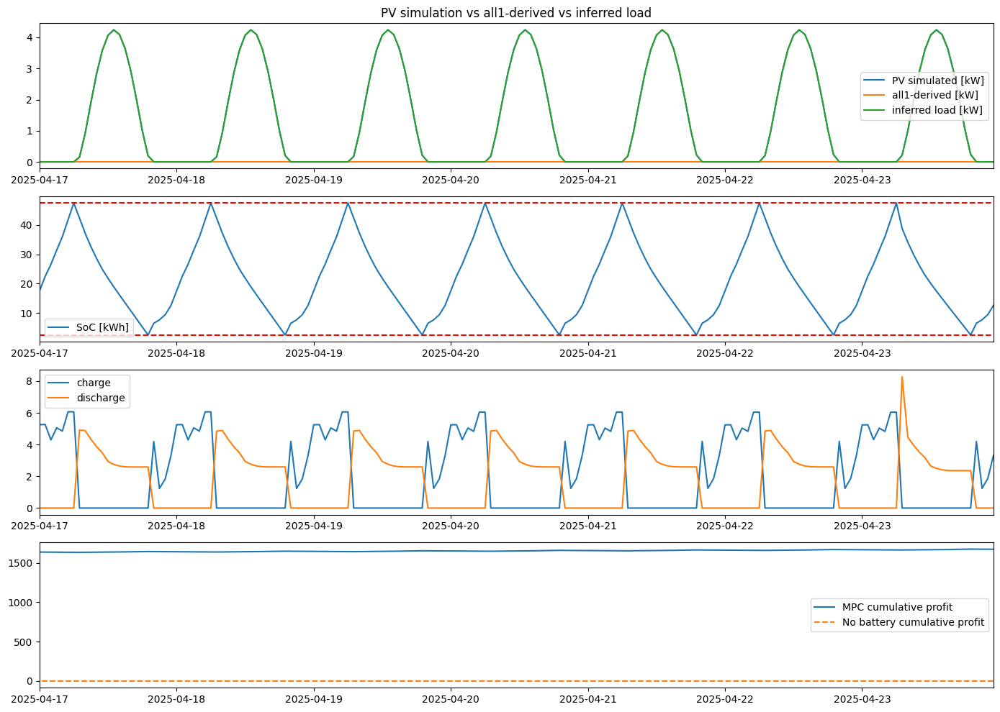

In [ ]:
"""
MPC with pvlib production + inferred household consumption from all1(in).csv

Behavior you asked for:
- Simulate PV production with pvlib (hourly)
- Load/consumption is computed as: load_estimated = pv_simulated - all1_value_hourly
  (i.e. "spotřeba bude rozdílem té simulace a toho obsahu ze souboru all1(in)")
- Use pvlib production forecast (clearsky) + TOWT predictor on inferred load for MPC forecast
- Run rolling-horizon deterministic economic MPC and compare with "no battery" baseline

How to use:
1) Put your all1(in).csv into Colab workspace (Files). Default filename ALL1_CSV = "all1(in).csv".
   The loader will try to detect the usual format: columns name,time,device,location,value.
2) If your CSV contains daily cumulative PV (name like 'PV_generated_energy_of_day'), the code
   computes daily increments and distributes them hourly using pvlib clearsky POA (preferred) or
   a simple sinus shape fallback.
3) If your CSV already contains hourly net (production - consumption) or hourly PV, adapt the
   ALL1_NAME and related flags (see PARAMETERS).
4) Ensure pvlib is installed in Colab:
    %pip install pvlib
   and cvxpy + solvers:
    %pip install cvxpy osqp ecos scs
   Restart runtime if necessary.

Notes:
- This script makes a number of assumptions (units, sampling). Check comments and parameters and
  adapt to your exact CSV format and units (Wh vs kWh).
"""

import logging
from typing import Optional
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# solver / optimisation
try:
    import cvxpy as cp
except Exception as e:
    raise RuntimeError("cvxpy is required. In Colab run: %pip install cvxpy osqp ecos scs") from e

# pvlib
try:
    import pvlib
    from pvlib import location as pvloc
    PVLIB_AVAILABLE = True
except Exception:
    PVLIB_AVAILABLE = False

logging.basicConfig(level=logging.INFO)
logger = logging.getLogger("MPC_PVLIB")

# ---------------- PARAMETERS (edit as needed) ----------------
ALL1_CSV = "all1(in).csv"                # file with columns name,time,device,location,value
ALL1_NAME = "PV_generated_energy_of_day" # name filter in CSV (adjust if different)
ALL1_TIME_UNIT = "ns"                    # 'ns' / 'ms' / 's' epoch unit used in your CSV time column
ALL1_VALUE_IS_WH = True                  # True if CSV values are Wh cumulative; else False
ALL1_IS_DAILY_CUMULATIVE = True         # True -> values are cumulative daily PV; False -> hourly net (or hourly PV)

LAT, LON = 49.9340, 14.2748              # location for pvlib (Dobřichovice)
TZ = "Europe/Prague"

SYSTEM_PMP_W = 530.0   # W per panel
N_PANELS = 8
SYSTEM_CAPACITY_KW = (SYSTEM_PMP_W * N_PANELS) / 1000.0

TILT = 35.0
AZIMUTH = 180.0

DT_H = 1.0
HORIZON = 24
TOTAL_DAYS_SYNTH = 14

# Battery params
CAPACITY = 50.0
P_MAX = 10.0
SOC0 = 0.5 * CAPACITY
SOC_MIN = 0.05 * CAPACITY
SOC_MAX = 0.95 * CAPACITY
ETA_CH = 0.95
ETA_DIS = 0.95

# prices
BUY_PRICE_DAY = 0.25
BUY_PRICE_NIGHT = 0.10
SELL_RATIO = 0.85
DEGRADATION_COST = 0.02

MAX_EXPORT = 100.0
MAX_IMPORT = 100.0

# ---------------- Utilities: load all1 CSV ----------------
def load_all1_csv(path: str,
                  name_filter: str = ALL1_NAME,
                  location_filter: Optional[str] = None,
                  time_unit: str = ALL1_TIME_UNIT):
    """
    Load all1(in).csv (expects columns: name,time,device,location,value).
    time is epoch in time_unit.
    Returns DataFrame with columns ['datetime','value'] (sorted).
    """
    df = pd.read_csv(path, dtype=str)
    if not {'name','time','value'}.issubset(df.columns):
        raise ValueError("CSV must contain columns 'name','time','value' (and optionally 'location').")
    if location_filter is not None and 'location' in df.columns:
        df = df[df['location'] == location_filter]
    df = df[df['name'] == name_filter].copy()
    df['time'] = pd.to_numeric(df['time'], errors='coerce')
    df['value'] = pd.to_numeric(df['value'], errors='coerce')
    df = df.dropna(subset=['time','value'])
    # convert epoch to datetime
    df['datetime'] = pd.to_datetime(df['time'].astype('int64'), unit=time_unit, errors='coerce')
    df = df.dropna(subset=['datetime']).sort_values('datetime').reset_index(drop=True)
    return df[['datetime','value']]

# ---------------- Convert daily cumulative -> hourly values using pvlib clearsky shape ----------------
def daily_cumulative_to_hourly_using_clearsky(daily_df: pd.DataFrame, lat: float, lon: float,
                                               tilt: float = TILT, azimuth: float = AZIMUTH,
                                               tz: str = TZ):
    """
    daily_df: DataFrame with columns ['date' (datetime.date or Timestamp at midnight), 'daily_kwh']
    Returns hourly DataFrame index time (tz-aware) with 'value_kW' (kW per hour).
    Uses pvlib clearsky POA to split daily kWh into hourly shares.
    """
    if not PVLIB_AVAILABLE:
        raise RuntimeError("pvlib required for clearsky-based hourly distribution.")
    # make hourly index spanning days
    start = pd.to_datetime(daily_df['date'].min()).tz_localize(tz)
    end = (pd.to_datetime(daily_df['date'].max()) + pd.Timedelta(days=1) - pd.Timedelta(hours=1)).tz_localize(tz)
    hours = pd.date_range(start=start, end=end, freq='h', tz=tz)
    # clearsky
    loc = pvloc.Location(lat, lon, tz=tz)
    cs = loc.get_clearsky(hours, model='ineichen')  # ghi,dni,dhi
    solpos = pvlib.solarposition.get_solarposition(hours, lat, lon)
    zenith = np.minimum(solpos['apparent_zenith'], 90)
    az = solpos['azimuth']
    poa = pvlib.irradiance.get_total_irradiance(surface_tilt=tilt, surface_azimuth=azimuth,
                                                dni=cs['dni'], ghi=cs['ghi'], dhi=cs['dhi'],
                                                solar_zenith=zenith, solar_azimuth=az)['poa_global']
    poa_df = pd.DataFrame({'poa': poa}, index=hours)
    poa_df['date'] = poa_df.index.normalize()
    day_sum = poa_df.groupby('date')['poa'].sum().rename('day_poa_sum')
    poa_df = poa_df.join(day_sum, on='date')
    poa_df['rel'] = poa_df['poa'] / poa_df['day_poa_sum']
    poa_df['rel'] = poa_df['rel'].fillna(0.0)
    daily_map = daily_df.set_index('date')['daily_kwh']
    poa_df['daily_kwh'] = poa_df['date'].map(daily_map).fillna(0.0)
    # hourly kW (since daily_kwh is in kWh split into hours -> each hour kW == allocated kWh)
    poa_df['value_kW'] = poa_df['daily_kwh'] * poa_df['rel']
    hourly = poa_df[['value_kW']].copy()
    hourly.index.name = 'time'
    return hourly

# fallback simple distribution (sinus)
def daily_cumulative_to_hourly_simple(daily_df: pd.DataFrame, sunrise_hour=6, sunset_hour=18):
    start = pd.to_datetime(daily_df['date'].min())
    end = pd.to_datetime(daily_df['date'].max()) + pd.Timedelta(days=1) - pd.Timedelta(hours=1)
    hours = pd.date_range(start=start, end=end, freq='h')
    out = pd.DataFrame(index=hours)
    out['date'] = out.index.floor('D')
    rows = []
    for d in pd.to_datetime(daily_df['date'].unique()):
        hours_idx = pd.date_range(start=d + pd.Timedelta(hours=sunrise_hour),
                                  end=d + pd.Timedelta(hours=sunset_hour-1), freq='h')
        n = len(hours_idx)
        if n <= 0:
            continue
        x = np.linspace(0, np.pi, n)
        prof = np.sin(x)
        prof = prof / prof.sum()
        daily_val = float(daily_df.loc[daily_df['date'] == d, 'daily_kwh'].iloc[0]) if (daily_df['date'] == d).any() else 0.0
        for i, h in enumerate(hours_idx):
            rows.append((h, daily_val * prof[i]))
    if len(rows) == 0:
        return pd.DataFrame(columns=['value_kW'])
    hourly = pd.DataFrame(rows, columns=['time','value_kW']).set_index('time').sort_index()
    hourly = hourly.resample('h').sum().fillna(0.0)
    return hourly

# ---------------- pvlib simulation function ----------------
def simulate_pv_power_for_index(index: pd.DatetimeIndex,
                                lat: float=LAT, lon: float=LON, tz: str = TZ,
                                tilt: float = TILT, azimuth: float = AZIMUTH,
                                system_capacity_kw: float = SYSTEM_CAPACITY_KW):
    """
    Simulate hourly PV power (kW) for given index using pvlib pvwatts (clearsky-based).
    index must be tz-aware in tz; if not, localize to tz.
    Returns Series (kW) indexed by index.
    """
    if not PVLIB_AVAILABLE:
        raise RuntimeError("pvlib required for simulation.")
    # ensure tz-aware
    if index.tz is None:
        index = index.tz_localize(tz)
    loc = pvloc.Location(lat, lon, tz=tz)
    # clearsky GHI used as input to pvwatts
    cs = loc.get_clearsky(index, model='ineichen')
    ghi = cs['ghi']
    # constant temp
    temp_air = pd.Series(25.0, index=index)
    # use pvlib.pvsystem.pvwatts to get AC power in kW
    try:
        ac = pvlib.pvsystem.pvwatts(ghi=ghi, temp_air=temp_air, wind_speed=None,
                                    system_capacity=system_capacity_kw,
                                    temp_model='open_rack_glass_glass')  # returns Series kW
        ac = ac.fillna(0.0)
    except Exception:
        # fallback: scale POA relative shares to system_capacity * normalized factor
        solpos = pvlib.solarposition.get_solarposition(index, lat, lon)
        zenith = np.minimum(solpos['apparent_zenith'], 90)
        az = solpos['azimuth']
        poa = pvlib.irradiance.get_total_irradiance(surface_tilt=tilt, surface_azimuth=azimuth,
                                                    dni=cs['dni'], ghi=cs['ghi'], dhi=cs['dhi'],
                                                    solar_zenith=zenith, solar_azimuth=az)['poa_global']
        # normalize by daily max per day to get shape and scale by system_capacity_kw
        poa_df = pd.DataFrame({'poa': poa})
        # protect zero days
        ac = poa_df['poa'] / (poa_df['poa'].groupby(poa_df.index.date).transform('max').replace(0, np.nan))
        ac = ac.fillna(0.0) * system_capacity_kw
    return ac.rename("pv_sim_kW")

# ---------------- TOWT predictor (for load) ----------------
class TOWTPredictor:
    def __init__(self):
        self.hour_of_week_mean = None
        self.global_mean = 0.0
        self.mode = 'H'
    def fit(self, series: pd.Series):
        s = series.dropna()
        if s.empty:
            raise ValueError("empty series")
        idx = s.index
        if len(idx) < 3:
            self.global_mean = float(s.mean())
            self.mode = 'H'
            self.hour_of_week_mean = {i: self.global_mean for i in range(7*24)}
            return
        try:
            inferred = pd.infer_freq(idx[:min(len(idx),200)])
        except Exception:
            inferred = None
        if inferred and str(inferred).lower().startswith('d'):
            dfm = pd.DataFrame({'v': s.values, 'dow': idx.dayofweek}, index=idx)
            means = dfm.groupby('dow')['v'].mean()
            self.hour_of_week_mean = {i: float(means.get(i, np.nan)) for i in range(7)}
            self.global_mean = float(s.mean())
            self.mode = 'D'
        else:
            dfm = pd.DataFrame({'v': s.values}, index=idx)
            dfm['how'] = dfm.index.dayofweek * 24 + dfm.index.hour
            means = dfm.groupby('how')['v'].mean()
            self.hour_of_week_mean = {i: float(means.get(i, np.nan)) for i in range(7*24)}
            self.global_mean = float(s.mean())
            self.mode = 'H'
    def predict(self, last_timestamp: pd.Timestamp, steps: int = 24):
        preds = []
        idxs = []
        for step in range(1, steps+1):
            ts = last_timestamp + pd.Timedelta(hours=step) if self.mode == 'H' else last_timestamp + pd.Timedelta(days=step)
            if self.mode == 'H':
                key = int(ts.dayofweek * 24 + ts.hour)
                val = self.hour_of_week_mean.get(key, np.nan)
            else:
                key = int(ts.dayofweek)
                val = self.hour_of_week_mean.get(key, np.nan)
            if np.isnan(val):
                val = self.global_mean
            preds.append(val)
            idxs.append(ts)
        return pd.Series(preds, index=idxs)

# ---------------- MPC solver (deterministic as before) ----------------
def solve_mpc_step(pred_net, pred_buy_price, pred_sell_price, soc_init,
                   capacity=CAPACITY, p_max=P_MAX, soc_min=SOC_MIN, soc_max=SOC_MAX,
                   eta_ch=ETA_CH, eta_dis=ETA_DIS, dt=DT_H):
    H = len(pred_net)
    if H == 0:
        return np.zeros(H), np.zeros(H), np.zeros(H), np.zeros(H), np.ones(H+1)*soc_init
    charge = cp.Variable(H, nonneg=True)
    discharge = cp.Variable(H, nonneg=True)
    imp = cp.Variable(H, nonneg=True)
    exp = cp.Variable(H, nonneg=True)
    soc = cp.Variable(H+1)
    constraints = [soc[0] == soc_init]
    for t in range(H):
        constraints += [charge[t] <= p_max, discharge[t] <= p_max]
        constraints += [imp[t] <= MAX_IMPORT, exp[t] <= MAX_EXPORT]
        constraints += [pred_net[t] + discharge[t] - charge[t] + imp[t] - exp[t] == 0]
        constraints += [soc[t+1] == soc[t] + eta_ch * charge[t] * dt - (1.0/eta_dis) * discharge[t] * dt]
        constraints += [soc[t+1] >= soc_min, soc[t+1] <= soc_max]
    cost = 0
    eps_q = 1e-6
    for t in range(H):
        cost += pred_buy_price[t] * imp[t] * dt - pred_sell_price[t] * exp[t] * dt
        cost += DEGRADATION_COST * (charge[t] + discharge[t]) * dt
        cost += 1e-4 * (charge[t] + discharge[t])
        cost += eps_q * (cp.square(charge[t]) + cp.square(discharge[t]))
    prob = cp.Problem(cp.Minimize(cost), constraints)
    solvers_to_try = [cp.OSQP, cp.ECOS, cp.SCS]
    last_exc = None
    for s in solvers_to_try:
        try:
            prob.solve(solver=s, verbose=False)
            if prob.status in ["optimal", "optimal_inaccurate"]:
                break
        except Exception as e:
            last_exc = e
            continue
    if prob.status not in ["optimal", "optimal_inaccurate"]:
        logger.warning("MPC solver failed: %s", prob.status)
        return np.zeros(H), np.zeros(H), np.zeros(H), np.zeros(H), np.ones(H+1)*soc_init
    return charge.value, discharge.value, imp.value, exp.value, soc.value

# ---------------- Rolling simulation combining pvlib + all1 ----------------
def run_pipeline_and_mpc(all1_csv: str = ALL1_CSV):
    # 1) Load all1 CSV (daily cumulative PV or hourly series depending on ALL1_IS_DAILY_CUMULATIVE)
    df_all1 = load_all1_csv(all1_csv)
    if df_all1.empty:
        raise RuntimeError("No valid rows found in all1 CSV.")
    # If CSV is daily cumulative PV -> compute daily increments (kWh)
    if ALL1_IS_DAILY_CUMULATIVE:
        df_all1['date'] = df_all1['datetime'].dt.floor('D')
        daily_last = df_all1.groupby('date')['value'].last().reset_index().sort_values('date')
        # convert Wh->kWh if needed
        if ALL1_VALUE_IS_WH:
            daily_last['daily_kwh'] = daily_last['value'].diff().fillna(0) / 1000.0
        else:
            daily_last['daily_kwh'] = daily_last['value'].diff().fillna(0)
        # clean negatives and zeros
        daily_last.loc[daily_last['daily_kwh'] < 0, 'daily_kwh'] = 0.0
        daily_daily = daily_last[['date','daily_kwh']].dropna().reset_index(drop=True)
        # use pvlib clearsky to distribute daily_kwh into hourly shape for same date range
        try:
            hourly_all1 = daily_cumulative_to_hourly_using_clearsky(daily_daily, LAT, LON)  # value_kW
            hourly_all1 = hourly_all1.rename(columns={'value_kW': 'all1_hourly_kW'})
        except Exception:
            logger.warning("pvlib clearsky distribution failed or pvlib not available, using simple distribution.")
            hourly_all1 = daily_cumulative_to_hourly_simple(daily_daily)
            hourly_all1 = hourly_all1.rename(columns={'value_kW': 'all1_hourly_kW'})
    else:
        # assume df_all1 already has hourly timestamped values (net or pv)
        # we convert to hourly series by resampling mean
        ser = df_all1.set_index('datetime')['value'].resample('h').mean().interpolate().fillna(0.0)
        hourly_all1 = pd.DataFrame({'all1_hourly_kW': ser})

    # 2) simulate PV production for the same hourly index using pvlib
    idx = hourly_all1.index
    if PVLIB_AVAILABLE:
        pv_sim = simulate_pv_power_for_index(idx, lat=LAT, lon=LON, tz=TZ,
                                             tilt=TILT, azimuth=AZIMUTH,
                                             system_capacity_kw=SYSTEM_CAPACITY_KW)
        pv_sim = pv_sim.reindex(idx).fillna(0.0)
        pv_sim = pv_sim.rename("pv_sim_kW")
    else:
        # fallback: use simple sinus shape scaled to match daily sums of hourly_all1 (if possible)
        logger.warning("pvlib not available -> using simple synthetic PV (sinus) scaled to daily sums of all1")
        pv_sim = hourly_all1.copy()
        # naive: use same shape as hourly_all1 but add small noise
        pv_sim = hourly_all1['all1_hourly_kW'] * 1.0 + 0.1 * np.random.randn(len(hourly_all1))
        pv_sim = pv_sim.clip(min=0.0).rename("pv_sim_kW")

    # 3) compute inferred load: load_est = pv_sim - all1_hourly
    # According to your request: spotřeba = simulace_pv - obsah_all1
    load_est = (pv_sim - hourly_all1['all1_hourly_kW']).rename("load_est_kW")

    # 4) Build df for MPC: we will forecast pv with pvlib (clearsky) and load with TOWT on load_est
    df_hourly = pd.DataFrame(index=idx)
    df_hourly['pv_sim_kW'] = pv_sim
    df_hourly['all1_kW'] = hourly_all1['all1_hourly_kW']
    df_hourly['load_kW'] = load_est
    df_hourly['net_kW'] = df_hourly['pv_sim_kW'] - df_hourly['load_kW']  # equals all1_hourly by algebra
    hour = df_hourly.index.hour
    df_hourly['buy_price'] = np.where((hour >= 8) & (hour <= 20), BUY_PRICE_DAY, BUY_PRICE_NIGHT)
    df_hourly['sell_price'] = SELL_RATIO * df_hourly['buy_price']

    logger.info("Prepared hourly dataframe with %d rows (from %s to %s)", len(df_hourly), df_hourly.index.min(), df_hourly.index.max())

    # 5) Rolling MPC: at each time step forecast pv (pvlib clearsky) + forecast load (TOWT on load_est)
    predictor = TOWTPredictor()
    n = len(df_hourly)
    soc = SOC0
    logs = {k: np.zeros(n) for k in ('charge','discharge','import','export','soc','profit_step')}
    times = df_hourly.index
    for i, t in enumerate(times):
        # fit load predictor on past estimated load (exclude current)
        hist = df_hourly.loc[:t].iloc[:-1]
        if len(hist) < 3:
            hist = df_hourly.loc[:t]
        try:
            predictor.fit(hist['load_kW'])
        except Exception:
            predictor.hour_of_week_mean = {i: 0.0 for i in range(7*24)}
            predictor.global_mean = 0.0
            predictor.mode = 'H'
        # pv forecast for next H hours using pvlib clearsky on future timestamps
        future_idx = pd.date_range(start=t + pd.Timedelta(hours=1), periods=HORIZON, freq='h', tz=TZ)
        try:
            pv_forecast = simulate_pv_power_for_index(future_idx, lat=LAT, lon=LON, tz=TZ,
                                                      tilt=TILT, azimuth=AZIMUTH,
                                                      system_capacity_kw=SYSTEM_CAPACITY_KW)
            pv_forecast = pv_forecast.values
        except Exception:
            pv_forecast = np.zeros(HORIZON)
        # load forecast from TOWT predictor
        load_pred_series = predictor.predict(t, steps=HORIZON)
        load_forecast = load_pred_series.reindex(future_idx, method=None).fillna(predictor.global_mean).values
        # construct net forecast
        net_forecast = pv_forecast - load_forecast
        # prices for future horizon
        future_buy = np.array([BUY_PRICE_DAY if (ts.hour >= 8 and ts.hour <= 20) else BUY_PRICE_NIGHT for ts in future_idx])
        future_sell = SELL_RATIO * future_buy
        # solve MPC
        ch, dis, im, ex, soc_pred = solve_mpc_step(net_forecast, future_buy, future_sell, soc)
        if len(ch) == 0:
            c0 = d0 = i0 = e0 = 0.0
        else:
            c0, d0, i0, e0 = float(ch[0]), float(dis[0]), float(im[0]), float(ex[0])
        # update soc and logs
        soc = soc + ETA_CH * c0 * DT_H - (1.0/ETA_DIS) * d0 * DT_H
        soc = float(np.clip(soc, SOC_MIN, SOC_MAX))
        logs['charge'][i] = c0
        logs['discharge'][i] = d0
        logs['import'][i] = i0
        logs['export'][i] = e0
        logs['soc'][i] = soc
        buy_now = df_hourly.at[t,'buy_price']
        sell_now = df_hourly.at[t,'sell_price']
        logs['profit_step'][i] = e0 * sell_now * DT_H - i0 * buy_now * DT_H - DEGRADATION_COST * (c0 + d0) * DT_H

    df_res = df_hourly.copy()
    df_res['charge_kW'] = logs['charge']
    df_res['discharge_kW'] = logs['discharge']
    df_res['import_kW'] = logs['import']
    df_res['export_kW'] = logs['export']
    df_res['soc_kWh'] = logs['soc']
    df_res['profit_step_€'] = logs['profit_step']
    df_res['profit_cum_€'] = np.cumsum(logs['profit_step'])

    # baseline no battery
    df_base = df_hourly.copy()
    n = len(df_base)
    imp = np.zeros(n); exp = np.zeros(n); profit_step = np.zeros(n)
    for t_idx, t in enumerate(df_base.index):
        net = df_base.at[t,'net_kW']
        if net >= 0:
            exp[t_idx] = min(net, MAX_EXPORT)
            imp[t_idx] = 0.0
        else:
            imp[t_idx] = min(-net, MAX_IMPORT)
            exp[t_idx] = 0.0
        profit_step[t_idx] = exp[t_idx] * df_base.at[t,'sell_price'] * DT_H - imp[t_idx] * df_base.at[t,'buy_price'] * DT_H
    df_base['import_kW'] = imp; df_base['export_kW'] = exp
    df_base['profit_step_€'] = profit_step
    df_base['profit_cum_€'] = np.cumsum(profit_step)

    return df_res, df_base, df_hourly

# ---------------- plotting ----------------
def plot_results(df_mpc, df_base, df_hourly, last_days=7):
    plt.figure(figsize=(14,10))
    ax1 = plt.subplot(4,1,1)
    plt.plot(df_hourly.index, df_hourly['pv_sim_kW'], label='PV simulated [kW]')
    plt.plot(df_hourly.index, df_hourly['all1_kW'], label='all1-derived [kW]')
    plt.plot(df_hourly.index, df_hourly['load_kW'], label='inferred load [kW]')
    plt.legend(); plt.title("PV simulation vs all1-derived vs inferred load")
    ax2 = plt.subplot(4,1,2, sharex=ax1)
    plt.plot(df_mpc.index, df_mpc['soc_kWh'], label='SoC [kWh]')
    plt.axhline(SOC_MAX, color='r', ls='--'); plt.axhline(SOC_MIN, color='r', ls='--')
    plt.legend()
    ax3 = plt.subplot(4,1,3, sharex=ax1)
    plt.plot(df_mpc.index, df_mpc['charge_kW'], label='charge')
    plt.plot(df_mpc.index, df_mpc['discharge_kW'], label='discharge')
    plt.legend()
    ax4 = plt.subplot(4,1,4, sharex=ax1)
    plt.plot(df_mpc.index, df_mpc['profit_cum_€'], label='MPC cumulative profit')
    plt.plot(df_base.index, df_base['profit_cum_€'], label='No battery cumulative profit', ls='--')
    plt.legend()
    if len(df_mpc) > last_days * 24:
        plt.xlim(df_mpc.index[-last_days*24], df_mpc.index[-1])
    plt.tight_layout()
    plt.show()

# ---------------- main ----------------
if __name__ == "__main__":
    # run pipeline
    try:
        df_mpc, df_base, df_hourly = run_pipeline_and_mpc(ALL1_CSV)
    except FileNotFoundError:
        raise RuntimeError(f"File {ALL1_CSV} not found. Upload it to Colab or change ALL1_CSV path.")
    # plot
    plot_results(df_mpc, df_base, df_hourly, last_days=7)
    # save
    df_mpc.to_csv("mpc_pvlib_results.csv")
    df_base.to_csv("no_batt_results.csv")
    df_hourly.to_csv("hourly_input.csv")
    logger.info("Saved results: mpc_pvlib_results.csv, no_batt_results.csv, hourly_input.csv")

In [2]:
"""
Nástroj pro předzpracování all1(in).csv (formát: name,time,device,location,value)
- detekce a odstranění sentinel hodnot (např. -255)
- převod epoch ns -> datetime
- výpočet denních přírůstků (kWh) z kumulativních měření
- vytvoření hodinového profilu výroby (kW) buď podle reálných meteodat nebo clearsky modelu (pvlib)
Výstup: hourly_df s indexem datetime (H) a sloupcem 'pv_kW' (můžeš pak odečíst load_kW pro net_kW)
"""

from typing import Optional
import pandas as pd
import numpy as np
import logging

logger = logging.getLogger(__name__)
logging.basicConfig(level=logging.INFO)

# volitelné importy pvlib pouze pokud chceš využít clearsky/meteo
try:
    import pvlib
except Exception:
    pvlib = None
    logger.info("pvlib není dostupný, nebude možné použít clearsky/meteodata funkce.")


def load_all1_csv(path: str,
                  name_filter: str = "PV_generated_energy_of_day",
                  location_filter: Optional[str] = "Dobrichovice",
                  time_unit: str = "ns",
                  sentinel_thresh: float = -100.0) -> pd.DataFrame:
    """
    Načte all1(in).csv, vyfiltruje záznamy podle name a location.
    Předpoklad: sloupce name,time,device,location,value
    time: epoch v dané jednotce (default 'ns').
    sentinel_thresh: hodnoty <= this jsou brány jako chybové (např. -255).
    Vrací DataFrame s datetime sloupcem 'datetime' a 'value' (numeric).
    """
    df = pd.read_csv(path, dtype=str)
    # Filtrace
    if 'name' not in df.columns or 'time' not in df.columns or 'value' not in df.columns:
        raise ValueError("CSV musí obsahovat sloupce 'name', 'time', 'value' (a ideálně 'location').")
    if location_filter is not None and 'location' in df.columns:
        df = df[df['location'] == location_filter]
    df = df[df['name'] == name_filter].copy()
    # převod času
    df['time'] = pd.to_numeric(df['time'], errors='coerce')
    df = df.dropna(subset=['time', 'value'])
    # epoch -> datetime
    try:
        df['datetime'] = pd.to_datetime(df['time'].astype('int64'), unit=time_unit, errors='coerce')
    except Exception:
        # fallback: pokud se nepovede, pokusíme se jako seconds
        df['datetime'] = pd.to_datetime(df['time'].astype('int64'), unit='s', errors='coerce')
    df['value'] = pd.to_numeric(df['value'], errors='coerce')
    # detekce sentinelů (velká záporná čísla)
    df.loc[df['value'] <= sentinel_thresh, 'value'] = np.nan
    df = df.dropna(subset=['datetime', 'value']).sort_values('datetime').reset_index(drop=True)
    logger.info("Načteno %d platných záznamů z %s", len(df), path)
    return df[['datetime', 'value']]


def daily_increments_from_cumulative(df: pd.DataFrame,
                                     value_is_wh: bool = True,
                                     fill_method: str = 'ffill') -> pd.DataFrame:
    """
    Ze série kumulativních hodnot spočítá denní přírůstky.
    - předpokládá, že df má sloupce ['datetime','value'] řazené vzestupně
    - pokud dochází k resetu měřiče (value se sníží), výsledek bude považován za chybějící -> 0 nebo NaN dle nastavení
    - value_is_wh: pokud True, předpokládáme Wh a převedeme na kWh
    Vrací DataFrame s ['date','daily_kwh']
    """
    s = df.copy()
    s['date'] = s['datetime'].dt.floor('D')
    # vezmeme poslední kumulativní measure každého dne (předpoklad)
    daily_last = s.groupby('date')['value'].last().reset_index()
    daily_last = daily_last.sort_values('date').reset_index(drop=True)
    # rozdíl mezi po sobě jdoucími dny
    daily_last['diff'] = daily_last['value'].diff()
    # pokud diff < 0 (reset), nastavíme NaN (nebo 0) - volitelné
    daily_last.loc[daily_last['diff'] < 0, 'diff'] = np.nan
    # převod na kWh
    if value_is_wh:
        daily_last['daily_kwh'] = daily_last['diff'] / 1000.0
    else:
        daily_last['daily_kwh'] = daily_last['diff']
    # drop první den (není diference) a nan diffs
    daily = daily_last[['date', 'daily_kwh']].dropna().reset_index(drop=True)
    logger.info("Spočteno %d platných denních přírůstků", len(daily))
    return daily


def hourly_from_daily_clearsky(daily_df: pd.DataFrame,
                               lat: float,
                               lon: float,
                               tilt: float = 35,
                               azimuth: float = 180,
                               panel_pmp_w: float = 530,
                               n_panels: int = 8,
                               temp_degC: float = 25.0) -> pd.DataFrame:
    """
    Pokud je k dispozici pvlib, vygeneruje hodinový profil (relativní tvar dne) pomocí clearsky modelu.
    Postup: vytvoříme časovou osu hodin pro rozsah dní, spočteme clearsky irradiance (ghi/dni/dhi),
    spočteme POA irradiance pro orientaci panelu a normalizujeme podle denního součtu a vynásobíme
    denními kWh z daily_df.
    Výstup: DataFrame s indexem hodin (DatetimeIndex) a sloupcem 'pv_kW'.
    """
    if pvlib is None:
        raise RuntimeError("pvlib není dostupný, nelze použít clearsky metodu.")
    # rozsah hodin
    start = daily_df['date'].min()
    end = daily_df['date'].max() + pd.Timedelta(days=1) - pd.Timedelta(hours=1)
    hours = pd.date_range(start=start, end=end, freq='H', tz=None)
    location = pvlib.location.Location(lat, lon)
    cs = location.get_clearsky(hours, model='ineichen')  # obsahuje ghi,dni,dhi
    solpos = pvlib.solarposition.get_solarposition(hours, lat, lon)
    zenith = np.minimum(solpos['apparent_zenith'], 90)
    az = solpos['azimuth']
    poa = pvlib.irradiance.get_total_irradiance(
        surface_tilt=tilt, surface_azimuth=azimuth,
        dni=cs['dni'], ghi=cs['ghi'], dhi=cs['dhi'],
        solar_zenith=zenith, solar_azimuth=az
    )['poa_global']
    # vytvoříme DataFrame s poa
    poa_df = pd.DataFrame({'poa': poa}, index=hours)
    poa_df['date'] = poa_df.index.floor('D')
    # součet poa za den (může být 0 v winter days)
    day_sum = poa_df.groupby('date')['poa'].sum().rename('day_poa_sum')
    poa_df = poa_df.join(day_sum, on='date')
    # relativní díly (pokud day_poa_sum == 0, bude NaN -> nahradíme nulou)
    poa_df['rel'] = poa_df['poa'] / poa_df['day_poa_sum']
    poa_df['rel'] = poa_df['rel'].fillna(0.0)
    # výkon panelů ve W pro každou hodinu = rel * denní_energy_kWh * 1000 (Wh) / 1h * (1000 W / kW)
    # ale jednoduše: hourly_kW = (daily_kWh * 1000 Wh/day) * rel / 1000 (kWh->kW) => daily_kWh * rel
    # tedy hourly_kW = daily_kWh * rel  (protože rozdělujeme kWh do hodin)
    daily_map = daily_df.set_index('date')['daily_kwh']
    poa_df['daily_kwh'] = poa_df['date'].map(daily_map).fillna(0.0)
    poa_df['pv_kW'] = poa_df['daily_kwh'] * poa_df['rel']
    # Poznámka: multiplikátor panel_pmp_w a n_panels lze použít pokud daily_df obsahuje hodnoty v jiném měřítku.
    hourly = poa_df[['pv_kW']].copy()
    hourly.index.name = 'time'
    logger.info("Vytvořeno %d hodinových záznamů (clearsky) pro %d dní", len(hourly), len(daily_df))
    return hourly


def hourly_from_daily_simple(daily_df: pd.DataFrame,
                             sunrise_hour: int = 6,
                             sunset_hour: int = 18,
                             peak_shape: str = 'sin') -> pd.DataFrame:
    """
    Jednoduchá aproximace: rozdělí denní kWh během hodinových slotů mezi sunrise_hour a sunset_hour
    podle sinusového tvaru nebo rovnoměrně.
    Výstup: DataFrame index hourly s 'pv_kW'.
    """
    start = daily_df['date'].min()
    end = daily_df['date'].max() + pd.Timedelta(days=1) - pd.Timedelta(hours=1)
    hours = pd.date_range(start=start, end=end, freq='H')
    out = pd.DataFrame(index=hours)
    out['date'] = out.index.floor('D')
    def day_profile(n_hours):
        if peak_shape == 'sin':
            x = np.linspace(0, np.pi, n_hours)
            profile = np.sin(x)
            profile = profile / profile.sum()
        else:
            profile = np.ones(n_hours) / n_hours
        return profile
    unique_dates = daily_df['date'].dt.normalize().unique()
    rows = []
    for d in pd.to_datetime(unique_dates):
        hours_idx = pd.date_range(start=d + pd.Timedelta(hours=sunrise_hour),
                                  end=d + pd.Timedelta(hours=sunset_hour-1),
                                  freq='H')
        n = len(hours_idx)
        if n <= 0:
            continue
        prof = day_profile(n)
        daily_kwh = daily_df.loc[daily_df['date'] == d, 'daily_kwh']
        if len(daily_kwh) == 0:
            daily_val = 0.0
        else:
            daily_val = float(daily_kwh.iloc[0])
        for i, h in enumerate(hours_idx):
            rows.append((h, daily_val * prof[i]))
    hourly = pd.DataFrame(rows, columns=['time', 'pv_kW']).set_index('time').sort_index()
    logger.info("Vytvořeno %d hodinových záznamů (simple) pro %d dní", len(hourly), len(unique_dates))
    return hourly


# ======= Integrace s existujícím workflow (TOWT/MPC) =======
def prepare_hourly_pv_for_mpc(all1_csv_path: str,
                              use_clearsky: bool = True,
                              lat: float = None,
                              lon: float = None,
                              pvlib_available: bool = pvlib is not None,
                              **kwargs) -> pd.DataFrame:
    """
    Hlavní funkce: načte all1, spočítá denní incrementy a vytvoří hodinový pv_kW DataFrame.
    Pokud use_clearsky a pvlib dostupný + lat/lon poskytnuto -> použije clearsky metodu.
    Jinak použije jednoduchou aproximaci.
    """
    df_raw = load_all1_csv(all1_csv_path, **kwargs.get('load_filters', {}))
    daily = daily_increments_from_cumulative(df_raw, value_is_wh=kwargs.get('value_is_wh', True))
    if daily.empty:
        logger.warning("Žádné denní přírůstky - nelze vytvořit hodinový profil.")
        return pd.DataFrame(columns=['pv_kW'])
    if use_clearsky and pvlib_available and lat is not None and lon is not None:
        hourly = hourly_from_daily_clearsky(daily, lat=lat, lon=lon,
                                            tilt=kwargs.get('tilt', 35),
                                            azimuth=kwargs.get('azimuth', 180),
                                            panel_pmp_w=kwargs.get('pmp_w', 530),
                                            n_panels=kwargs.get('n_panels', 8))
    else:
        hourly = hourly_from_daily_simple(daily,
                                          sunrise_hour=kwargs.get('sunrise_hour', 6),
                                          sunset_hour=kwargs.get('sunset_hour', 18),
                                          peak_shape=kwargs.get('peak_shape', 'sin'))
    # Ujistíme se, že index je hodinový kontinuální; pokud některé hodiny chybí -> doplníme 0
    hourly = hourly.resample('H').sum().fillna(0.0)
    return hourly

# ======= Příklad použití (pokud spouštíš modul přímo) =======
if __name__ == "__main__":
    # Náhradní cesta -> uprav podle umístění tvého all1(in).csv
    path = "all1(in).csv"
    try:
        hourly = prepare_hourly_pv_for_mpc(path, use_clearsky=(pvlib is not None),
                                           lat=49.9340, lon=14.2748)
        print(hourly.head(48))
        hourly.to_csv('pv_hourly_from_all1.csv')
        logger.info("Hotovo, uložen pv_hourly_from_all1.csv")
    except Exception as e:
        logger.exception("Chyba při zpracování: %s", e)

/tmp/ipython-input-3270221653.py:112: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  hours = pd.date_range(start=start, end=end, freq='H', tz=None)


                        pv_kW
time                         
2024-01-31 00:00:00  0.000000
2024-01-31 01:00:00  0.000000
2024-01-31 02:00:00  0.000000
2024-01-31 03:00:00  0.000000
2024-01-31 04:00:00  0.000000
2024-01-31 05:00:00  0.000000
2024-01-31 06:00:00  0.000000
2024-01-31 07:00:00  0.005960
2024-01-31 08:00:00  0.064343
2024-01-31 09:00:00  0.116018
2024-01-31 10:00:00  0.149999
2024-01-31 11:00:00  0.165060
2024-01-31 12:00:00  0.160629
2024-01-31 13:00:00  0.136888
2024-01-31 14:00:00  0.094714
2024-01-31 15:00:00  0.036388
2024-01-31 16:00:00  0.000000
2024-01-31 17:00:00  0.000000
2024-01-31 18:00:00  0.000000
2024-01-31 19:00:00  0.000000
2024-01-31 20:00:00  0.000000
2024-01-31 21:00:00  0.000000
2024-01-31 22:00:00  0.000000
2024-01-31 23:00:00  0.000000
2024-02-01 00:00:00  0.000000
2024-02-01 01:00:00  0.000000
2024-02-01 02:00:00  0.000000
2024-02-01 03:00:00  0.000000
2024-02-01 04:00:00  0.000000
2024-02-01 05:00:00  0.000000
2024-02-01 06:00:00  0.000000
2024-02-01

/tmp/ipython-input-3270221653.py:218: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  hourly = hourly.resample('H').sum().fillna(0.0)
